# Problem Description

## Phase-1

* EDA
* Insights
* MVP definitions
* Clarifications
* More Data(if required)

# Libraries Import

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from datetime import datetime

import joblib

# Mount Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Data Loading ,Info ,Stats,  Missing Value Check

## Consumption Data Loading

In [3]:
consumption_df = pd.read_excel('/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Raw/2 RA ODU R4 Spare consumption_20250623.xlsx')

In [4]:
consumption_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 467 entries, 0 to 466
Data columns (total 50 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Sr. No.          467 non-null    int64 
 1   Sr. No..1        467 non-null    int64 
 2   PART CODE        467 non-null    object
 3   Description      467 non-null    object
 4   UOM              460 non-null    object
 5   Make             447 non-null    object
 6   Category
A/B/C   467 non-null    object
 7   Mini. Stock      467 non-null    int64 
 8   Maxi. Stock      467 non-null    int64 
 9   SAP. QTY         467 non-null    object
 10  Common M/C Name  467 non-null    object
 11  Line             467 non-null    object
 12  Consumption      467 non-null    int64 
 13  Each Part Price  467 non-null    object
 14  Jan-22           467 non-null    object
 15  Feb-22           467 non-null    object
 16  Mar-22           467 non-null    object
 17  Apr-22           467 non-null    ob

In [ ]:
consumption_df['UOM'].value_counts()

,count
UOM,
NO,451
SET,5
ROL,4


### Questions

* UOM explanation - 'NO', 'SET', 'ROL'
* ABC Category
* Min/Max
* SAP Qty ( is it the current qty at the time of data extraction)
* Duplicate Serial No Cols - None found
* Data is PARTCODE wise
* -s and 0s mean the same thing

## Consumption Data Cleaning

In [ ]:
consumption_df = consumption_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

/tmp/ipython-input-8-23416193.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  consumption_df = consumption_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
consumption_df['Category\nA/B/C'] = consumption_df['Category\nA/B/C'].str.upper()

In [ ]:
consumption_df['Category\nA/B/C'].value_counts()

,count
Category A/B/C,
C,302
B,91
A,74


In [ ]:
missing_count = consumption_df.isnull().sum() + (consumption_df == '-').sum()
print(missing_count)

Sr. No.              0
Sr. No..1            0
PART CODE            0
Description          0
UOM                  7
Make                20
Category\nA/B/C      0
Mini. Stock          0
Maxi. Stock          0
SAP. QTY           165
Common M/C Name      0
Line                 0
Consumption          0
Each Part Price    109
Jan-22             108
Feb-22             108
Mar-22             108
Apr-22             108
May-22             108
Jun-22             108
Jul-22             108
Aug-22             108
Sept-22            108
Oct-22             108
Nov-22             108
Dec-22             108
Jan-23             108
Feb-23             108
Mar-23             108
Apr-23             108
May-23             108
Jun-23             108
Jul-23             108
Aug-23             108
Sept-23            108
Oct-23             108
Nov-23             108
Dec-23             108
Jan-24             108
Feb-24             108
Mar-24             108
Apr-24             108
May-24             108
Jun-24     

In [ ]:
consumption_df.replace('-', np.nan, inplace=True)

/tmp/ipython-input-12-1587410576.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  consumption_df.replace('-', np.nan, inplace=True)


In [ ]:
consumption_df.isnull().sum()

,0
Sr. No.,0
Sr. No..1,0
PART CODE,0
Description,0
UOM,7
Make,20
Category\nA/B/C,0
Mini. Stock,0
Maxi. Stock,0
SAP. QTY,165


In [ ]:
consumption_df.describe()

,Sr. No.,Sr. No..1,Mini. Stock,Maxi. Stock,SAP. QTY,Consumption,Each Part Price,Jan-22,Feb-22,Mar-22,...,Mar-24,Apr-24,May-24,Jun-24,Jul-24,Aug-24,Sept-24,Oct-24,Nov-24,Dec-24
count,467.000000,467.000000,467.000000,467.000000,302.000000,467.000000,358.000000,359.000000,359.000000,359.000000,...,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000
mean,234.798715,234.000000,10.096360,22.032120,47.254967,28.047109,24335.138614,1.428969,0.991643,0.660167,...,0.735376,0.696379,1.442897,0.342618,0.267409,1.423398,1.300836,1.529248,1.164345,2.387187
std,135.704133,134.955548,23.486763,55.047239,84.776810,78.899689,68063.885342,7.917158,4.859183,2.847394,...,3.403851,2.955870,7.092482,1.638280,1.086135,13.743423,4.799764,5.514694,5.039870,13.269781
min,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,117.500000,117.500000,1.000000,2.000000,3.000000,0.000000,658.882812,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,235.000000,234.000000,2.000000,5.000000,7.000000,2.000000,2933.665000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,351.500000,350.500000,5.000000,10.000000,37.750000,12.000000,16985.112500,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,469.000000,467.000000,300.000000,600.000000,500.000000,756.000000,720242.280000,107.000000,61.000000,30.000000,...,39.000000,30.000000,59.000000,20.000000,10.000000,255.000000,54.000000,42.000000,60.000000,170.000000


## Procurement Data Loading

In [ ]:
procurement_df = pd.read_excel('/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Raw/3 RA ODU R4 spare procurement_20250623.xlsx')

In [ ]:
procurement_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 467 entries, 0 to 466
Data columns (total 47 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Sr. No.              467 non-null    int64 
 1   Sr. No..1            467 non-null    int64 
 2   PART CODE            467 non-null    object
 3   Description          467 non-null    object
 4   UOM                  460 non-null    object
 5   Make                 447 non-null    object
 6   SAP. QTY             467 non-null    object
 7   Common M/C Name      467 non-null    object
 8   Line                 467 non-null    object
 9   Total purchase qty.  467 non-null    int64 
 10  Each Part Price      467 non-null    object
 11  Jan-22               467 non-null    object
 12  Feb-22               467 non-null    object
 13  Mar-22               467 non-null    object
 14  Apr-22               467 non-null    object
 15  May-22               467 non-null    object
 16  Jun-22  

## Procurement Data Cleaning

In [ ]:
procurement_df = procurement_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

/tmp/ipython-input-17-4155737269.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  procurement_df = procurement_df.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
total_missing = procurement_df.isnull().sum() + (procurement_df == '-').sum()
print(total_missing)

Sr. No.                  0
Sr. No..1                0
PART CODE                0
Description              0
UOM                      7
Make                    20
SAP. QTY               173
Common M/C Name          0
Line                     0
Total purchase qty.      0
Each Part Price         12
Jan-22                  12
Feb-22                  12
Mar-22                  12
Apr-22                  12
May-22                  12
Jun-22                  12
Jul-22                  12
Aug-22                  12
Sept-22                 12
Oct-22                  12
Nov-22                  12
Dec-22                  12
Jan-23                  12
Feb-23                  12
Mar-23                  12
Apr-23                  12
May-23                  12
Jun-23                  12
Jul-23                  12
Aug-23                  12
Sept-23                 12
Oct-23                  12
Nov-23                  12
Dec-23                  12
Jan-24                  12
Feb-24                  12
M

In [ ]:
procurement_df.replace('-', np.nan, inplace=True)

/tmp/ipython-input-19-3279698301.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  procurement_df.replace('-', np.nan, inplace=True)


In [ ]:
procurement_df.isnull().sum()

,0
Sr. No.,0
Sr. No..1,0
PART CODE,0
Description,0
UOM,7
Make,20
SAP. QTY,173
Common M/C Name,0
Line,0
Total purchase qty.,0


In [ ]:
procurement_df.describe()

,Sr. No.,Sr. No..1,SAP. QTY,Total purchase qty.,Each Part Price,Jan-22,Feb-22,Mar-22,Apr-22,May-22,...,Mar-24,Apr-24,May-24,Jun-24,Jul-24,Aug-24,Sept-24,Oct-24,Nov-24,Dec-24
count,467.000000,467.000000,294.000000,467.000000,455.000000,455.000000,455.000000,455.000000,455.00000,455.000000,...,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000
mean,234.798715,234.000000,48.425170,29.021413,16733.449670,0.010989,0.109890,0.017582,0.43956,2.615385,...,1.531868,0.096703,0.331868,1.487912,0.283516,1.246154,0.237363,0.010989,0.452747,0.439560
std,135.704133,134.955548,85.623747,105.433560,74159.811172,0.234404,2.344036,0.264905,6.62263,18.760001,...,16.964805,1.100405,1.825473,14.104369,3.375353,11.352427,1.375017,0.234404,4.679775,5.731144
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,117.500000,117.500000,3.000000,0.000000,89.280000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,235.000000,234.000000,8.000000,1.000000,830.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,351.500000,350.500000,39.750000,15.000000,6758.500000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,469.000000,467.000000,500.000000,1400.000000,934000.000000,5.000000,50.000000,4.000000,100.00000,200.000000,...,252.000000,20.000000,20.000000,250.000000,50.000000,150.000000,16.000000,5.000000,50.000000,100.000000


## Month Columns Cleaning

In [ ]:
consumption_df.columns = [col.replace('Sept', 'Sep') if col.startswith('Sept') else col for col in consumption_df.columns]
procurement_df.columns = [col.replace('Sept', 'Sep') if col.startswith('Sept') else col for col in procurement_df.columns]

In [ ]:
consumption_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 467 entries, 0 to 466
Data columns (total 50 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Sr. No.          467 non-null    int64  
 1   Sr. No..1        467 non-null    int64  
 2   PART CODE        467 non-null    object 
 3   Description      467 non-null    object 
 4   UOM              460 non-null    object 
 5   Make             447 non-null    object 
 6   Category
A/B/C   467 non-null    object 
 7   Mini. Stock      467 non-null    int64  
 8   Maxi. Stock      467 non-null    int64  
 9   SAP. QTY         302 non-null    float64
 10  Common M/C Name  467 non-null    object 
 11  Line             467 non-null    object 
 12  Consumption      467 non-null    int64  
 13  Each Part Price  358 non-null    float64
 14  Jan-22           359 non-null    float64
 15  Feb-22           359 non-null    float64
 16  Mar-22           359 non-null    float64
 17  Apr-22          

# Data Quality Checks

In [ ]:


def check_data_quality(consumption_df, procurement_df):


    print("="*60)
    print("DATA QUALITY ASSESSMENT REPORT")
    print("="*60)

    # 1. CHECK PART CODE CONSISTENCY
    print("\n1. PART CODE CONSISTENCY CHECK")
    print("-" * 40)

    # Get unique part codes from both datasets
    consumption_parts = set(consumption_df['PART CODE'].unique())
    procurement_parts = set(procurement_df['PART CODE'].unique())

    print(f"Consumption dataset: {len(consumption_parts)} unique parts")
    print(f"Procurement dataset: {len(procurement_parts)} unique parts")

    # Find parts that exist in one dataset but not the other
    only_in_consumption = consumption_parts - procurement_parts
    only_in_procurement = procurement_parts - consumption_parts
    common_parts = consumption_parts & procurement_parts

    print(f"Common parts in both datasets: {len(common_parts)}")
    print(f"Parts only in consumption: {len(only_in_consumption)}")
    print(f"Parts only in procurement: {len(only_in_procurement)}")

    if only_in_consumption:
        print(f"Parts missing from procurement: {list(only_in_consumption)[:5]}...")
    if only_in_procurement:
        print(f"Parts missing from consumption: {list(only_in_procurement)[:5]}...")

    # 2. CHECK FOR SAME PARTS IN BOTH DATASETS
    print("\n2. DATASET OVERLAP ANALYSIS")
    print("-" * 40)

    overlap_percentage = (len(common_parts) / len(consumption_parts | procurement_parts)) * 100
    print(f"Dataset overlap: {overlap_percentage:.1f}%")

    if overlap_percentage < 90:
        print("⚠️  WARNING: Low overlap between datasets!")
    else:
        print("✅ Good overlap between datasets")

    # 3. CHECK FOR MISSING MONTHS/GAPS
    print("\n3. TIME SERIES COMPLETENESS CHECK")
    print("-" * 40)


    # Identify time columns (assuming they follow pattern like 'Jan-22', 'Feb-22', etc.)
    time_cols_consumption = [col for col in consumption_df.columns if '-' in str(col) and len(str(col)) == 6]
    time_cols_procurement = [col for col in procurement_df.columns if '-' in str(col) and len(str(col)) == 6]

    print(f"Time columns in consumption: {time_cols_consumption}")
    print(f"Time columns in procurement: {time_cols_procurement}")

    # Check if time columns are consistent
    if set(time_cols_consumption) == set(time_cols_procurement):
        print("✅ Time columns are consistent between datasets")
    else:
        print("⚠️  WARNING: Time columns differ between datasets")
        missing_in_consumption = set(time_cols_procurement) - set(time_cols_consumption)
        missing_in_procurement = set(time_cols_consumption) - set(time_cols_procurement)
        if missing_in_consumption:
            print(f"Missing in consumption: {missing_in_consumption}")
        if missing_in_procurement:
            print(f"Missing in procurement: {missing_in_procurement}")

    # Check for missing values in time series
    time_cols = time_cols_consumption  # Use consumption columns as reference

    print(f"\nMissing values in time series:")
    for col in time_cols:
        if col in consumption_df.columns:
            missing_cons = consumption_df[col].isnull().sum()
            print(f"Consumption {col}: {missing_cons} missing values")
        if col in procurement_df.columns:
            missing_proc = procurement_df[col].isnull().sum()
            print(f"Procurement {col}: {missing_proc} missing values")

    # 4. CHECK FOR OUTLIERS AND NEGATIVE VALUES
    print("\n4. OUTLIER AND NEGATIVE VALUE CHECK")
    print("-" * 40)

    # Check consumption data
    print("CONSUMPTION DATA:")
    consumption_numeric = consumption_df[time_cols].select_dtypes(include=[np.number])

    # Negative values check
    negative_counts = (consumption_numeric < 0).sum()
    total_negatives = negative_counts.sum()

    if total_negatives > 0:
        print(f"⚠️  Found {total_negatives} negative values in consumption data:")
        for col, count in negative_counts.items():
            if count > 0:
                print(f"  - {col}: {count} negative values")
    else:
        print("✅ No negative values found in consumption data")

    # Basic statistics for outlier detection
    print(f"\nConsumption Statistics:")
    print(consumption_numeric.describe())

    # Outlier detection using IQR method
    Q1 = consumption_numeric.quantile(0.25)
    Q3 = consumption_numeric.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = ((consumption_numeric < lower_bound) | (consumption_numeric > upper_bound)).sum()
    total_outliers = outliers.sum()

    if total_outliers > 0:
        print(f"\n⚠️  Potential outliers found (using IQR method): {total_outliers}")
        for col, count in outliers.items():
            if count > 0:
                print(f"  - {col}: {count} outliers")
    else:
        print("\n✅ No significant outliers detected")

    # Check procurement data
    print("\nPROCUREMENT DATA:")
    procurement_time_cols = [col for col in procurement_df.columns if col in time_cols]
    procurement_numeric = procurement_df[procurement_time_cols].select_dtypes(include=[np.number])

    # Negative values check for procurement
    negative_counts_proc = (procurement_numeric < 0).sum()
    total_negatives_proc = negative_counts_proc.sum()

    if total_negatives_proc > 0:
        print(f"⚠️  Found {total_negatives_proc} negative values in procurement data:")
        for col, count in negative_counts_proc.items():
            if count > 0:
                print(f"  - {col}: {count} negative values")
    else:
        print("✅ No negative values found in procurement data")

    print(f"\nProcurement Statistics:")
    print(procurement_numeric.describe())

    # 5. ADDITIONAL CHECKS
    print("\n5. ADDITIONAL DATA QUALITY CHECKS")
    print("-" * 40)

    # Check for duplicate part codes
    consumption_duplicates = consumption_df['PART CODE'].duplicated().sum()
    procurement_duplicates = procurement_df['PART CODE'].duplicated().sum()

    print(f"Duplicate part codes:")
    print(f"  - Consumption: {consumption_duplicates}")
    print(f"  - Procurement: {procurement_duplicates}")

    # Check data types
    print(f"\nData type consistency:")
    print("Consumption PART CODE type:", consumption_df['PART CODE'].dtype)
    print("Procurement PART CODE type:", procurement_df['PART CODE'].dtype)

    # Check for completely zero rows (parts with no activity)
    zero_consumption_parts = consumption_df[consumption_df[time_cols].sum(axis=1) == 0]['PART CODE'].tolist()
    zero_procurement_parts = procurement_df[procurement_df[procurement_time_cols].sum(axis=1) == 0]['PART CODE'].tolist()

    print(f"\nParts with zero activity:")
    print(f"  - Zero consumption: {len(zero_consumption_parts)} parts")
    print(f"  - Zero procurement: {len(zero_procurement_parts)} parts")

    if len(zero_consumption_parts) > 0:
        print(f"  - Sample zero consumption parts: {zero_consumption_parts[:3]}")
    if len(zero_procurement_parts) > 0:
        print(f"  - Sample zero procurement parts: {zero_procurement_parts[:3]}")

    print("\n" + "="*60)
    print("DATA QUALITY ASSESSMENT COMPLETE")
    print("="*60)

    return {
        'common_parts': common_parts,
        'only_in_consumption': only_in_consumption,
        'only_in_procurement': only_in_procurement,
        'overlap_percentage': overlap_percentage,
        'time_cols_consumption': time_cols_consumption,
        'time_cols_procurement': time_cols_procurement,
        'total_negatives_consumption': total_negatives,
        'total_negatives_procurement': total_negatives_proc,
        'total_outliers': total_outliers,
        'zero_consumption_parts': zero_consumption_parts,
        'zero_procurement_parts': zero_procurement_parts
    }


In [ ]:
def plot_data_quality_overview(consumption_df, procurement_df, quality_report):
    """
    Create visualizations for data quality assessment
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Dataset overlap
    overlap_data = [
        len(quality_report['common_parts']),
        len(quality_report['only_in_consumption']),
        len(quality_report['only_in_procurement'])
    ]
    labels = ['Common Parts', 'Only Consumption', 'Only Procurement']

    axes[0,0].pie(overlap_data, labels=labels, autopct='%1.1f%%')
    axes[0,0].set_title('Dataset Overlap Analysis')

    # 2. Consumption distribution
    time_cols = quality_report['time_cols_consumption']
    consumption_totals = consumption_df[time_cols].sum()

    axes[0,1].bar(range(len(consumption_totals)), consumption_totals.values)
    axes[0,1].set_title('Total Consumption by Month')
    axes[0,1].set_xticks(range(len(consumption_totals)))
    axes[0,1].set_xticklabels(consumption_totals.index, rotation=45)

    # 3. Procurement distribution
    procurement_totals = procurement_df[time_cols].sum()

    axes[1,0].bar(range(len(procurement_totals)), procurement_totals.values)
    axes[1,0].set_title('Total Procurement by Month')
    axes[1,0].set_xticks(range(len(procurement_totals)))
    axes[1,0].set_xticklabels(procurement_totals.index, rotation=45)

    # 4. Zero activity parts
    zero_data = [
        len(quality_report['zero_consumption_parts']),
        len(quality_report['zero_procurement_parts'])
    ]
    zero_labels = ['Zero Consumption', 'Zero Procurement']

    axes[1,1].bar(zero_labels, zero_data)
    axes[1,1].set_title('Parts with Zero Activity')

    plt.tight_layout()
    plt.show()

In [ ]:
# 2. Run the quality check
quality_report = check_data_quality(consumption_df, procurement_df)

DATA QUALITY ASSESSMENT REPORT

1. PART CODE CONSISTENCY CHECK
----------------------------------------
Consumption dataset: 467 unique parts
Procurement dataset: 467 unique parts
Common parts in both datasets: 467
Parts only in consumption: 0
Parts only in procurement: 0

2. DATASET OVERLAP ANALYSIS
----------------------------------------
Dataset overlap: 100.0%
✅ Good overlap between datasets

3. TIME SERIES COMPLETENESS CHECK
----------------------------------------
Time columns in consumption: ['Jan-22', 'Feb-22', 'Mar-22', 'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22', 'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23', 'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24', 'Mar-24', 'Apr-24', 'May-24', 'Jun-24', 'Jul-24', 'Aug-24', 'Sep-24', 'Oct-24', 'Nov-24', 'Dec-24']
Time columns in procurement: ['Jan-22', 'Feb-22', 'Mar-22', 'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-

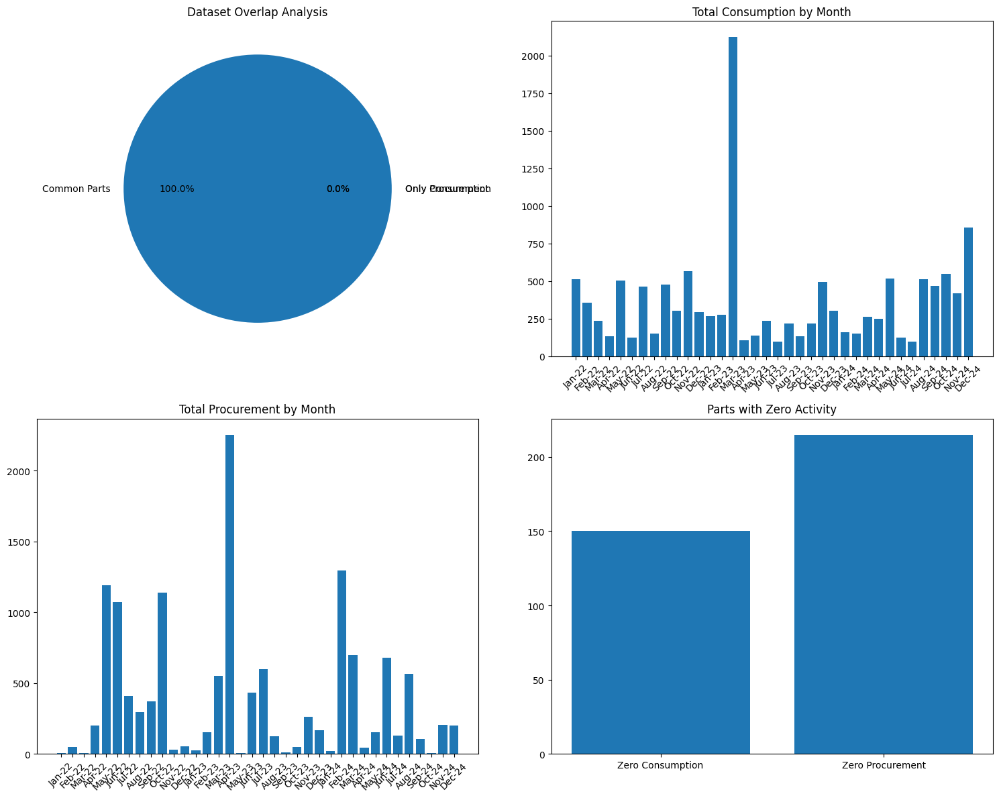

In [ ]:
# 3. Create visualizations
plot_data_quality_overview(consumption_df, procurement_df, quality_report)

### Questions

* Many Zero Consumption / Zero Procurement Parts

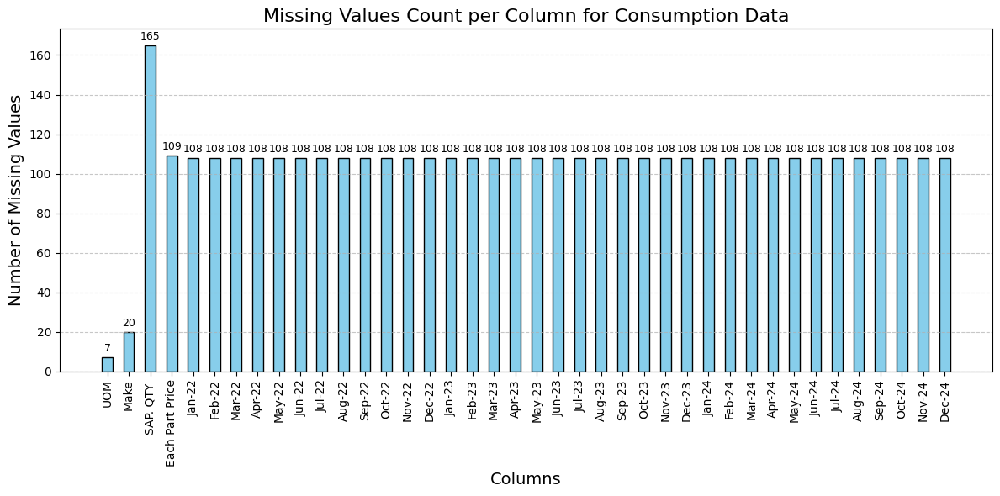

In [ ]:


# Calculate missing counts (only for columns with missing values)
missing_counts = consumption_df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0]

# Plot
fig, ax = plt.subplots(figsize=(12, 6))

# Create bar plot with wider spacing (by controlling bar width and x positions)
x_pos = np.arange(len(missing_counts))
bar_width = 0.5  # Reduce width to increase spacing between bars

bars = ax.bar(x_pos, missing_counts.values, width=bar_width, color='skyblue', edgecolor='black')

# X-axis settings
ax.set_xticks(x_pos)
ax.set_xticklabels(missing_counts.index, rotation=90, ha='center', fontsize=10)

# Labels and title
plt.title('Missing Values Count per Column for Consumption Data', fontsize=16)
plt.xlabel('Columns', fontsize=14)
plt.ylabel('Number of Missing Values', fontsize=14)

# Grid
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show counts on top of bars
for bar in bars:
    height = bar.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


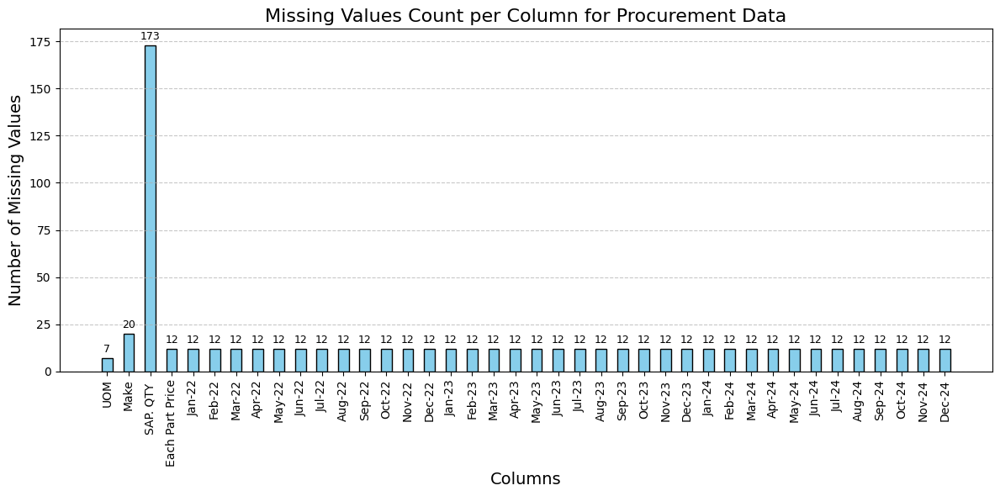

In [ ]:


# Calculate missing counts (only for columns with missing values)
missing_counts = procurement_df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0]

# Plot
fig, ax = plt.subplots(figsize=(12, 6))

# Create bar plot with wider spacing (by controlling bar width and x positions)
x_pos = np.arange(len(missing_counts))
bar_width = 0.5  # Reduce width to increase spacing between bars

bars = ax.bar(x_pos, missing_counts.values, width=bar_width, color='skyblue', edgecolor='black')

# X-axis settings
ax.set_xticks(x_pos)
ax.set_xticklabels(missing_counts.index, rotation=90, ha='center', fontsize=10)

# Labels and title
plt.title('Missing Values Count per Column for Procurement Data', fontsize=16)
plt.xlabel('Columns', fontsize=14)
plt.ylabel('Number of Missing Values', fontsize=14)

# Grid
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show counts on top of bars
for bar in bars:
    height = bar.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [ ]:
merged_df = pd.merge(consumption_df, procurement_df,
                    on=['PART CODE'],
                    suffixes=('_consumption', '_procurement'))

In [ ]:
time_cols = quality_report['time_cols_procurement']

In [ ]:
time_cols

['Jan-22',
 'Feb-22',
 'Mar-22',
 'Apr-22',
 'May-22',
 'Jun-22',
 'Jul-22',
 'Aug-22',
 'Sep-22',
 'Oct-22',
 'Nov-22',
 'Dec-22',
 'Jan-23',
 'Feb-23',
 'Mar-23',
 'Apr-23',
 'May-23',
 'Jun-23',
 'Jul-23',
 'Aug-23',
 'Sep-23',
 'Oct-23',
 'Nov-23',
 'Dec-23',
 'Jan-24',
 'Feb-24',
 'Mar-24',
 'Apr-24',
 'May-24',
 'Jun-24',
 'Jul-24',
 'Aug-24',
 'Sep-24',
 'Oct-24',
 'Nov-24',
 'Dec-24']

## Missing Value Handling in Month Columns

In [ ]:
consumption_df[time_cols]

,Jan-22,Feb-22,Mar-22,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,...,Mar-24,Apr-24,May-24,Jun-24,Jul-24,Aug-24,Sep-24,Oct-24,Nov-24,Dec-24
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
463,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
464,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,17.0,0.0,0.0,0.0


In [ ]:
consumption_df[time_cols] = consumption_df[time_cols].fillna(0)

In [ ]:
consumption_df[time_cols]

,Jan-22,Feb-22,Mar-22,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,...,Mar-24,Apr-24,May-24,Jun-24,Jul-24,Aug-24,Sep-24,Oct-24,Nov-24,Dec-24
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0
463,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
464,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,17.0,0.0,0.0,0.0


In [ ]:
procurement_df[time_cols] = procurement_df[time_cols].fillna(0)

In [ ]:
procurement_df[time_cols]

,Jan-22,Feb-22,Mar-22,Apr-22,May-22,Jun-22,Jul-22,Aug-22,Sep-22,Oct-22,...,Mar-24,Apr-24,May-24,Jun-24,Jul-24,Aug-24,Sep-24,Oct-24,Nov-24,Dec-24
0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
463,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
464,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,30.0,0.0,0.0,0.0,0.0
465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Data Preprocessing

## Renaming Consumption Columns

In [ ]:
consumption_df.rename(columns={
    'PART CODE': 'PartCode',
    'Category\nA/B/C': 'CategoryABC',
    'Mini. Stock' : 'MinStock',
    'Maxi. Stock' : 'MaxStock',
    'SAP. QTY ': 'SAPQty',
    'Common M/C Name': 'CommonMachineName',
    'Each Part Price': 'EachPartPrice'
}, inplace=True)

In [ ]:
consumption_df.columns

Index(['Sr. No.', 'Sr. No..1', 'PartCode', 'Description', 'UOM', 'Make',
       'CategoryABC', 'MinStock', 'MaxStock', 'SAPQty', 'CommonMachineName',
       'Line', 'Consumption', 'EachPartPrice', 'Jan-22', 'Feb-22', 'Mar-22',
       'Apr-22', 'May-22', 'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22',
       'Nov-22', 'Dec-22', 'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23',
       'Jun-23', 'Jul-23', 'Aug-23', 'Sep-23', 'Oct-23', 'Nov-23', 'Dec-23',
       'Jan-24', 'Feb-24', 'Mar-24', 'Apr-24', 'May-24', 'Jun-24', 'Jul-24',
       'Aug-24', 'Sep-24', 'Oct-24', 'Nov-24', 'Dec-24'],
      dtype='object')

## Reshaping Consumption Data

In [ ]:
consumption_long = pd.melt(consumption_df,
                          id_vars=['PartCode', 'Description', 'UOM', 'Make',
                                   'CategoryABC', 'MinStock', 'MaxStock', 'SAPQty', 'CommonMachineName',
                                   'Line', 'EachPartPrice'],
                          value_vars=time_cols,
                          var_name='MONTH',
                          value_name='CONSUMPTION')

In [ ]:
consumption_long.head()

,PartCode,Description,UOM,Make,CategoryABC,MinStock,MaxStock,SAPQty,CommonMachineName,Line,EachPartPrice,MONTH,CONSUMPTION
0,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,720242.28,Jan-22,0.0
1,CONCOM007551,Charging gun (IG-DAP/3S COUPLER/SUS),SET,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,414437.95,Jan-22,0.0
2,CONCOM010680,"Reff. Gun IG-OP/B2-368/R-32,R5 Line To-o",NO,TO-OU KOGYO,A,1,2,2.0,Refrigrent charging,R4,421269.65,Jan-22,0.0
3,CONCOM011218,Reff. Gun SIGS-DAP/B2-282/R-22 To-Ou koy,NO,TO-OU KOGYO,A,1,2,2.0,Refrigrent charging,R4,436775.23,Jan-22,0.0
4,CONCOM009595,Pierce Station punch holder plate R4X Fi,NO,YHM,A,1,2,1.0,Fin Die,R4X,NaN,Jan-22,0.0


## Renaming Procurement Columns

In [ ]:
procurement_df.columns

Index(['Sr. No.', 'Sr. No..1', 'PART CODE', 'Description', 'UOM', 'Make',
       'SAP. QTY ', 'Common M/C Name', 'Line', 'Total purchase qty.',
       'Each Part Price', 'Jan-22', 'Feb-22', 'Mar-22', 'Apr-22', 'May-22',
       'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
       'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23',
       'Aug-23', 'Sep-23', 'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24',
       'Mar-24', 'Apr-24', 'May-24', 'Jun-24', 'Jul-24', 'Aug-24', 'Sep-24',
       'Oct-24', 'Nov-24', 'Dec-24'],
      dtype='object')

In [ ]:
procurement_df.rename(columns={
    'PART CODE': 'PartCode',
    'SAP. QTY ': 'SAPQty',
    'Common M/C Name': 'CommonMachineName',
    'Total purchase qty.': 'TotalPurchaseQty',
    'Each Part Price': 'EachPartPrice'
}, inplace=True)

In [ ]:
procurement_df.columns

Index(['Sr. No.', 'Sr. No..1', 'PartCode', 'Description', 'UOM', 'Make',
       'SAPQty', 'CommonMachineName', 'Line', 'TotalPurchaseQty',
       'EachPartPrice', 'Jan-22', 'Feb-22', 'Mar-22', 'Apr-22', 'May-22',
       'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
       'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23',
       'Aug-23', 'Sep-23', 'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24',
       'Mar-24', 'Apr-24', 'May-24', 'Jun-24', 'Jul-24', 'Aug-24', 'Sep-24',
       'Oct-24', 'Nov-24', 'Dec-24'],
      dtype='object')

## Reshaping Procurement Columns

In [ ]:
procurement_long = pd.melt(procurement_df,
                          id_vars=['PartCode', 'Description', 'UOM', 'Make',
                                   'SAPQty', 'CommonMachineName', 'Line',
                                   'EachPartPrice'],
                          value_vars=time_cols,
                          var_name='MONTH',
                          value_name='PROCUREMENT')

##  Merging Consuption and Procurement

In [ ]:
final_long_df = pd.merge(consumption_long, procurement_long,
                   on=['PartCode', 'MONTH'],suffixes=('_consumption', '_procurement'))

In [ ]:
final_long_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16812 entries, 0 to 16811
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PartCode                       16812 non-null  object 
 1   Description_consumption        16812 non-null  object 
 2   UOM_consumption                16560 non-null  object 
 3   Make_consumption               16092 non-null  object 
 4   CategoryABC                    16812 non-null  object 
 5   MinStock                       16812 non-null  int64  
 6   MaxStock                       16812 non-null  int64  
 7   SAPQty_consumption             10872 non-null  float64
 8   CommonMachineName_consumption  16812 non-null  object 
 9   Line_consumption               16812 non-null  object 
 10  EachPartPrice_consumption      12888 non-null  float64
 11  MONTH                          16812 non-null  object 
 12  CONSUMPTION                    16812 non-null 

## Cumulative Metrics and Running Stocks

In [ ]:
## Convert Month to datetime
final_long_df['MONTH_YEAR'] = pd.to_datetime(final_long_df['MONTH'], format='%b-%y')

In [ ]:
# Calculate cumulative metrics
final_long_df['Cumulative_Consumption'] = final_long_df.groupby('PartCode')['CONSUMPTION'].cumsum()
final_long_df['Cumulative_Procurement'] = final_long_df.groupby('PartCode')['PROCUREMENT'].cumsum()

In [ ]:
# Calculate running inventory
final_long_df['Running_Stock'] = final_long_df['Cumulative_Procurement'] - final_long_df['Cumulative_Consumption']

In [ ]:
final_long_df['Lag1'] = final_long_df.groupby('PartCode')['CONSUMPTION'].shift(1)
final_long_df['Lag2'] = final_long_df.groupby('PartCode')['CONSUMPTION'].shift(2)
final_long_df['Lag3'] = final_long_df.groupby('PartCode')['CONSUMPTION'].shift(3)

# Non-zero lag features (previous non-zero demand values)
final_long_df['NonZeroLag1'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.replace(0, np.nan).shift(1))
)

final_long_df['NonZeroLag2'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.replace(0, np.nan).shift(2))
)

# Months since last non-zero demand
final_long_df['MonthsSinceLastDemand'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x[::-1].replace(0, np.nan).ffill().notna().cumsum()[::-1])
)

# Rolling metrics (last 3 periods including zeros)
final_long_df['RollingMean3'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.rolling(window=3, min_periods=1).mean())
)

final_long_df['RollingStd3'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.rolling(window=3, min_periods=1).std())
)

# Rolling metrics (last 6 periods including zeros)
final_long_df['RollingMean6'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.rolling(window=6, min_periods=1).mean())
)

final_long_df['RollingStd6'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.rolling(window=6, min_periods=1).std())
)
# Rolling window metrics (last 3 non-zero demands)
final_long_df['RollingNonZeroMean3'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.replace(0, np.nan).rolling(window=3, min_periods=1).mean())
)
final_long_df['RollingNonZeroStdDev3'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: x.replace(0, np.nan).rolling(window=3, min_periods=1).std())
)

# Rolling CV² over 3 periods: (rolling std / rolling mean) squared
final_long_df['RollingCV2_3'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: (
        (x.rolling(window=3, min_periods=1).std() /
         x.rolling(window=3, min_periods=1).mean().replace(0, np.nan)) ** 2
    ))
)

# Rolling ADI over 3 periods: average interval between non-zero demands
final_long_df['RollingADI3'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: (
        x[::-1].ne(0).cumsum()[::-1]
         .rolling(window=3, min_periods=1).mean()
    ))
)

# Expanding CV²: (expanding std / expanding mean) squared
final_long_df['ExpandingCV2'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(lambda x: (
        (x.expanding().std() / x.expanding().mean().replace(0, np.nan))**2
    ))
)

# Expanding ADI: average demand interval so far
final_long_df['ExpandingADI'] = (
    final_long_df.groupby('PartCode')['CONSUMPTION']
    .transform(
        lambda x: x[::-1].ne(0).cumsum()[::-1].expanding().mean()
    )
)


In [ ]:
final_long_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16812 entries, 0 to 16811
Data columns (total 42 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PartCode                       16812 non-null  object        
 1   Description_consumption        16812 non-null  object        
 2   UOM_consumption                16560 non-null  object        
 3   Make_consumption               16092 non-null  object        
 4   CategoryABC                    16812 non-null  object        
 5   MinStock                       16812 non-null  int64         
 6   MaxStock                       16812 non-null  int64         
 7   SAPQty_consumption             10872 non-null  float64       
 8   CommonMachineName_consumption  16812 non-null  object        
 9   Line_consumption               16812 non-null  object        
 10  EachPartPrice_consumption      12888 non-null  float64       
 11  MONTH          

In [ ]:
final_long_df[final_long_df['PartCode'] == 'CONCOM008774'].sort_values('MONTH_YEAR')

,PartCode,Description_consumption,UOM_consumption,Make_consumption,CategoryABC,MinStock,MaxStock,SAPQty_consumption,CommonMachineName_consumption,Line_consumption,...,Make_procurement,SAPQty_procurement,CommonMachineName_procurement,Line_procurement,EachPartPrice_procurement,PROCUREMENT,MONTH_YEAR,Cumulative_Consumption,Cumulative_Procurement,Running_Stock
0,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-01-01,0.0,0.0,0.0
467,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-02-01,0.0,0.0,0.0
934,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-03-01,0.0,0.0,0.0
1401,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-04-01,0.0,0.0,0.0
1868,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-05-01,0.0,0.0,0.0
2335,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,3.0,2022-06-01,0.0,3.0,3.0
2802,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-07-01,1.0,3.0,2.0
3269,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-08-01,1.0,3.0,2.0
3736,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-09-01,1.0,3.0,2.0
4203,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,0.0,2022-10-01,1.0,3.0,2.0


## Questions

* Negative Running Stock

# Feature Extraction for EDA

## Categorization of PART Descriptions

In [ ]:
!pip install bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 854.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 101.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

In [ ]:
from bertopic import BERTopic

# Step 1: Get unique descriptions
unique_desc = final_long_df['Description_consumption'].unique().tolist()

# Step 2: Fit BERTopic on unique descriptions
topic_model = BERTopic()
unique_topics, _ = topic_model.fit_transform(unique_desc)

# Step 3: Create mapping from description → topic
desc_to_topic = dict(zip(unique_desc, unique_topics))





modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,54,-1_r4_reff_hose_spring,"[r4, reff, hose, spring, sleeve, nozzle, cyl, ...","[SPROCKET R4 C/V, RS60-1B20TQ, TSUBAKI, Gun Ho..."
1,0,63,0_ultrasonic_new_old_pin,"[ultrasonic, new, old, pin, screw, kn, board, ...","[SCREW M5,92775A165 New Ultrasonic, Screw M3,9..."
2,1,52,1_vacuum_schmalz_suction_lif,"[vacuum, schmalz, suction, lif, for, lifter, l...","[Vacuum hose 10.07.09.00020 For Vacuum li, Vac..."
3,2,46,2_coupler_auto_nitto_for,"[coupler, auto, nitto, for, part, no, oring, n...","[O-Ring Part-36 for Auto coupler, NITTO, O-Rin..."
4,3,33,3_lcg350nm33n_union_hnbr_lmn350wg,"[lcg350nm33n, union, hnbr, lmn350wg, oring, sl...","[Socket Nose O-Ring (6) LMN-350-W-G, LCG-350NM..."
5,4,32,4_joinpack_r4f4_join_reel,"[joinpack, r4f4, join, reel, pack, flap, r4, l...","[Reel Out Circular S23-430003 Join Pack F, Ree..."
6,5,29,5_bearing_roller_yhm_feeding,"[bearing, roller, yhm, feeding, r4x, hpb, lm, ...",[Feeding Roller YKC-36A.1A-35#17442 YHM R4X Fi...
7,6,28,6_finpress_fin_r4x_oil,"[finpress, fin, r4x, oil, press, seal, hairpin...","[Oil Seal 60x85x8 NBR R4X Hairpin Bender, Spri..."
8,7,24,7_gun_charging_reff_ring,"[gun, charging, reff, ring, set, packing, ref,...","[O Ring P-3/CR Reff. Charging Gun, O Ring P-5/..."
9,8,21,8_brazing_auto_r4x_burner,"[brazing, auto, r4x, burner, mixer, flame, ven...","[Burner Tip-S1043BR Auto Brazing R4X, Burner T..."


In [ ]:
# Step 4: Apply back to full DataFrame
final_long_df['partCategory'] = final_long_df['Description_consumption'].map(desc_to_topic)

In [ ]:
topic_model.get_topic(15)

False

In [ ]:
topic_name_map = {
    -1: "Others",
    0 : "Ultrasonic System Spare Parts",
    1 : "Vacuum Handling Components",
    2 : "Pneumatic Couplers and related parts",
    3 : "O-Rings, Unions, and Assembly Fittings",
    4 : "Strapping and Banding Machine Spares",
    5 : "Bearings, Rollers, and Feeding Mechanism Parts",
    6 : "Fin Press Machine Parts and Accessories",
    7 : "Charging Gun Packing Sets and Accessories",
    8 : "Brazing Burners and Flame System Components",
    9 : "Temperature Sensors and Controllers",
    10 : "Control Valves and Solenoid Assemblies",
    11 : "Industrial Belts and Conveyor Systems",
    12 : "Punch and Die Tooling Components",
    13 : "Booster Pumps, Pistons, and Fittings"
}

In [ ]:
final_long_df['partCategory'] = final_long_df['partCategory'].map(topic_name_map)

## **Data Save Checkpoint-1**



In [6]:
processed_path1 = '/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged.pkl'
processed_path2 = '/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged_filtered_45.pkl'

In [ ]:
joblib.dump(final_long_df,processed_path )

['/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged.pkl']

In [ ]:
joblib.dump(df_filtered,processed_path2 )

['/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged_filtered_45.pkl']

In [7]:
final_long_df = joblib.load(processed_path1)

In [ ]:
df_filtered = joblib.load(processed_path2)

In [ ]:
df_filtered.to_csv("/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged_filtered_45.csv", index=False)

In [8]:
final_long_df.columns

Index(['PartCode', 'Description_consumption', 'UOM_consumption',
       'Make_consumption', 'CategoryABC', 'MinStock', 'MaxStock',
       'SAPQty_consumption', 'CommonMachineName_consumption',
       'Line_consumption', 'EachPartPrice_consumption', 'MONTH', 'CONSUMPTION',
       'Description_procurement', 'UOM_procurement', 'Make_procurement',
       'SAPQty_procurement', 'CommonMachineName_procurement',
       'Line_procurement', 'EachPartPrice_procurement', 'PROCUREMENT',
       'MONTH_YEAR', 'Cumulative_Consumption', 'Cumulative_Procurement',
       'Running_Stock', 'partCategory'],
      dtype='object')

In [ ]:
final_long_df_transposed = final_long_df.T

In [ ]:
final_long_df_transposed[0]

,0
PartCode,CONCOM008774
Description_consumption,Charging Gun IGX-0P/B2-388 Ref. M/C
UOM_consumption,NO
Make_consumption,TO-OU KOGYO
CategoryABC,A
MinStock,1
MaxStock,2
SAPQty_consumption,3.0
CommonMachineName_consumption,Refrigrent charging
Line_consumption,R4


In [ ]:
final_long_df.head()

,PartCode,Description_consumption,UOM_consumption,Make_consumption,CategoryABC,MinStock,MaxStock,SAPQty_consumption,CommonMachineName_consumption,Line_consumption,...,SAPQty_procurement,CommonMachineName_procurement,Line_procurement,EachPartPrice_procurement,PROCUREMENT,MONTH_YEAR,Cumulative_Consumption,Cumulative_Procurement,Running_Stock,partCategory
0,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,3.0,Refrigrent charging,R4,546000.0,0.0,2022-01-01,0.0,0.0,0.0,Charging Gun Packing Sets and Accessories
1,CONCOM007551,Charging gun (IG-DAP/3S COUPLER/SUS),SET,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,3.0,Refrigrent charging,R4,336000.0,0.0,2022-01-01,0.0,0.0,0.0,Charging Gun Packing Sets and Accessories
2,CONCOM010680,"Reff. Gun IG-OP/B2-368/R-32,R5 Line To-o",NO,TO-OU KOGYO,A,1,2,2.0,Refrigrent charging,R4,...,2.0,Refrigrent charging,R4,336000.0,0.0,2022-01-01,0.0,0.0,0.0,Charging Gun Packing Sets and Accessories
3,CONCOM011218,Reff. Gun SIGS-DAP/B2-282/R-22 To-Ou koy,NO,TO-OU KOGYO,A,1,2,2.0,Refrigrent charging,R4,...,2.0,Refrigrent charging,R4,0.0,0.0,2022-01-01,0.0,0.0,0.0,Charging Gun Packing Sets and Accessories
4,CONCOM009595,Pierce Station punch holder plate R4X Fi,NO,YHM,A,1,2,1.0,Fin Die,R4X,...,1.0,Fin Die,R4X,3000.0,0.0,2022-01-01,0.0,0.0,0.0,Punch and Die Tooling Components


# EDA

## Basic Stats

In [ ]:
final_long_df['CategoryABC'].value_counts().sort_index()

,count
CategoryABC,
A,2664
B,3276
C,10872


In [ ]:
make_category_counts = final_long_df.groupby('Make_consumption')['CategoryABC'].nunique()
exclusive_makes = make_category_counts[make_category_counts == 1].index
result = final_long_df[final_long_df['Make_consumption'].isin(exclusive_makes)].groupby('Make_consumption')['CategoryABC'].first()
result

,CategoryABC
Make_consumption,
1,C
AUTO BRAZING,C
Airtac,C
BANDO,C
COMMON,C
DEE,C
DIAMOND,C
EN-24,C
EZO,C


In [ ]:
def create_individual_stats_plots(df):
    """
    Create individual plots for basic spare parts statistics
    """

    # Set style
    plt.style.use('default')
    sns.set_palette("husl")

    # Get unique parts data to avoid counting duplicates across months
    unique_parts = df.drop_duplicates(subset=['PartCode'])

    print("="*80)
    print("SPARE PARTS BASIC STATISTICS")
    print("="*80)

    # 1. TOTAL NUMBER OF PARTS
    total_parts = df['PartCode'].nunique()
    print(f"\n1. Total No. of Parts: {total_parts:,}")

    plt.figure(figsize=(8, 6))
    plt.bar(['Total Parts'], [total_parts], color='steelblue', alpha=0.8)
    plt.title('Total Number of Unique Parts', fontsize=14, fontweight='bold')
    plt.ylabel('Count')

    # Add data label
    plt.text(0, total_parts + total_parts*0.02, str(total_parts),
             ha='center', va='bottom', fontweight='bold', fontsize=12)

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 2. NUMBER OF PARTS IN EACH CATEGORY ABC
    category_counts = unique_parts['CategoryABC'].value_counts().sort_index()
    print(f"\n2. No. of Parts in each CategoryABC:")
    for cat, count in category_counts.items():
        print(f"   Category {cat}: {count:,} parts")

    plt.figure(figsize=(8, 6))
    colors = ['red', 'orange', 'green']
    bars = plt.bar(category_counts.index, category_counts.values,
                   color=colors[:len(category_counts)], alpha=0.8)
    plt.title('Number of Parts by ABC Category', fontsize=14, fontweight='bold')
    plt.xlabel('Category')
    plt.ylabel('Count')

    # Add data labels
    for bar, value in zip(bars, category_counts.values):
        plt.text(bar.get_x() + bar.get_width()/2, value + value*0.02,
                str(value), ha='center', va='bottom', fontweight='bold')

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 3. NUMBER OF PARTS IN EACH MAKE
    make_counts = unique_parts['Make_consumption'].value_counts().head(15)  # Top 15
    print(f"\n3. No. of Parts in each Make (Top 15):")
    for make, count in make_counts.items():
        print(f"   {str(make)[:30]}...: {count:,} parts")

    plt.figure(figsize=(12, 8))
    bars = plt.barh(range(len(make_counts)), make_counts.values, color='skyblue', alpha=0.8)
    plt.yticks(range(len(make_counts)),
               [str(make)[:25] + '...' if len(str(make)) > 25 else str(make)
                for make in make_counts.index])
    plt.title('Number of Parts by Make (Top 15)', fontsize=14, fontweight='bold')
    plt.xlabel('Count')

    # Add data labels
    for i, (bar, value) in enumerate(zip(bars, make_counts.values)):
        plt.text(value + value*0.02, bar.get_y() + bar.get_height()/2,
                str(value), ha='left', va='center', fontweight='bold')

    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.gca().invert_yaxis()
    plt.show()

    # 4. NUMBER OF CATEGORY A,B,C PARTS IN EACH MAKE
    make_category = unique_parts.groupby(['Make_consumption', 'CategoryABC']).size().unstack(fill_value=0)
    top_makes = unique_parts['Make_consumption'].value_counts().head(15).index
    make_category_top = make_category.loc[top_makes]

    print(f"\n4. No. of Category A,B,C parts in each Make (Top 10):")
    for make in top_makes:
        if make in make_category.index:
            cats = make_category.loc[make]
            print(f"   {str(make)[:30]}...: A={cats.get('A',0)}, B={cats.get('B',0)}, C={cats.get('C',0)}")

    plt.figure(figsize=(14, 8))
    make_category_top.plot(kind='bar', stacked=True, color=['red', 'orange', 'green'], alpha=0.8)
    plt.title('Category Distribution by Make (Top 15)', fontsize=14, fontweight='bold')
    plt.xlabel('Make')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Category', labels=['Category A', 'Category B', 'Category C'])
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 4.1. NUMBER OF CATEGORY A,B,C PARTS IN EACH MAKE
    category_counts = unique_parts.groupby(['CategoryABC'])['Make_consumption'].nunique()
    print(f"\n2. No. of Parts in each CategoryABC:")
    for cat, count in category_counts.items():
        print(f"   Category {cat}: {count:,} Makes")

    plt.figure(figsize=(8, 6))
    colors = ['red', 'orange', 'green']
    bars = plt.bar(category_counts.index, category_counts.values,
                   color=colors[:len(category_counts)], alpha=0.8)
    plt.title('Number of Unique Makes by ABC Category', fontsize=14, fontweight='bold')
    plt.xlabel('Category')
    plt.ylabel('Count')

    # Add data labels
    for bar, value in zip(bars, category_counts.values):
        plt.text(bar.get_x() + bar.get_width()/2, value + value*0.02,
                str(value), ha='center', va='bottom', fontweight='bold')

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 5. NUMBER OF PARTS IN EACH COMMON MACHINE NAME
    machine_counts = unique_parts['CommonMachineName_consumption'].value_counts()
    print(f"\n5. No. of Parts in each Common Machine Name:")
    for machine, count in machine_counts.items():
        print(f"   {str(machine)[:40]}...: {count:,} parts")

    plt.figure(figsize=(12, 8))
    bars = plt.barh(range(len(machine_counts)), machine_counts.values, color='lightgreen', alpha=0.8)
    plt.yticks(range(len(machine_counts)),
               [str(machine)[:30] + '...' if len(str(machine)) > 30 else str(machine)
                for machine in machine_counts.index])
    plt.title('Number of Parts by Common Machine Name', fontsize=14, fontweight='bold')
    plt.xlabel('Count')

    # Add data labels
    for i, (bar, value) in enumerate(zip(bars, machine_counts.values)):
        plt.text(value + value*0.02, bar.get_y() + bar.get_height()/2,
                str(value), ha='left', va='center', fontweight='bold')

    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 6. NUMBER OF CATEGORY A,B,C IN EACH COMMON MACHINE NAME
    machine_category = unique_parts.groupby(['CommonMachineName_consumption', 'CategoryABC']).size().unstack(fill_value=0)

    print(f"\n6. No. of Category A,B,C in each Common Machine Name:")
    for machine in machine_counts.index:
        if machine in machine_category.index:
            cats = machine_category.loc[machine]
            print(f"   {str(machine)[:40]}...: A={cats.get('A',0)}, B={cats.get('B',0)}, C={cats.get('C',0)}")

    plt.figure(figsize=(14, 8))
    machine_category.plot(kind='bar', stacked=True, color=['red', 'orange', 'green'], alpha=0.8)
    plt.title('Category Distribution by Common Machine Name', fontsize=14, fontweight='bold')
    plt.xlabel('Common Machine Name')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Category', labels=['Category A', 'Category B', 'Category C'])
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 6.1. NUMBER OF MACHINES USING CAT A B C PARTS
    category_counts = unique_parts.groupby(['CategoryABC'])['CommonMachineName_consumption'].nunique()
    print(f"\n6.1 No. of Parts in each CategoryABC:")
    for cat, count in category_counts.items():
        print(f"   Category {cat}: {count:,} Machines")

    plt.figure(figsize=(8, 6))
    colors = ['red', 'orange', 'green']
    bars = plt.bar(category_counts.index, category_counts.values,
                   color=colors[:len(category_counts)], alpha=0.8)
    plt.title('Number of Machines by ABC Category', fontsize=14, fontweight='bold')
    plt.xlabel('Category')
    plt.ylabel('Count')

    # Add data labels
    for bar, value in zip(bars, category_counts.values):
        plt.text(bar.get_x() + bar.get_width()/2, value + value*0.02,
                str(value), ha='center', va='bottom', fontweight='bold')

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 6.2. NUMBER OF MAKES BY EACH MACHINE CATEGORY
    category_counts = unique_parts.groupby(['CommonMachineName_consumption'])['Make_consumption'].nunique()
    print(f"\n6.2. No. of Makes utilized by each Machine Type:")
    for cat, count in category_counts.items():
        print(f"   Machine {cat}: {count:,} Makes")

    colors = sns.color_palette("husl", len(category_counts.index))
    plt.figure(figsize=(8, 6))
    #colors = ['red', 'orange', 'green']
    bars = plt.bar(category_counts.index, category_counts.values,
                   color=colors, alpha=0.8)
    plt.title('Number of Makes utilized by each Machine Type', fontsize=14, fontweight='bold')
    plt.xlabel('Machines')
    plt.ylabel('Count')
    plt.xticks(rotation=90, ha='right')
    # Add data labels
    for bar, value in zip(bars, category_counts.values):
        plt.text(bar.get_x() + bar.get_width()/2, value + value*0.02,
                str(value), ha='center', va='bottom', fontweight='bold')

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 7. NUMBER OF ITEMS OF EACH MAKE IN EACH COMMON MACHINE NAME
    machine_make = unique_parts.groupby(['CommonMachineName_consumption', 'Make_consumption']).size().unstack(fill_value=0)

    print(f"\n7. No. of items of each Make in each Common Machine Name:")
    print("   (Showing non-zero combinations only)")

    # Show top combinations
    machine_make_melted = machine_make.reset_index().melt(id_vars='CommonMachineName_consumption')
    machine_make_melted = machine_make_melted[machine_make_melted['value'] > 0].sort_values('value', ascending=False)

    for _, row in machine_make_melted.head(20).iterrows():
        machine = str(row['CommonMachineName_consumption'])[:25]
        make = str(row['Make_consumption'])[:25]
        count = row['value']
        print(f"   {machine}... + {make}...: {count} parts")

    # Plot top 5 machines with their make distribution
    top_machines = unique_parts['CommonMachineName_consumption'].value_counts().head(5).index
    machine_make_top = machine_make.loc[top_machines]

    plt.figure(figsize=(16, 10))
    machine_make_top.plot(kind='bar', stacked=True, alpha=0.8)
    plt.title('Make Distribution by Common Machine Name (Top 5 Machines)', fontsize=14, fontweight='bold')
    plt.xlabel('Common Machine Name')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Make', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 8. NUMBER OF MACHINE NAMES FOR EACH LINE
    line_machines = unique_parts.groupby('Line_consumption')['CommonMachineName_consumption'].nunique().sort_values(ascending=False)
    print(f"\n8. No. of Machine Names for each Line:")
    for line, count in line_machines.items():
        print(f"   Line {line}: {count} different machines")

    plt.figure(figsize=(10, 6))
    bars = plt.bar(line_machines.index, line_machines.values, color='coral', alpha=0.8)
    plt.title('Number of Different Machines by Production Line', fontsize=14, fontweight='bold')
    plt.xlabel('Production Line')
    plt.ylabel('Number of Different Machines')

    # Add data labels
    for bar, value in zip(bars, line_machines.values):
        plt.text(bar.get_x() + bar.get_width()/2, value + value*0.02,
                str(value), ha='center', va='bottom', fontweight='bold')

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 9. NUMBER OF CATEGORY A,B,C IN EACH LINE
    line_category = unique_parts.groupby(['Line_consumption', 'CategoryABC']).size().unstack(fill_value=0)
    print(f"\n9. No. of Category A,B,C in each Line:")
    for line in line_machines.index:
        if line in line_category.index:
            cats = line_category.loc[line]
            print(f"   Line {line}: A={cats.get('A',0)}, B={cats.get('B',0)}, C={cats.get('C',0)}")

    plt.figure(figsize=(12, 6))
    line_category.plot(kind='bar', color=['red', 'orange', 'green'], alpha=0.8)
    plt.title('Category Distribution by Production Line', fontsize=14, fontweight='bold')
    plt.xlabel('Production Line')
    plt.ylabel('Count')
    plt.legend(title='Category', labels=['Category A', 'Category B', 'Category C'])
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 10. NUMBER OF ITEMS OF EACH MAKE IN EACH LINE
    line_make = unique_parts.groupby(['Line_consumption', 'Make_consumption']).size().unstack(fill_value=0)

    print(f"\n10. No. of items of each Make in each Line:")
    line_make_melted = line_make.reset_index().melt(id_vars='Line_consumption')
    line_make_melted = line_make_melted[line_make_melted['value'] > 0].sort_values('value', ascending=False)

    for _, row in line_make_melted.head(15).iterrows():
        line = row['Line_consumption']
        make = str(row['Make_consumption'])[:30]
        count = row['value']
        print(f"   Line {line} + {make}...: {count} parts")

    plt.figure(figsize=(16, 8))
    line_make.plot(kind='bar', stacked=True, alpha=0.8)
    plt.title('Make Distribution by Production Line', fontsize=14, fontweight='bold')
    plt.xlabel('Production Line')
    plt.ylabel('Count')
    plt.legend(title='Make', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 11.
    part_cat_counts = unique_parts['partCategory'].value_counts()  # Top 15
    print(f"\n3. No. of Parts in each part category:")
    for cat, count in part_cat_counts.items():
        print(f"   {str(cat)[:30]}...: {count:,} parts")

    plt.figure(figsize=(12, 8))
    bars = plt.barh(range(len(part_cat_counts)), part_cat_counts.values, color='skyblue', alpha=0.8)
    plt.yticks(range(len(part_cat_counts)),
               [str(cat)[:25] + '...' if len(str(cat)) > 25 else str(cat)
                for cat in part_cat_counts.index])
    plt.title('Number of Parts by Part Category', fontsize=14, fontweight='bold')
    plt.xlabel('Count')

    # Add data labels
    for i, (bar, value) in enumerate(zip(bars, part_cat_counts.values)):
        plt.text(value + value*0.02, bar.get_y() + bar.get_height()/2,
                str(value), ha='left', va='center', fontweight='bold')

    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 12.

    machine_make = unique_parts.groupby(['CommonMachineName_consumption', 'partCategory']).size().unstack(fill_value=0)

    print(f"\n7. No. of items of each partCategory in each Common Machine Name:")
    print("   (Showing non-zero combinations only)")

    # Show top combinations
    machine_make_melted = machine_make.reset_index().melt(id_vars='CommonMachineName_consumption')
    machine_make_melted = machine_make_melted[machine_make_melted['value'] > 0].sort_values('value', ascending=False)

    for _, row in machine_make_melted.head(20).iterrows():
        machine = str(row['CommonMachineName_consumption'])[:25]
        make = str(row['partCategory'])[:25]
        count = row['value']
        print(f"   {machine}... + {make}...: {count} parts")


    # Plot top 10 machines with their part category distribution
    top_machines = unique_parts['CommonMachineName_consumption'].value_counts().head(10).index
    machine_make_top = machine_make.loc[top_machines]

    n_categories = len(machine_make_top.columns)
    colors = sns.color_palette("husl", n_categories)

    plt.figure(figsize=(25, 10))
    machine_make_top.plot(kind='bar', stacked=True, alpha=0.8,color=colors)
    plt.title('PartCategory Distribution by Common Machine Name (Top 10 Machines)', fontsize=14, fontweight='bold')
    plt.xlabel('Common Machine Name')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='PartCategory', bbox_to_anchor=(1.05, 1), loc='upper left',
              ncol=2,fontsize=8, title_fontsize=10)  # Reduced font sizes
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 13.
    machine_make = unique_parts.groupby(['Make_consumption', 'partCategory']).size().unstack(fill_value=0)

    print(f"\n7. No. of items of each partCategory in each Make:")
    print("   (Showing non-zero combinations only)")

    # Show top combinations
    machine_make_melted = machine_make.reset_index().melt(id_vars='Make_consumption')
    machine_make_melted = machine_make_melted[machine_make_melted['value'] > 0].sort_values('value', ascending=False)

    for _, row in machine_make_melted.head(20).iterrows():
        machine = str(row['Make_consumption'])[:25]
        make = str(row['partCategory'])[:25]
        count = row['value']
        print(f"   {machine}... + {make}...: {count} parts")


    # Plot top 10 machines with their part category distribution
    top_machines = unique_parts['Make_consumption'].value_counts().head(5).index
    machine_make_top = machine_make.loc[top_machines]

    n_categories = len(machine_make_top.columns)
    colors = sns.color_palette("husl", n_categories)

    plt.figure(figsize=(25, 10))
    machine_make_top.plot(kind='bar', stacked=True, alpha=0.8,color=colors)
    plt.title('PartCategory Distribution by Make', fontsize=14, fontweight='bold')
    plt.xlabel('Make')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='PartCategory', bbox_to_anchor=(1.05, 1), loc='upper left',
              ncol=2,fontsize=8, title_fontsize=10)  # Reduced font sizes
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

        # 14.
    machine_make = unique_parts.groupby(['CategoryABC', 'partCategory']).size().unstack(fill_value=0)

    print(f"\n7. No. of items of each partCategory in each CategoryABC:")
    print("   (Showing non-zero combinations only)")

    # Show top combinations
    machine_make_melted = machine_make.reset_index().melt(id_vars='CategoryABC')
    machine_make_melted = machine_make_melted[machine_make_melted['value'] > 0].sort_values('value', ascending=False)

    for _, row in machine_make_melted.head(20).iterrows():
        machine = str(row['CategoryABC'])[:25]
        make = str(row['partCategory'])[:25]
        count = row['value']
        print(f"   {machine}... + {make}...: {count} parts")


    # Plot top 10 machines with their part category distribution
    top_machines = unique_parts['CategoryABC'].value_counts().index
    machine_make_top = machine_make.loc[top_machines]

    n_categories = len(machine_make_top.columns)
    colors = sns.color_palette("husl", n_categories)

    plt.figure(figsize=(25, 10))
    machine_make_top.plot(kind='bar', stacked=True, alpha=0.8,color=colors)
    plt.title('PartCategory Distribution by Common CategoryABC', fontsize=14, fontweight='bold')
    plt.xlabel('Category ABC')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='PartCategory', bbox_to_anchor=(1.05, 1), loc='upper left',
              ncol=2,fontsize=8, title_fontsize=10)  # Reduced font sizes
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


    print("\n" + "="*80)
    print("BASIC STATISTICS ANALYSIS COMPLETE")
    print("="*80)

In [ ]:
final_long_df['partCategory'].value_counts()

,count
partCategory,
Ultrasonic System Spare Parts,2268
Others,1944
Vacuum Handling Components,1872
Pneumatic Couplers and related parts,1692
"O-Rings, Unions, and Assembly Fittings",1188
Strapping and Banding Machine Spares,1152
"Bearings, Rollers, and Feeding Mechanism Parts",1044
Fin Press Machine Parts and Accessories,1008
Charging Gun Packing Sets and Accessories,864


SPARE PARTS BASIC STATISTICS

1. Total No. of Parts: 467


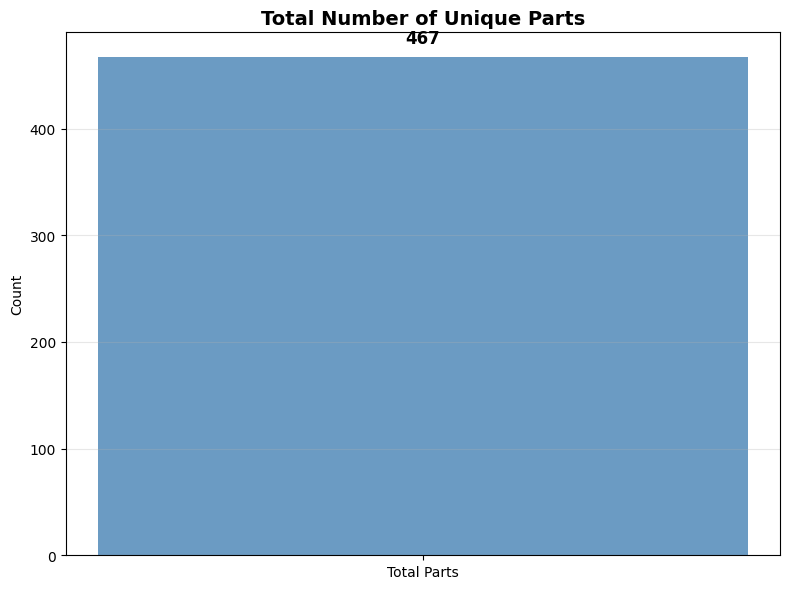


2. No. of Parts in each CategoryABC:
   Category A: 74 parts
   Category B: 91 parts
   Category C: 302 parts


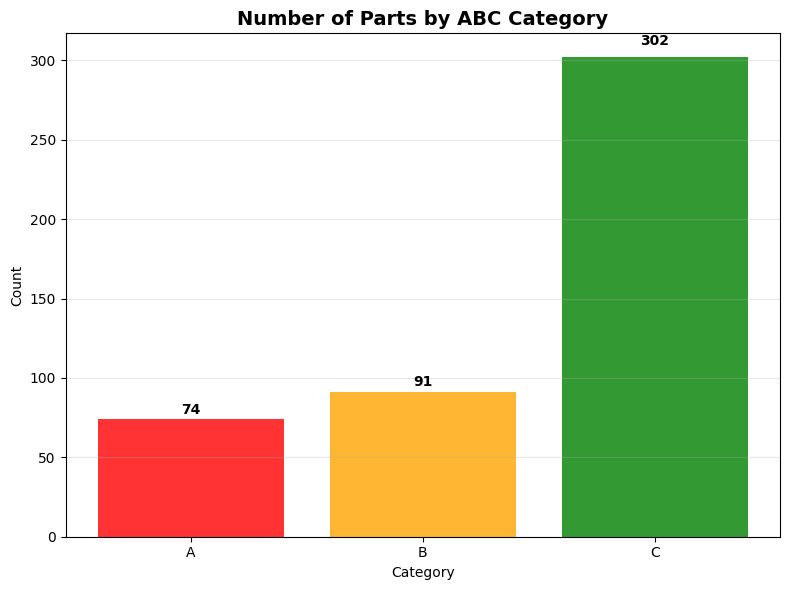


3. No. of Parts in each Make (Top 15):
   Tech-Sonic...: 66 parts
   TO-OU KOGYO...: 63 parts
   SCHMALZ...: 55 parts
   NITTO KOHKI...: 44 parts
   New Machine...: 34 parts
   YHM...: 30 parts
   Join Pack...: 21 parts
   Joinpack...: 17 parts
   OAK...: 13 parts
   SMC...: 10 parts
   OMRON...: 6 parts
   SKF...: 5 parts
   AUTO  BRAZING...: 4 parts
   Local...: 4 parts
   Schmalz...: 4 parts


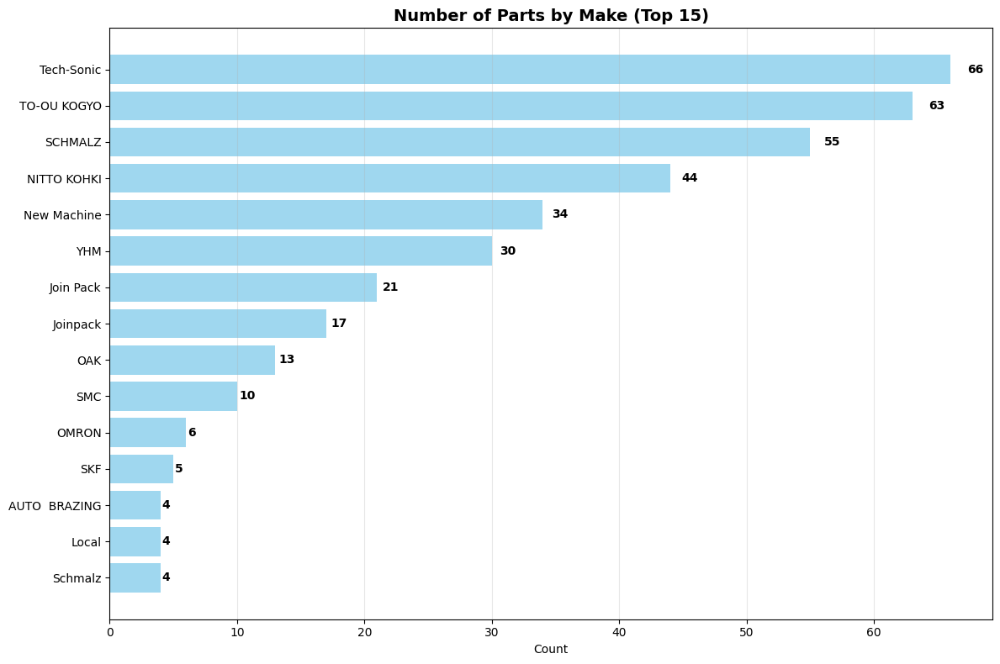


4. No. of Category A,B,C parts in each Make (Top 10):
   Tech-Sonic...: A=17, B=7, C=42
   TO-OU KOGYO...: A=17, B=18, C=28
   SCHMALZ...: A=9, B=9, C=37
   NITTO KOHKI...: A=1, B=10, C=33
   New Machine...: A=2, B=0, C=32
   YHM...: A=5, B=11, C=14
   Join Pack...: A=2, B=5, C=14
   Joinpack...: A=1, B=0, C=16
   OAK...: A=5, B=2, C=6
   SMC...: A=0, B=4, C=6
   OMRON...: A=2, B=1, C=3
   SKF...: A=0, B=1, C=4
   AUTO  BRAZING...: A=0, B=0, C=4
   Local...: A=0, B=1, C=3
   Schmalz...: A=1, B=2, C=1


<Figure size 1400x800 with 0 Axes>

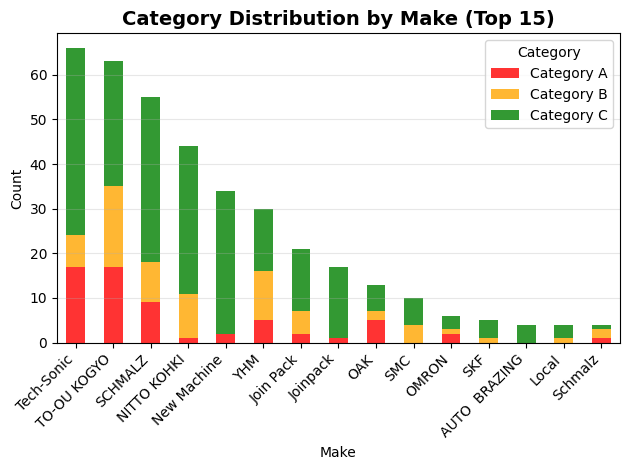


2. No. of Parts in each CategoryABC:
   Category A: 20 Makes
   Category B: 24 Makes
   Category C: 52 Makes


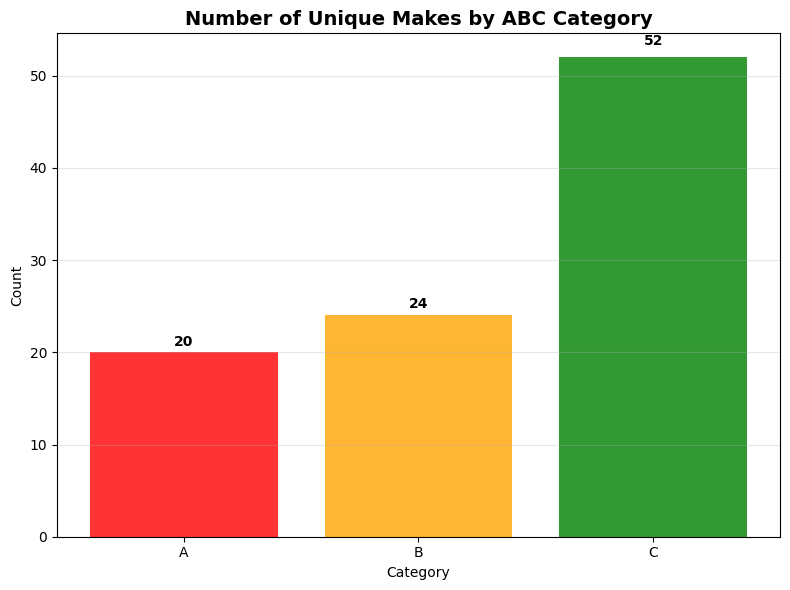


5. No. of Parts in each Common Machine Name:
   Ultrasonic Tube Sealing M/C...: 72 parts
   Vaccum Lifter...: 59 parts
   Auto Brazing...: 47 parts
   Refrigrent charging...: 46 parts
   Running Test...: 44 parts
   Packing M/C...: 38 parts
   Pressurizing...: 34 parts
   Fin Press...: 24 parts
   Booster pump...: 20 parts
   Fin Die...: 19 parts
   Hair pin Bender Dia-7...: 19 parts
   Dry Oven...: 17 parts
   Conveyor...: 15 parts
   Coil Bending Machine...: 5 parts
   Horizontal Expander Dia...: 4 parts
   Vacuuming...: 1 parts
   HVIR...: 1 parts
   Air Tight Test...: 1 parts
   Tapping machine...: 1 parts


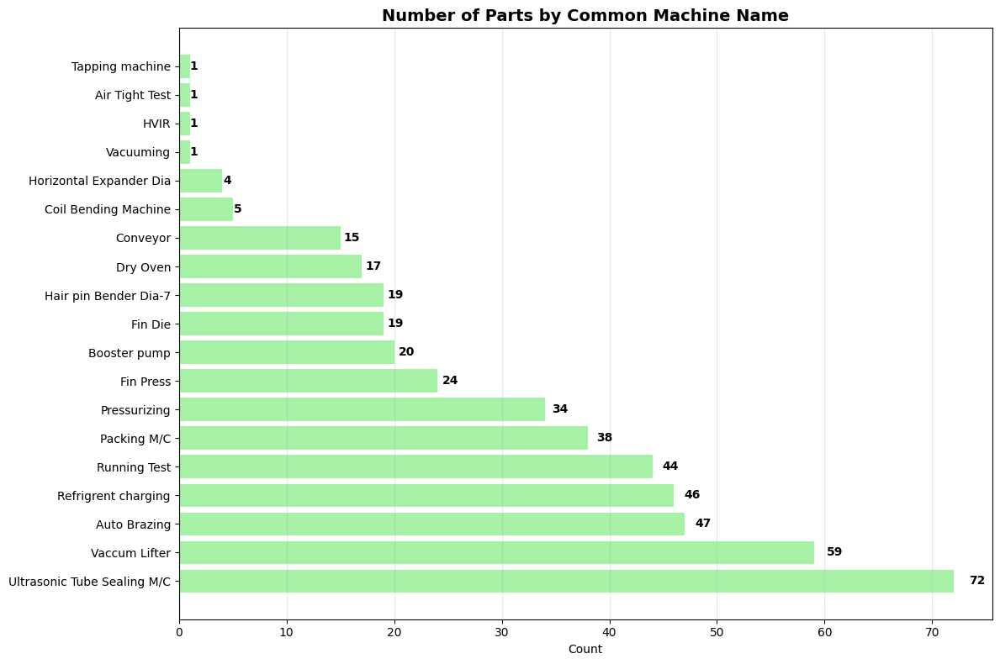


6. No. of Category A,B,C in each Common Machine Name:
   Ultrasonic Tube Sealing M/C...: A=19, B=10, C=43
   Vaccum Lifter...: A=10, B=11, C=38
   Auto Brazing...: A=8, B=10, C=29
   Refrigrent charging...: A=9, B=13, C=24
   Running Test...: A=1, B=10, C=33
   Packing M/C...: A=3, B=5, C=30
   Pressurizing...: A=2, B=0, C=32
   Fin Press...: A=5, B=8, C=11
   Booster pump...: A=8, B=6, C=6
   Fin Die...: A=4, B=10, C=5
   Hair pin Bender Dia-7...: A=1, B=2, C=16
   Dry Oven...: A=0, B=1, C=16
   Conveyor...: A=3, B=3, C=9
   Coil Bending Machine...: A=0, B=0, C=5
   Horizontal Expander Dia...: A=0, B=1, C=3
   Vacuuming...: A=1, B=0, C=0
   HVIR...: A=0, B=1, C=0
   Air Tight Test...: A=0, B=0, C=1
   Tapping machine...: A=0, B=0, C=1


<Figure size 1400x800 with 0 Axes>

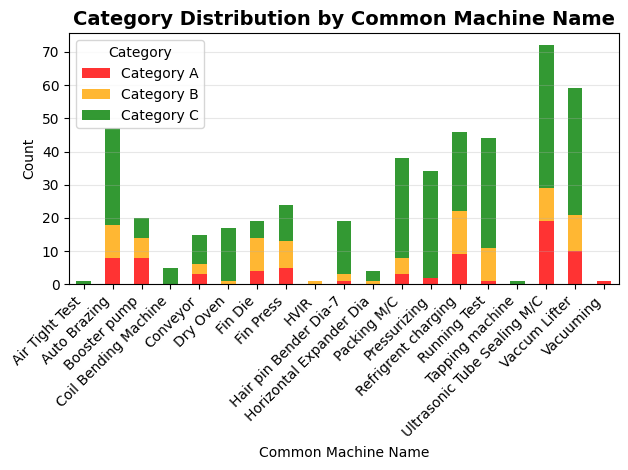


6.1 No. of Parts in each CategoryABC:
   Category A: 13 Machines
   Category B: 14 Machines
   Category C: 17 Machines


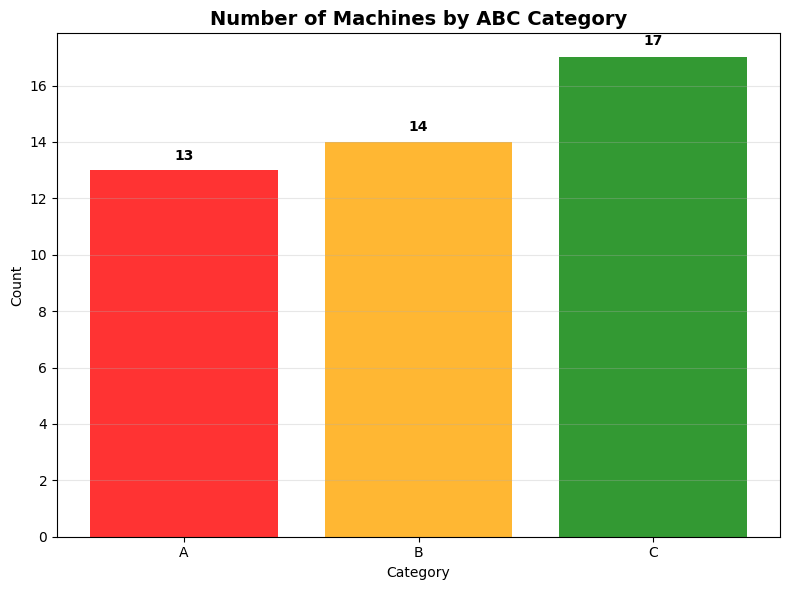


6.2. No. of Makes utilized by each Machine Type:
   Machine Air Tight Test: 1 Makes
   Machine Auto Brazing: 23 Makes
   Machine Booster pump: 3 Makes
   Machine Coil Bending Machine: 4 Makes
   Machine Conveyor: 10 Makes
   Machine Dry Oven: 7 Makes
   Machine Fin Die: 4 Makes
   Machine Fin Press: 6 Makes
   Machine HVIR: 0 Makes
   Machine Hair pin Bender Dia-7: 9 Makes
   Machine Horizontal Expander Dia: 3 Makes
   Machine Packing M/C: 2 Makes
   Machine Pressurizing: 1 Makes
   Machine Refrigrent charging: 1 Makes
   Machine Running Test: 1 Makes
   Machine Tapping machine: 1 Makes
   Machine Ultrasonic Tube Sealing M/C: 4 Makes
   Machine Vaccum Lifter: 2 Makes
   Machine Vacuuming: 1 Makes


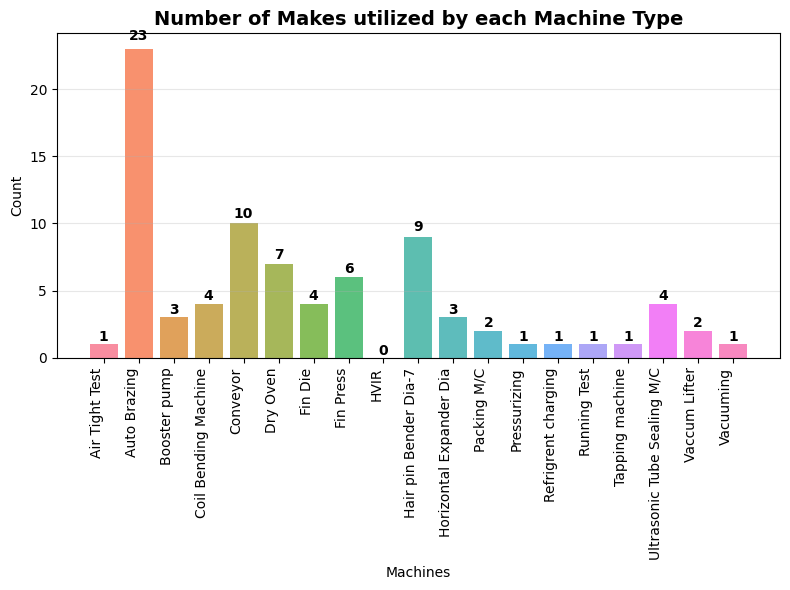


7. No. of items of each Make in each Common Machine Name:
   (Showing non-zero combinations only)
   Ultrasonic Tube Sealing M... + Tech-Sonic...: 66 parts
   Vaccum Lifter... + SCHMALZ...: 55 parts
   Refrigrent charging... + TO-OU KOGYO...: 46 parts
   Running Test... + NITTO KOHKI...: 44 parts
   Pressurizing... + New Machine...: 34 parts
   Packing M/C... + Join Pack...: 21 parts
   Packing M/C... + Joinpack...: 17 parts
   Booster pump... + TO-OU KOGYO...: 17 parts
   Fin Press... + YHM...: 16 parts
   Auto Brazing... + OAK...: 13 parts
   Hair pin Bender Dia-7... + YHM...: 8 parts
   Fin Die... + YHM...: 6 parts
   Dry Oven... + OMRON...: 4 parts
   Dry Oven... + SMC...: 4 parts
   Vaccum Lifter... + Schmalz...: 4 parts
   Fin Die... + F4X DIE...: 4 parts
   Auto Brazing... + AUTO  BRAZING...: 4 parts
   Fin Die... + R4X DIE...: 3 parts
   Dry Oven... + BANDO...: 3 parts
   Ultrasonic Tube Sealing M... + SMC...: 3 parts


/tmp/ipython-input-87-3278259584.py:244: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 1600x1000 with 0 Axes>

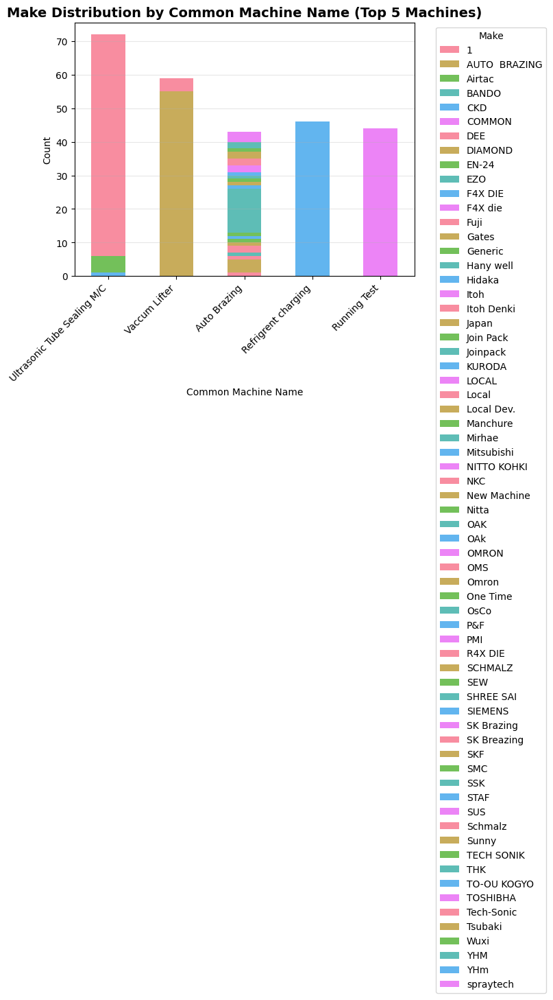


8. No. of Machine Names for each Line:
   Line R4: 13 different machines
   Line R4X: 6 different machines


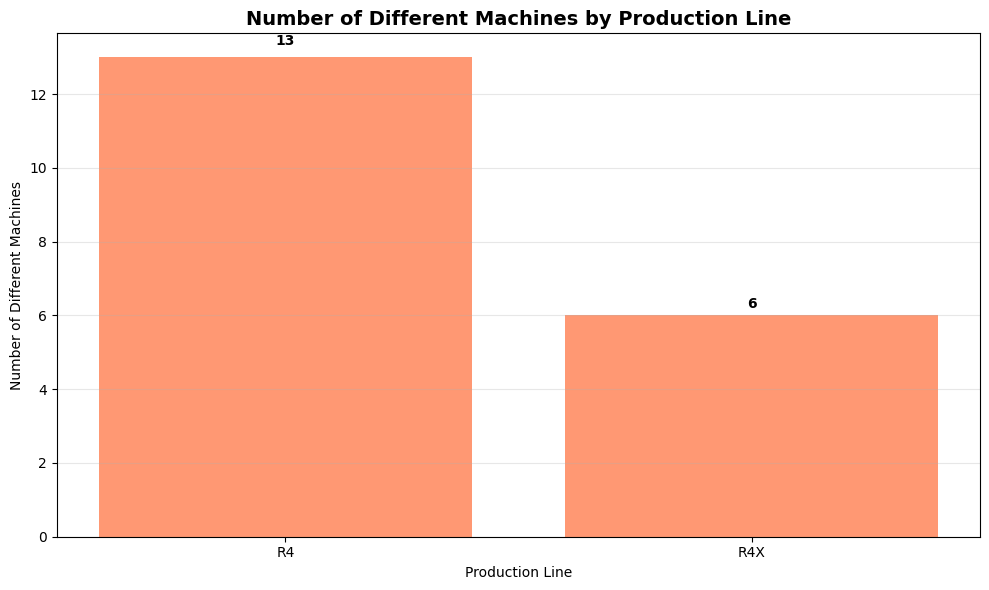


9. No. of Category A,B,C in each Line:
   Line R4: A=56, B=59, C=222
   Line R4X: A=18, B=32, C=80


<Figure size 1200x600 with 0 Axes>

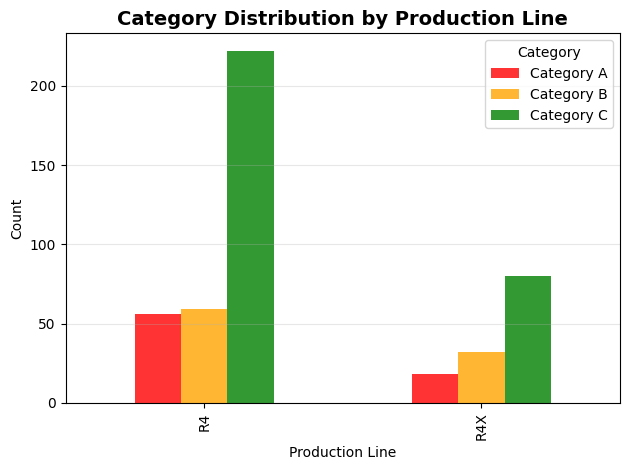


10. No. of items of each Make in each Line:
   Line R4 + Tech-Sonic...: 66 parts
   Line R4 + TO-OU KOGYO...: 63 parts
   Line R4 + SCHMALZ...: 55 parts
   Line R4 + NITTO KOHKI...: 44 parts
   Line R4 + New Machine...: 34 parts
   Line R4X + YHM...: 30 parts
   Line R4 + Join Pack...: 21 parts
   Line R4 + Joinpack...: 17 parts
   Line R4X + OAK...: 13 parts
   Line R4X + SMC...: 6 parts
   Line R4 + Schmalz...: 4 parts
   Line R4 + SMC...: 4 parts
   Line R4X + F4X DIE...: 4 parts
   Line R4X + OMRON...: 4 parts
   Line R4X + AUTO  BRAZING...: 4 parts


/tmp/ipython-input-87-3278259584.py:306: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 1600x800 with 0 Axes>

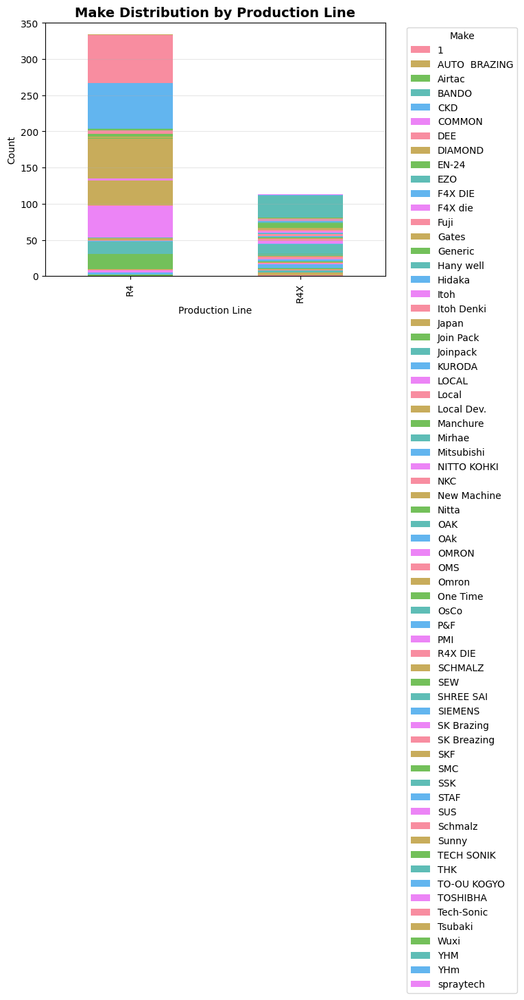


3. No. of Parts in each part category:
   Ultrasonic System Spare Parts...: 63 parts
   Others...: 54 parts
   Vacuum Handling Components...: 52 parts
   Pneumatic Couplers and related...: 47 parts
   O-Rings, Unions, and Assembly ...: 33 parts
   Strapping and Banding Machine ...: 32 parts
   Bearings, Rollers, and Feeding...: 29 parts
   Fin Press Machine Parts and Ac...: 28 parts
   Charging Gun Packing Sets and ...: 24 parts
   Brazing Burners and Flame Syst...: 21 parts
   Temperature Sensors and Contro...: 21 parts
   Control Valves and Solenoid As...: 20 parts
   Industrial Belts and Conveyor ...: 16 parts
   Punch and Die Tooling Componen...: 15 parts
   Booster Pumps, Pistons, and Fi...: 12 parts


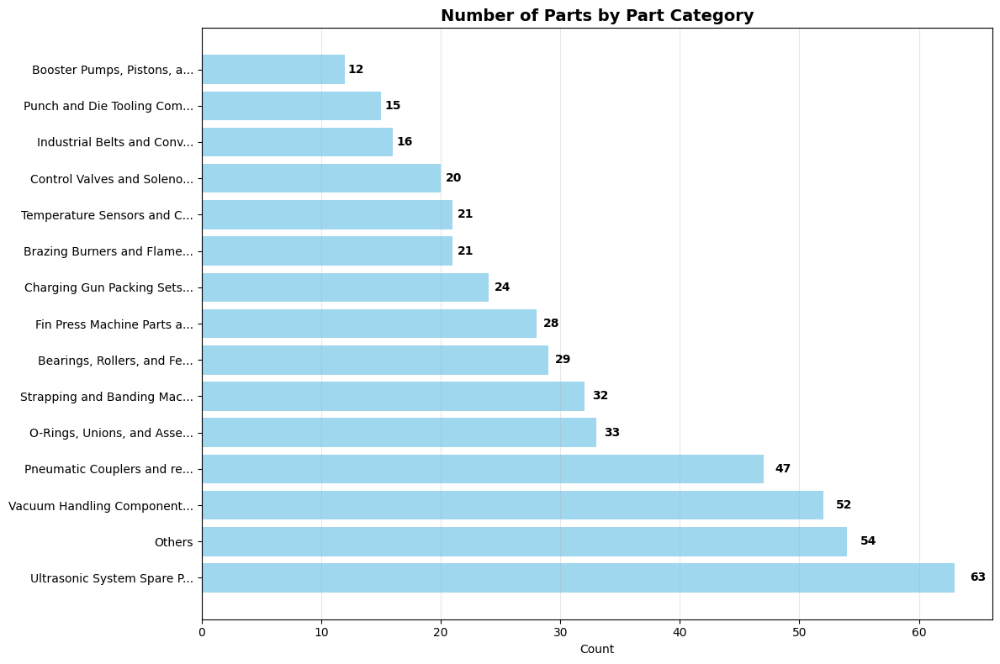


7. No. of items of each partCategory in each Common Machine Name:
   (Showing non-zero combinations only)
   Ultrasonic Tube Sealing M... + Ultrasonic System Spare P...: 63 parts
   Vaccum Lifter... + Vacuum Handling Component...: 50 parts
   Running Test... + Pneumatic Couplers and re...: 44 parts
   Packing M/C... + Strapping and Banding Mac...: 32 parts
   Pressurizing... + O-Rings, Unions, and Asse...: 28 parts
   Refrigrent charging... + Charging Gun Packing Sets...: 23 parts
   Auto Brazing... + Brazing Burners and Flame...: 21 parts
   Dry Oven... + Temperature Sensors and C...: 12 parts
   Fin Press... + Fin Press Machine Parts a...: 11 parts
   Refrigrent charging... + Others...: 11 parts
   Fin Die... + Punch and Die Tooling Com...: 11 parts
   Booster pump... + Booster Pumps, Pistons, a...: 11 parts
   Refrigrent charging... + Control Valves and Soleno...: 9 parts
   Hair pin Bender Dia-7... + Bearings, Rollers, and Fe...: 9 parts
   Auto Brazing... + Others...: 9 parts
   

/tmp/ipython-input-87-3278259584.py:366: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 2500x1000 with 0 Axes>

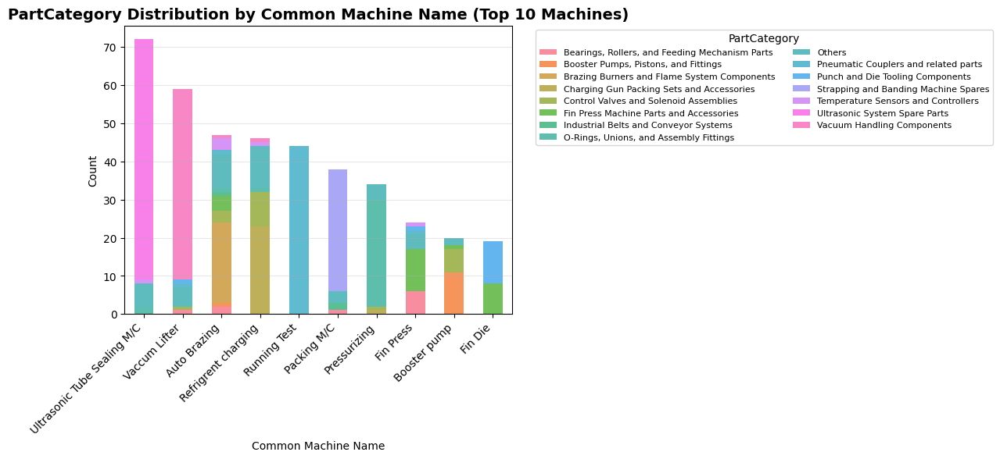


7. No. of items of each partCategory in each Make:
   (Showing non-zero combinations only)
   Tech-Sonic... + Ultrasonic System Spare P...: 60 parts
   SCHMALZ... + Vacuum Handling Component...: 47 parts
   NITTO KOHKI... + Pneumatic Couplers and re...: 44 parts
   New Machine... + O-Rings, Unions, and Asse...: 28 parts
   TO-OU KOGYO... + Charging Gun Packing Sets...: 23 parts
   Joinpack... + Strapping and Banding Mac...: 17 parts
   Join Pack... + Strapping and Banding Mac...: 15 parts
   TO-OU KOGYO... + Control Valves and Soleno...: 14 parts
   TO-OU KOGYO... + Others...: 13 parts
   YHM... + Fin Press Machine Parts a...: 10 parts
   TO-OU KOGYO... + Booster Pumps, Pistons, a...: 9 parts
   YHM... + Bearings, Rollers, and Fe...: 9 parts
   SMC... + Temperature Sensors and C...: 7 parts
   OAK... + Brazing Burners and Flame...: 6 parts
   Tech-Sonic... + Others...: 6 parts
   OMRON... + Temperature Sensors and C...: 5 parts
   SCHMALZ... + Others...: 5 parts
   F4X DIE... + Punch 

/tmp/ipython-input-87-3278259584.py:402: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 2500x1000 with 0 Axes>

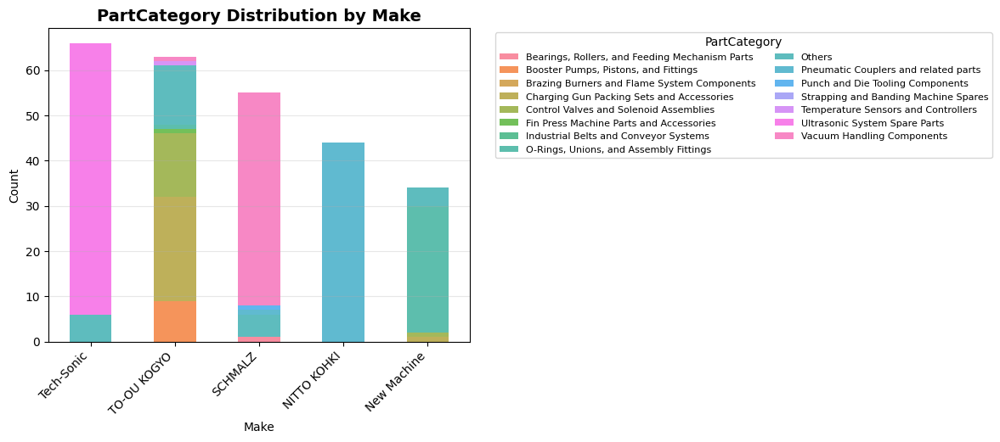


7. No. of items of each partCategory in each CategoryABC:
   (Showing non-zero combinations only)
   C... + Ultrasonic System Spare P...: 38 parts
   C... + Pneumatic Couplers and re...: 36 parts
   C... + Others...: 33 parts
   C... + Vacuum Handling Component...: 31 parts
   C... + O-Rings, Unions, and Asse...: 28 parts
   C... + Strapping and Banding Mac...: 26 parts
   C... + Bearings, Rollers, and Fe...: 23 parts
   A... + Ultrasonic System Spare P...: 18 parts
   C... + Temperature Sensors and C...: 17 parts
   C... + Industrial Belts and Conv...: 14 parts
   C... + Fin Press Machine Parts a...: 12 parts
   C... + Charging Gun Packing Sets...: 12 parts
   B... + Others...: 12 parts
   B... + Vacuum Handling Component...: 11 parts
   B... + Fin Press Machine Parts a...: 11 parts
   C... + Brazing Burners and Flame...: 10 parts
   B... + Pneumatic Couplers and re...: 10 parts
   A... + Vacuum Handling Component...: 10 parts
   A... + Others...: 9 parts
   C... + Punch and Die Tool

/tmp/ipython-input-87-3278259584.py:438: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 2500x1000 with 0 Axes>

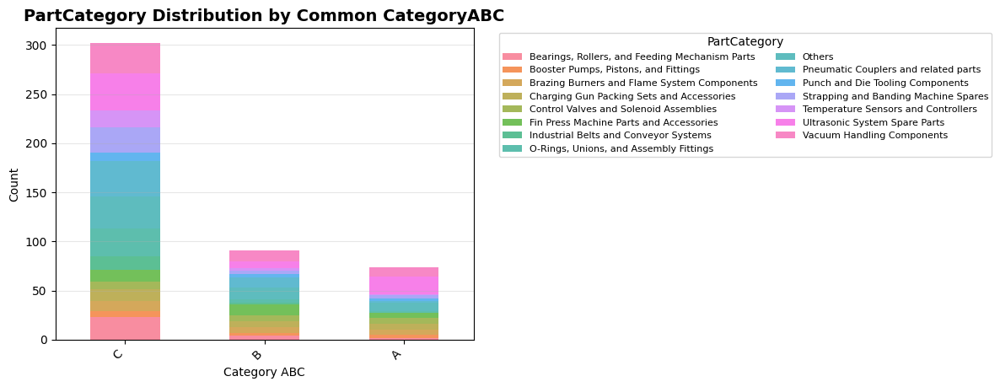


BASIC STATISTICS ANALYSIS COMPLETE


In [ ]:
create_individual_stats_plots(final_long_df)

In [ ]:
final_long_df['MONTH_YEAR']

,MONTH_YEAR
0,2022-01-01
1,2022-01-01
2,2022-01-01
3,2022-01-01
4,2022-01-01
...,...
16807,2024-12-01
16808,2024-12-01
16809,2024-12-01
16810,2024-12-01


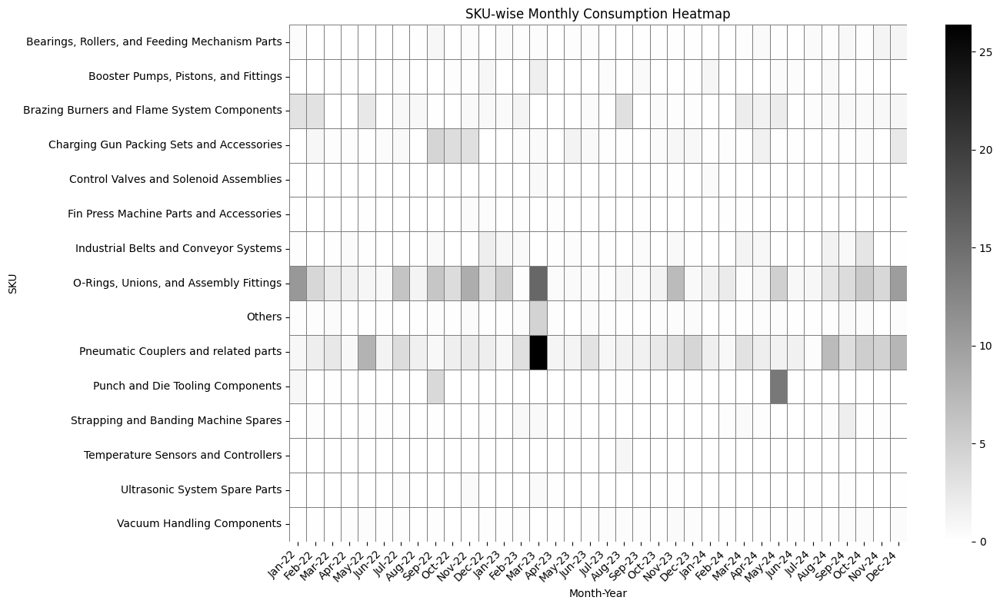

In [ ]:
pivot = final_long_df.pivot_table(index='partCategory', columns='MONTH_YEAR', values='CONSUMPTION', fill_value=0)
mask = pivot == 0
pivot.columns = pivot.columns.strftime('%b-%y')
plt.figure(figsize=(14, 8))

# Color map: Using 'YlGnBu' with adjustment OR you can use 'Blues' or custom diverging
# To sharply distinguish zeros, using a color map that starts light for zero
cmap = sns.light_palette("blue", as_cmap=True)

#sns.heatmap(pivot, cmap=cmap, linewidths=0.5, linecolor='gray')
sns.heatmap(pivot, cmap='binary', linewidths=0.5, linecolor='gray')

plt.title('SKU-wise Monthly Consumption Heatmap')
plt.xlabel('Month-Year')
plt.ylabel('SKU')

plt.xticks(rotation=45, ha='right')  # Tilt x-axis labels for readability
plt.tight_layout()
plt.show()

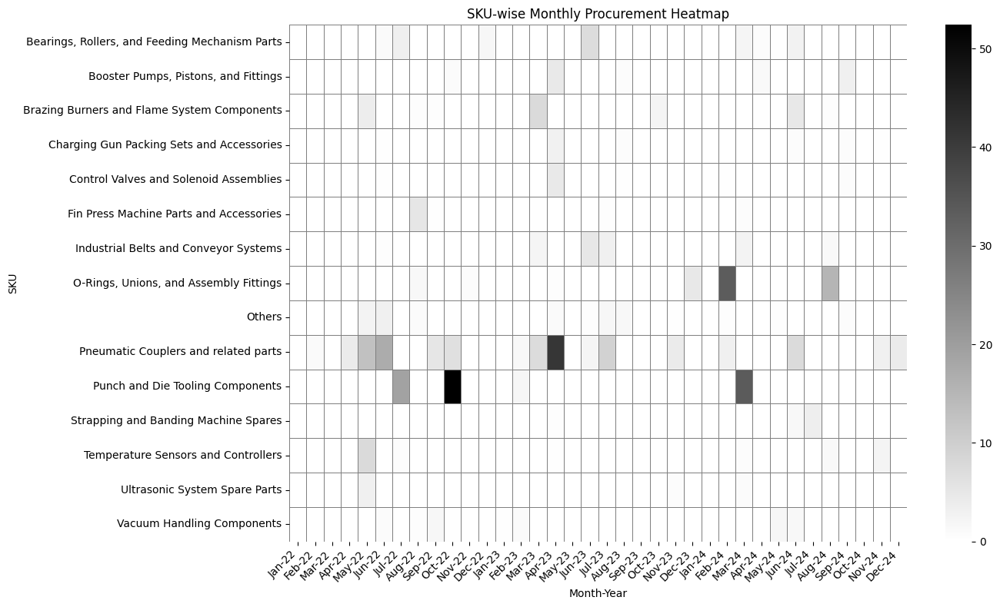

In [ ]:
pivot = final_long_df.pivot_table(index='partCategory', columns='MONTH_YEAR', values='PROCUREMENT', fill_value=0)
mask = pivot == 0
pivot.columns = pivot.columns.strftime('%b-%y')
plt.figure(figsize=(14, 8))

# Color map: Using 'YlGnBu' with adjustment OR you can use 'Blues' or custom diverging
# To sharply distinguish zeros, using a color map that starts light for zero
cmap = sns.light_palette("blue", as_cmap=True)

#sns.heatmap(pivot, cmap=cmap, linewidths=0.5, linecolor='gray')
sns.heatmap(pivot, cmap='binary', linewidths=0.5, linecolor='gray')

plt.title('SKU-wise Monthly Procurement Heatmap')
plt.xlabel('Month-Year')
plt.ylabel('SKU')

plt.xticks(rotation=45, ha='right')  # Tilt x-axis labels for readability
plt.tight_layout()
plt.show()

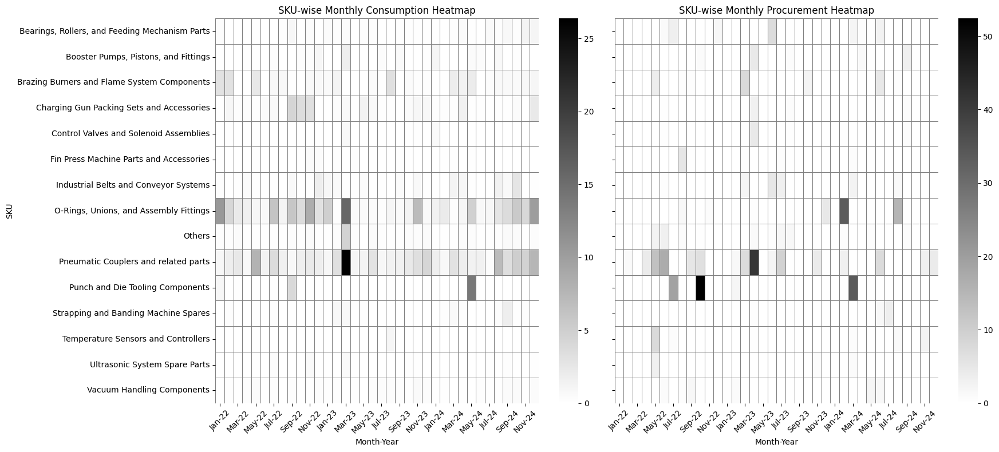

In [ ]:
# --- First Pivot: Consumption ---
pivot_consumption = final_long_df.pivot_table(
    index='partCategory',
    columns='MONTH_YEAR',
    values='CONSUMPTION',
    fill_value=0
)
pivot_consumption.columns = pivot_consumption.columns.strftime('%b-%y')

# --- Second Pivot: Procurement ---
pivot_procurement = final_long_df.pivot_table(
    index='partCategory',
    columns='MONTH_YEAR',
    values='PROCUREMENT',
    fill_value=0
)
pivot_procurement.columns = pivot_procurement.columns.strftime('%b-%y')

# --- Plot side by side subplots ---
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)

cmap = sns.light_palette("blue", as_cmap=True)

# --- First Plot: Consumption Heatmap ---
sns.heatmap(pivot_consumption, cmap='binary', linewidths=0.5, linecolor='gray', ax=axes[0])
axes[0].set_title('SKU-wise Monthly Consumption Heatmap')
axes[0].set_xlabel('Month-Year')
axes[0].set_ylabel('SKU')
axes[0].tick_params(axis='x', rotation=45)

# --- Second Plot: Procurement Heatmap ---
sns.heatmap(pivot_procurement, cmap='binary', linewidths=0.5, linecolor='gray', ax=axes[1])
axes[1].set_title('SKU-wise Monthly Procurement Heatmap')
axes[1].set_xlabel('Month-Year')
axes[1].set_ylabel('')  # Remove duplicate y-label for right plot
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


## SKU Classification

In [9]:


def classify_sku_demand_r0(df, sku_col='SKU', period_col='Month', demand_col='Consumption'):
    """
    Classifies SKUs based on demand intermittency using ADI and CV².

    Parameters:
    df (pd.DataFrame): Input DataFrame with SKU, Month, and Consumption columns
    sku_col (str): Column name for SKU identifier
    period_col (str): Column name for time periods (must be datetime type)
    demand_col (str): Column name for demand values

    Returns:
    pd.DataFrame: DataFrame with SKU, ADI, CV², and Demand Classification
    """

    results = []
    all_skus = df[sku_col].unique()

    for sku in all_skus:
        sku_df = df[df[sku_col] == sku].sort_values(period_col)
        demand_series = sku_df[demand_col].values

        # Total periods observed for this SKU
        total_periods = len(demand_series)

        # Number of non-zero demand periods
        non_zero_periods = np.count_nonzero(demand_series)

        # Handle SKUs with no demand at all
        if non_zero_periods == 0:
            adi = np.nan
            cv2 = np.nan
            classification = 'No Demand'
        else:
            # ADI (Average Demand Interval)
            adi = total_periods / non_zero_periods

            # CV² (Coefficient of Variation squared)
            non_zero_demand = demand_series[demand_series > 0]
            mean_demand = np.mean(non_zero_demand)
            std_demand = np.std(non_zero_demand, ddof=1)  # sample std deviation

            if mean_demand == 0:
                cv2 = np.nan
            else:
                cv2 = (std_demand / mean_demand) ** 2

            # Classification Rules
            if adi < 1.32 and cv2 < 0.49:
                classification = 'Smooth'
            elif adi >= 1.32 and cv2 < 0.49:
                classification = 'Intermittent'
            elif adi < 1.32 and cv2 >= 0.49:
                classification = 'Erratic'
            else:
                classification = 'Lumpy'

        results.append({
            'SKU': sku,
            'ADI': round(adi, 2) if not pd.isna(adi) else adi,
            'CV2': round(cv2, 2) if not pd.isna(cv2) else cv2,
            'Classification': classification
        })

    result_df = pd.DataFrame(results)
    return result_df.sort_values('Classification')



In [18]:

def classify_sku_demand(df, sku_col='SKU', period_col='Month', demand_col='Consumption'):
    """
    Classifies SKUs based on demand intermittency using ADI and CV²,
    and calculates additional demand statistics.

    Parameters:
    df (pd.DataFrame): Input DataFrame with SKU, Month, and Consumption columns
    sku_col (str): Column name for SKU identifier
    period_col (str): Column name for time periods (must be datetime type)
    demand_col (str): Column name for demand values

    Returns:
    pd.DataFrame: DataFrame with SKU, ADI, CV², Demand Classification,
                  and additional demand metrics
    """

    results = []
    all_skus = df[sku_col].unique()

    for sku in all_skus:
        sku_df = df[df[sku_col] == sku].sort_values(period_col)
        demand_series = sku_df[demand_col].values
        category = sku_df['CategoryABC'].iloc[0]
        total_periods = len(demand_series)
        total_demand = np.sum(demand_series)
        zero_demand_periods = np.count_nonzero(demand_series == 0)
        non_zero_periods = total_periods - zero_demand_periods

        zero_demand_proportion = zero_demand_periods / total_periods if total_periods > 0 else np.nan

        if non_zero_periods == 0:
            adi = np.nan
            cv2 = np.nan
            classification = 'No Demand'
            max_non_zero = np.nan
            min_non_zero = np.nan
            mean_non_zero = np.nan
            std_non_zero = np.nan
        else:
            # Non-zero demand stats
            non_zero_demand = demand_series[demand_series > 0]
            max_non_zero = np.max(non_zero_demand)
            min_non_zero = np.min(non_zero_demand)
            mean_non_zero = np.mean(non_zero_demand)
            std_non_zero = np.std(non_zero_demand, ddof=1)  # sample std deviation

            # ADI (Average Demand Interval)
            adi = total_periods / non_zero_periods

            # CV² (Coefficient of Variation squared)
            cv2 = (std_non_zero / mean_non_zero) ** 2 if mean_non_zero != 0 else np.nan

            # Classification Rules
            if adi < 1.32 and cv2 < 0.49:
                classification = 'Smooth'
            elif adi >= 1.32 and cv2 < 0.49:
                classification = 'Intermittent'
            elif adi < 1.32 and cv2 >= 0.49:
                classification = 'Erratic'
            else:
                classification = 'Lumpy'

        results.append({
            'SKU': sku,
            'CategoryABC':category,
            'ADI': round(adi, 2) if not pd.isna(adi) else adi,
            'CV2': round(cv2, 2) if not pd.isna(cv2) else cv2,
            'Classification': classification,
            'MaxNonZeroDemand': max_non_zero,
            'MinNonZeroDemand': min_non_zero,
            'TotalDemand': total_demand,
            'ZeroDemandProportion': round(zero_demand_proportion, 2),
            'NonZeroDemandMean': round(mean_non_zero, 2) if not pd.isna(mean_non_zero) else mean_non_zero,
            'NonZeroDemandStd': round(std_non_zero, 2) if not pd.isna(std_non_zero) else std_non_zero
        })

    result_df = pd.DataFrame(results)
    return result_df.sort_values('Classification')


In [19]:
sku_classification_df = classify_sku_demand(final_long_df,sku_col = 'PartCode', period_col = 'MONTH_YEAR',demand_col = 'CONSUMPTION' )


/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:210: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [17]:
final_long_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16812 entries, 0 to 16811
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PartCode                       16812 non-null  object        
 1   Description_consumption        16812 non-null  object        
 2   UOM_consumption                16560 non-null  object        
 3   Make_consumption               16092 non-null  object        
 4   CategoryABC                    16812 non-null  object        
 5   MinStock                       16812 non-null  int64         
 6   MaxStock                       16812 non-null  int64         
 7   SAPQty_consumption             10872 non-null  float64       
 8   CommonMachineName_consumption  16812 non-null  object        
 9   Line_consumption               16812 non-null  object        
 10  EachPartPrice_consumption      12888 non-null  float64       
 11  MONTH          

In [ ]:
final_long_df[final_long_df['PartCode']=='CONCOM008971']['CONSUMPTION']

,CONSUMPTION
348,0.0
815,0.0
1282,0.0
1749,0.0
2216,0.0
2683,0.0
3150,0.0
3617,0.0
4084,0.0
4551,0.0


In [20]:
sku_classification_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 467 entries, 269 to 241
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   SKU                   467 non-null    object 
 1   CategoryABC           467 non-null    object 
 2   ADI                   317 non-null    float64
 3   CV2                   224 non-null    float64
 4   Classification        467 non-null    object 
 5   MaxNonZeroDemand      317 non-null    float64
 6   MinNonZeroDemand      317 non-null    float64
 7   TotalDemand           467 non-null    float64
 8   ZeroDemandProportion  467 non-null    float64
 9   NonZeroDemandMean     317 non-null    float64
 10  NonZeroDemandStd      224 non-null    float64
dtypes: float64(8), object(3)
memory usage: 43.8+ KB


In [14]:
sku_classification_df['Classification'].value_counts()

,count
Classification,
Lumpy,181
No Demand,150
Intermittent,134
Erratic,1
Smooth,1


### SKU Classification Plots

In [15]:
def plot_sku_classification(classification_df):
    """
    Plots:
    1. ADI vs CV² scatter plot (color-coded by SKU classification)
    2. Bar plot showing number of SKUs per classification category

    Parameters:
    classification_df (pd.DataFrame): Output DataFrame from classify_sku_demand() function
    """

    # Scatter Plot: ADI vs CV²
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=classification_df,
        x='ADI',
        y='CV2',
        hue='Classification',
        palette='Set2',
        s=80,
        edgecolor='black'
    )
    plt.title('SKU Demand Classification (ADI vs CV²)')
    plt.xlabel('Average Demand Interval (ADI)')
    plt.ylabel('Coefficient of Variation Squared (CV²)')
    plt.axvline(x=1.32, color='gray', linestyle='--', label='ADI Threshold')
    plt.axhline(y=0.49, color='gray', linestyle='--', label='CV² Threshold')
    plt.legend(title='Classification', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Bar Plot: Number of SKUs per Classification
    plt.figure(figsize=(8, 5))
    sns.countplot(
        data=classification_df,
        x='Classification',
        palette='Set2',
        order=classification_df['Classification'].value_counts().index
    )
    plt.title('Number of SKUs per Demand Classification')
    plt.xlabel('SKU Classification')
    plt.ylabel('Number of SKUs')
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()


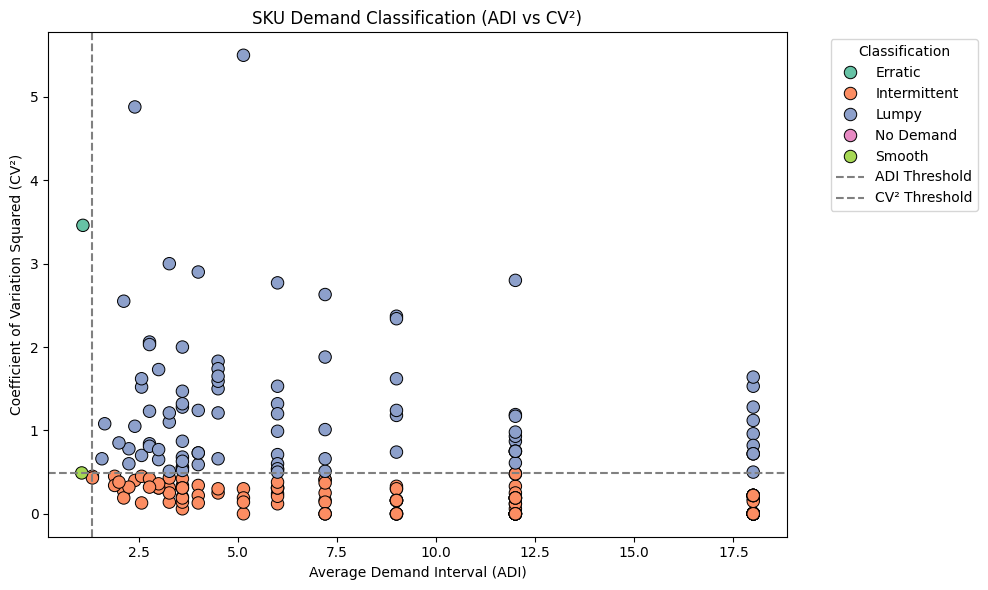

/tmp/ipython-input-837779104.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


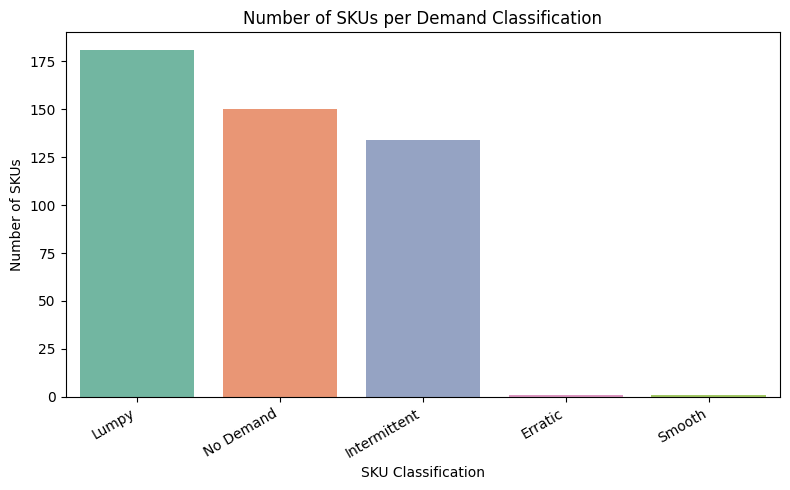

In [16]:
plot_sku_classification(sku_classification_df)

In [21]:

def plot_sku_classification(classification_df):
    """
    Plots:
    1. ADI vs CV² scatter plot (color-coded by CategoryABC)
    2. Bar plot showing number of SKUs per Classification (with CategoryABC as hue)

    Parameters:
    classification_df (pd.DataFrame): Output DataFrame from classify_sku_demand() function
    """

    # Scatter Plot: ADI vs CV² (hue = CategoryABC)
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=classification_df,
        x='ADI',
        y='CV2',
        hue='CategoryABC',     # <-- use CategoryABC for legend
        style='Classification', # optional: add different markers per Classification
        palette='Set2',
        s=80,
        edgecolor='black'
    )
    plt.title('SKU Demand Classification (ADI vs CV²)')
    plt.xlabel('Average Demand Interval (ADI)')
    plt.ylabel('Coefficient of Variation Squared (CV²)')
    plt.axvline(x=1.32, color='gray', linestyle='--', label='ADI Threshold')
    plt.axhline(y=0.49, color='gray', linestyle='--', label='CV² Threshold')
    plt.legend(title='CategoryABC', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Bar Plot: Number of SKUs per Classification (hue = CategoryABC)
    plt.figure(figsize=(8, 5))
    sns.countplot(
        data=classification_df,
        x='Classification',
        hue='CategoryABC',   # <-- add legend by CategoryABC
        palette='Set2',
        order=classification_df['Classification'].value_counts().index
    )
    plt.title('Number of SKUs per Demand Classification')
    plt.xlabel('SKU Classification')
    plt.ylabel('Number of SKUs')
    plt.xticks(rotation=30, ha='right')
    plt.legend(title='CategoryABC', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


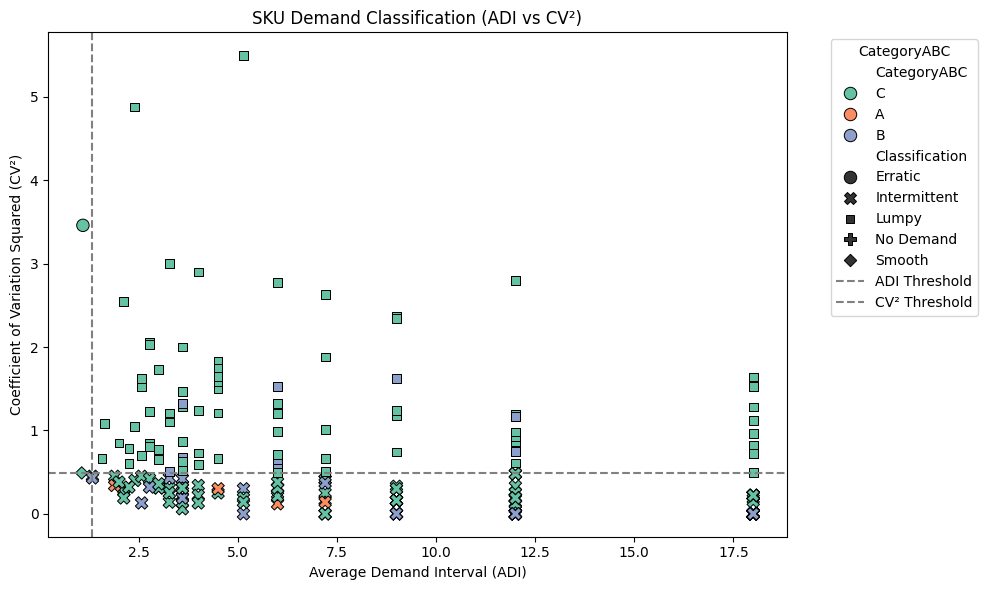

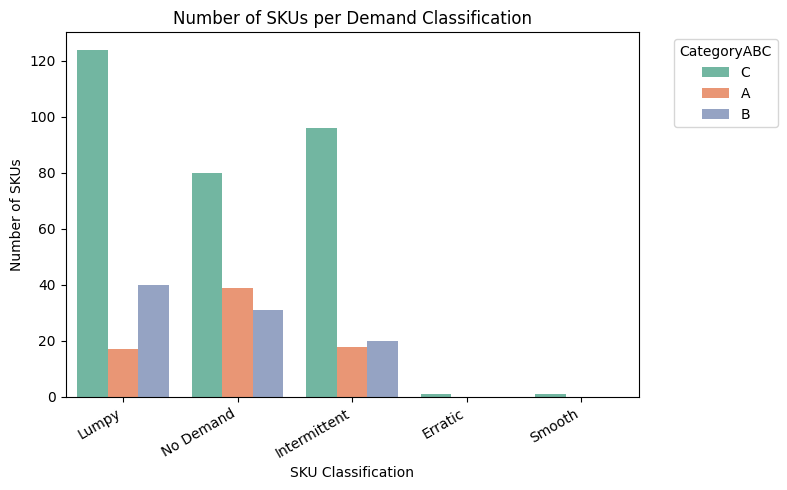

In [22]:
plot_sku_classification(sku_classification_df)

In [ ]:
def classify_inventory_health(consumption_df, procurement_df):
    """
    Merge consumption and procurement classification data and classify inventory health status.

    Parameters:
    - consumption_df: DataFrame with SKU, ADI, CV², Classification (from consumption data)
    - procurement_df: DataFrame with SKU, ADI, CV², Classification (from procurement data)

    Returns:
    - merged_df: DataFrame with both classifications and final inventory health category
    """
    # Merge both on SKU
    merged_df = consumption_df.merge(procurement_df, on='SKU', suffixes=('_Demand', '_Procurement'))

    # Define inventory health classification logic
    def inventory_health(row):
        demand = row['Classification_Demand']
        procurement = row['Classification_Procurement']

        if demand == 'Smooth' and procurement == 'Smooth':
                return 'Well Planned'
        elif demand == 'Smooth' and procurement in ['Intermittent', 'Erratic', 'Lumpy']:
            return 'Understocking Risk'
        elif demand in ['Intermittent', 'Lumpy'] and procurement == 'Smooth':
            return 'Overstocking Risk'
        elif demand == 'Intermittent' and procurement == 'Intermittent':
            return 'Reasonable for Slow Movers'
        elif demand == 'Erratic' and procurement == 'Erratic':
            return 'Reasonable for Erratic'
        elif demand == 'Lumpy' and procurement == 'Lumpy':
            return 'Acceptable for Lumpy'
        elif demand == 'Intermittent' and procurement in ['Erratic', 'Lumpy']:
            return 'Acceptable for Intermittent'
        elif demand == 'Erratic' and procurement in ['Smooth', 'Intermittent', 'Lumpy']:
            return 'Needs Review'
        elif demand == 'Lumpy' and procurement in ['Smooth', 'Intermittent', 'Erratic']:
            return 'Needs Review'
        elif demand == 'No Demand':
            return 'No Demand SKU'
        else:
            return 'Mismatch/Needs Review'

    merged_df['Inventory_Health'] = merged_df.apply(inventory_health, axis=1)

    return merged_df


In [ ]:
def plot_adi_vs_procurement(merged_df):
    """
    Scatter plot: Consumption ADI vs Procurement ADI
    """
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=merged_df,
        x='ADI_Demand',
        y='ADI_Procurement',
        hue='Inventory_Health',
        palette='Set2',
        s=80,
        edgecolor='black'
    )

    plt.axvline(x=1.32, color='gray', linestyle='--', label='ADI Demand Threshold')
    plt.axhline(y=1.32, color='gray', linestyle='--', label='ADI Procurement Threshold')

    plt.title('Consumption ADI vs Procurement ADI')
    plt.xlabel('Consumption ADI')
    plt.ylabel('Procurement ADI')
    plt.legend(title='Inventory Health', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

def plot_cv2_vs_procurement(merged_df):
    """
    Scatter plot: Consumption CV² vs Procurement CV²
    """
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=merged_df,
        x='CV2_Demand',
        y='CV2_Procurement',
        hue='Inventory_Health',
        palette='Set2',
        s=80,
        edgecolor='black'
    )

    plt.axvline(x=0.49, color='gray', linestyle='--', label='CV² Demand Threshold')
    plt.axhline(y=0.49, color='gray', linestyle='--', label='CV² Procurement Threshold')

    plt.title('Consumption CV² vs Procurement CV²')
    plt.xlabel('Consumption CV²')
    plt.ylabel('Procurement CV²')
    plt.legend(title='Inventory Health', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


In [ ]:
consumption_class_df = classify_sku_demand(final_long_df, sku_col='PartCode', period_col='MONTH_YEAR', demand_col='CONSUMPTION')
procurement_class_df = classify_sku_demand(final_long_df, sku_col='PartCode', period_col='MONTH_YEAR', demand_col='PROCUREMENT')

# Merge and classify inventory health
inventory_health_df = classify_inventory_health(consumption_class_df, procurement_class_df)

/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:210: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [ ]:
inventory_health_df

,SKU,ADI_Demand,CV2_Demand,Classification_Demand,ADI_Procurement,CV2_Procurement,Classification_Procurement,Inventory_Health
0,CONVRV000969,1.09,3.46,Erratic,4.00,0.43,Intermittent,Needs Review
1,CONCOM008774,9.00,0.16,Intermittent,18.00,0.50,Lumpy,Acceptable for Intermittent
2,CONCOM012889,18.00,0.00,Intermittent,18.00,0.00,Intermittent,Reasonable for Slow Movers
3,CONCOM008160,18.00,0.18,Intermittent,18.00,0.43,Intermittent,Reasonable for Slow Movers
4,CONCOM007552,3.60,0.34,Intermittent,9.00,0.04,Intermittent,Reasonable for Slow Movers
...,...,...,...,...,...,...,...,...
462,CONCOM008971,NaN,NaN,No Demand,NaN,NaN,No Demand,No Demand SKU
463,CONCOM010458,NaN,NaN,No Demand,36.00,NaN,Lumpy,No Demand SKU
464,CONCOM017438,NaN,NaN,No Demand,NaN,NaN,No Demand,No Demand SKU
465,CONCOM017439,NaN,NaN,No Demand,NaN,NaN,No Demand,No Demand SKU


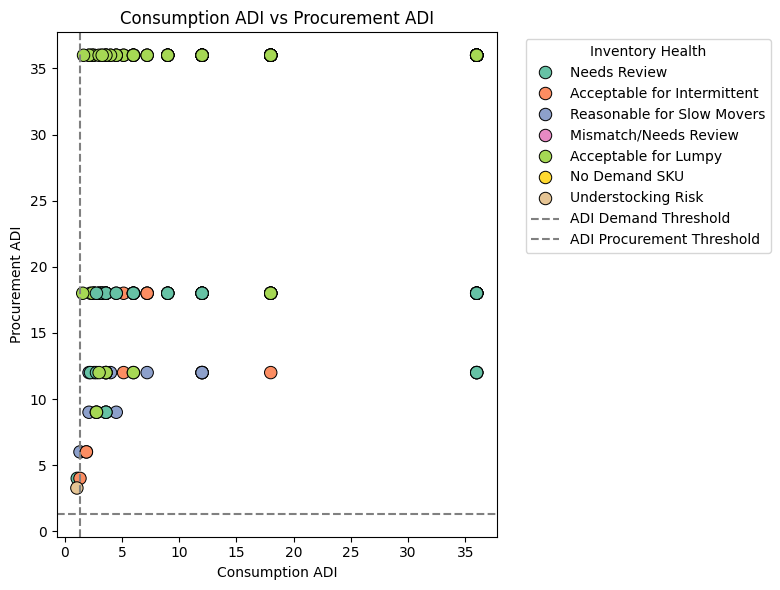

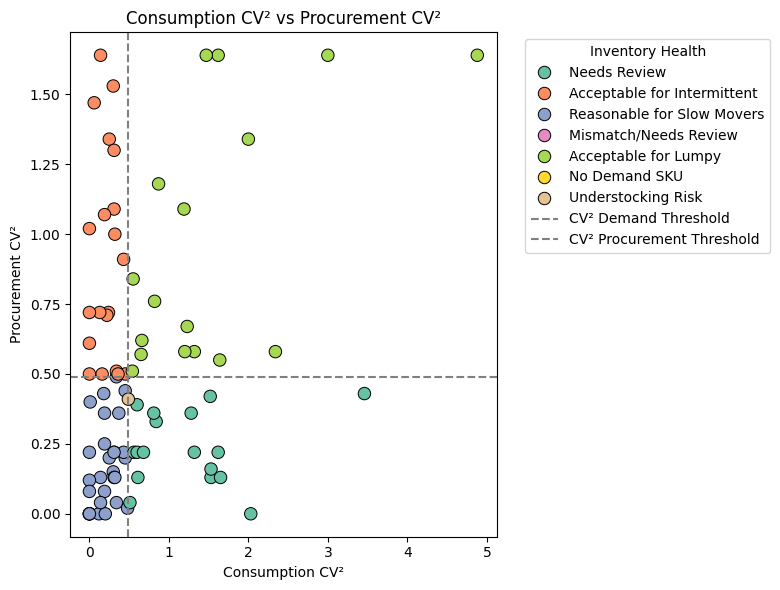

In [ ]:
plot_adi_vs_procurement(inventory_health_df)
plot_cv2_vs_procurement(inventory_health_df)

In [ ]:
def print_summary_table(df):
    """
    Print a summary table of all key statistics
    """
    unique_parts = df.drop_duplicates(subset=['PartCode'])

    print("\n" + "="*70)
    print("SUMMARY TABLE - KEY STATISTICS")
    print("="*70)

    summary_data = {
        'Metric': [
            'Total Unique Parts',
            'Category A Parts',
            'Category B Parts',
            'Category C Parts',
            'Total Makes/Suppliers',
            'Total Machine Types',
            'Total Production Lines',
            'Most Common Category',
            'Top Supplier by Unique Part Count',
            'Top Machine Type by Unique Part Count',
            # 'Busiest Production Line'
        ],
        'Count': [
            df['PartCode'].nunique(),
            len(unique_parts[unique_parts['CategoryABC'] == 'A']),
            len(unique_parts[unique_parts['CategoryABC'] == 'B']),
            len(unique_parts[unique_parts['CategoryABC'] == 'C']),
            unique_parts['Make_consumption'].nunique(),
            unique_parts['CommonMachineName_consumption'].nunique(),
            unique_parts['Line_consumption'].nunique(),
            unique_parts['CategoryABC'].mode()[0] if len(unique_parts) > 0 else 'N/A',
            unique_parts['Make_consumption'].mode()[0] if len(unique_parts) > 0 else 'N/A',
            unique_parts['CommonMachineName_consumption'].mode()[0] if len(unique_parts) > 0 else 'N/A'
            # unique_parts['Line_consumption'].mode()[0] if len(unique_parts) > 0 else 'N/A'
        ]
    }

    summary_df = pd.DataFrame(summary_data)
    print(summary_df.to_string(index=False))
    print("="*70)

In [ ]:
final_long_df['CommonMachineName_consumption'].value_counts().head(3).index.tolist()

['Ultrasonic Tube Sealing M/C', 'Vaccum Lifter', 'Auto Brazing']

In [ ]:
print_summary_table(final_long_df)

NameError: name 'print_summary_table' is not defined

## ABC Category Vs Each Part Price

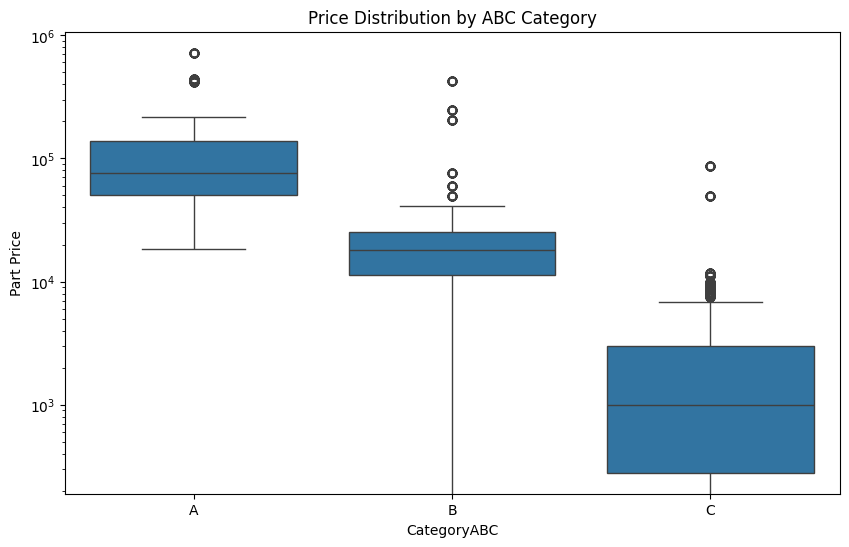

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='CategoryABC', y='EachPartPrice_consumption', data=final_long_df)
plt.ylabel('Part Price')
plt.title('Price Distribution by ABC Category')
plt.yscale('log')
plt.show()

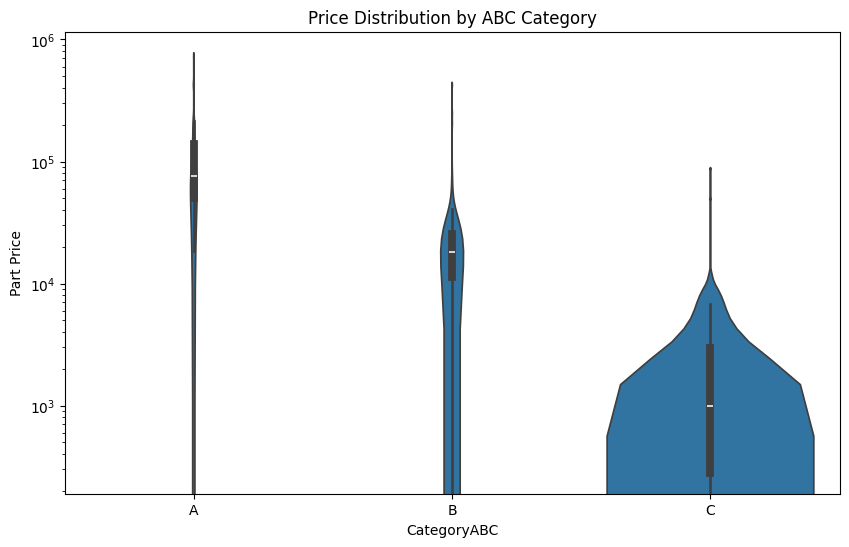

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='CategoryABC', y='EachPartPrice_consumption', data=final_long_df)
plt.ylabel('Part Price')
plt.title('Price Distribution by ABC Category')
plt.yscale('log')
plt.show()

## Consumption Vs Procurement Stats by Different Factors

### By Category ABC

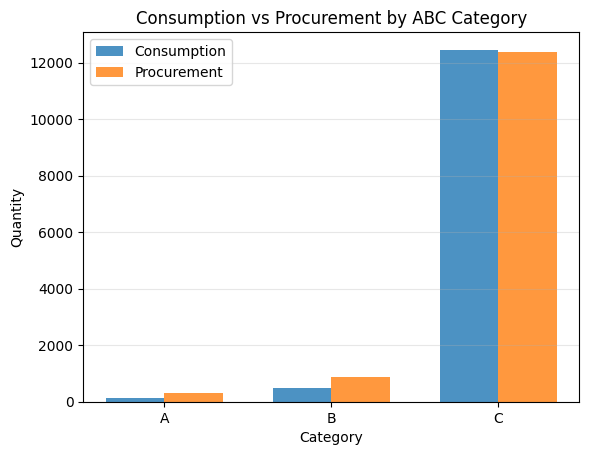

In [ ]:
group_stats = final_long_df.groupby('CategoryABC').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum',
    'EachPartPrice_consumption': 'mean'
}).fillna(0)

x = np.arange(len(group_stats.index))
width = 0.35

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Category')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by ABC Category')
plt.xticks(x, group_stats.index)
plt.legend()
plt.grid(axis='y', alpha=0.3)

### By Common Machine

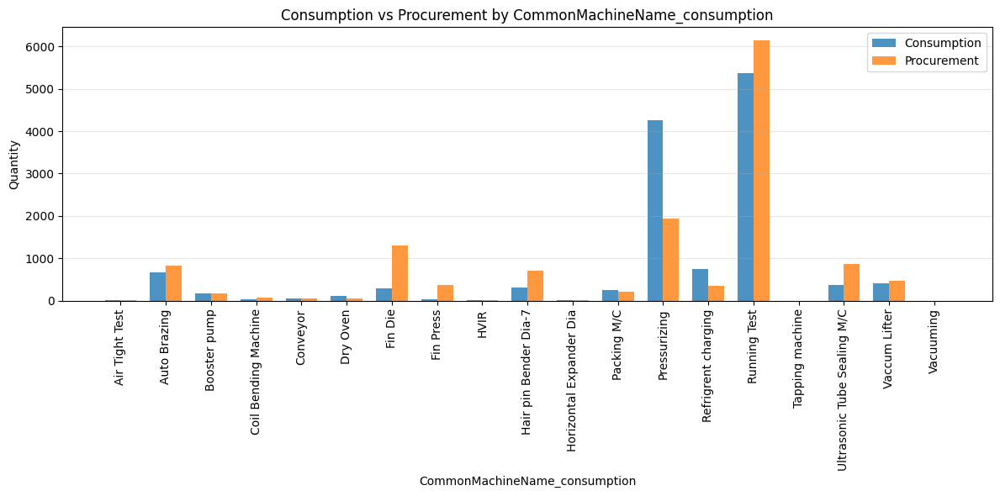

In [ ]:
group_stats = final_long_df.groupby('CommonMachineName_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('CommonMachineName_consumption')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by CommonMachineName_consumption')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


### Unique Part Count by Machine and ABC Category

In [ ]:
category_data = final_long_df.pivot_table(
    index='CommonMachineName_consumption',
    columns='CategoryABC',
    values='PartCode',
    aggfunc='nunique',
    fill_value=0
)

In [ ]:
category_data

CategoryABC,A,B,C
CommonMachineName_consumption,,,
Air Tight Test,0,0,1
Auto Brazing,8,10,29
Booster pump,8,6,6
Coil Bending Machine,0,0,5
Conveyor,3,3,9
Dry Oven,0,1,16
Fin Die,4,10,5
Fin Press,5,8,11
HVIR,0,1,0


In [ ]:
category_data

CategoryABC,A,B,C
CommonMachineName_consumption,,,
Air Tight Test,0,0,1
Auto Brazing,8,10,29
Booster pump,8,6,6
Coil Bending Machine,0,0,5
Conveyor,3,3,9
Dry Oven,0,1,16
Fin Die,4,10,5
Fin Press,5,8,11
HVIR,0,1,0


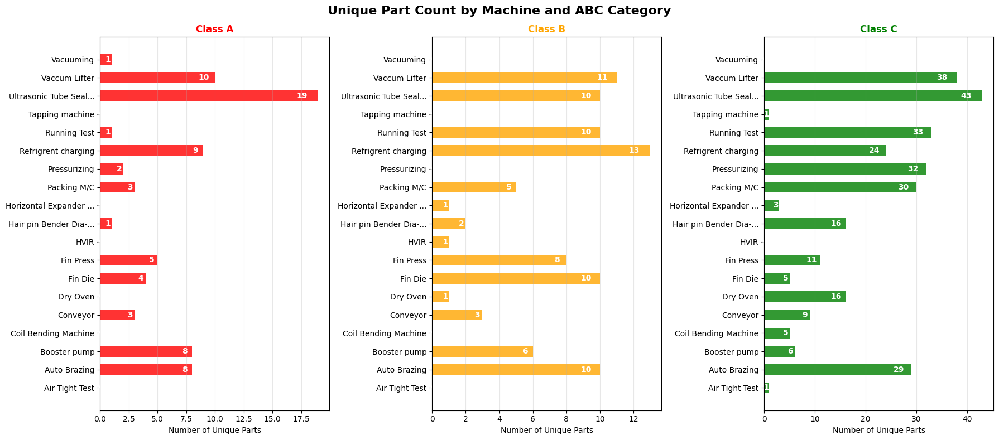

In [ ]:
# Group by machine and category using pivot table
category_data = final_long_df.pivot_table(
    index='CommonMachineName_consumption',
    columns='CategoryABC',
    values='PartCode',
    aggfunc='nunique',
    fill_value=0
)

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 8))

categories = ['A', 'B', 'C']
colors = ['red', 'orange', 'green']

for i, category in enumerate(categories):
    # Get data for this category
    if category in category_data.columns:
        cat_data = category_data[category]

        # Filter out machines with 0 parts for cleaner visualization
        #cat_data = cat_data[cat_data > 0]

        if len(cat_data) > 0:
            machines = cat_data.index
            y_pos = np.arange(len(machines))

            # Create horizontal bars
            bars = axes[i].barh(y_pos, cat_data.values, height=0.6,
                        alpha=0.8, color=colors[i])

            # Add data labels on inside edge of bars
            for j, (bar, value) in enumerate(zip(bars, cat_data.values)):
                axes[i].text(value - value*0.05, bar.get_y() + bar.get_height()/2,
                           str(int(value)),
                           ha='right', va='center',
                           fontweight='bold', color='white')

            # Customize subplot
            axes[i].set_yticks(y_pos)
            axes[i].set_yticklabels([machine[:20] + '...' if len(machine) > 20 else machine
                                    for machine in machines])
            axes[i].set_xlabel('Number of Unique Parts')
            axes[i].set_title(f'Class {category}', color=colors[i], fontweight='bold')
            axes[i].grid(axis='x', alpha=0.3)
        else:
            # Handle case where category has no data
            axes[i].set_title(f'Class {category} - No Data', color=colors[i])
            axes[i].set_xlabel('Number of Unique Parts')
    else:
        # Handle case where category doesn't exist
        axes[i].set_title(f'Class {category} - No Data', color=colors[i])
        axes[i].set_xlabel('Number of Unique Parts')

plt.suptitle('Unique Part Count by Machine and ABC Category', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### Consumption Vs Procurement Total Qty by Machine and ABC Category

In [ ]:
active_machines

NameError: name 'active_machines' is not defined

In [ ]:
# Group by machine and category using pivot table
consumption_data = final_long_df.pivot_table(
    index='CommonMachineName_consumption',
    columns='CategoryABC',
    values='CONSUMPTION',
    aggfunc='sum',
    fill_value=0
)

procurement_data = final_long_df.pivot_table(
    index='CommonMachineName_consumption',
    columns='CategoryABC',
    values='PROCUREMENT',
    aggfunc='sum',
    fill_value=0
)

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 8))

categories = ['A', 'B', 'C']
colors = ['red', 'orange', 'green']

for i, category in enumerate(categories):
    # Get data for this category
    if category in consumption_data.columns:
        cons_data = consumption_data[category]
        proc_data = procurement_data[category]

        # Filter out machines with 0 total activity for cleaner visualization
        total_activity = cons_data + proc_data
        active_machines = total_activity.index #total_activity[total_activity > 0].index

        if len(active_machines) > 0:
            cons_values = cons_data[active_machines]
            proc_values = proc_data[active_machines]

            y_pos = np.arange(len(active_machines))

            # Create horizontal bars
            bars1 = axes[i].barh(y_pos - 0.2, cons_values, height=0.4,
                        label='Consumption', alpha=0.8, color='skyblue')
            bars2 = axes[i].barh(y_pos + 0.2, proc_values, height=0.4,
                        label='Procurement', alpha=0.8, color='lightcoral')

            # Add data labels on outside edge of consumption bars
            for j, (bar, value) in enumerate(zip(bars1, cons_values)):
                if value > 0:
                    axes[i].text(value + value*0.02, bar.get_y() + bar.get_height()/2,
                               str(int(value)),
                               ha='left', va='center',
                               fontweight='bold', color='black')

            # Add data labels on outside edge of procurement bars
            for j, (bar, value) in enumerate(zip(bars2, proc_values)):
                if value > 0:
                    axes[i].text(value + value*0.02, bar.get_y() + bar.get_height()/2,
                               str(int(value)),
                               ha='left', va='center',
                               fontweight='bold', color='black')

            # Customize subplot
            axes[i].set_yticks(y_pos)
            axes[i].set_yticklabels([machine[:20] + '...' if len(machine) > 20 else machine
                                    for machine in active_machines])
            axes[i].set_xlabel('Quantity')
            axes[i].set_title(f'Category {category}', color=colors[i], fontweight='bold')
            axes[i].legend()
            axes[i].grid(axis='x', alpha=0.3)
        else:
            # Handle case where category has no data
            axes[i].set_title(f'Category {category} - No Data', color=colors[i])
            axes[i].set_xlabel('Quantity')
    else:
        # Handle case where category doesn't exist
        axes[i].set_title(f'Category {category} - No Data', color=colors[i])
        axes[i].set_xlabel('Quantity')

plt.suptitle('Consumption vs Procurement Total Qty by Machine and ABC Category', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### By Line

In [ ]:
group_stats = final_long_df.groupby('Line_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Line')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by Line')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


### By Make

In [ ]:
final_long_df.groupby('Make_procurement').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0).sort_values(by='PROCUREMENT',ascending=False).head(10)

In [ ]:
group_stats = final_long_df.groupby('Make_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0).sort_values(by='PROCUREMENT',ascending=False).head(10)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Make')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by Make')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


In [ ]:
group_stats = final_long_df.groupby('Make_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0).sort_values(by='CONSUMPTION',ascending=False).head(10)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Make')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by Make')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


In [ ]:
# Step 1: Group by Make
make_sums = final_long_df.groupby('Make_consumption')[['CONSUMPTION', 'PROCUREMENT']].sum()

# Step 2: Classification
def classify(row):
    if row['CONSUMPTION'] > row['PROCUREMENT']:
        return 'More Consumption'
    elif row['CONSUMPTION'] < row['PROCUREMENT']:
        return 'More Procurement'
    else:
        return 'Equal'

make_sums['Comparison'] = make_sums.apply(classify, axis=1)

# Step 3: Count of Makes in each group
result = make_sums['Comparison'].value_counts()

print(result)

In [ ]:
result.plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'], alpha=0.8)

plt.title('Number of Makes by Consumption vs Procurement')
plt.ylabel('Number of Makes')
plt.xlabel('Comparison Type')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
# Step 1: Group by Make
make_sums = final_long_df.groupby('CommonMachineName_consumption')[['CONSUMPTION', 'PROCUREMENT']].sum()

# Step 2: Classification
def classify(row):
    if row['CONSUMPTION'] > row['PROCUREMENT']:
        return 'More Consumption'
    elif row['CONSUMPTION'] < row['PROCUREMENT']:
        return 'More Procurement'
    else:
        return 'Equal'

make_sums['Comparison'] = make_sums.apply(classify, axis=1)

# Step 3: Count of Makes in each group
result = make_sums['Comparison'].value_counts()

print(result)

In [ ]:
result.plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'], alpha=0.8)

plt.title('Number of Machines by Consumption vs Procurement')
plt.ylabel('Number of Makes')
plt.xlabel('Comparison Type')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
latest_stock

In [ ]:
latest_stock = final_long_df.groupby('PartCode')['Running_Stock'].last().sort_values(ascending=False).head(25)

plt.barh(range(len(latest_stock)), latest_stock.values)
plt.yticks(range(len(latest_stock)), [code[:15] + '...' if len(code) > 15 else code for code in latest_stock.index])
plt.xlabel('Running Stock')
plt.title('Top 25 Parts by +ve(more procurement) Current Running Stock')
plt.grid(axis='x', alpha=0.3)

In [ ]:
latest_stock = final_long_df.groupby('PartCode')['Running_Stock'].last().sort_values(ascending=False).tail(25)

plt.barh(range(len(latest_stock)), latest_stock.values)
plt.yticks(range(len(latest_stock)), [code[:15] + '...' if len(code) > 15 else code for code in latest_stock.index])
plt.xlabel('Running Stock')
plt.title('Top 25 Parts by -ve(more consumption) Current Running Stock')
plt.grid(axis='x', alpha=0.3)

In [ ]:
monthly_trends = final_long_df[final_long_df['PartCode'] == 'CONCOM010368'].groupby('MONTH_YEAR').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0)

plt.figure(figsize=(12, 5))

plt.plot(monthly_trends.index, monthly_trends['CONSUMPTION'],
         marker='o', label='Consumption', linewidth=2, markersize=6)

plt.plot(monthly_trends.index, monthly_trends['PROCUREMENT'],
         marker='s', label='Procurement', linewidth=2, markersize=6)

plt.xlabel('Month')
plt.ylabel('Quantity')
plt.title('Monthly Consumption vs Procurement Trends')
plt.legend()
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
supplier_analysis = final_long_df.groupby('Make_consumption')['CONSUMPTION'].sum().sort_values(ascending=False).head(15)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total Consumption')
plt.title('Consumption by Supplier/Make')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
supplier_analysis = final_long_df.groupby('Make_consumption')['PROCUREMENT'].sum().sort_values(ascending=False).head(15)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total PROCUREMENT')
plt.title('Procurement by Supplier/Make')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
supplier_analysis = final_long_df.groupby('CommonMachineName_consumption')['CONSUMPTION'].sum().sort_values(ascending=False)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total Consumption')
plt.title('Consumption by Machine')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
supplier_analysis = final_long_df.groupby('CommonMachineName_consumption')['PROCUREMENT'].sum().sort_values(ascending=False)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total Procurement')
plt.title('Procurement by Machine')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
stock_analysis = final_long_df.dropna(subset=['Running_Stock', 'MinStock', 'MaxStock']).copy()
stock_analysis['Below_Min'] = stock_analysis['Running_Stock'] < stock_analysis['MinStock']
stock_analysis['Above_Max'] = stock_analysis['Running_Stock'] > stock_analysis['MaxStock']
stock_analysis['Within_Range'] = (~stock_analysis['Below_Min']) & (~stock_analysis['Above_Max'])

status_counts = [
    stock_analysis['Below_Min'].sum(),
    stock_analysis['Within_Range'].sum(),
    stock_analysis['Above_Max'].sum()
]

labels = ['Below Min', 'Within Range', 'Above Max']
colors = ['red', 'green', 'orange']

plt.bar(labels, status_counts, color=colors, alpha=0.7)
plt.ylabel('Number of Records')
plt.title('Stock Level Compliance')
plt.grid(axis='y', alpha=0.3)

# Add percentage labels
total = sum(status_counts)
for i, count in enumerate(status_counts):
    plt.text(i, count + total*0.01, f'{count/total*100:.1f}%',
            ha='center', va='bottom', fontweight='bold')


In [ ]:
# Step 1: Aggregate total Consumption and Procurement per PartCode and Category
agg_df = final_long_df.groupby(['PartCode', 'CategoryABC'])[['CONSUMPTION', 'PROCUREMENT']].sum().reset_index()

# Step 2: Scatter plot with 45-degree line
plt.figure(figsize=(8, 6))

# Plot each category as a different color
categories = agg_df['CategoryABC'].unique()
colors = {'A': 'blue', 'B': 'green', 'C': 'red'}

for category in categories:
    subset = agg_df[agg_df['CategoryABC'] == category]
    plt.scatter(subset['CONSUMPTION'], subset['PROCUREMENT'],
                label=f'Category {category}', color=colors.get(category, 'gray'), s=80, alpha=0.7)

# Step 3: 45-degree ideal line (y = x)
max_val = max(agg_df['CONSUMPTION'].max(), agg_df['PROCUREMENT'].max()) + 1
plt.plot([0, max_val], [0, max_val], color='black', linestyle='--', label='Ideal (y=x)')

# Labels and styling
plt.xlabel('Total Consumption')
plt.ylabel('Total Procurement')
plt.title('Consumption vs Procurement Scatter Plot by Category')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.xlim(0, 50)
plt.ylim(0, 50)
plt.show()

In [ ]:
def create_spare_parts_dashboard(df):
    """
    Create comprehensive insights dashboard for spare parts analysis
    """

    # Create figure with subplots
    fig = plt.figure(figsize=(20, 24))

    # 1. RUNNING STOCK ANALYSIS
    plt.subplot(4, 3, 1)

    # Top 10 parts by latest running stock
    latest_stock = df.groupby('PartCode')['Running_Stock'].last().sort_values(ascending=False).head(10)

    plt.barh(range(len(latest_stock)), latest_stock.values)
    plt.yticks(range(len(latest_stock)), [code[:15] + '...' if len(code) > 15 else code for code in latest_stock.index])
    plt.xlabel('Running Stock')
    plt.title('Top 10 Parts by Current Running Stock')
    plt.grid(axis='x', alpha=0.3)

    # 2. RUNNING STOCK TREND OVER TIME
    plt.subplot(4, 3, 2)

    # Select top 5 parts by total consumption for trend analysis
    top_consumed_parts = df.groupby('PartCode')['CONSUMPTION'].sum().nlargest(5).index

    for part in top_consumed_parts:
        part_data = df[df['PartCode'] == part].sort_values('MONTH_YEAR')
        if not part_data['Running_Stock'].isna().all():
            plt.plot(part_data['MONTH_YEAR'], part_data['Running_Stock'],
                    marker='o', label=part[:10] + '...', linewidth=2, markersize=4)

    plt.xlabel('Month')
    plt.ylabel('Running Stock')
    plt.title('Running Stock Trends - Top 5 Consumed Parts')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3)

    # 3. CATEGORY ABC ANALYSIS
    plt.subplot(4, 3, 3)

    category_stats = df.groupby('CategoryABC').agg({
        'CONSUMPTION': 'sum',
        'PROCUREMENT': 'sum',
        'EachPartPrice_consumption': 'mean'
    }).fillna(0)

    x = np.arange(len(category_stats.index))
    width = 0.35

    plt.bar(x - width/2, category_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
    plt.bar(x + width/2, category_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

    plt.xlabel('Category')
    plt.ylabel('Quantity')
    plt.title('Consumption vs Procurement by ABC Category')
    plt.xticks(x, category_stats.index)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)

    # 4. STOCK LEVEL DISTRIBUTION
    plt.subplot(4, 3, 4)

    # Create stock level categories
    df_clean = df.dropna(subset=['Running_Stock'])
    df_clean['Stock_Category'] = pd.cut(df_clean['Running_Stock'],
                                       bins=[-np.inf, 0, df_clean['MinStock'].median(),
                                            df_clean['MaxStock'].median(), np.inf],
                                       labels=['Negative', 'Low', 'Medium', 'High'])

    stock_counts = df_clean['Stock_Category'].value_counts()
    colors = ['red', 'orange', 'yellow', 'green']

    plt.pie(stock_counts.values, labels=stock_counts.index, autopct='%1.1f%%',
           colors=colors, startangle=90)
    plt.title('Distribution of Stock Levels')

    # 5. CONSUMPTION PATTERNS BY MACHINE
    plt.subplot(4, 3, 5)

    machine_consumption = df.groupby('CommonMachineName_consumption')['CONSUMPTION'].sum().sort_values(ascending=False).head(8)

    plt.bar(range(len(machine_consumption)), machine_consumption.values)
    plt.xticks(range(len(machine_consumption)),
              [name[:15] + '...' if len(name) > 15 else name for name in machine_consumption.index],
              rotation=45, ha='right')
    plt.ylabel('Total Consumption')
    plt.title('Consumption by Machine Type')
    plt.grid(axis='y', alpha=0.3)

    # 6. PRICE vs CONSUMPTION ANALYSIS
    plt.subplot(4, 3, 6)

    # Aggregate by part code to avoid overplotting
    part_summary = df.groupby('PartCode').agg({
        'CONSUMPTION': 'sum',
        'EachPartPrice_consumption': 'first',
        'CategoryABC': 'first'
    }).dropna()

    # Create scatter plot with different colors for categories
    for category in part_summary['CategoryABC'].unique():
        cat_data = part_summary[part_summary['CategoryABC'] == category]
        plt.scatter(cat_data['CONSUMPTION'], cat_data['EachPartPrice_consumption'],
                   label=f'Category {category}', alpha=0.6, s=50)

    plt.xlabel('Total Consumption')
    plt.ylabel('Part Price')
    plt.title('Price vs Consumption by Category')
    plt.legend()
    plt.yscale('log')  # Log scale for price due to wide range
    plt.grid(alpha=0.3)

    # 7. MONTHLY CONSUMPTION TRENDS
    plt.subplot(4, 3, 7)

    monthly_trends = df.groupby('MONTH_YEAR').agg({
        'CONSUMPTION': 'sum',
        'PROCUREMENT': 'sum'
    }).fillna(0)

    plt.plot(monthly_trends.index, monthly_trends['CONSUMPTION'],
            marker='o', label='Consumption', linewidth=2, markersize=6)
    plt.plot(monthly_trends.index, monthly_trends['PROCUREMENT'],
            marker='s', label='Procurement', linewidth=2, markersize=6)

    plt.xlabel('Month')
    plt.ylabel('Quantity')
    plt.title('Monthly Consumption vs Procurement Trends')
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3)

    # 8. STOCK DEVIATION FROM MIN/MAX
    plt.subplot(4, 3, 8)

    # Calculate how often stock is below min or above max
    stock_analysis = df.dropna(subset=['Running_Stock', 'MinStock', 'MaxStock']).copy()
    stock_analysis['Below_Min'] = stock_analysis['Running_Stock'] < stock_analysis['MinStock']
    stock_analysis['Above_Max'] = stock_analysis['Running_Stock'] > stock_analysis['MaxStock']
    stock_analysis['Within_Range'] = (~stock_analysis['Below_Min']) & (~stock_analysis['Above_Max'])

    status_counts = [
        stock_analysis['Below_Min'].sum(),
        stock_analysis['Within_Range'].sum(),
        stock_analysis['Above_Max'].sum()
    ]

    labels = ['Below Min', 'Within Range', 'Above Max']
    colors = ['red', 'green', 'orange']

    plt.bar(labels, status_counts, color=colors, alpha=0.7)
    plt.ylabel('Number of Records')
    plt.title('Stock Level Compliance')
    plt.grid(axis='y', alpha=0.3)

    # Add percentage labels
    total = sum(status_counts)
    for i, count in enumerate(status_counts):
        plt.text(i, count + total*0.01, f'{count/total*100:.1f}%',
                ha='center', va='bottom', fontweight='bold')

    # 9. LINE-WISE ANALYSIS
    plt.subplot(4, 3, 9)

    line_analysis = df.groupby('Line_consumption').agg({
        'CONSUMPTION': 'sum',
        'PartCode': 'nunique'
    }).sort_values('CONSUMPTION', ascending=False)

    # Create dual-axis plot
    ax1 = plt.gca()
    ax2 = ax1.twinx()

    bars1 = ax1.bar(line_analysis.index, line_analysis['CONSUMPTION'],
                   alpha=0.7, color='skyblue', label='Total Consumption')
    bars2 = ax2.plot(line_analysis.index, line_analysis['PartCode'],
                    'ro-', label='Unique Parts', linewidth=2, markersize=8)

    ax1.set_xlabel('Production Line')
    ax1.set_ylabel('Total Consumption', color='blue')
    ax2.set_ylabel('Number of Unique Parts', color='red')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax2.tick_params(axis='y', labelcolor='red')

    plt.title('Consumption & Part Diversity by Line')
    plt.xticks(rotation=45)

    # 10. CUMULATIVE ANALYSIS
    plt.subplot(4, 3, 10)

    # Show cumulative consumption vs procurement for top parts
    top_parts = df.groupby('PartCode')['CONSUMPTION'].sum().nlargest(3).index

    for part in top_parts:
        part_data = df[df['PartCode'] == part].sort_values('MONTH_YEAR')
        plt.plot(part_data['MONTH_YEAR'], part_data['Cumulative_Consumption'],
                label=f'{part[:10]}... (Cons)', linestyle='-', linewidth=2)
        plt.plot(part_data['MONTH_YEAR'], part_data['Cumulative_Procurement'],
                label=f'{part[:10]}... (Proc)', linestyle='--', linewidth=2)

    plt.xlabel('Month')
    plt.ylabel('Cumulative Quantity')
    plt.title('Cumulative Consumption vs Procurement - Top 3 Parts')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3)

    # 11. MAKE/SUPPLIER ANALYSIS
    plt.subplot(4, 3, 11)

    supplier_analysis = df.groupby('Make_consumption')['CONSUMPTION'].sum().sort_values(ascending=False).head(8)

    plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
    plt.yticks(range(len(supplier_analysis)),
              [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
    plt.xlabel('Total Consumption')
    plt.title('Consumption by Supplier/Make')
    plt.grid(axis='x', alpha=0.3)

    # 12. PROCUREMENT vs CONSUMPTION EFFICIENCY
    plt.subplot(4, 3, 12)

    # Calculate procurement efficiency (how well procurement matches consumption)
    efficiency_data = df.groupby('PartCode').agg({
        'CONSUMPTION': 'sum',
        'PROCUREMENT': 'sum'
    }).dropna()

    efficiency_data['Efficiency_Ratio'] = efficiency_data['PROCUREMENT'] / (efficiency_data['CONSUMPTION'] + 1)  # +1 to avoid division by zero
    efficiency_data['Total_Activity'] = efficiency_data['CONSUMPTION'] + efficiency_data['PROCUREMENT']

    # Filter for parts with significant activity
    active_parts = efficiency_data[efficiency_data['Total_Activity'] > efficiency_data['Total_Activity'].quantile(0.25)]

    plt.scatter(active_parts['CONSUMPTION'], active_parts['PROCUREMENT'],
               alpha=0.6, s=50)

    # Add diagonal line for perfect efficiency
    max_val = max(active_parts['CONSUMPTION'].max(), active_parts['PROCUREMENT'].max())
    plt.plot([0, max_val], [0, max_val], 'r--', alpha=0.5, label='Perfect Match')

    plt.xlabel('Total Consumption')
    plt.ylabel('Total Procurement')
    plt.title('Procurement vs Consumption Efficiency')
    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

In [ ]:
def create_summary_insights(df):
    """
    Print key insights from the data
    """
    print("="*80)
    print("SPARE PARTS ANALYSIS - KEY INSIGHTS")
    print("="*80)

    # Basic statistics
    total_parts = df['PartCode'].nunique()
    total_consumption = df['CONSUMPTION'].sum()
    total_procurement = df['PROCUREMENT'].sum()
    avg_price = df['EachPartPrice_consumption'].mean()

    print(f"\n📊 OVERVIEW:")
    print(f"   • Total unique parts: {total_parts:,}")
    print(f"   • Total consumption: {total_consumption:,.0f}")
    print(f"   • Total procurement: {total_procurement:,.0f}")
    print(f"   • Net movement: {total_procurement - total_consumption:,.0f}")
    print(f"   • Average part price: ₹{avg_price:,.0f}")

    # Category analysis
    category_breakdown = df.groupby('CategoryABC')['PartCode'].nunique()
    print(f"\n🏷️  CATEGORY BREAKDOWN:")
    for cat, count in category_breakdown.items():
        percentage = (count / total_parts) * 100
        print(f"   • Category {cat}: {count} parts ({percentage:.1f}%)")

    # Stock level issues
    stock_issues = df.dropna(subset=['Running_Stock', 'MinStock']).copy()
    below_min = (stock_issues['Running_Stock'] < stock_issues['MinStock']).sum()
    negative_stock = (stock_issues['Running_Stock'] < 0).sum()

    print(f"\n⚠️  STOCK ALERTS:")
    print(f"   • Parts below minimum stock: {below_min}")
    print(f"   • Parts with negative stock: {negative_stock}")

    # Top consumers
    top_parts = df.groupby('PartCode')['CONSUMPTION'].sum().nlargest(5)
    print(f"\n🔥 TOP 5 CONSUMED PARTS:")
    for i, (part, consumption) in enumerate(top_parts.items(), 1):
        print(f"   {i}. {part[:30]}... → {consumption:.0f} units")

    # Machine analysis
    machine_diversity = df.groupby('CommonMachineName_consumption')['PartCode'].nunique().sort_values(ascending=False)
    print(f"\n🏭 MACHINE COMPLEXITY (by part diversity):")
    for machine, part_count in machine_diversity.head(3).items():
        print(f"   • {machine[:40]}... → {part_count} different parts")

    # Data quality insights
    missing_prices = df['EachPartPrice_consumption'].isna().sum()
    missing_consumption = df['CONSUMPTION'].isna().sum()

    print(f"\n📋 DATA QUALITY:")
    print(f"   • Missing prices: {missing_prices} records ({missing_prices/len(df)*100:.1f}%)")
    print(f"   • Missing consumption data: {missing_consumption} records ({missing_consumption/len(df)*100:.1f}%)")

    print("="*80)

# Example usage:
# Assuming your dataframe is named 'final_long_df'
# create_spare_parts_dashboard(final_long_df)
# create_summary_insights(final_long_df)

# If you want to save the plots
def save_dashboard(df, filename='spare_parts_dashboard.png'):
    """
    Save the dashboard as an image file
    """
    create_spare_parts_dashboard(df)
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Dashboard saved as {filename}")

# Additional focused analysis functions
def analyze_critical_parts(df, threshold_percentile=90):
    """
    Identify and analyze critical parts based on consumption
    """
    consumption_threshold = df.groupby('PartCode')['CONSUMPTION'].sum().quantile(threshold_percentile/100)
    critical_parts = df.groupby('PartCode')['CONSUMPTION'].sum()
    critical_parts = critical_parts[critical_parts >= consumption_threshold].index

    print(f"\n🎯 CRITICAL PARTS ANALYSIS (Top {100-threshold_percentile}%):")
    print("="*60)

    for part in critical_parts:
        part_data = df[df['PartCode'] == part]
        total_consumption = part_data['CONSUMPTION'].sum()
        avg_stock = part_data['Running_Stock'].mean()
        price = part_data['EachPartPrice_consumption'].iloc[0]

        print(f"\n📦 {part[:40]}...")
        print(f"   • Total consumption: {total_consumption:.0f}")
        print(f"   • Average running stock: {avg_stock:.1f}")
        print(f"   • Unit price: ₹{price:,.0f}")
        print(f"   • Total value consumed: ₹{total_consumption * price:,.0f}")


In [ ]:
create_spare_parts_dashboard(final_long_df)

In [ ]:
create_summary_insights(final_long_df)

In [ ]:
analyze_critical_parts(final_long_df, threshold_percentile=95)

In [ ]:
result = []

for part, group in final_long_df.groupby('PartCode'):
    stockouts = (group['Running_Stock'] < group['MinStock']).sum()
    service_level = (1 - (stockouts / len(group))) * 100

    total_consumption = group['CONSUMPTION'].sum()
    fulfilled_consumption = group.loc[group['Running_Stock'] >= group['MinStock'], 'CONSUMPTION'].sum()
    fill_rate = (fulfilled_consumption / total_consumption) * 100 if total_consumption > 0 else 0

    average_inventory = group['Running_Stock'].mean()
    inventory_turns = total_consumption / average_inventory if average_inventory > 0 else 0

    result.append({
        'PartCode': part,
        'Service_Level_%': round(service_level, 2),
        'Fill_Rate_%': round(fill_rate, 2),
        'Stockouts': stockouts,
        'Avg_Inventory': round(average_inventory, 2),
        'Inventory_Turns': round(inventory_turns, 2)
    })

sku_metrics_df = pd.DataFrame(result)
print(sku_metrics_df)


In [ ]:
sku_metrics_df[sku_metrics_df['Service_Level_%']>0]

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(y='Service_Level_%', data=sku_metrics_df)
plt.title('Service Level % Distribution Across SKUs')
plt.ylabel('Service Level %')
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(8, 5))
sns.histplot(sku_metrics_df['Fill_Rate_%'], bins=30, kde=True)
plt.title('Fill Rate % Distribution Across SKUs')
plt.xlabel('Fill Rate %')
plt.ylabel('Number of SKUs')
plt.tight_layout()
plt.show()

In [ ]:
top_stockouts = sku_metrics_df.sort_values('Stockouts', ascending=False).head(20)

plt.figure(figsize=(10, 6))
sns.barplot(y='PartCode', x='Stockouts', data=top_stockouts, palette='Reds_r')
plt.title('Top 20 SKUs by Number of Stockouts')
plt.xlabel('Stockouts (#)')
plt.ylabel('PartCode')
plt.tight_layout()
plt.show()


In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='Avg_Inventory',
    y='Inventory_Turns',
    size='Service_Level_%',
    data=sku_metrics_df,
    legend=False,
    alpha=0.6
)
plt.title('Inventory Turns vs Average Inventory Level')
plt.xlabel('Average Inventory Level')
plt.ylabel('Inventory Turns')
plt.tight_layout()
plt.show()


In [ ]:
metrics = sku_metrics_df.set_index('PartCode')[['Service_Level_%', 'Fill_Rate_%', 'Stockouts', 'Inventory_Turns']]
plt.figure(figsize=(12, 15))
sns.heatmap(metrics.sort_values('Stockouts', ascending=False).head(50), annot=True, fmt=".1f", cmap='coolwarm')
plt.title('Multi-Metric Overview (Top 50 SKUs by Stockouts)')
plt.tight_layout()
plt.show()

## Assuming SAP Qty is initial Qty avl at the starting(Wrong Assumption)

In [ ]:
procurement_df.columns

Index(['Sr. No.', 'Sr. No..1', 'PART CODE', 'Description', 'UOM', 'Make',
       'SAP. QTY ', 'Common M/C Name', 'Line', 'Total purchase qty.',
       'Each Part Price', 'Jan-22', 'Feb-22', 'Mar-22', 'Apr-22', 'May-22',
       'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
       'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23',
       'Aug-23', 'Sep-23', 'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24',
       'Mar-24', 'Apr-24', 'May-24', 'Jun-24', 'Jul-24', 'Aug-24', 'Sep-24',
       'Oct-24', 'Nov-24', 'Dec-24'],
      dtype='object')

In [ ]:
procurement_df.rename(columns={
    'PART CODE': 'PartCode',
    'SAP. QTY ': 'SAPQty',
    'Common M/C Name': 'CommonMachineName',
    'Total purchase qty.': 'TotalPurchaseQty',
    'Each Part Price': 'EachPartPrice'
}, inplace=True)

In [ ]:
procurement_df.columns

Index(['Sr. No.', 'Sr. No..1', 'PartCode', 'Description', 'UOM', 'Make',
       'SAPQty', 'CommonMachineName', 'Line', 'TotalPurchaseQty',
       'EachPartPrice', 'Jan-22', 'Feb-22', 'Mar-22', 'Apr-22', 'May-22',
       'Jun-22', 'Jul-22', 'Aug-22', 'Sep-22', 'Oct-22', 'Nov-22', 'Dec-22',
       'Jan-23', 'Feb-23', 'Mar-23', 'Apr-23', 'May-23', 'Jun-23', 'Jul-23',
       'Aug-23', 'Sep-23', 'Oct-23', 'Nov-23', 'Dec-23', 'Jan-24', 'Feb-24',
       'Mar-24', 'Apr-24', 'May-24', 'Jun-24', 'Jul-24', 'Aug-24', 'Sep-24',
       'Oct-24', 'Nov-24', 'Dec-24'],
      dtype='object')

In [ ]:
procurement_df['Jan-22'] = procurement_df['Jan-22'] + procurement_df['SAPQty']

In [ ]:
procurement_long = pd.melt(procurement_df,
                          id_vars=['PartCode', 'Description', 'UOM', 'Make',
                                   'SAPQty', 'CommonMachineName', 'Line',
                                   'EachPartPrice'],
                          value_vars=time_cols,
                          var_name='MONTH',
                          value_name='PROCUREMENT')

In [ ]:
final_long_df = pd.merge(consumption_long, procurement_long,
                   on=['PartCode', 'MONTH'],suffixes=('_consumption', '_procurement'))

In [ ]:
final_long_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16812 entries, 0 to 16811
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PartCode                       16812 non-null  object 
 1   Description_consumption        16812 non-null  object 
 2   UOM_consumption                16560 non-null  object 
 3   Make_consumption               16092 non-null  object 
 4   CategoryABC                    16812 non-null  object 
 5   MinStock                       16812 non-null  int64  
 6   MaxStock                       16812 non-null  int64  
 7   SAPQty_consumption             10872 non-null  float64
 8   CommonMachineName_consumption  16812 non-null  object 
 9   Line_consumption               16812 non-null  object 
 10  EachPartPrice_consumption      12888 non-null  float64
 11  MONTH                          16812 non-null  object 
 12  CONSUMPTION                    16812 non-null 

In [ ]:
# Convert Month to datetime
final_long_df['MONTH_YEAR'] = pd.to_datetime(final_long_df['MONTH'], format='%b-%y')

In [ ]:
# Calculate cumulative metrics
final_long_df['Cumulative_Consumption'] = final_long_df.groupby('PartCode')['CONSUMPTION'].cumsum()
final_long_df['Cumulative_Procurement'] = final_long_df.groupby('PartCode')['PROCUREMENT'].cumsum()

In [ ]:
# Calculate running inventory
final_long_df['Running_Stock'] = final_long_df['Cumulative_Procurement'] - final_long_df['Cumulative_Consumption']

In [ ]:
final_long_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16812 entries, 0 to 16811
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PartCode                       16812 non-null  object        
 1   Description_consumption        16812 non-null  object        
 2   UOM_consumption                16560 non-null  object        
 3   Make_consumption               16092 non-null  object        
 4   CategoryABC                    16812 non-null  object        
 5   MinStock                       16812 non-null  int64         
 6   MaxStock                       16812 non-null  int64         
 7   SAPQty_consumption             10872 non-null  float64       
 8   CommonMachineName_consumption  16812 non-null  object        
 9   Line_consumption               16812 non-null  object        
 10  EachPartPrice_consumption      12888 non-null  float64       
 11  MONTH          

In [ ]:
final_long_df[final_long_df['PartCode'] == 'CAPRA000684'].sort_values('MONTH_YEAR').shape

(36, 26)

In [ ]:
processed_path = '/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged_intialQty.pkl'

In [ ]:
joblib.dump(final_long_df,processed_path )

['/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged_intialQty.pkl']

In [ ]:
final_long_df = joblib.load(processed_path)

In [ ]:
final_long_df.head()

,PartCode,Description_consumption,UOM_consumption,Make_consumption,CategoryABC,MinStock,MaxStock,SAPQty_consumption,CommonMachineName_consumption,Line_consumption,...,Make_procurement,SAPQty_procurement,CommonMachineName_procurement,Line_procurement,EachPartPrice_procurement,PROCUREMENT,MONTH_YEAR,Cumulative_Consumption,Cumulative_Procurement,Running_Stock
0,CONCOM008774,Charging Gun IGX-0P/B2-388 Ref. M/C,NO,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,546000.0,3.0,2022-01-01,0.0,3.0,3.0
1,CONCOM007551,Charging gun (IG-DAP/3S COUPLER/SUS),SET,TO-OU KOGYO,A,1,2,3.0,Refrigrent charging,R4,...,TO-OU KOGYO,3.0,Refrigrent charging,R4,336000.0,3.0,2022-01-01,0.0,3.0,3.0
2,CONCOM010680,"Reff. Gun IG-OP/B2-368/R-32,R5 Line To-o",NO,TO-OU KOGYO,A,1,2,2.0,Refrigrent charging,R4,...,TO-OU KOGYO,2.0,Refrigrent charging,R4,336000.0,2.0,2022-01-01,0.0,2.0,2.0
3,CONCOM011218,Reff. Gun SIGS-DAP/B2-282/R-22 To-Ou koy,NO,TO-OU KOGYO,A,1,2,2.0,Refrigrent charging,R4,...,TO-OU KOGYO,2.0,Refrigrent charging,R4,0.0,2.0,2022-01-01,0.0,2.0,2.0
4,CONCOM009595,Pierce Station punch holder plate R4X Fi,NO,YHM,A,1,2,1.0,Fin Die,R4X,...,YHM,1.0,Fin Die,R4X,3000.0,1.0,2022-01-01,0.0,1.0,1.0


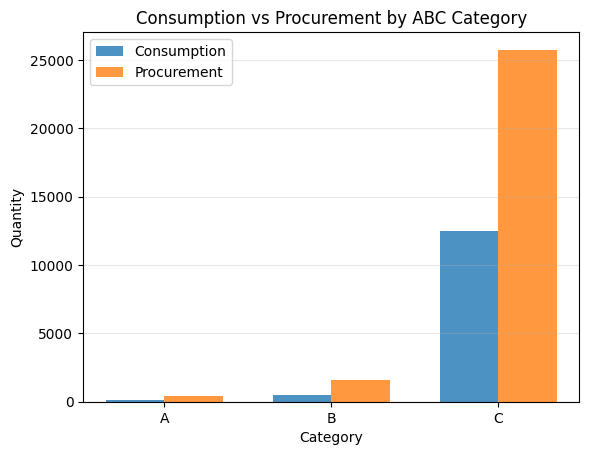

In [ ]:
group_stats = final_long_df.groupby('CategoryABC').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum',
    'EachPartPrice_consumption': 'mean'
}).fillna(0)

x = np.arange(len(group_stats.index))
width = 0.35

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Category')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by ABC Category')
plt.xticks(x, group_stats.index)
plt.legend()
plt.grid(axis='y', alpha=0.3)

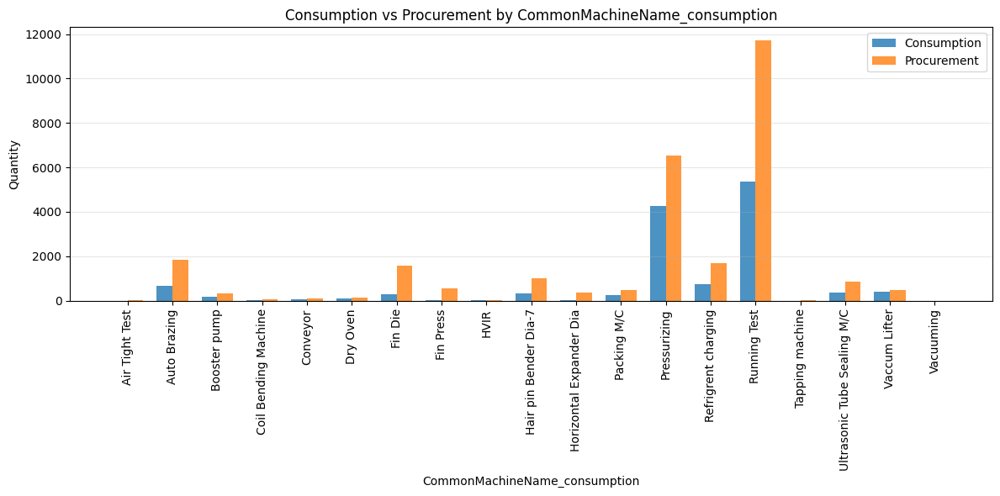

In [ ]:
group_stats = final_long_df.groupby('CommonMachineName_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('CommonMachineName_consumption')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by CommonMachineName_consumption')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


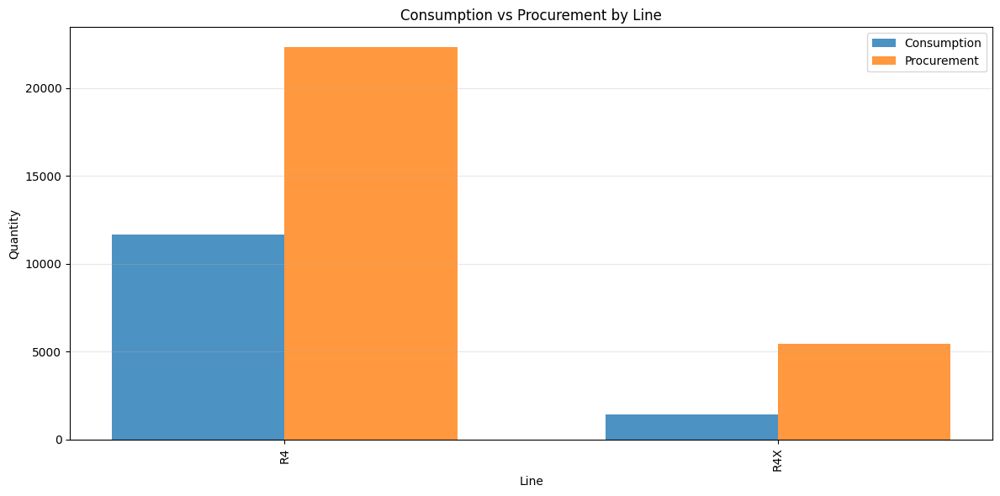

In [ ]:
group_stats = final_long_df.groupby('Line_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Line')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by Line')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


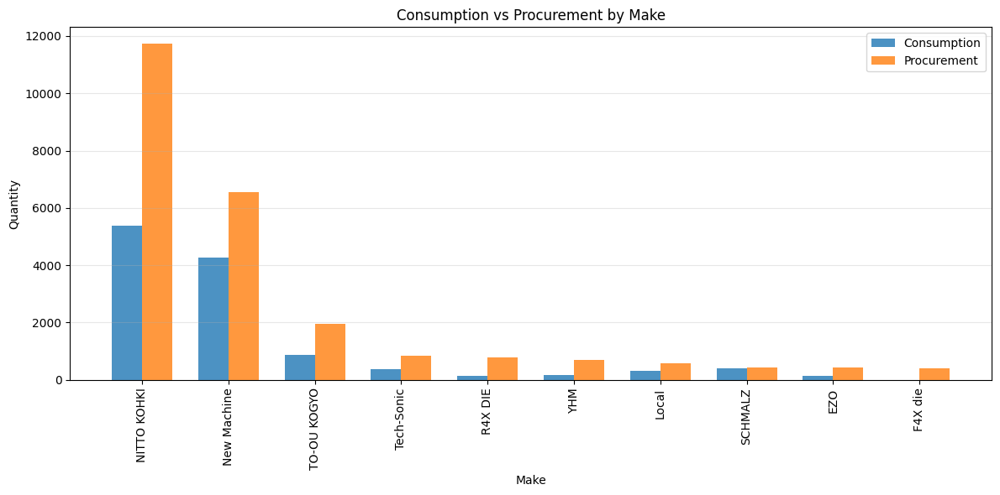

In [ ]:
group_stats = final_long_df.groupby('Make_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0).sort_values(by='PROCUREMENT',ascending=False).head(10)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Make')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by Make')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


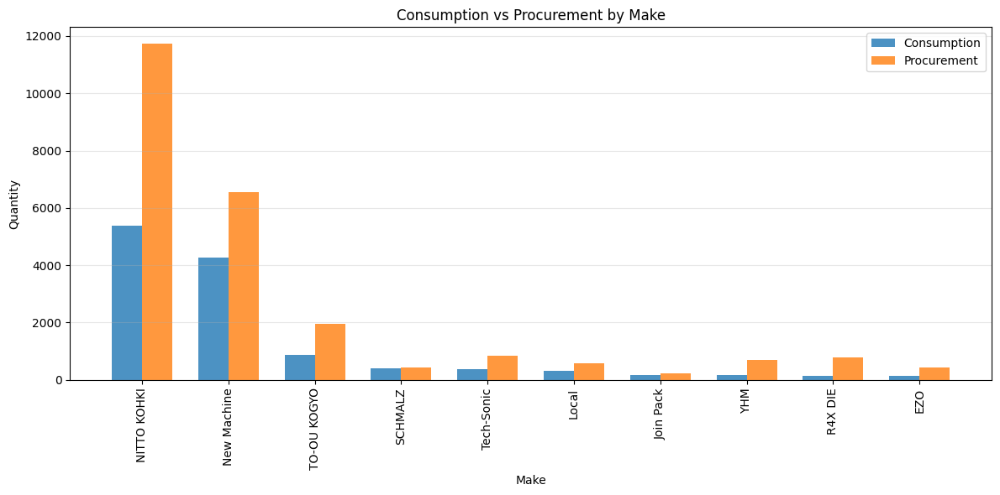

In [ ]:
group_stats = final_long_df.groupby('Make_consumption').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0).sort_values(by='CONSUMPTION',ascending=False).head(10)

x = np.arange(len(group_stats.index))
width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, group_stats['CONSUMPTION'], width, label='Consumption', alpha=0.8)
plt.bar(x + width/2, group_stats['PROCUREMENT'], width, label='Procurement', alpha=0.8)

plt.xlabel('Make')
plt.ylabel('Quantity')
plt.title('Consumption vs Procurement by Make')

# Rotate x labels by 90 degrees
plt.xticks(x, group_stats.index, rotation=90)

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()  # Prevent clipping of labels
plt.show()


In [ ]:
# Step 1: Group by Make
make_sums = final_long_df.groupby('Make_consumption')[['CONSUMPTION', 'PROCUREMENT']].sum()

# Step 2: Classification
def classify(row):
    if row['CONSUMPTION'] > row['PROCUREMENT']:
        return 'More Consumption'
    elif row['CONSUMPTION'] < row['PROCUREMENT']:
        return 'More Procurement'
    else:
        return 'Equal'

make_sums['Comparison'] = make_sums.apply(classify, axis=1)

# Step 3: Count of Makes in each group
result = make_sums['Comparison'].value_counts()

print(result)

Comparison
More Procurement    58
More Consumption     6
Equal                2
Name: count, dtype: int64


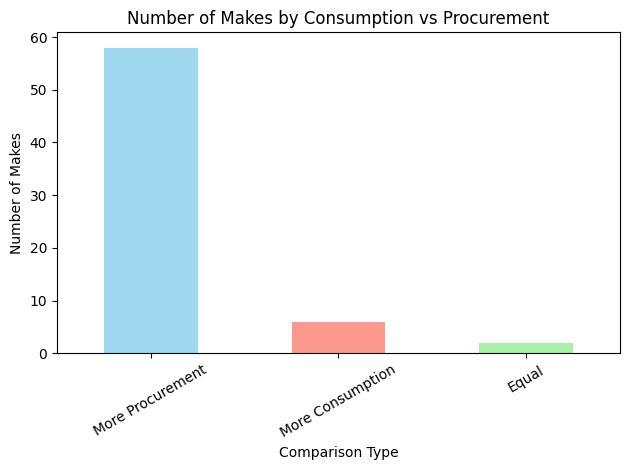

In [ ]:
result.plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'], alpha=0.8)

plt.title('Number of Makes by Consumption vs Procurement')
plt.ylabel('Number of Makes')
plt.xlabel('Comparison Type')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
# Step 1: Group by Make
make_sums = final_long_df.groupby('CommonMachineName_consumption')[['CONSUMPTION', 'PROCUREMENT']].sum()

# Step 2: Classification
def classify(row):
    if row['CONSUMPTION'] > row['PROCUREMENT']:
        return 'More Consumption'
    elif row['CONSUMPTION'] < row['PROCUREMENT']:
        return 'More Procurement'
    else:
        return 'Equal'

make_sums['Comparison'] = make_sums.apply(classify, axis=1)

# Step 3: Count of Makes in each group
result = make_sums['Comparison'].value_counts()

print(result)

Comparison
More Procurement    19
Name: count, dtype: int64


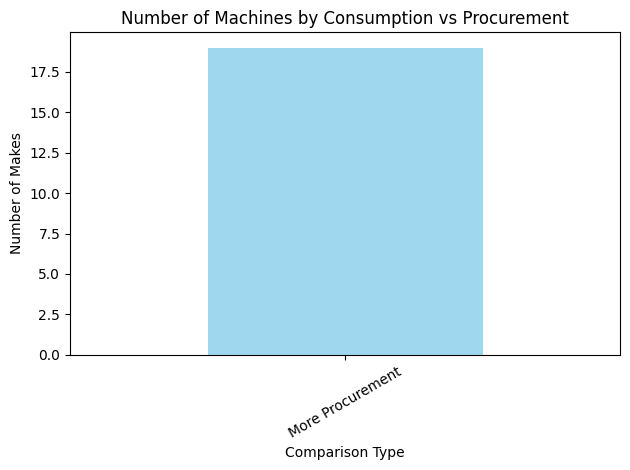

In [ ]:
result.plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'], alpha=0.8)

plt.title('Number of Machines by Consumption vs Procurement')
plt.ylabel('Number of Makes')
plt.xlabel('Comparison Type')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

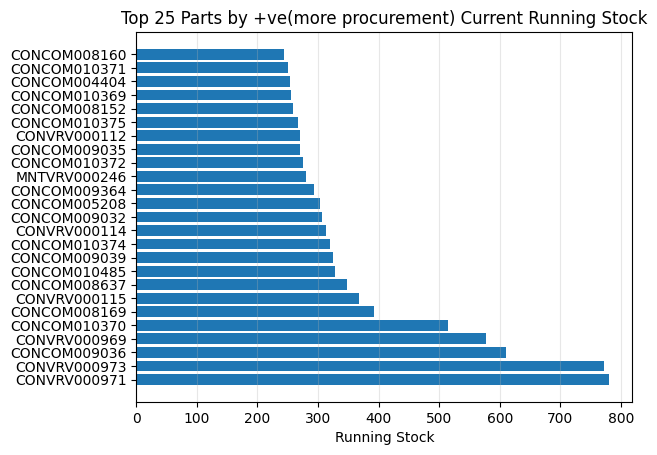

In [ ]:
latest_stock = final_long_df.groupby('PartCode')['Running_Stock'].last().sort_values(ascending=False).head(25)

plt.barh(range(len(latest_stock)), latest_stock.values)
plt.yticks(range(len(latest_stock)), [code[:15] + '...' if len(code) > 15 else code for code in latest_stock.index])
plt.xlabel('Running Stock')
plt.title('Top 25 Parts by +ve(more procurement) Current Running Stock')
plt.grid(axis='x', alpha=0.3)

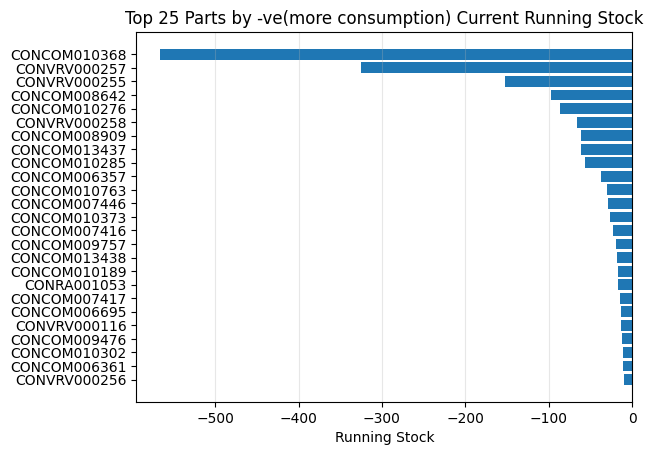

In [ ]:
latest_stock = final_long_df.groupby('PartCode')['Running_Stock'].last().sort_values(ascending=False).tail(25)

plt.barh(range(len(latest_stock)), latest_stock.values)
plt.yticks(range(len(latest_stock)), [code[:15] + '...' if len(code) > 15 else code for code in latest_stock.index])
plt.xlabel('Running Stock')
plt.title('Top 25 Parts by -ve(more consumption) Current Running Stock')
plt.grid(axis='x', alpha=0.3)

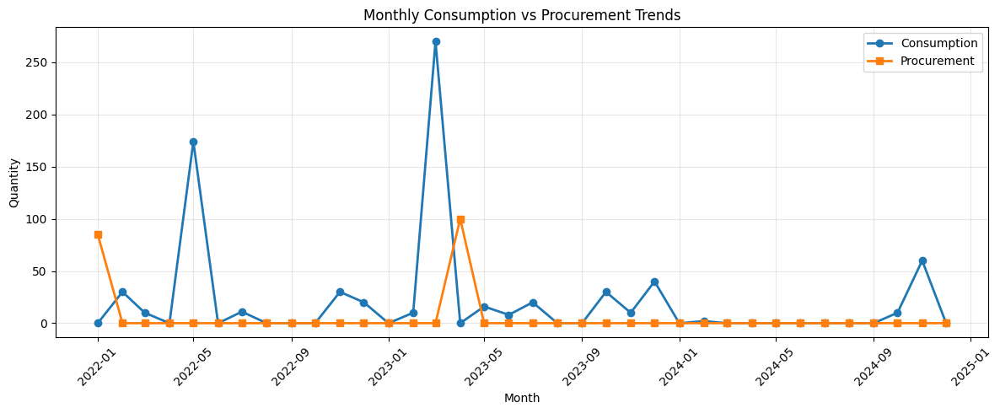

In [ ]:
monthly_trends = final_long_df[final_long_df['PartCode'] == 'CONCOM010368'].groupby('MONTH_YEAR').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
}).fillna(0)

plt.figure(figsize=(12, 5))

plt.plot(monthly_trends.index, monthly_trends['CONSUMPTION'],
         marker='o', label='Consumption', linewidth=2, markersize=6)

plt.plot(monthly_trends.index, monthly_trends['PROCUREMENT'],
         marker='s', label='Procurement', linewidth=2, markersize=6)

plt.xlabel('Month')
plt.ylabel('Quantity')
plt.title('Monthly Consumption vs Procurement Trends')
plt.legend()
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

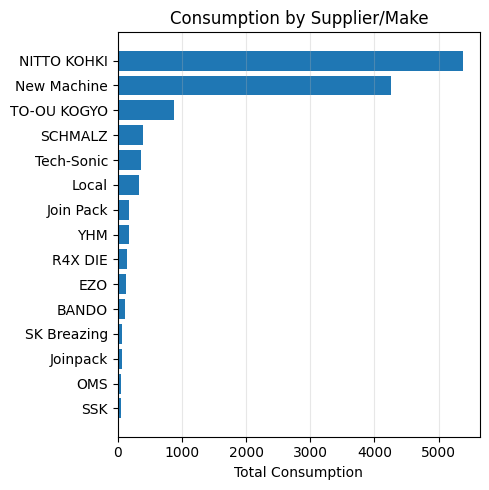

In [ ]:
supplier_analysis = final_long_df.groupby('Make_consumption')['CONSUMPTION'].sum().sort_values(ascending=False).head(15)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total Consumption')
plt.title('Consumption by Supplier/Make')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

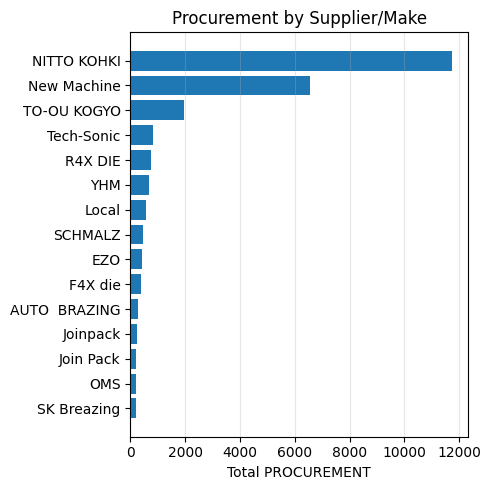

In [ ]:
supplier_analysis = final_long_df.groupby('Make_consumption')['PROCUREMENT'].sum().sort_values(ascending=False).head(15)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total PROCUREMENT')
plt.title('Procurement by Supplier/Make')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

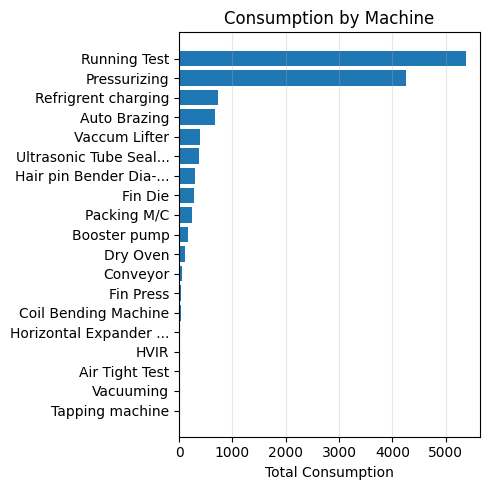

In [ ]:
supplier_analysis = final_long_df.groupby('CommonMachineName_consumption')['CONSUMPTION'].sum().sort_values(ascending=False)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total Consumption')
plt.title('Consumption by Machine')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

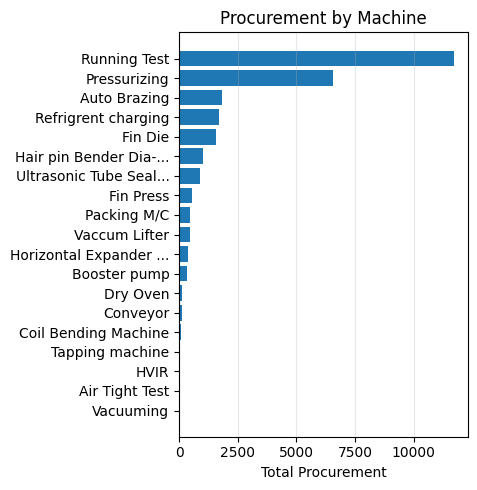

In [ ]:
supplier_analysis = final_long_df.groupby('CommonMachineName_consumption')['PROCUREMENT'].sum().sort_values(ascending=False)
plt.figure(figsize=(5, 5))
plt.barh(range(len(supplier_analysis)), supplier_analysis.values)
plt.yticks(range(len(supplier_analysis)),
          [make[:20] + '...' if len(str(make)) > 20 else str(make) for make in supplier_analysis.index])
plt.xlabel('Total Procurement')
plt.title('Procurement by Machine')
plt.grid(axis='x', alpha=0.3)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

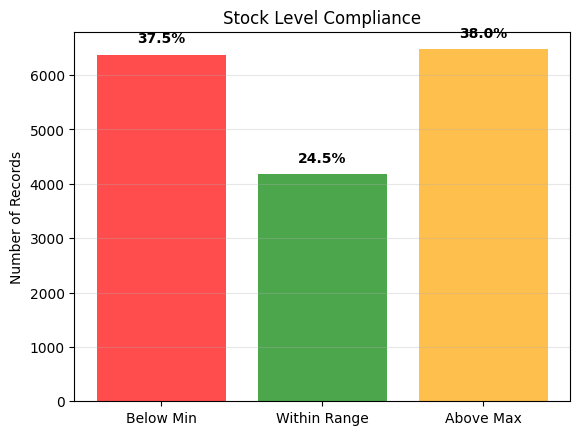

In [ ]:
stock_analysis = final_long_df.dropna(subset=['Running_Stock', 'MinStock', 'MaxStock']).copy()
stock_analysis['Below_Min'] = stock_analysis['Running_Stock'] < stock_analysis['MinStock']
stock_analysis['Above_Max'] = stock_analysis['Running_Stock'] > stock_analysis['MaxStock']
stock_analysis['Within_Range'] = (~stock_analysis['Below_Min']) & (~stock_analysis['Above_Max'])

status_counts = [
    stock_analysis['Below_Min'].sum(),
    stock_analysis['Within_Range'].sum(),
    stock_analysis['Above_Max'].sum()
]

labels = ['Below Min', 'Within Range', 'Above Max']
colors = ['red', 'green', 'orange']

plt.bar(labels, status_counts, color=colors, alpha=0.7)
plt.ylabel('Number of Records')
plt.title('Stock Level Compliance')
plt.grid(axis='y', alpha=0.3)

# Add percentage labels
total = sum(status_counts)
for i, count in enumerate(status_counts):
    plt.text(i, count + total*0.01, f'{count/total*100:.1f}%',
            ha='center', va='bottom', fontweight='bold')


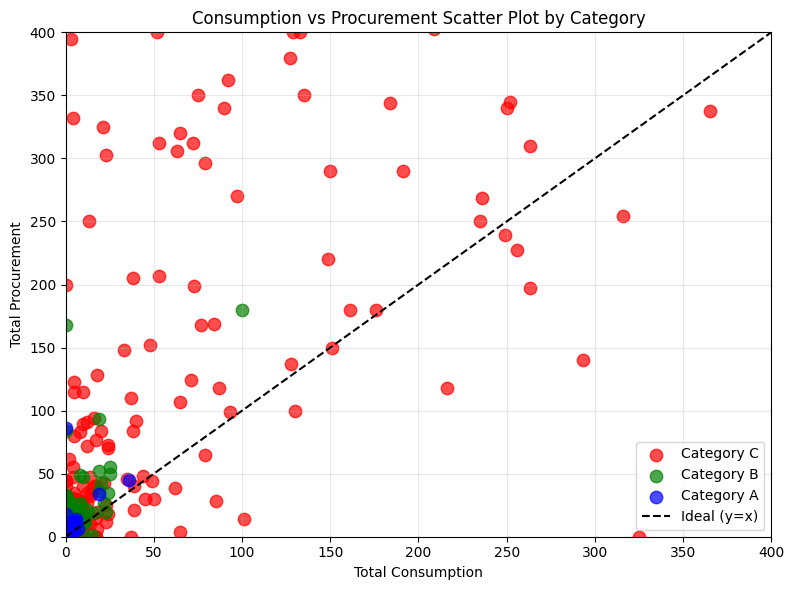

In [ ]:
# Step 1: Aggregate total Consumption and Procurement per PartCode and Category
agg_df = final_long_df.groupby(['PartCode', 'CategoryABC'])[['CONSUMPTION', 'PROCUREMENT']].sum().reset_index()

# Step 2: Scatter plot with 45-degree line
plt.figure(figsize=(8, 6))

# Plot each category as a different color
categories = agg_df['CategoryABC'].unique()
colors = {'A': 'blue', 'B': 'green', 'C': 'red'}

for category in categories:
    subset = agg_df[agg_df['CategoryABC'] == category]
    plt.scatter(subset['CONSUMPTION'], subset['PROCUREMENT'],
                label=f'Category {category}', color=colors.get(category, 'gray'), s=80, alpha=0.7)

# Step 3: 45-degree ideal line (y = x)
max_val = max(agg_df['CONSUMPTION'].max(), agg_df['PROCUREMENT'].max()) + 1
plt.plot([0, max_val], [0, max_val], color='black', linestyle='--', label='Ideal (y=x)')

# Labels and styling
plt.xlabel('Total Consumption')
plt.ylabel('Total Procurement')
plt.title('Consumption vs Procurement Scatter Plot by Category')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.xlim(0, 400)
plt.ylim(0, 400)
plt.show()

In [ ]:
sku_classification_df = classify_sku_demand(final_long_df,sku_col = 'PartCode', period_col = 'MONTH_YEAR',demand_col = 'CONSUMPTION' )


/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:210: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


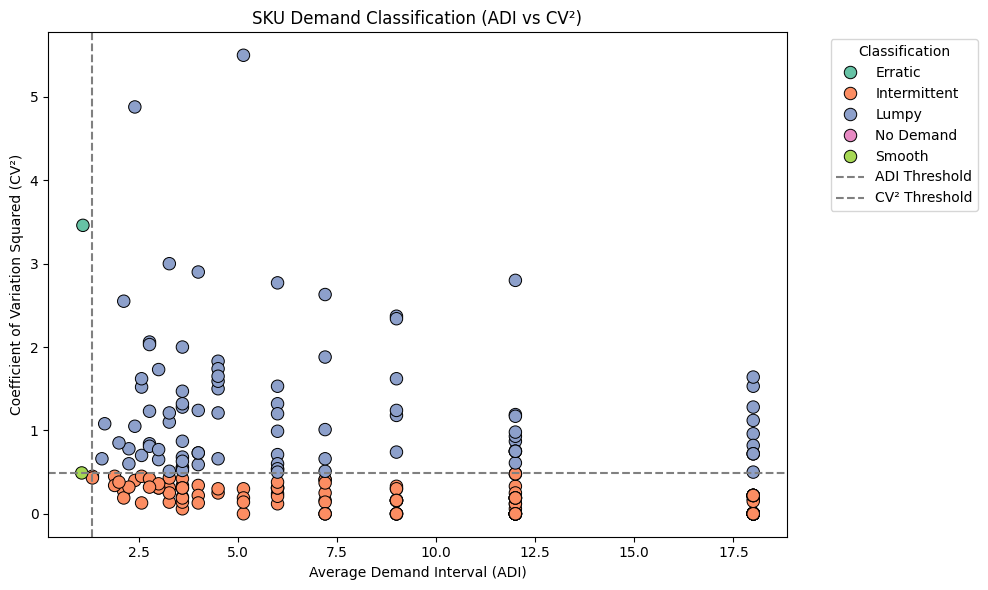

/tmp/ipython-input-78-837779104.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


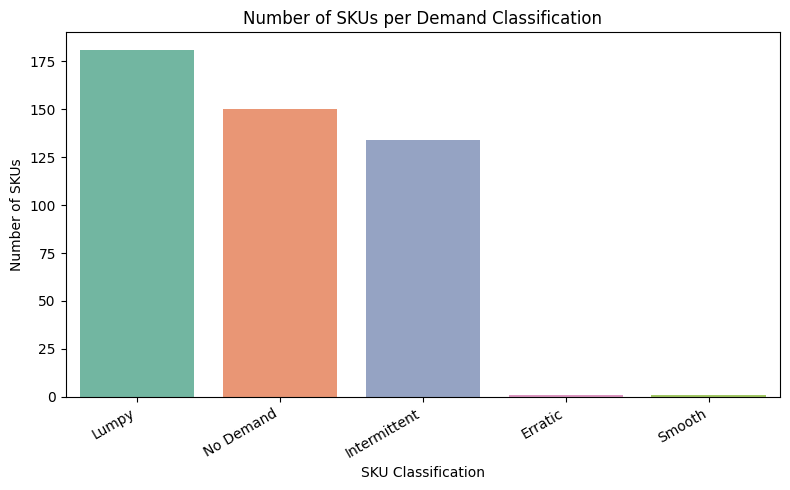

In [ ]:
plot_sku_classification(sku_classification_df)

# Modelling

## Croston/SBA/TSB Baseline Models

In [ ]:
!pip install croston

In [ ]:
final_long_df.columns

Index(['PartCode', 'Description_consumption', 'UOM_consumption',
       'Make_consumption', 'CategoryABC', 'MinStock', 'MaxStock',
       'SAPQty_consumption', 'CommonMachineName_consumption',
       'Line_consumption', 'EachPartPrice_consumption', 'MONTH', 'CONSUMPTION',
       'Description_procurement', 'UOM_procurement', 'Make_procurement',
       'SAPQty_procurement', 'CommonMachineName_procurement',
       'Line_procurement', 'EachPartPrice_procurement', 'PROCUREMENT',
       'MONTH_YEAR', 'Cumulative_Consumption', 'Cumulative_Procurement',
       'Running_Stock', 'partCategory', 'Lag1', 'Lag2', 'Lag3', 'NonZeroLag1',
       'NonZeroLag2', 'MonthsSinceLastDemand', 'RollingMean3', 'RollingStd3',
       'RollingMean6', 'RollingStd6', 'RollingNonZeroMean3',
       'RollingNonZeroStdDev3', 'RollingCV2_3', 'RollingADI3', 'ExpandingCV2',
       'ExpandingADI'],
      dtype='object')

In [ ]:
from croston import croston
from sklearn.metrics import mean_absolute_error, mean_squared_error

ModuleNotFoundError: No module named 'croston'

## SKU filtering with Zero Consumption

In [ ]:
# First sort to ensure months are in order
df_sorted = final_long_df.sort_values(["PartCode", "MONTH_YEAR"])

# Group by SKU and compute sum of first 24 months
sku_sums = (
    df_sorted.groupby("PartCode")
    .apply(lambda g: g.iloc[:24]["CONSUMPTION"].sum())
)

# Keep SKUs where sum > 0
valid_skus = sku_sums[sku_sums > 0].index

# Filter df to only these SKUs
df_filtered = final_long_df[final_long_df["PartCode"].isin(valid_skus)]


/tmp/ipython-input-13-2547808214.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.iloc[:24]["CONSUMPTION"].sum())


In [ ]:
len(df_filtered.columns)

45

In [ ]:
sku_classification_df['Cons_Demand_TD'] = np.where(
    sku_classification_df['SKU'].isin(valid_skus), "Exists", "Nil"
)

In [ ]:
sku_classification_df['Cons_Demand_TD'].value_counts()

,count
Cons_Demand_TD,
Exists,280
Nil,187


## Calculating Non-Zero Demand Percent in Train/Test/Whole Data per SKU

In [ ]:
final_long_df = final_long_df.sort_values(['PartCode', 'MONTH_YEAR'])

In [ ]:

# Group by PartCode
def calculate_nzd_percent(group):
    # Split train (first 24) and test (last 12)
    train = group.head(24)
    test = group.tail(12)
    total = group

    # Calculate NZD % in each period
    nzd_train = (train['CONSUMPTION'] > 0).sum() / 24 * 100
    nzd_test = (test['CONSUMPTION'] > 0).sum() / 12 * 100
    nzd_total = (total['CONSUMPTION'] > 0).sum() / len(total) * 100

    # Assign the same value to all rows in the group
    group['NZD_percent_train'] = nzd_train
    group['NZD_percent_test'] = nzd_test
    group['NZD_percent_total'] = nzd_total

    return group



In [ ]:
final_long_df = final_long_df.groupby('PartCode', group_keys=False).apply(calculate_nzd_percent)

/tmp/ipython-input-12-1450652098.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  final_long_df = final_long_df.groupby('PartCode', group_keys=False).apply(calculate_nzd_percent)


## Extracting SKU wise info

In [ ]:
raw_sku_info = final_long_df[['PartCode', 'CategoryABC', 'EachPartPrice_consumption','NZD_percent_train','NZD_percent_test','NZD_percent_total']].drop_duplicates('PartCode')

In [ ]:
sku_classification_df = sku_classification_df.merge(
    raw_sku_info[['PartCode', 'CategoryABC', 'EachPartPrice_consumption','NZD_percent_train','NZD_percent_test','NZD_percent_total']],
    left_on='SKU',
    right_on='PartCode',
    how='left'
).drop('PartCode', axis=1)

In [ ]:
sku_classification_df

,SKU,ADI,CV2,Classification,MaxNonZeroDemand,MinNonZeroDemand,TotalDemand,ZeroDemandProportion,NonZeroDemandMean,NonZeroDemandStd,Cons_Demand_TD,CategoryABC,EachPartPrice_consumption,NZD_percent_train,NZD_percent_test,NZD_percent_total
0,CONVRV000969,1.09,3.46,Erratic,255.0,1.0,756.0,0.08,22.91,42.62,Exists,C,87.360000,87.500000,100.000000,91.666667
1,CONCOM008774,9.00,0.16,Intermittent,2.0,1.0,5.0,0.89,1.25,0.50,Exists,A,720242.280000,8.333333,16.666667,11.111111
2,CONCOM012889,18.00,0.00,Intermittent,1.0,1.0,2.0,0.94,1.00,0.00,Exists,C,4500.000000,4.166667,8.333333,5.555556
3,CONCOM008160,18.00,0.18,Intermittent,41.0,22.0,63.0,0.94,31.50,13.44,Exists,C,4211.796522,4.166667,8.333333,5.555556
4,CONCOM007552,3.60,0.34,Intermittent,4.0,1.0,19.0,0.72,1.90,1.10,Exists,B,75809.930000,25.000000,33.333333,27.777778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
462,CONCOM008971,NaN,NaN,No Demand,NaN,NaN,0.0,1.00,NaN,NaN,Nil,B,NaN,0.000000,0.000000,0.000000
463,CONCOM010458,NaN,NaN,No Demand,NaN,NaN,0.0,1.00,NaN,NaN,Nil,B,NaN,0.000000,0.000000,0.000000
464,CONCOM017438,NaN,NaN,No Demand,NaN,NaN,0.0,1.00,NaN,NaN,Nil,A,NaN,0.000000,0.000000,0.000000
465,CONCOM017439,NaN,NaN,No Demand,NaN,NaN,0.0,1.00,NaN,NaN,Nil,C,NaN,0.000000,0.000000,0.000000


## Distribution of Zero Consumed Vs Non-Zero Consumed SKUs

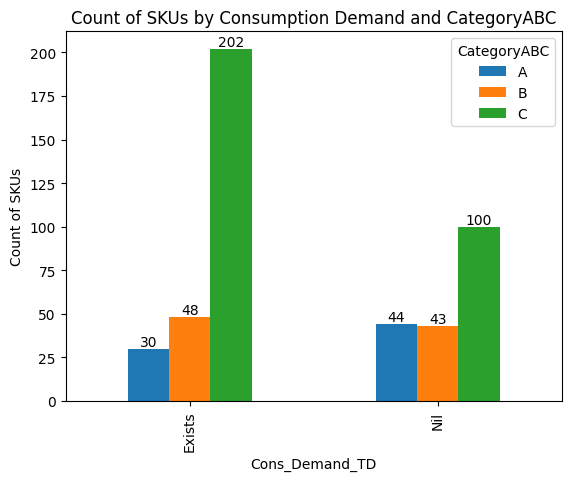

In [ ]:
# Group by Cons_Demand_TD and CategoryABC
counts = sku_classification_df.groupby(['Cons_Demand_TD', 'CategoryABC'])['SKU'].count().unstack(fill_value=0)

# Plot
ax = counts.plot(kind='bar', stacked=False)
plt.xlabel('Cons_Demand_TD')
plt.ylabel('Count of SKUs')
plt.title('Count of SKUs by Consumption Demand and CategoryABC')
plt.legend(title='CategoryABC')

# Add data labels
for container in ax.containers:
    ax.bar_label(container, label_type='edge')

plt.show()

## Basic Croston Using croston library

In [ ]:
df = df_filtered.copy()
df["Croston_Pred"] = np.nan  # Initialize column with NaNs

# Prepare a metrics DataFrame to store results per SKU
metrics_list = []

# Group by SKU and apply Croston per SKU
for sku, group in df.groupby("PartCode"):
    print(sku)
    demand_series = group.sort_values("MONTH_YEAR")["CONSUMPTION"].values
    print(demand_series)
    # Split into training (first 24 months) and test (last 12 months)
    train_series = demand_series[:24]
    test_series = demand_series[24:]

    # Apply Croston method
    result = croston.fit_croston(train_series, forecast_length=12)

    # Extract forecast for test period
    if y_pred is None:
      y_pred = np.zeros_like(y_true)
    else:
      y_pred = result["croston_forecast"]  # This is already 12 values
    #alpha_used = result["alpha"]
    y_pred = np.array(y_pred, dtype=float).flatten()
    print(y_pred)
    y_true = test_series

    # Naive forecast errors for scaling (for MASE & MSSE)
    naive_forecast_errors = np.abs(np.diff(train_series))
    naive_mae = naive_forecast_errors.mean() if len(naive_forecast_errors) > 0 else 1
    naive_mse = (naive_forecast_errors**2).mean() if len(naive_forecast_errors) > 0 else 1

    # Metrics
    print(f"y-pred : {y_pred}")
    print(f"y-true : {y_true}")
    # Add predictions back to df (for test period only)

    # Check if y_pred is NaN or all NaNs
    if y_pred is None or np.all(np.isnan(y_pred)):
        mase = np.nan
        msse = np.nan
        mae_nz = np.nan
        mape_id = np.nan
    else:
        # Compute metrics safely
        df.loc[group.index[24:], "Croston_Pred"] = y_pred
        mase = mean_absolute_error(y_true, y_pred) / naive_mae
        msse = mean_squared_error(y_true, y_pred) / naive_mse

        non_zero_indices = y_true > 0
        mae_nz = (mean_absolute_error(y_true[non_zero_indices], y_pred[non_zero_indices])
                  if non_zero_indices.any() else np.nan)

        mape_id = (np.abs(y_true - y_pred) / np.where(y_true == 0, 1, y_true)).mean() * 100


    metrics_list.append({
        "PartCode": sku,
        "MASE": mase,
        "MAE-NZ": mae_nz,
        "MAPE-ID": mape_id,
        "MSSE": msse
        #"Alpha Used": alpha
    })

# Create a DataFrame of metrics per SKU
metrics_df = pd.DataFrame(metrics_list)
metrics_df


CONCOM002378
[5. 1. 2. 0. 1. 0. 0. 0. 0. 0. 0. 0. 6. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0.
 0. 0. 2. 1. 0. 0. 3. 0. 0. 0. 0. 1.]
[0.2497149 0.2497149 0.2497149 0.2497149 0.2497149 0.2497149 0.2497149
 0.2497149 0.2497149 0.2497149 0.2497149 0.2497149]
y-pred : [0.2497149 0.2497149 0.2497149 0.2497149 0.2497149 0.2497149 0.2497149
 0.2497149 0.2497149 0.2497149 0.2497149 0.2497149]
y-true : [0. 0. 2. 1. 0. 0. 3. 0. 0. 0. 0. 1.]
CONCOM003449
[4. 1. 0. 0. 0. 0. 0. 0. 0. 0. 4. 2. 0. 0. 2. 0. 0. 0. 0. 0. 2. 0. 1. 2.
 2. 0. 0. 0. 2. 0. 0. 0. 0. 1. 0. 0.]
[0.78270192 0.78270192 0.78270192 0.78270192 0.78270192 0.78270192
 0.78270192 0.78270192 0.78270192 0.78270192 0.78270192 0.78270192]
y-pred : [0.78270192 0.78270192 0.78270192 0.78270192 0.78270192 0.78270192
 0.78270192 0.78270192 0.78270192 0.78270192 0.78270192 0.78270192]
y-true : [2. 0. 0. 0. 2. 0. 0. 0. 0. 1. 0. 0.]
CONCOM003805
[12.  0.  0.  0.  0.  0.  1.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.
  0. 13.  0.  0.  0.  0.  0.  0.  0.  

,PartCode,MASE,MAE-NZ,MAPE-ID,MSSE
0,CONCOM002378,0.613246,1.500285,44.084947,0.227996
1,CONCOM003449,0.844746,0.883965,70.657612,0.314202
2,CONCOM003805,0.721170,1.055556,127.006172,0.091909
3,CONCOM004179,0.632716,1.014493,63.043477,0.152975
4,CONCOM004400,0.718750,12.152403,221.977670,0.265974
...,...,...,...,...,...
275,MNTVRV000179,1.008117,0.363636,61.363636,0.089707
276,MNTVRV000231,0.799496,0.724584,31.284631,0.200426
277,MNTVRV000246,2.601190,4.833333,58.958332,3.535920
278,MNTVRV000247,4.723214,2.857143,33.888889,15.656037


## Using statsforecast library for Croston/SBA/TSB

In [ ]:
!pip install statsforecast


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 340.0/340.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.8/285.8 kB 25.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 13.5 MB/s eta 0:00:00


In [ ]:
!pip install numba

In [ ]:
from statsforecast import StatsForecast
from statsforecast.models import CrostonClassic, CrostonOptimized, CrostonSBA, TSB
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:

# Initialize forecast models
models = [
    CrostonClassic(),
    CrostonSBA(),
    TSB(alpha_d=0.1, alpha_p=0.1)
]

# Prepare your DataFrame
df = df_filtered.copy()
df["MONTH_YEAR"] = pd.to_datetime(df["MONTH_YEAR"])
df = df.sort_values(["PartCode", "MONTH_YEAR"])

# StatsForecast requires: unique_id (SKU), ds (date), y (value)
sf_df = df.rename(columns={
    "PartCode": "unique_id",
    "MONTH_YEAR": "ds",
    "CONSUMPTION": "y"
})[["unique_id", "ds", "y"]]

# Split into training (first 24 months) and test (last 12 months)
train_df = sf_df.groupby("unique_id").head(24)
test_df = sf_df.groupby("unique_id").tail(12)

# Create StatsForecast object
sf = StatsForecast(models=models, freq='MS', n_jobs=-1)

# Fit on training data
sf.fit(train_df)

# Forecast next 12 months
forecasts_df = sf.predict(h=12)

# Rename prediction columns for clarity
forecasts_df.rename(columns={
    'CrostonClassic': 'Croston_Pred',
    'CrostonSBA': 'SBA_Pred',
    'TSB': 'TSB_Pred'
}, inplace=True)

# Merge predictions back into original df
df = df.merge(
    forecasts_df[["unique_id", "ds", "Croston_Pred", "SBA_Pred", "TSB_Pred"]],
    how='left',
    left_on=['PartCode', 'MONTH_YEAR'],
    right_on=['unique_id', 'ds']
)

# Drop extra merge columns
df.drop(['unique_id', 'ds'], axis=1, inplace=True)

# Initialize metrics list
metrics_list = []

# Metrics computation function
def compute_metrics(y_true, y_pred, train_series):
    if y_pred is None or np.all(np.isnan(y_pred)):
        return np.nan, np.nan, np.nan, np.nan
    naive_forecast_errors = np.abs(np.diff(train_series))
    naive_mae = naive_forecast_errors.mean() if len(naive_forecast_errors) > 0 else 1
    naive_mse = (naive_forecast_errors**2).mean() if len(naive_forecast_errors) > 0 else 1
    mase = mean_absolute_error(y_true, y_pred) / naive_mae
    msse = mean_squared_error(y_true, y_pred) / naive_mse
    non_zero_indices = y_true > 0
    mae_nz = (mean_absolute_error(y_true[non_zero_indices], y_pred[non_zero_indices])
              if non_zero_indices.any() else np.nan)
    mape_id = (np.abs(y_true - y_pred) / np.where(y_true == 0, 1, y_true)).mean() * 100
    return mase, mae_nz, mape_id, msse

# Compute metrics per SKU
for sku, group in df.groupby("PartCode"):
    # Get test period true values
    test_mask = group["MONTH_YEAR"].isin(test_df[test_df['unique_id'] == sku]["ds"])
    y_true = group.loc[test_mask, "CONSUMPTION"].values
    train_series = group.loc[~test_mask, "CONSUMPTION"].values

    # Assign predictions for each model
    y_pred_c = group.loc[test_mask, "Croston_Pred"].values
    y_pred_s = group.loc[test_mask, "SBA_Pred"].values
    y_pred_t = group.loc[test_mask, "TSB_Pred"].values

    # Compute metrics per model
    mase_c, mae_nz_c, mape_id_c, msse_c = compute_metrics(y_true, y_pred_c, train_series)
    mase_s, mae_nz_s, mape_id_s, msse_s = compute_metrics(y_true, y_pred_s, train_series)
    mase_t, mae_nz_t, mape_id_t, msse_t = compute_metrics(y_true, y_pred_t, train_series)

    metrics_list.append({
        "PartCode": sku,

        "Croston_MASE": mase_c,
        "Croston_MAE-NZ": mae_nz_c,
        "Croston_MAPE-ID": mape_id_c,
        "Croston_MSSE": msse_c,

        "SBA_MASE": mase_s,
        "SBA_MAE-NZ": mae_nz_s,
        "SBA_MAPE-ID": mape_id_s,
        "SBA_MSSE": msse_s,

        "TSB_MASE": mase_t,
        "TSB_MAE-NZ": mae_nz_t,
        "TSB_MAPE-ID": mape_id_t,
        "TSB_MSSE": msse_t
    })

# Create a DataFrame of metrics per SKU
metrics_df = pd.DataFrame(metrics_list)


In [ ]:
metrics_df

,PartCode,Croston_MASE,Croston_MAE-NZ,Croston_MAPE-ID,Croston_MSSE,SBA_MASE,SBA_MAE-NZ,SBA_MAPE-ID,SBA_MSSE,TSB_MASE,TSB_MAE-NZ,TSB_MAPE-ID,TSB_MSSE
0,CONCOM002378,1.203336,0.750000,121.226216,0.428066,1.154669,0.750000,115.164905,0.393906,0.824219,0.812328,73.705309,0.231179
1,CONCOM003449,1.228242,0.537580,112.377868,0.671618,1.179898,0.560701,107.175641,0.614191,1.188528,0.556573,108.104327,0.624131
2,CONCOM003805,1.959488,1.665253,359.363075,0.699425,1.850624,1.456990,340.561588,0.628461,0.925236,0.500000,171.479455,0.163305
3,CONCOM004179,0.687571,0.885702,70.556261,0.171677,0.670940,0.924750,68.278448,0.165158,0.665804,0.936809,67.575025,0.163295
4,CONCOM004400,0.718750,12.483654,207.171605,0.270616,0.718750,12.659471,199.313024,0.273224,0.718750,12.967496,185.545097,0.278036
...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,MNTVRV000179,0.935516,0.416667,56.944444,0.076601,0.895585,0.445833,54.513889,0.069956,0.407566,0.802299,24.808390,0.020998
276,MNTVRV000231,0.953385,0.652324,37.306359,0.258778,0.916364,0.669708,35.857708,0.243053,0.774036,0.736540,30.288351,0.192553
277,MNTVRV000246,2.565303,4.877023,55.991100,3.565552,2.546561,4.899838,54.441545,3.581628,2.438182,5.031778,45.480632,3.682692
278,MNTVRV000247,4.591626,2.902913,31.040992,15.987654,4.577670,2.907767,30.738943,16.024238,4.496962,2.935839,28.992222,16.241118


## Merge SKU info matrix with Croston Metrics Matrix

In [ ]:
sku_analysis_matrix_croston = sku_classification_df.merge(
    metrics_df,
    left_on='SKU',
    right_on='PartCode',
    how='left'
).drop('PartCode', axis=1)

NameError: name 'metrics_df' is not defined

In [ ]:
sku_analysis_matrix_croston.shape

(467, 22)

In [ ]:
sku_analysis_matrix_croston[(sku_analysis_matrix_croston['Cons_Demand_TD']=='Exists') & (sku_analysis_matrix_croston['Croston_MASE'].isna())]

,SKU,ADI,CV2,Classification,Cons_Demand_TD,CategoryABC,EachPartPrice_consumption,NZD_percent_train,NZD_percent_test,NZD_percent_total,...,Croston_MAPE-ID,Croston_MSSE,SBA_MASE,SBA_MAE-NZ,SBA_MAPE-ID,SBA_MSSE,TSB_MASE,TSB_MAE-NZ,TSB_MAPE-ID,TSB_MSSE


In [ ]:
sku_analysis_matrix_croston.columns

Index(['SKU', 'ADI', 'CV2', 'Classification', 'Cons_Demand_TD', 'CategoryABC',
       'EachPartPrice_consumption', 'NZD_percent_train', 'NZD_percent_test',
       'NZD_percent_total', 'Croston_MASE', 'Croston_MAE-NZ',
       'Croston_MAPE-ID', 'Croston_MSSE', 'SBA_MASE', 'SBA_MAE-NZ',
       'SBA_MAPE-ID', 'SBA_MSSE', 'TSB_MASE', 'TSB_MAE-NZ', 'TSB_MAPE-ID',
       'TSB_MSSE'],
      dtype='object')

In [ ]:
sku_analysis_matrix_croston.head()

,SKU,ADI,CV2,Classification,Cons_Demand_TD,CategoryABC,EachPartPrice_consumption,NZD_percent_train,NZD_percent_test,NZD_percent_total,...,Croston_MAPE-ID,Croston_MSSE,SBA_MASE,SBA_MAE-NZ,SBA_MAPE-ID,SBA_MSSE,TSB_MASE,TSB_MAE-NZ,TSB_MAPE-ID,TSB_MSSE
0,CONVRV000969,1.09,3.46,Erratic,Exists,C,87.360000,87.500000,100.000000,91.666667,...,196.374581,38.401412,3.194444,29.166667,186.555852,38.630951,3.194444,29.166667,197.244114,38.381436
1,CONCOM008774,9.00,0.16,Intermittent,Exists,A,720242.280000,8.333333,16.666667,11.111111,...,25.747863,2.121754,1.904380,1.378205,25.293803,2.130969,1.811929,1.402323,23.585467,2.169871
2,CONCOM012889,18.00,0.00,Intermittent,Exists,C,4500.000000,4.166667,8.333333,5.555556,...,12.121212,0.894972,1.372159,0.956818,11.931818,0.897012,1.734583,0.919000,15.083333,0.878535
3,CONCOM008160,18.00,0.18,Intermittent,Exists,C,4211.796522,4.166667,8.333333,5.555556,...,231.910569,3.073516,2.797559,38.677778,220.731707,3.079518,1.983297,40.547040,49.762646,3.259758
4,CONCOM007552,3.60,0.34,Intermittent,Exists,B,75809.930000,25.000000,33.333333,27.777778,...,62.870512,0.651961,0.964313,1.358621,61.393653,0.652228,0.866194,1.627382,49.635368,0.692513


In [ ]:
sku_analysis_matrix_croston.shape

(467, 22)

## Single SKU plots

In [ ]:
def plot_single_sku(sku):
  monthly_trends = final_long_df[final_long_df['PartCode'] == sku].groupby('MONTH_YEAR').agg({
    'CONSUMPTION': 'sum',
    'PROCUREMENT': 'sum'
  }).fillna(0)

  plt.figure(figsize=(12, 5))

  plt.plot(monthly_trends.index, monthly_trends['CONSUMPTION'],
          marker='o', label='Consumption', linewidth=2, markersize=6)

  plt.plot(monthly_trends.index, monthly_trends['PROCUREMENT'],
          marker='s', label='Procurement', linewidth=2, markersize=6)

  plt.xlabel('Month')
  plt.ylabel('Quantity')
  plt.title('Monthly Consumption vs Procurement Trends')
  plt.legend()
  plt.xticks(rotation=45)
  plt.grid(alpha=0.3)
  plt.tight_layout()
  plt.show()

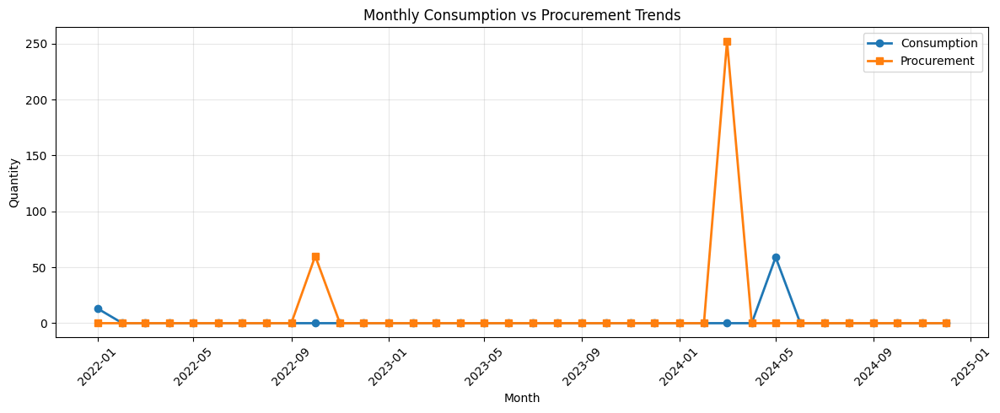

In [ ]:
plot_single_sku('CONCOM008153')

## Metrics for intermittent Demand

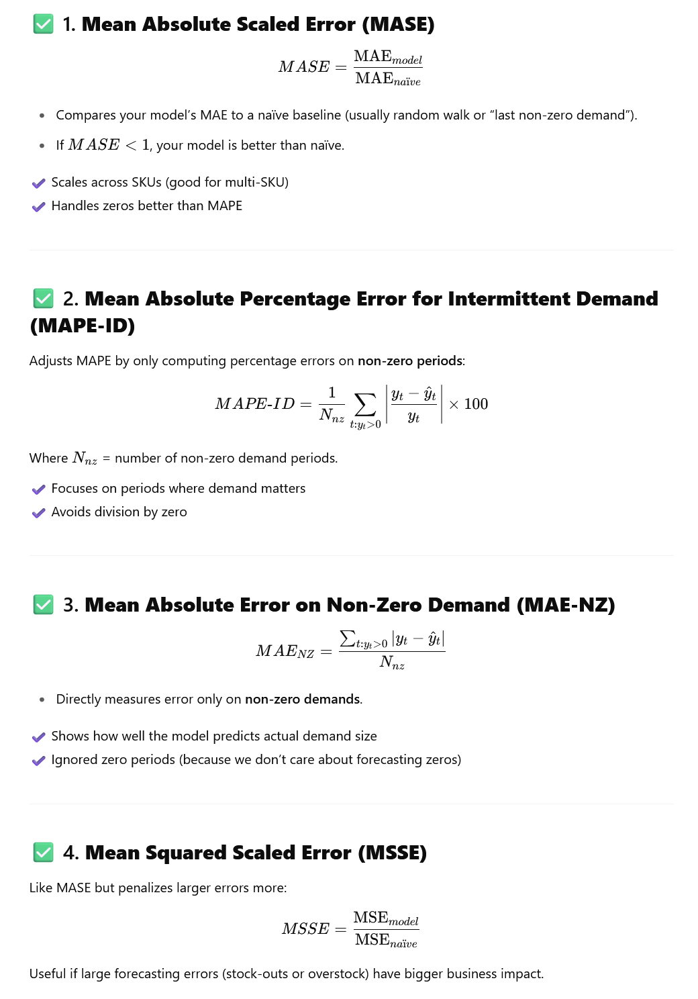

## Metrics Histogram

In [ ]:
from matplotlib.ticker import MaxNLocator

/tmp/ipython-input-119-4072991239.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(title='CategoryABC')


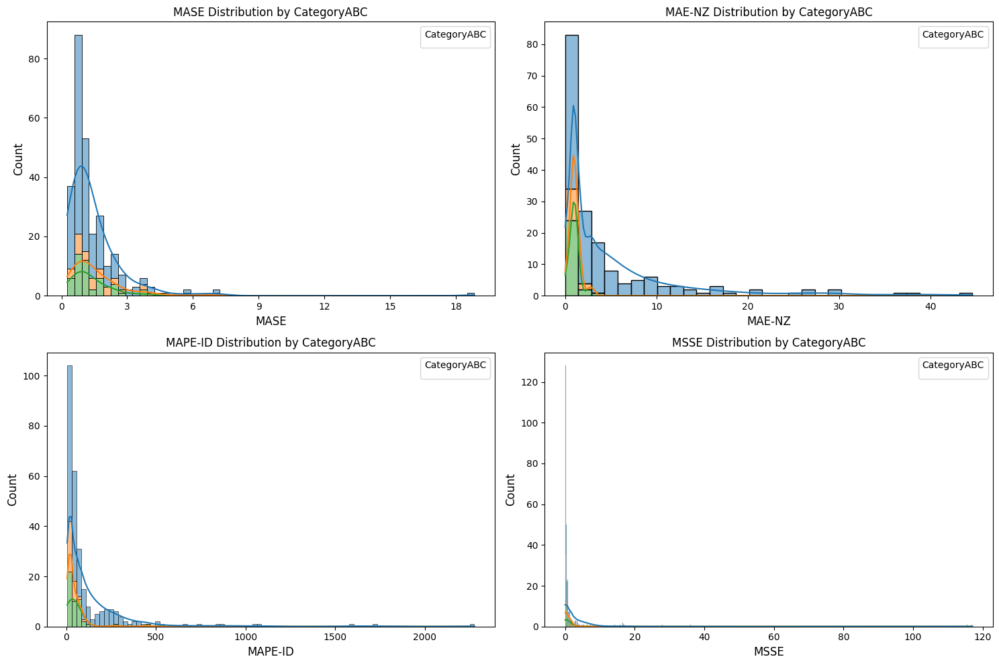

In [ ]:


# Set up 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # Adjust figsize for 2x2
axes = axes.flatten()  # Flatten 2D array to 1D for easier indexing

# Histogram 1: MASE
sns.histplot(data=sku_analysis_matrix_croston_filtered, x='MASE', hue='CategoryABC',
             multiple='stack', kde=True, ax=axes[0])
axes[0].set_title('MASE Distribution by CategoryABC')
axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))

# Histogram 2: MAE-NZ
sns.histplot(data=sku_analysis_matrix_croston_filtered, x='MAE-NZ', hue='CategoryABC',
             multiple='stack', kde=True, ax=axes[1])
axes[1].set_title('MAE-NZ Distribution by CategoryABC')

# Histogram 3: MAPE-ID
sns.histplot(data=sku_analysis_matrix_croston_filtered, x='MAPE-ID', hue='CategoryABC',
             multiple='stack', kde=True, ax=axes[2])
axes[2].set_title('MAPE-ID Distribution by CategoryABC')

# Histogram 4: MSSE
sns.histplot(data=sku_analysis_matrix_croston_filtered, x='MSSE', hue='CategoryABC',
             multiple='stack', kde=True, ax=axes[3])
axes[3].set_title('MSSE Distribution by CategoryABC')

# Styling
for ax in axes:
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.legend(title='CategoryABC')

plt.tight_layout()
plt.show()


In [ ]:
sku_analysis_matrix_croston_filtered = sku_analysis_matrix_croston[sku_analysis_matrix_croston['Cons_Demand_TD'] == 'Exists']

NameError: name 'sku_analysis_matrix_croston' is not defined

## MASE Vs (ADI,CV2,NZDP) plots

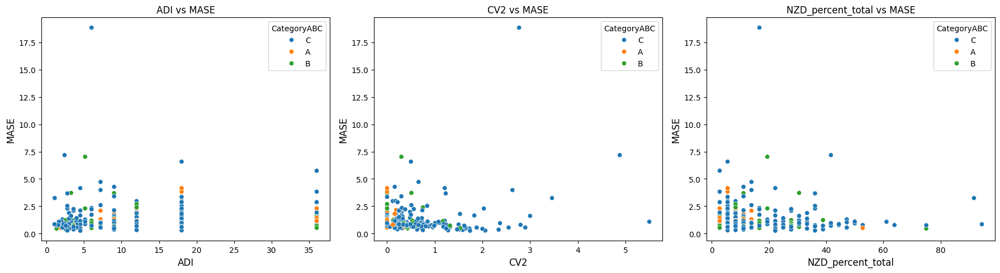

In [ ]:
# Set up 1x3 subplot grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
# Scatter plot 1: ADI vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='ADI', y='MASE', hue='CategoryABC', ax=axes[0])
axes[0].set_title('ADI vs MASE')

# Scatter plot 2: CV2 vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='CV2', y='MASE', hue='CategoryABC', ax=axes[1])
axes[1].set_title('CV2 vs MASE')

# Scatter plot 3: NZD_percent_total vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='NZD_percent_total', y='MASE', hue='CategoryABC', ax=axes[2])
axes[2].set_title('NZD_percent_total vs MASE')

# General styling
for ax in axes:
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12)
    ax.legend(title='CategoryABC')

plt.tight_layout()
plt.show()

## MAPE-ID Vs (ADI,CV2,NZDP) plots

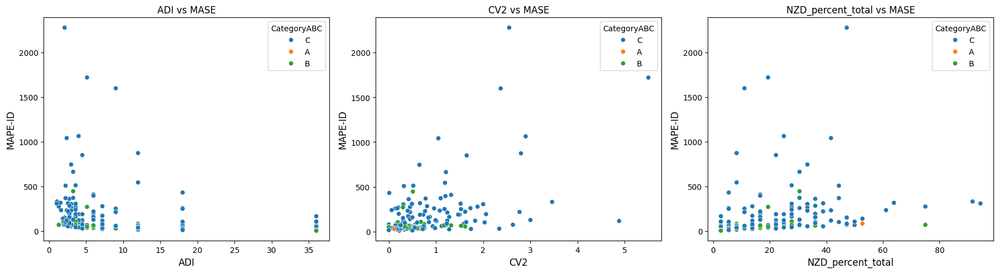

In [ ]:
# Set up 1x3 subplot grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
# Scatter plot 1: ADI vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='ADI', y='MAPE-ID', hue='CategoryABC', ax=axes[0])
axes[0].set_title('ADI vs MAPE-ID')

# Scatter plot 2: CV2 vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='CV2', y='MAPE-ID', hue='CategoryABC', ax=axes[1])
axes[1].set_title('CV2 vs MAPE-ID')

# Scatter plot 3: NZD_percent_total vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='NZD_percent_total', y='MAPE-ID', hue='CategoryABC', ax=axes[2])
axes[2].set_title('NZD_percent_total vs MAPE-ID')

# General styling
for ax in axes:
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12)
    ax.legend(title='CategoryABC')

plt.tight_layout()
plt.show()

## MAE-NZ Vs (ADI,CV2,NZDP) plots

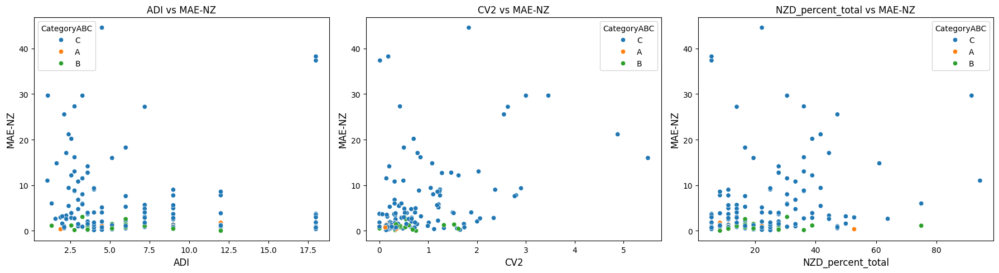

In [ ]:
# Set up 1x3 subplot grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
# Scatter plot 1: ADI vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='ADI', y='MAE-NZ', hue='CategoryABC', ax=axes[0])
axes[0].set_title('ADI vs MAE-NZ')

# Scatter plot 2: CV2 vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='CV2', y='MAE-NZ', hue='CategoryABC', ax=axes[1])
axes[1].set_title('CV2 vs MAE-NZ')

# Scatter plot 3: NZD_percent_total vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='NZD_percent_total', y='MAE-NZ', hue='CategoryABC', ax=axes[2])
axes[2].set_title('NZD_percent_total vs MAE-NZ')

# General styling
for ax in axes:
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12)
    ax.legend(title='CategoryABC')

plt.tight_layout()
plt.show()

## MSSE Vs (ADI,CV2,NZDP) plots

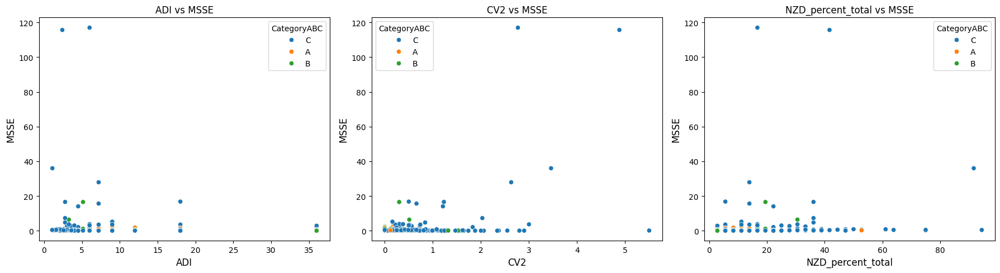

In [ ]:
# Set up 1x3 subplot grid
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
# Scatter plot 1: ADI vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='ADI', y='MSSE', hue='CategoryABC', ax=axes[0])
axes[0].set_title('ADI vs MSSE')

# Scatter plot 2: CV2 vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='CV2', y='MSSE', hue='CategoryABC', ax=axes[1])
axes[1].set_title('CV2 vs MSSE')

# Scatter plot 3: NZD_percent_total vs MASE
sns.scatterplot(data=sku_analysis_matrix_croston_filtered, x='NZD_percent_total', y='MSSE', hue='CategoryABC', ax=axes[2])
axes[2].set_title('NZD_percent_total vs MSSE')

# General styling
for ax in axes:
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12)
    ax.legend(title='CategoryABC')

plt.tight_layout()
plt.show()

In [ ]:
sku_analysis_matrix_croston_filtered[sku_analysis_matrix_croston_filtered['MASE']<1].sort_values('MASE')

,SKU,ADI,CV2,Classification,Cons_Demand_TD,CategoryABC,EachPartPrice_consumption,NZD_percent_train,NZD_percent_test,NZD_percent_total,MASE,MAE-NZ,MAPE-ID,MSSE
315,CONCOM009419,4.50,1.74,Lumpy,Exists,C,3515.177778,29.166667,8.333333,22.222222,0.258013,0.750000,29.166666,0.016872
254,CONCOM007446,2.77,2.06,Lumpy,Exists,C,161.000000,25.000000,58.333333,36.111111,0.275830,2.714286,194.166651,0.022323
241,CONCOM005891,18.00,1.28,Lumpy,Exists,C,2207.630000,8.333333,0.000000,5.555556,0.287500,NaN,24.999999,0.008765
168,CONCOM010281,12.00,0.75,Lumpy,Exists,C,158.145000,12.500000,0.000000,8.333333,0.317066,NaN,33.085169,0.017484
160,CONCOM010286,4.50,1.59,Lumpy,Exists,C,676.151250,25.000000,16.666667,22.222222,0.329427,0.500000,87.499996,0.026553
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,CONCOM010284,7.20,1.01,Lumpy,Exists,C,632.728000,16.666667,8.333333,13.888889,0.974756,1.774294,117.284936,0.146157
195,CONCOM012738,18.00,0.72,Lumpy,Exists,C,2170.000000,4.166667,8.333333,5.555556,0.976763,0.692308,33.974359,0.091084
161,CONCOM010285,3.27,1.10,Lumpy,Exists,C,631.618889,41.666667,8.333333,30.555556,0.977124,8.000000,372.222186,0.281518
31,CONCOM012459,12.00,0.00,Intermittent,Exists,C,9420.570000,12.500000,0.000000,8.333333,1.000000,NaN,13.043478,0.130435


## Metrics Thresholds

MASE (Mean Absolute Scaled Error)

* Excellent (Croston sufficient): MASE < 1
* Good (Croston acceptable): 1 ≤ MASE ≤ 2.5
* Poor (Better models needed): MASE > 2.5

**Rationale: MASE = 1 means forecasting as good as naive method. Most of the data clusters below 5, but values > 2.5 may suggest systematic forecasting errors.**

MSSE (Mean Squared Scaled Error)

* Excellent (Croston sufficient): MSSE < 1
* Good (Croston acceptable): 1 ≤ MSSE ≤ 6.25
* Poor (Better models needed): MSSE > 6.25

**Rationale: MSSE is more sensitive to outliers. Most of the data clusters near zero, but extreme outliers (>100) indicate severe forecasting failures.**

MAE-NZ (Mean Absolute Error for Non-Zero Demands)

* Excellent (Croston sufficient): MAE-NZ ≤ 5 units
* Good (Croston acceptable): 5 < MAE-NZ ≤ 15 units
* Poor (Better models needed): MAE-NZ > 15 units

**Rationale: This makes sense more at SKU level based on the variation of demand quantity. Thresolds to be set based on inventory policies and demand pattern**

MAPE-ID (Modified MAPE for Intermittent Demand)

* Excellent (Croston uficient): MAPE-ID ≤ 50%
* Good (Croston acceptable): 50% < MAPE-ID ≤ 100%
* Poor (Better models needed): MAPE-ID > 100%

**Rationale: Traditional MAPE thresholds don't apply to intermittent demand. Values > 100% indicate systematic forecasting problems.**

In [ ]:
sku_analysis_matrix_croston_filtered.columns

NameError: name 'sku_analysis_matrix_croston_filtered' is not defined

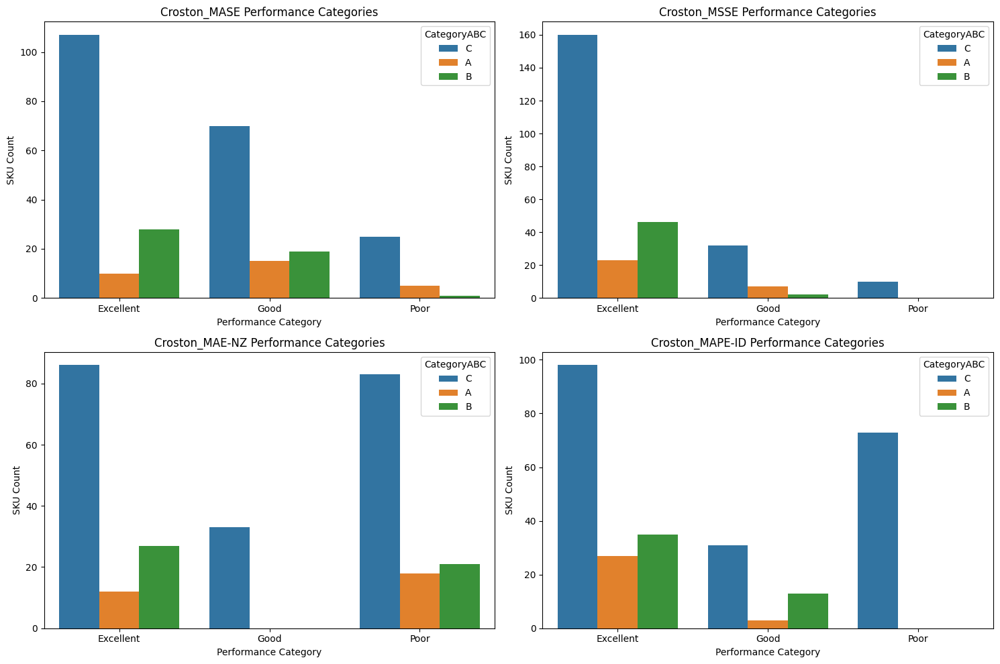

In [ ]:
# Create new categorical columns for performance based on thresholds
def categorize_mase(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 2.5:
        return 'Good'
    else:
        return 'Poor'

def categorize_msse(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 6.25:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_nz(x):
    if x <= 5:
        return 'Excellent'
    elif 5 < x <= 15:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_id(x):
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

# Apply categorization
df = sku_analysis_matrix_croston_filtered.copy()
df['Croston_MASE_Category'] = df['Croston_MASE'].apply(categorize_mase)
df['Croston_MSSE_Category'] = df['Croston_MSSE'].apply(categorize_msse)
df['Croston_MAE_NZ_Category'] = df['Croston_MAE-NZ'].apply(categorize_mae_nz)
df['Croston_MAPE_ID_Category'] = df['Croston_MAPE-ID'].apply(categorize_mape_id)

# Plot setup
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

# Plot 1: MASE
sns.countplot(data=df, x='Croston_MASE_Category', hue='CategoryABC', order=['Excellent', 'Good', 'Poor'], ax=axes[0])
axes[0].set_title('Croston_MASE Performance Categories')
axes[0].set_xlabel('Performance')
axes[0].set_ylabel('SKU Count')

# Plot 2: MSSE
sns.countplot(data=df, x='Croston_MSSE_Category', hue='CategoryABC', order=['Excellent', 'Good', 'Poor'], ax=axes[1])
axes[1].set_title('Croston_MSSE Performance Categories')
axes[1].set_xlabel('Performance')
axes[1].set_ylabel('SKU Count')

# Plot 3: MAE-NZ
sns.countplot(data=df, x='Croston_MAE_NZ_Category', hue='CategoryABC', order=['Excellent', 'Good', 'Poor'], ax=axes[2])
axes[2].set_title('Croston_MAE-NZ Performance Categories')
axes[2].set_xlabel('Performance')
axes[2].set_ylabel('SKU Count')

# Plot 4: MAPE-ID
sns.countplot(data=df, x='Croston_MAPE_ID_Category', hue='CategoryABC', order=['Excellent', 'Good', 'Poor'], ax=axes[3])
axes[3].set_title('Croston_MAPE-ID Performance Categories')
axes[3].set_xlabel('Performance')
axes[3].set_ylabel('SKU Count')

# Styling
for ax in axes:
    ax.legend(title='CategoryABC')
    ax.set_ylabel('SKU Count')
    ax.set_xlabel('Performance Category')

plt.tight_layout()
plt.show()


In [ ]:
df[['Croston_MASE','Croston_MASE_Category']].head(5)

,Croston_MASE,Croston_MASE_Category
0,3.194444,Poor
1,1.928953,Good
2,1.393939,Good
3,2.850800,Poor
4,0.976637,Excellent


In [ ]:
df['Croston_MASE_Category'].value_counts()

,count
Croston_MASE_Category,
Excellent,145
Good,104
Poor,31


/tmp/ipython-input-72-1830978185.py:58: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-72-1830978185.py:75: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-72-1830978185.py:92: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-72-1830978185.py:109: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


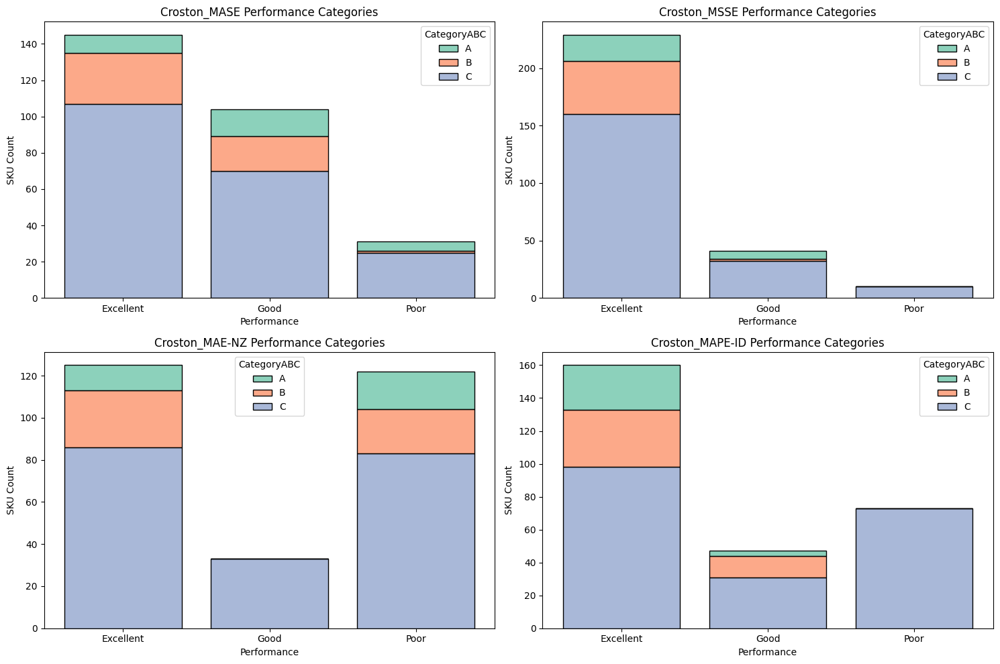

In [ ]:
# Create categorical columns for performance thresholds
def categorize_mase(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 2.5:
        return 'Good'
    else:
        return 'Poor'

def categorize_msse(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 6.25:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_nz(x):
    if x <= 5:
        return 'Excellent'
    elif 5 < x <= 15:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_id(x):
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

# Apply categorization
df = sku_analysis_matrix_croston_filtered.copy()
df['Croston_MASE_Category'] = df['Croston_MASE'].apply(categorize_mase)
df['Croston_MSSE_Category'] = df['Croston_MSSE'].apply(categorize_msse)
df['Croston_MAE_NZ_Category'] = df['Croston_MAE-NZ'].apply(categorize_mae_nz)
df['Croston_MAPE_ID_Category'] = df['Croston_MAPE-ID'].apply(categorize_mape_id)

# Set up 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()




# Common parameters
categories = ['Excellent', 'Good', 'Poor']

df['Croston_MASE_Category'] = pd.Categorical(df['Croston_MASE_Category'], categories=categories, ordered=True)
df['Croston_MSSE_Category'] = pd.Categorical(df['Croston_MSSE_Category'], categories=categories, ordered=True)
df['Croston_MAE_NZ_Category'] = pd.Categorical(df['Croston_MAE_NZ_Category'], categories=categories, ordered=True)
df['Croston_MAPE_ID_Category'] = pd.Categorical(df['Croston_MAPE_ID_Category'], categories=categories, ordered=True)
palette = sns.color_palette("Set2")  # Softer colors

# Plot 1: MASE
sns.histplot(
    data=df,
    x='Croston_MASE_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[0],
    stat="count"
)
axes[0].set_title('Croston_MASE Performance Categories')
axes[0].set_xlabel('Performance')
axes[0].set_ylabel('SKU Count')

# Plot 2: MSSE
sns.histplot(
    data=df,
    x='Croston_MSSE_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[1],
    stat="count"
)
axes[1].set_title('Croston_MSSE Performance Categories')
axes[1].set_xlabel('Performance')
axes[1].set_ylabel('SKU Count')

# Plot 3: MAE-NZ
sns.histplot(
    data=df,
    x='Croston_MAE_NZ_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[2],
    stat="count"
)
axes[2].set_title('Croston_MAE-NZ Performance Categories')
axes[2].set_xlabel('Performance')
axes[2].set_ylabel('SKU Count')

# Plot 4: MAPE-ID
sns.histplot(
    data=df,
    x='Croston_MAPE_ID_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[3],
    stat="count"
)
axes[3].set_title('Croston_MAPE-ID Performance Categories')
axes[3].set_xlabel('Performance')
axes[3].set_ylabel('SKU Count')

# Styling
for ax in axes:
    ax.set_xticks(range(len(categories)))
    ax.set_xticklabels(categories)
    #ax.legend(title='CategoryABC', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


/tmp/ipython-input-74-4009090365.py:58: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-74-4009090365.py:75: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-74-4009090365.py:92: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-74-4009090365.py:109: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


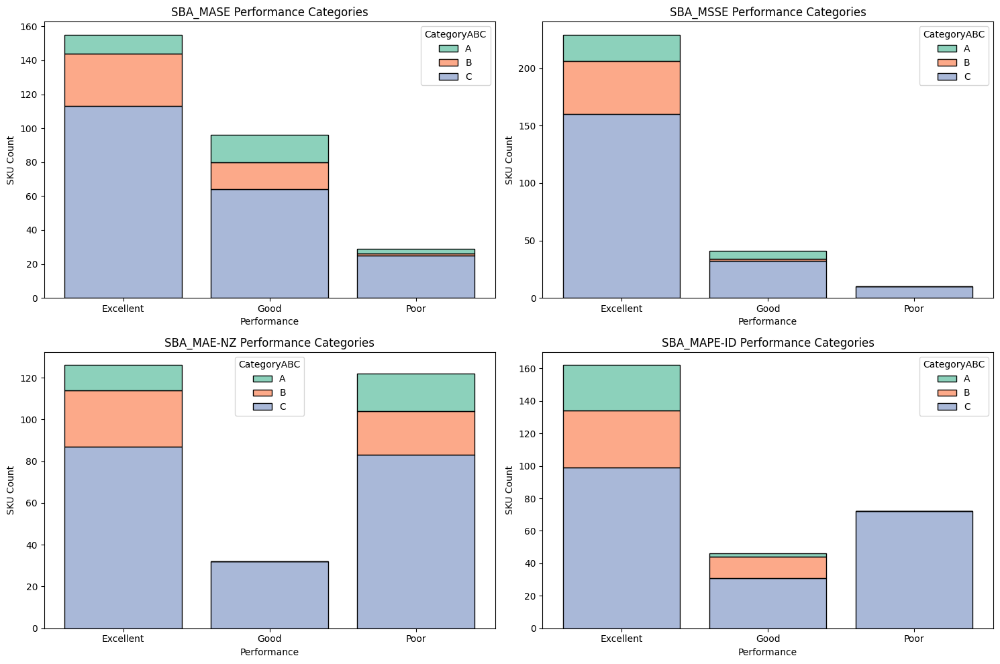

In [ ]:
# Create categorical columns for performance thresholds
def categorize_mase(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 2.5:
        return 'Good'
    else:
        return 'Poor'

def categorize_msse(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 6.25:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_nz(x):
    if x <= 5:
        return 'Excellent'
    elif 5 < x <= 15:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_id(x):
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

# Apply categorization
df = sku_analysis_matrix_croston_filtered.copy()
df['SBA_MASE_Category'] = df['SBA_MASE'].apply(categorize_mase)
df['SBA_MSSE_Category'] = df['SBA_MSSE'].apply(categorize_msse)
df['SBA_MAE_NZ_Category'] = df['SBA_MAE-NZ'].apply(categorize_mae_nz)
df['SBA_MAPE_ID_Category'] = df['SBA_MAPE-ID'].apply(categorize_mape_id)

# Set up 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()




# Common parameters
categories = ['Excellent', 'Good', 'Poor']

df['SBA_MASE_Category'] = pd.Categorical(df['SBA_MASE_Category'], categories=categories, ordered=True)
df['SBA_MSSE_Category'] = pd.Categorical(df['SBA_MSSE_Category'], categories=categories, ordered=True)
df['SBA_MAE_NZ_Category'] = pd.Categorical(df['SBA_MAE_NZ_Category'], categories=categories, ordered=True)
df['SBA_MAPE_ID_Category'] = pd.Categorical(df['SBA_MAPE_ID_Category'], categories=categories, ordered=True)
palette = sns.color_palette("Set2")  # Softer colors

# Plot 1: MASE
sns.histplot(
    data=df,
    x='SBA_MASE_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[0],
    stat="count"
)
axes[0].set_title('SBA_MASE Performance Categories')
axes[0].set_xlabel('Performance')
axes[0].set_ylabel('SKU Count')

# Plot 2: MSSE
sns.histplot(
    data=df,
    x='SBA_MSSE_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[1],
    stat="count"
)
axes[1].set_title('SBA_MSSE Performance Categories')
axes[1].set_xlabel('Performance')
axes[1].set_ylabel('SKU Count')

# Plot 3: MAE-NZ
sns.histplot(
    data=df,
    x='SBA_MAE_NZ_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[2],
    stat="count"
)
axes[2].set_title('SBA_MAE-NZ Performance Categories')
axes[2].set_xlabel('Performance')
axes[2].set_ylabel('SKU Count')

# Plot 4: MAPE-ID
sns.histplot(
    data=df,
    x='SBA_MAPE_ID_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[3],
    stat="count"
)
axes[3].set_title('SBA_MAPE-ID Performance Categories')
axes[3].set_xlabel('Performance')
axes[3].set_ylabel('SKU Count')

# Styling
for ax in axes:
    ax.set_xticks(range(len(categories)))
    ax.set_xticklabels(categories)
    #ax.legend(title='CategoryABC', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


/tmp/ipython-input-76-2541926511.py:58: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-76-2541926511.py:75: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-76-2541926511.py:92: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-76-2541926511.py:109: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


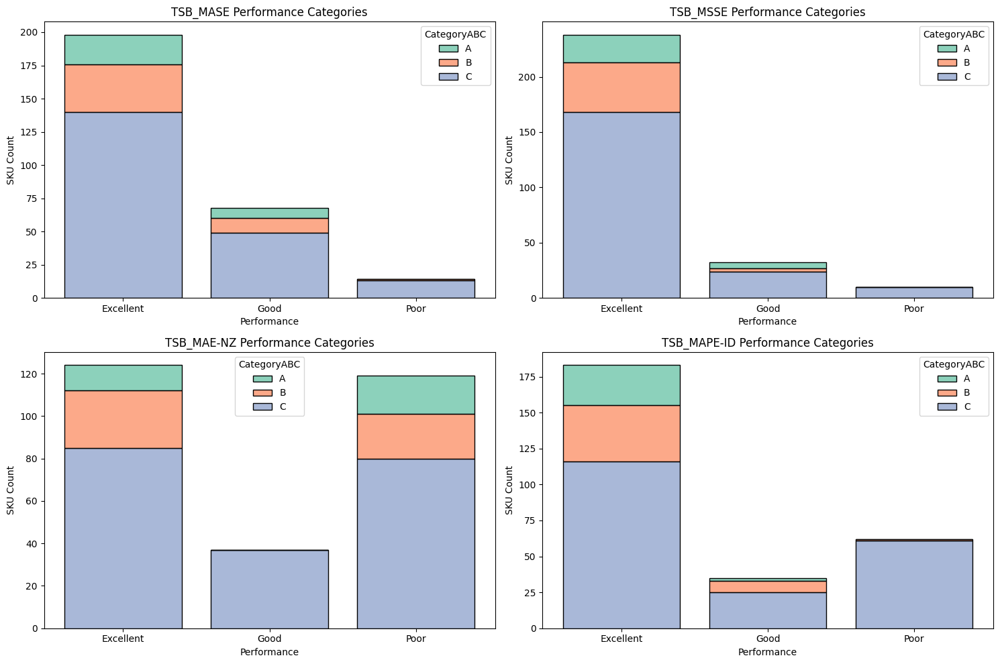

In [ ]:
# Create categorical columns for performance thresholds
def categorize_mase(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 2.5:
        return 'Good'
    else:
        return 'Poor'

def categorize_msse(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 6.25:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_nz(x):
    if x <= 5:
        return 'Excellent'
    elif 5 < x <= 15:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_id(x):
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

# Apply categorization
df = sku_analysis_matrix_croston_filtered.copy()
df['TSB_MASE_Category'] = df['TSB_MASE'].apply(categorize_mase)
df['TSB_MSSE_Category'] = df['TSB_MSSE'].apply(categorize_msse)
df['TSB_MAE_NZ_Category'] = df['TSB_MAE-NZ'].apply(categorize_mae_nz)
df['TSB_MAPE_ID_Category'] = df['TSB_MAPE-ID'].apply(categorize_mape_id)

# Set up 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()




# Common parameters
categories = ['Excellent', 'Good', 'Poor']

df['TSB_MASE_Category'] = pd.Categorical(df['TSB_MASE_Category'], categories=categories, ordered=True)
df['TSB_MSSE_Category'] = pd.Categorical(df['TSB_MSSE_Category'], categories=categories, ordered=True)
df['TSB_MAE_NZ_Category'] = pd.Categorical(df['TSB_MAE_NZ_Category'], categories=categories, ordered=True)
df['TSB_MAPE_ID_Category'] = pd.Categorical(df['TSB_MAPE_ID_Category'], categories=categories, ordered=True)
palette = sns.color_palette("Set2")  # Softer colors

# Plot 1: MASE
sns.histplot(
    data=df,
    x='TSB_MASE_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[0],
    stat="count"
)
axes[0].set_title('TSB_MASE Performance Categories')
axes[0].set_xlabel('Performance')
axes[0].set_ylabel('SKU Count')

# Plot 2: MSSE
sns.histplot(
    data=df,
    x='TSB_MSSE_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[1],
    stat="count"
)
axes[1].set_title('TSB_MSSE Performance Categories')
axes[1].set_xlabel('Performance')
axes[1].set_ylabel('SKU Count')

# Plot 3: MAE-NZ
sns.histplot(
    data=df,
    x='TSB_MAE_NZ_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[2],
    stat="count"
)
axes[2].set_title('TSB_MAE-NZ Performance Categories')
axes[2].set_xlabel('Performance')
axes[2].set_ylabel('SKU Count')

# Plot 4: MAPE-ID
sns.histplot(
    data=df,
    x='TSB_MAPE_ID_Category',
    hue='CategoryABC',
    multiple='stack',
    shrink=0.8,
    palette=palette,
    hue_order=sorted(df['CategoryABC'].unique()),
    discrete=True,
    ax=axes[3],
    stat="count"
)
axes[3].set_title('TSB_MAPE-ID Performance Categories')
axes[3].set_xlabel('Performance')
axes[3].set_ylabel('SKU Count')

# Styling
for ax in axes:
    ax.set_xticks(range(len(categories)))
    ax.set_xticklabels(categories)
    #ax.legend(title='CategoryABC', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
df[['Croston_MASE','Croston_MASE_Category']].head(5)

,Croston_MASE,Croston_MASE_Category
0,3.194444,Poor
1,1.928953,Good
2,1.393939,Good
3,2.850800,Poor
4,0.976637,Excellent


In [ ]:
df['Croston_MASE_Category'].value_counts()

,count
Croston_MASE_Category,
Excellent,145
Good,104
Poor,31


## Plot Forecasts

In [ ]:
df.columns

NameError: name 'df' is not defined

In [ ]:
def plot_sku_forecast(part_code, df):
    """
    Plots CONSUMPTION, PROCUREMENT, and Croston_Pred for a given PartCode with data labels.

    Parameters:
        part_code (str): The PartCode (SKU) to plot.
        df (pd.DataFrame): DataFrame containing PartCode, MONTH_YEAR, CONSUMPTION, PROCUREMENT, Croston_Pred
    """
    # Filter for the selected PartCode
    sku_df = df[df['PartCode'] == part_code].sort_values('MONTH_YEAR')

    if sku_df.empty:
        print(f"No data found for PartCode: {part_code}")
        return

    # Set figure
    plt.figure(figsize=(14, 7))

    # Plot Consumption
    plt.plot(
        sku_df['MONTH_YEAR'], sku_df['CONSUMPTION'],
        label='Consumption (Actual)', marker='o', color='blue', linewidth=2
    )
    for x, y in zip(sku_df['MONTH_YEAR'], sku_df['CONSUMPTION']):
        plt.text(x, y, f"{y:.0f}", color='blue', fontsize=10, ha='center', va='bottom')

    # Plot Procurement
    plt.plot(
        sku_df['MONTH_YEAR'], sku_df['PROCUREMENT'],
        label='Procurement (Actual)', marker='s', color='green', linewidth=2
    )
    for x, y in zip(sku_df['MONTH_YEAR'], sku_df['PROCUREMENT']):
        plt.text(x, y, f"{y:.0f}", color='green', fontsize=10, ha='center', va='bottom')

    # Plot Croston Forecast
    plt.plot(
        sku_df['MONTH_YEAR'], sku_df['Croston_Pred'],
        label='Croston Forecast', linestyle='--', color='red', linewidth=2
    )
    # Add text annotation for only the FIRST point
    for idx, (x, y) in enumerate(zip(sku_df['MONTH_YEAR'], sku_df['Croston_Pred'])):
        # if not pd.isna(y) and idx == 0:  # Only first non-NaN point
        #     plt.text(x, y, f"{y:.1f}", color='red', fontsize=10, ha='center', va='bottom')
        #     break  # Stop after first annotation
        first_valid_idx = sku_df['Croston_Pred'].first_valid_index()
        if first_valid_idx is not None:
          x = sku_df['MONTH_YEAR'].loc[first_valid_idx]
          y = sku_df['Croston_Pred'].loc[first_valid_idx]
          plt.text(x, y, f"{y:.1f}", color='red', fontsize=10, ha='center', va='bottom')

    # Plot SBA Forecast
    plt.plot(
        sku_df['MONTH_YEAR'], sku_df['SBA_Pred'],
        label='SBA Forecast', linestyle='--', color='#E67514', linewidth=2
    )
    # Add text annotation for only the MIDDLE point
    mid_idx = sku_df['SBA_Pred'].first_valid_index() + (sku_df['SBA_Pred'].last_valid_index() - sku_df['SBA_Pred'].first_valid_index()) // 2
    x_mid = sku_df['MONTH_YEAR'][mid_idx]
    y_mid = sku_df['SBA_Pred'][mid_idx]
    if not pd.isna(y_mid):
        plt.text(x_mid, y_mid, f"{y_mid:.1f}", color='#E67514', fontsize=10, ha='center', va='bottom')

    # Plot TSB Forecast
    plt.plot(
        sku_df['MONTH_YEAR'], sku_df['TSB_Pred'],
        label='TSB Forecast', linestyle='--', color='#FF2DD1', linewidth=2
    )
    # Add text annotation for only the LAST point
    for idx in reversed(range(len(sku_df))):
        #x, y = sku_df['MONTH_YEAR'][idx], sku_df['TSB_Pred'][idx]
        x, y = sku_df['MONTH_YEAR'].iloc[idx], sku_df['TSB_Pred'].iloc[idx]
        if not pd.isna(y):  # Only last non-NaN point
            plt.text(x, y, f"{y:.1f}", color='#FF2DD1', fontsize=10, ha='center', va='bottom')
            break


    # Title and axis labels
    plt.title(f"Time Series for PartCode: {part_code}", fontsize=16)
    plt.xlabel("Month-Year", fontsize=14)
    plt.ylabel("Quantity", fontsize=14)

    # Rotate x-axis ticks for dates
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)

    # Grid and legend
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(fontsize=12, loc='best')

    # Layout fix
    plt.tight_layout()

    # Show the plot
    plt.show()


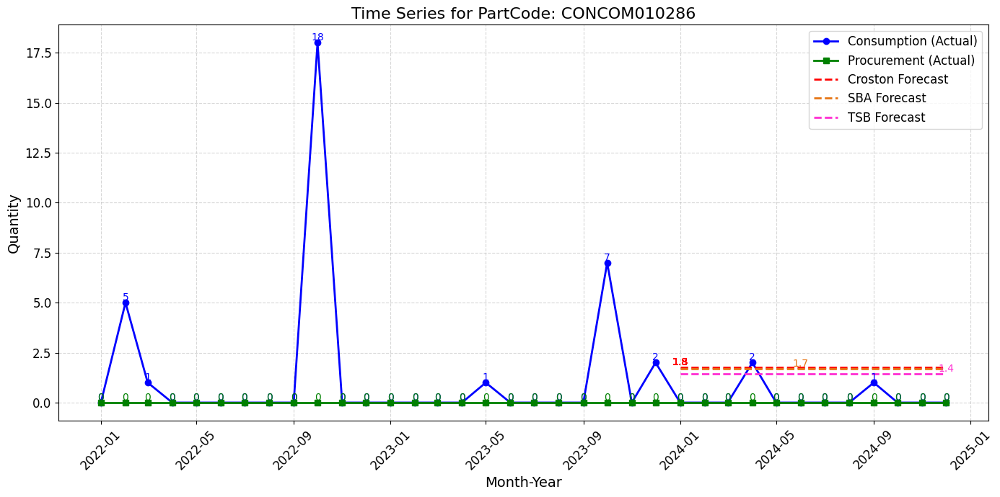

In [ ]:
plot_sku_forecast("CONCOM010286",df)

In [ ]:
def compute_global_metrics(df):
    # Filter test period rows (where Croston_Pred is not NaN)
    test_df = df[df['Croston_Pred'].notna()].copy()

    y_true = test_df['CONSUMPTION'].values
    y_pred = test_df['Croston_Pred'].values

    # Naive forecast for scaling (use previous month’s demand as forecast)
    naive_forecast_errors = []
    for sku, group in df.groupby('PartCode'):
        train_series = group.sort_values('MONTH_YEAR')["CONSUMPTION"].values[:24]
        errors = np.abs(np.diff(train_series))
        if len(errors) > 0:
            naive_forecast_errors.extend(errors)

    naive_mae = np.mean(naive_forecast_errors) if naive_forecast_errors else 1
    naive_mse = np.mean(np.square(naive_forecast_errors)) if naive_forecast_errors else 1

    # Compute metrics
    mase = mean_absolute_error(y_true, y_pred) / naive_mae
    msse = mean_squared_error(y_true, y_pred) / naive_mse

    non_zero_indices = y_true > 0
    mae_nz = mean_absolute_error(y_true[non_zero_indices], y_pred[non_zero_indices]) \
             if non_zero_indices.any() else np.nan

    mape_id = (np.abs(y_true - y_pred) / np.where(y_true == 0, 1, y_true)).mean() * 100

    return {
        "Global MASE": mase,
        "Global MSSE": msse,
        "Global MAE-NZ": mae_nz,
        "Global MAPE-ID": mape_id
    }


In [ ]:
global_metrics = compute_global_metrics(df)

{'Global MASE': np.float64(0.940830439759196), 'Global MSSE': np.float64(0.45025341068810554), 'Global MAE-NZ': 6.271201987799517, 'Global MAPE-ID': np.float64(119.30867797186264)}


In [ ]:
global_metrics

{'Global MASE': np.float64(0.940830439759196),
 'Global MSSE': np.float64(0.45025341068810554),
 'Global MAE-NZ': 6.271201987799517,
 'Global MAPE-ID': np.float64(119.30867797186264)}

## Global Metrics for Croston/SBA/TSB

In [ ]:
def compute_global_metrics(df):
    # Naive forecast for scaling (use previous month’s demand as forecast)
    naive_forecast_errors = []
    for sku, group in df.groupby('PartCode'):
        train_series = group.sort_values('MONTH_YEAR')["CONSUMPTION"].values[:24]
        errors = np.abs(np.diff(train_series))
        if len(errors) > 0:
            naive_forecast_errors.extend(errors)

    naive_mae = np.mean(naive_forecast_errors) if naive_forecast_errors else 1
    naive_mse = np.mean(np.square(naive_forecast_errors)) if naive_forecast_errors else 1

    metrics = {}

    # List of forecast columns to compute metrics for
    forecast_cols = ['Croston_Pred', 'SBA_Pred', 'TSB_Pred']

    for col in forecast_cols:
        # Filter test period rows where this forecast is not NaN
        test_df = df[df[col].notna()].copy()
        y_true = test_df['CONSUMPTION'].values
        y_pred = test_df[col].values

        if len(y_true) == 0 or len(y_pred) == 0:
            # Skip if no test data for this forecast
            continue

        # Compute metrics
        mase = mean_absolute_error(y_true, y_pred) / naive_mae
        msse = mean_squared_error(y_true, y_pred) / naive_mse

        non_zero_indices = y_true > 0
        mae_nz = mean_absolute_error(y_true[non_zero_indices], y_pred[non_zero_indices]) \
                 if non_zero_indices.any() else np.nan

        mape_id = (np.abs(y_true - y_pred) / np.where(y_true == 0, 1, y_true)).mean() * 100

        # Add to metrics dictionary
        metrics[f"{col}_MASE"] = mase
        metrics[f"{col}_MSSE"] = msse
        metrics[f"{col}_MAE-NZ"] = mae_nz
        metrics[f"{col}_MAPE-ID"] = mape_id

    return metrics


In [ ]:
compute_global_metrics(df)

{'Croston_Pred_MASE': np.float64(1.0325291043587417),
 'Croston_Pred_MSSE': np.float64(0.498911141795846),
 'Croston_Pred_MAE-NZ': 6.776037430153127,
 'Croston_Pred_MAPE-ID': np.float64(132.49693478824295),
 'SBA_Pred_MASE': np.float64(1.0052671033200622),
 'SBA_Pred_MSSE': np.float64(0.48978366582351507),
 'SBA_Pred_MAE-NZ': 6.778961048975523,
 'SBA_Pred_MAPE-ID': np.float64(126.35099429908503),
 'TSB_Pred_MASE': np.float64(0.8280819870455002),
 'TSB_Pred_MSSE': np.float64(0.4355706564903638),
 'TSB_Pred_MAE-NZ': 6.368072070786844,
 'TSB_Pred_MAPE-ID': np.float64(93.01429172950613)}

In [ ]:
df

,SKU,ADI,CV2,Classification,Cons_Demand_TD,CategoryABC,EachPartPrice_consumption,NZD_percent_train,NZD_percent_test,NZD_percent_total,...,SBA_MAPE-ID,SBA_MSSE,TSB_MASE,TSB_MAE-NZ,TSB_MAPE-ID,TSB_MSSE,TSB_MASE_Category,TSB_MSSE_Category,TSB_MAE_NZ_Category,TSB_MAPE_ID_Category
0,CONVRV000969,1.09,3.46,Erratic,Exists,C,87.360000,87.500000,100.000000,91.666667,...,186.555852,38.630951,3.194444,29.166667,197.244114,38.381436,Poor,Poor,Poor,Poor
1,CONCOM008774,9.00,0.16,Intermittent,Exists,A,720242.280000,8.333333,16.666667,11.111111,...,25.293803,2.130969,1.811929,1.402323,23.585467,2.169871,Good,Good,Excellent,Excellent
2,CONCOM012889,18.00,0.00,Intermittent,Exists,C,4500.000000,4.166667,8.333333,5.555556,...,11.931818,0.897012,1.734583,0.919000,15.083333,0.878535,Good,Excellent,Excellent,Excellent
3,CONCOM008160,18.00,0.18,Intermittent,Exists,C,4211.796522,4.166667,8.333333,5.555556,...,220.731707,3.079518,1.983297,40.547040,49.762646,3.259758,Good,Good,Poor,Excellent
4,CONCOM007552,3.60,0.34,Intermittent,Exists,B,75809.930000,25.000000,33.333333,27.777778,...,61.393653,0.652228,0.866194,1.627382,49.635368,0.692513,Excellent,Excellent,Excellent,Excellent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
310,CONCOM009037,4.50,1.65,Lumpy,Exists,C,504.000000,25.000000,16.666667,22.222222,...,589.714980,0.027162,0.261913,5.325856,398.388389,0.014652,Excellent,Excellent,Good,Poor
312,CONCOM010130,36.00,NaN,Lumpy,Exists,C,595.000000,4.166667,0.000000,2.777778,...,11.176471,0.035913,0.550041,NaN,9.565938,0.026308,Excellent,Excellent,Poor,Excellent
314,CONCOM008641,9.00,0.74,Lumpy,Exists,C,3571.920000,8.333333,16.666667,11.111111,...,43.345065,3.627832,1.780010,5.249773,35.225151,3.689444,Good,Good,Good,Excellent
315,CONCOM010372,6.00,0.50,Lumpy,Exists,C,540.000000,16.666667,16.666667,16.666667,...,196.459656,3.075186,1.676058,18.441512,144.809017,3.151932,Good,Good,Poor,Poor


## XGBoost Model

In [ ]:
['PartCode', 'Description_consumption', 'UOM_consumption',
       'Make_consumption', 'CategoryABC', 'MinStock', 'MaxStock',
       'SAPQty_consumption', 'CommonMachineName_consumption',
       'Line_consumption', 'EachPartPrice_consumption', 'MONTH', 'CONSUMPTION',
       'Description_procurement', 'UOM_procurement', 'Make_procurement',
       'SAPQty_procurement', 'CommonMachineName_procurement',
       'Line_procurement', 'EachPartPrice_procurement', 'PROCUREMENT',
       'MONTH_YEAR', 'Cumulative_Consumption', 'Cumulative_Procurement',
       'Running_Stock', 'partCategory', 'NZD_percent_train',
       'NZD_percent_test', 'NZD_percent_total', 'Lag1', 'Lag2', 'Lag3',
       'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
       'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
       'RollingStd3', 'RollingMean6', 'RollingStd6', 'RollingCV2_3',
       'RollingADI3', 'ExpandingCV2', 'ExpandingADI']

### Feature Engineerd Input

In [ ]:
df_filtered.columns

Index(['PartCode', 'Description_consumption', 'UOM_consumption',
       'Make_consumption', 'CategoryABC', 'MinStock', 'MaxStock',
       'SAPQty_consumption', 'CommonMachineName_consumption',
       'Line_consumption', 'EachPartPrice_consumption', 'MONTH', 'CONSUMPTION',
       'Description_procurement', 'UOM_procurement', 'Make_procurement',
       'SAPQty_procurement', 'CommonMachineName_procurement',
       'Line_procurement', 'EachPartPrice_procurement', 'PROCUREMENT',
       'MONTH_YEAR', 'Cumulative_Consumption', 'Cumulative_Procurement',
       'Running_Stock', 'partCategory', 'Lag1', 'Lag2', 'Lag3', 'NonZeroLag1',
       'NonZeroLag2', 'MonthsSinceLastDemand', 'RollingMean3', 'RollingStd3',
       'RollingMean6', 'RollingStd6', 'RollingNonZeroMean3',
       'RollingNonZeroStdDev3', 'RollingCV2_3', 'RollingADI3', 'ExpandingCV2',
       'ExpandingADI', 'NZD_percent_train', 'NZD_percent_test',
       'NZD_percent_total'],
      dtype='object')

In [ ]:
df_filtered.shape

(10080, 42)

In [ ]:
xgb_occurence_model_input = df_filtered[['PartCode','CategoryABC','EachPartPrice_consumption','MONTH_YEAR','CONSUMPTION','Cumulative_Consumption','Lag1', 'Lag2', 'Lag3',
       'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
       'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
       'RollingStd3', 'RollingMean6', 'RollingStd6','RollingCV2_3',
       'RollingADI3', 'ExpandingCV2', 'ExpandingADI']]

In [ ]:
sku_meta_filtered = sku_classification_df[sku_classification_df["SKU"].isin(valid_skus)]

In [ ]:
sku_meta_filtered.shape

(280, 16)

In [ ]:
sku_meta_filtered.columns

Index(['SKU', 'ADI', 'CV2', 'Classification', 'MaxNonZeroDemand',
       'MinNonZeroDemand', 'TotalDemand', 'ZeroDemandProportion',
       'NonZeroDemandMean', 'NonZeroDemandStd', 'Cons_Demand_TD',
       'CategoryABC', 'EachPartPrice_consumption', 'NZD_percent_train',
       'NZD_percent_test', 'NZD_percent_total'],
      dtype='object')

In [ ]:
xgb_occurence_model_input.head(5)

,PartCode,CategoryABC,EachPartPrice_consumption,MONTH_YEAR,CONSUMPTION,Cumulative_Consumption,Lag1,Lag2,Lag3,NonZeroLag1,...,RollingNonZeroMean3,RollingNonZeroStdDev3,RollingMean3,RollingStd3,RollingMean6,RollingStd6,RollingCV2_3,RollingADI3,ExpandingCV2,ExpandingADI
335,CONCOM002378,C,80.13,2022-01-01,5.0,5.0,NaN,NaN,NaN,NaN,...,5.000000,NaN,5.000000,NaN,5.000000,NaN,NaN,10.000000,NaN,10.0
802,CONCOM002378,C,80.13,2022-02-01,1.0,6.0,5.0,NaN,NaN,5.0,...,3.000000,2.828427,3.000000,2.828427,3.000000,2.828427,0.888889,9.500000,0.888889,9.5
1269,CONCOM002378,C,80.13,2022-03-01,2.0,8.0,1.0,5.0,NaN,1.0,...,2.666667,2.081666,2.666667,2.081666,2.666667,2.081666,0.609375,9.000000,0.609375,9.0
1736,CONCOM002378,C,80.13,2022-04-01,0.0,8.0,2.0,1.0,5.0,2.0,...,1.500000,0.707107,1.000000,1.000000,2.000000,2.160247,1.000000,8.000000,1.166667,8.5
2203,CONCOM002378,C,80.13,2022-05-01,1.0,9.0,0.0,2.0,1.0,NaN,...,1.500000,0.707107,1.000000,1.000000,1.800000,1.923538,1.000000,7.333333,1.141975,8.2


## Occurence Model

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.metrics import precision_recall_curve, f1_score, precision_score, recall_score, average_precision_score
import xgboost as xgb

# -----------------------
# PARAMETERS
# -----------------------
H = 12  # Forecast horizon (12 months)

# -----------------------
# FEATURE ENGINEERING
# -----------------------
def feature_engineering(df, sku_df):
    df = df.copy()
    df["MONTH_YEAR"] = pd.to_datetime(df["MONTH_YEAR"])
    df.sort_values(["PartCode", "MONTH_YEAR"], inplace=True)


    # Temporal features
    df["Month"] = df["MONTH_YEAR"].dt.month
    df["Month_sin"] = np.sin(2 * np.pi * df["Month"] / 12)
    df["Month_cos"] = np.cos(2 * np.pi * df["Month"] / 12)

    # Log-transform price (to handle skew)
    df["LogPrice"] = np.log1p(df["EachPartPrice_consumption"])

    # Merge SKU-level meta data
    df = df.merge(
        sku_df[["SKU", "ADI", "CV2",'MaxNonZeroDemand','MinNonZeroDemand']],
        how="left", left_on="PartCode", right_on="SKU"
    )

    df.rename(columns={"ADI": "SKU_ADI", "CV2": "SKU_CV2"}, inplace=True)

    # Ordinal encode CategoryABC
    cat_encoder = OrdinalEncoder()
    df["CategoryABC_encoded"] = cat_encoder.fit_transform(df[["CategoryABC"]]).astype(int)

    return df

# -----------------------
# TARGET CREATION
# -----------------------
def create_multi_horizon_target(df, horizon=H):
    df = df.copy()
    targets = []

    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .shift(-i)
            .fillna(0)
            .astype(int)
            .clip(0, 1)  # Binary target: 1 if demand occurs, else 0
        )
        targets.append(f"Target_t+{i}")

    return df, targets

def create_multi_horizon_target_r1(df, horizon=H):
    df = df.copy()
    targets = []

    def shift_with_rotation(x, shift_by):
        return pd.Series(np.roll(x, -shift_by), index=x.index)

    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .transform(lambda x: shift_with_rotation(x, i))
            .clip(0, 1)  # Binary target: 1 if demand occurs, else 0
            .astype(int)
        )
        targets.append(f"Target_t+{i}")

    return df, targets

# -----------------------
# MODEL TRAINING
# -----------------------
def train_xgb_multi_output(X_train, y_train, X_val, y_val, horizon=H):
    models = []
    thresholds = []
    for i in range(horizon):
        print(f"Training model for horizon t+{i+1}")

        model = xgb.XGBClassifier(
            n_estimators=200,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            eval_metric='logloss',
            use_label_encoder=False
        )
        model.fit(X_train, y_train[:, i])

        # Get predicted probabilities for validation set
        y_prob = model.predict_proba(X_val)[:, 1]

        # Find best threshold using PR Curve
        precision, recall, thresh = precision_recall_curve(y_val[:, i], y_prob)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-6)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresh[best_idx]

        print(f"Best threshold for t+{i+1}: {best_threshold:.3f}")

        models.append(model)
        thresholds.append(best_threshold)

    return models, np.array(thresholds)

# -----------------------
# PREDICTION
# -----------------------
def predict_xgb_multi_output(models, thresholds, X):
    y_prob = np.column_stack([
        m.predict_proba(X)[:, 1] for m in models
    ])
    y_pred = (y_prob >= thresholds[None, :]).astype(int)
    return y_prob, y_pred

# -----------------------
# METRICS
# -----------------------
def evaluate(y_true, y_pred):
    metrics = {}
    for i in range(y_true.shape[1]):
        f1 = f1_score(y_true[:, i], y_pred[:, i])
        precision_val = precision_score(y_true[:, i], y_pred[:, i])
        recall_val = recall_score(y_true[:, i], y_pred[:, i])
        avg_prec = average_precision_score(y_true[:, i], y_pred[:, i])
        metrics[f"t+{i+1}_F1"] = f1
        metrics[f"t+{i+1}_Precision"] = precision_val
        metrics[f"t+{i+1}_Recall"] = recall_val
        metrics[f"t+{i+1}_AP"] = avg_prec
    return metrics

# -----------------------
# PIPELINE
# -----------------------
# Feature engineering
df_fe = feature_engineering(xgb_occurence_model_input, sku_meta_filtered)

# Target creation
df_fe, target_cols = create_multi_horizon_target(df_fe, H)

# Count rows with NaNs in any of the target columns
na_rows_count = df_fe[target_cols].isna().any(axis=1).sum()

print(f"Number of rows with NaNs Target Cols :  {na_rows_count}")
# Drop rows with NaNs in targets (due to shifting)
df_fe.dropna(subset=target_cols, inplace=True)

# Features and Targets
feature_cols = [
   'Cumulative_Consumption','Lag1', 'Lag2', 'Lag3',
       'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
       'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
       'RollingStd3', 'RollingMean6', 'RollingStd6', 'MaxNonZeroDemand',
       'MinNonZeroDemand',"LogPrice",
    "Month_sin", "Month_cos",  "CategoryABC_encoded", 'RollingCV2_3',
       'RollingADI3', 'ExpandingCV2', 'ExpandingADI'
] # "SKU_ADI", "SKU_CV2" removed due to data leakage
X = df_fe[feature_cols].values
y = df_fe[target_cols].values

# Train/test split
# X_train, X_val, y_train, y_val = train_test_split(
#     X, y, test_size=0.2, random_state=42, stratify=y[:, 0]
# )

# X_train, X_val, y_train, y_val, train_indices, y_val_indices = train_test_split(
#     X, y, df_fe.index, test_size=0.2, random_state=42, stratify=y[:, 0]
# )

split_date = df_fe["MONTH_YEAR"].min() + pd.DateOffset(months=24)

# Create train/validation masks
train_mask = df_fe["MONTH_YEAR"] <= split_date
val_mask = df_fe["MONTH_YEAR"] > split_date

# Get indices
train_indices = df_fe.loc[train_mask].index
y_val_indices = df_fe.loc[val_mask].index

# Split features and targets
X_train = df_fe.loc[train_mask, feature_cols].values
y_train = df_fe.loc[train_mask, target_cols].values

X_val = df_fe.loc[val_mask, feature_cols].values
y_val = df_fe.loc[val_mask, target_cols].values

# Train multi-output XGBoost models
models, thresholds = train_xgb_multi_output(X_train, y_train, X_val, y_val, H)

print(f"Best threshold :{thresholds}")
# Predict on validation set
y_prob_occurence, y_pred_occurence = predict_xgb_multi_output(models, thresholds, X_val)

# Average predicted probability per horizon
avg_probs = y_prob_occurence.mean(axis=0)
for i, prob in enumerate(avg_probs, 1):
    print(f"t+{i} average predicted probability: {prob:.4f}")
# Evaluate
metrics = evaluate(y_val, y_pred_occurence)
print("\nValidation Metrics:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


# y_prob_occurence = y_prob.copy()
# y_pred_occurence = y_pred.copy()

Number of rows with NaNs Target Cols :  0
Training model for horizon t+1


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+1: 0.258
Training model for horizon t+2


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+2: 0.249
Training model for horizon t+3


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+3: 0.394
Training model for horizon t+4


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+4: 0.247
Training model for horizon t+5


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+5: 0.210
Training model for horizon t+6


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+6: 0.144
Training model for horizon t+7


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+7: 0.222
Training model for horizon t+8


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+8: 0.333
Training model for horizon t+9


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+9: 0.545
Training model for horizon t+10


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+10: 0.965
Training model for horizon t+11


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [16:14:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best threshold for t+11: 0.000
Training model for horizon t+12


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-package

Best threshold for t+12: 0.000
Best threshold :[2.5819603e-01 2.4895783e-01 3.9444575e-01 2.4679746e-01 2.1011816e-01
 1.4380357e-01 2.2182962e-01 3.3258289e-01 5.4509217e-01 9.6526641e-01
 3.7179087e-04 3.3599514e-04]
t+1 average predicted probability: 0.1342
t+2 average predicted probability: 0.1110
t+3 average predicted probability: 0.1170
t+4 average predicted probability: 0.0934
t+5 average predicted probability: 0.0802
t+6 average predicted probability: 0.0680
t+7 average predicted probability: 0.0637
t+8 average predicted probability: 0.0528
t+9 average predicted probability: 0.0325
t+10 average predicted probability: 0.0188
t+11 average predicted probability: 0.0010
t+12 average predicted probability: 0.0010

Validation Metrics:
t+1_F1: 0.7430
t+1_Precision: 0.6384
t+1_Recall: 0.8886
t+1_AP: 0.5835
t+2_F1: 0.7386
t+2_Precision: 0.6857
t+2_Recall: 0.8005
t+2_AP: 0.5752
t+3_F1: 0.7079
t+3_Precision: 0.6939
t+3_Recall: 0.7225
t+3_AP: 0.5342
t+4_F1: 0.7686
t+4_Precision: 0.7098
t+4

In [ ]:
y_pred

array([[ 5.95125914e-01,  3.55743408e-01,  2.23717347e-01, ...,
         1.86727250e+00,  2.04729531e-02,  1.45337090e-03],
       [ 2.47561201e-01,  3.19816649e-01,  2.08927333e-01, ...,
         2.02550087e-02,  1.29459379e-02,  3.93752521e-03],
       [ 1.49902329e-01,  1.23579375e-01,  2.31921151e-01, ...,
        -3.13076749e-02, -2.22712606e-02, -2.46765707e-02],
       ...,
       [ 1.53414226e+00,  8.30437183e-01,  8.36189926e-01, ...,
        -1.24726284e+00, -4.26727802e-01,  1.57072818e+00],
       [ 5.86797297e-01,  1.60615623e-01,  2.21165866e-01, ...,
         1.80189893e-01,  1.39125729e+00,  9.94730473e-01],
       [-1.06217511e-01,  1.05259180e-01,  7.77434587e-01, ...,
         2.96034932e-01,  3.66512239e-01, -3.11683863e-01]], dtype=float32)

In [ ]:
import matplotlib.pyplot as plt
import random

def plot_actual_vs_pred(df, y_val, y_pred, target_cols, partcode_col="PartCode", PartCode = None):
    # Get PartCodes for validation set
    val_partcodes = df_fe.iloc[y_val_indices]["PartCode"].unique()

    if PartCode is None :
      # Randomly select one SKU from validation set
      random_sku = random.choice(val_partcodes)
      #random_sku = 'CONCOM007446'
      print(f"\n📌 Randomly selected SKU: {random_sku}")

      selected_sku = random_sku

    else:

      selected_sku = PartCode

    # Find rows in validation set belonging to the random SKU
    sku_mask = df_fe.iloc[y_val_indices]["PartCode"] == selected_sku

    # Filter y_val and y_pred for that SKU
    actual = y_val[sku_mask.values]
    pred = y_pred[sku_mask.values]


    if actual.shape[0] == 0:
        print("⚠️ No validation data for this SKU. Try rerunning to select a different SKU.")
        return

    # Plot actual vs predicted for each horizon
    plt.figure(figsize=(12, 6))
    horizons = [f"t+{i+1}" for i in range(actual.shape[1])]

    # Plot Actual
    plt.plot(horizons, actual[0], marker='o', label="Actual", color="blue")
    for i, val in enumerate(actual[0]):
        plt.text(i, val + 0.05, str(val), ha='center', color="blue")

    # Plot Predicted
    plt.plot(horizons, pred[0], marker='s', linestyle='--', label="Predicted", color="orange")
    for i, val in enumerate(pred[0]):
        plt.text(i, val - 0.1, str(val), ha='center', color="orange")

    # Styling
    plt.title(f"Actual vs Predicted Demand Occurrence for SKU: {selected_sku}")
    plt.xlabel("Forecast Horizon")
    plt.ylabel("Demand Occurrence (1=Yes, 0=No)")
    plt.ylim(-0.2, 1.2)
    plt.legend()
    plt.grid(True)
    plt.show()





📌 Randomly selected SKU: CONCOM007350


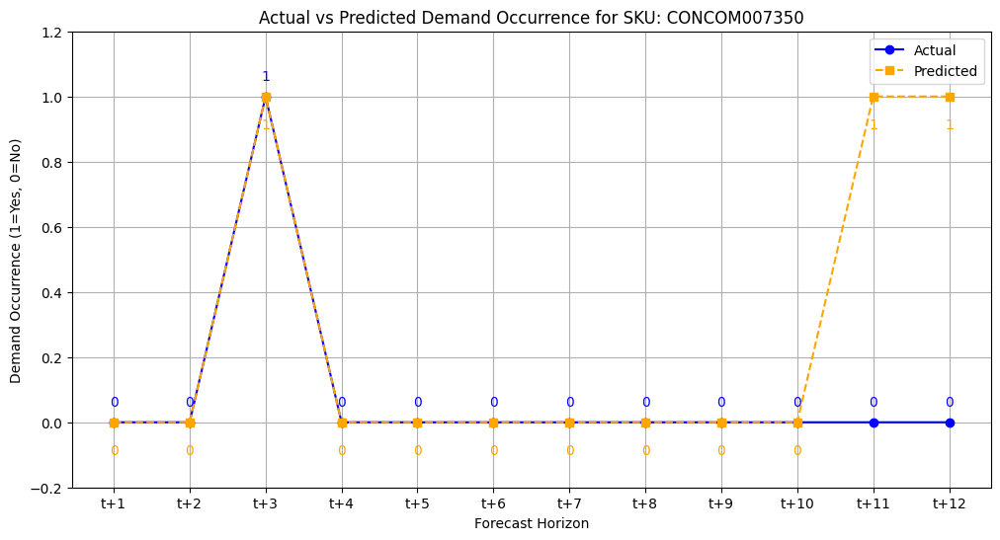

In [ ]:
# Call the plot function
plot_actual_vs_pred(df_fe.reset_index(drop=True), y_val, y_pred, target_cols)

In [ ]:
for i in range(10, 12):  # t+11, t+12 are index 10 and 11
    counts = np.bincount(y_train[:, i])
    print(f"t+{i+1} class counts: {dict(enumerate(counts))}")


t+11 class counts: {0: np.int64(5898), 1: np.int64(1102)}
t+12 class counts: {0: np.int64(5954), 1: np.int64(1046)}


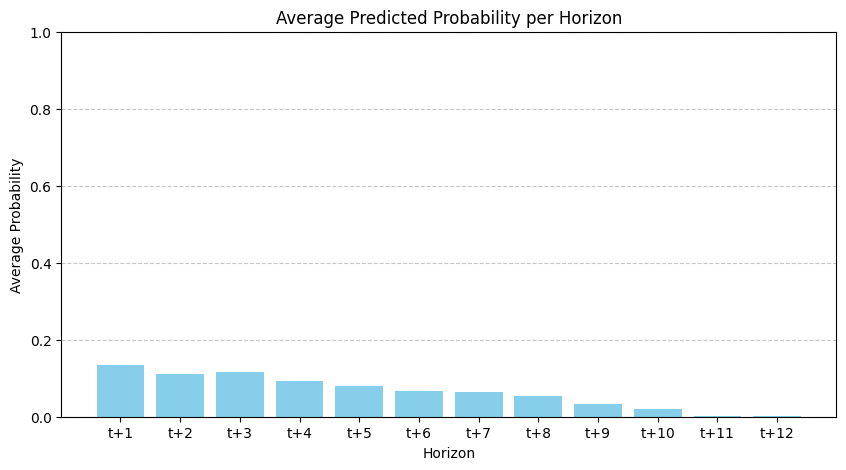

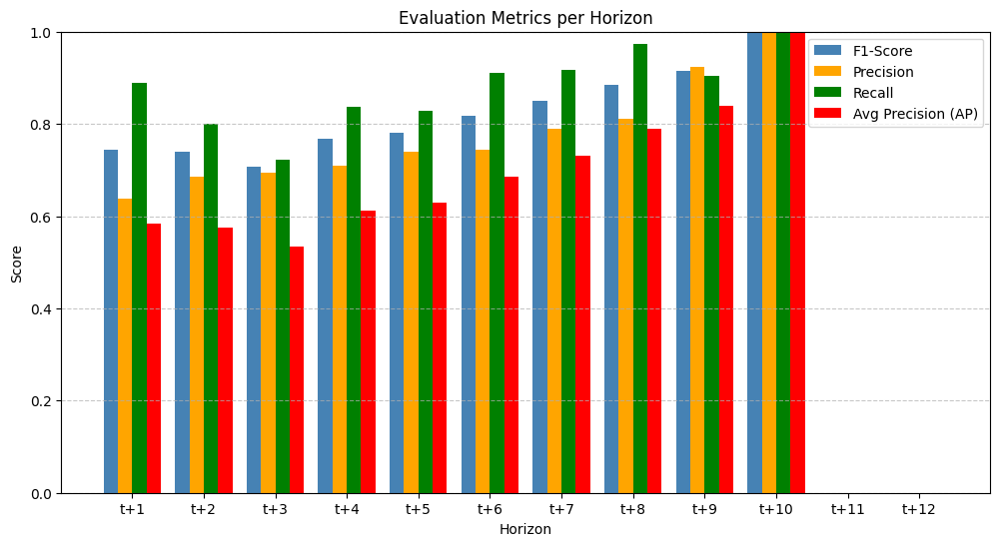

In [ ]:

# ---------- Plot 1: Average Probabilities ----------
horizons = [f"t+{i}" for i in range(1, H + 1)]

plt.figure(figsize=(10, 5))
plt.bar(horizons, avg_probs, color='skyblue')
plt.title("Average Predicted Probability per Horizon")
plt.xlabel("Horizon")
plt.ylabel("Average Probability")
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# ---------- Plot 2: Metrics per Horizon ----------
# Extract metric values per horizon
f1_scores = [metrics[f"t+{i}_F1"] for i in range(1, H + 1)]
precisions = [metrics[f"t+{i}_Precision"] for i in range(1, H + 1)]
recalls = [metrics[f"t+{i}_Recall"] for i in range(1, H + 1)]
aps = [metrics[f"t+{i}_AP"] for i in range(1, H + 1)]

x = np.arange(len(horizons))
width = 0.2  # Bar width

plt.figure(figsize=(12, 6))
plt.bar(x - 1.5*width, f1_scores, width, label='F1-Score', color='steelblue')
plt.bar(x - 0.5*width, precisions, width, label='Precision', color='orange')
plt.bar(x + 0.5*width, recalls, width, label='Recall', color='green')
plt.bar(x + 1.5*width, aps, width, label='Avg Precision (AP)', color='red')

plt.title("Evaluation Metrics per Horizon")
plt.xlabel("Horizon")
plt.ylabel("Score")
plt.xticks(x, horizons)
plt.ylim(0, 1)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


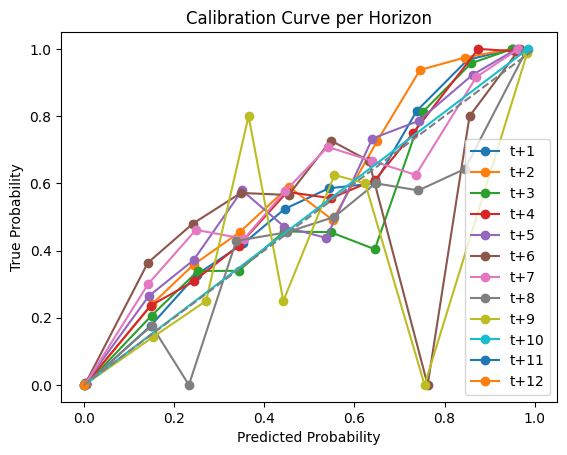

In [ ]:
from sklearn.calibration import calibration_curve

for i in range(H):
    prob_true, prob_pred = calibration_curve(y_val[:, i], y_prob[:, i], n_bins=10)
    plt.plot(prob_pred, prob_true, marker='o', label=f't+{i+1}')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')  # Perfect calibration line
plt.xlabel("Predicted Probability")
plt.ylabel("True Probability")
plt.title("Calibration Curve per Horizon")
plt.legend()
plt.show()


## Size Model

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import xgboost as xgb
import matplotlib.pyplot as plt

# -----------------------
# PARAMETERS
# -----------------------
H = 12  # Forecast horizon (12 months)

# -----------------------
# FEATURE ENGINEERING
# -----------------------
def feature_engineering(df, sku_df):
    df = df.copy()
    df["MONTH_YEAR"] = pd.to_datetime(df["MONTH_YEAR"])
    df.sort_values(["PartCode", "MONTH_YEAR"], inplace=True)

    # Temporal features
    df["Month"] = df["MONTH_YEAR"].dt.month
    df["Month_sin"] = np.sin(2 * np.pi * df["Month"] / 12)
    df["Month_cos"] = np.cos(2 * np.pi * df["Month"] / 12)

    # Log-transform price (to handle skew)
    df["LogPrice"] = np.log1p(df["EachPartPrice_consumption"])

    # Merge SKU-level meta data
    df = df.merge(
        sku_df[["SKU", "ADI", "CV2", 'MaxNonZeroDemand', 'MinNonZeroDemand']],
        how="left", left_on="PartCode", right_on="SKU"
    )
    df.rename(columns={"ADI": "SKU_ADI", "CV2": "SKU_CV2"}, inplace=True)

    # Ordinal encode CategoryABC
    cat_encoder = OrdinalEncoder()
    df["CategoryABC_encoded"] = cat_encoder.fit_transform(df[["CategoryABC"]]).astype(int)

    return df

# -----------------------
# TARGET CREATION
# -----------------------
def create_multi_horizon_target(df, horizon=H):
    df = df.copy()
    targets = []
    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .shift(-i)
            .fillna(0)  # Fill future unavailable values with 0
        )
        targets.append(f"Target_t+{i}")
    return df, targets

# -----------------------
# MODEL TRAINING
# -----------------------
def train_xgb_multi_output(X_train, y_train, X_val, y_val, horizon=H):
    models = []
    for i in range(horizon):
        print(f"Training model for horizon t+{i+1}")
        model = xgb.XGBRegressor(
            n_estimators=300,
            max_depth=6,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            objective='reg:pseudohubererror',
            eval_metric='mae',
            verbosity=1
        )
        model.fit(X_train, y_train[:, i])
        models.append(model)
    return models

# -----------------------
# PREDICTION
# -----------------------
def predict_xgb_multi_output(models, X):
    y_pred = np.column_stack([
        m.predict(X) for m in models
    ])
    return y_pred

# -----------------------
# METRICS
# -----------------------
def evaluate(y_true, y_pred):
    metrics = {}
    for i in range(y_true.shape[1]):
        mae = mean_absolute_error(y_true[:, i], y_pred[:, i])
        rmse = np.sqrt(mean_squared_error(y_true[:, i], y_pred[:, i]))
        metrics[f"t+{i+1}_MAE"] = mae
        metrics[f"t+{i+1}_RMSE"] = rmse
    return metrics

# -----------------------
# PIPELINE
# -----------------------
# Feature engineering
df_fe = feature_engineering(xgb_occurence_model_input, sku_meta_filtered)

# Target creation
df_fe, target_cols = create_multi_horizon_target(df_fe, H)

# Drop rows with NaNs in targets (due to shifting)
df_fe.dropna(subset=target_cols, inplace=True)

# Features and Targets
feature_cols = [
    'Cumulative_Consumption', 'Lag1', 'Lag2', 'Lag3',
    'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
    'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
    'RollingStd3', 'RollingMean6', 'RollingStd6', 'MaxNonZeroDemand',
    'MinNonZeroDemand', "LogPrice",
    "Month_sin", "Month_cos", "CategoryABC_encoded",
    'RollingCV2_3', 'RollingADI3', 'ExpandingCV2', 'ExpandingADI'
]
X = df_fe[feature_cols].values
y = df_fe[target_cols].values

# Train/test split (time-based)
split_date = df_fe["MONTH_YEAR"].min() + pd.DateOffset(months=24)
train_mask = df_fe["MONTH_YEAR"] <= split_date
val_mask = df_fe["MONTH_YEAR"] > split_date

X_train = df_fe.loc[train_mask, feature_cols].values
y_train = df_fe.loc[train_mask, target_cols].values
X_val = df_fe.loc[val_mask, feature_cols].values
y_val = df_fe.loc[val_mask, target_cols].values

# Train multi-output XGBoost regression models
models = train_xgb_multi_output(X_train, y_train, X_val, y_val, H)

# Predict on validation set
y_pred_size = predict_xgb_multi_output(models, X_val)

# Evaluate
metrics = evaluate(y_val, y_pred_size)
print("\nValidation Metrics (Demand Size):")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


# y_pred_size = y_pred.copy()

Training model for horizon t+1
Training model for horizon t+2
Training model for horizon t+3
Training model for horizon t+4
Training model for horizon t+5
Training model for horizon t+6
Training model for horizon t+7
Training model for horizon t+8
Training model for horizon t+9
Training model for horizon t+10
Training model for horizon t+11
Training model for horizon t+12

Validation Metrics (Demand Size):
t+1_MAE: 1.2450
t+1_RMSE: 7.3425
t+2_MAE: 1.1772
t+2_RMSE: 7.3122
t+3_MAE: 1.1660
t+3_RMSE: 7.2048
t+4_MAE: 1.0455
t+4_RMSE: 6.9145
t+5_MAE: 0.9594
t+5_RMSE: 6.8904
t+6_MAE: 0.9047
t+6_RMSE: 6.8659
t+7_MAE: 0.7616
t+7_RMSE: 5.2500
t+8_MAE: 0.6925
t+8_RMSE: 4.8976
t+9_MAE: 0.6407
t+9_RMSE: 4.7046
t+10_MAE: 0.5029
t+10_RMSE: 4.3430
t+11_MAE: 0.2792
t+11_RMSE: 1.0544
t+12_MAE: 0.1435
t+12_RMSE: 0.5210


In [ ]:
import random
import matplotlib.pyplot as plt

def plot_actual_vs_pred_size(df, y_val, y_pred, y_val_indices, target_cols, partcode_col="PartCode", partCode = None):
    """
    Plot actual vs predicted demand sizes for a randomly selected SKU from the validation set.
    """
    # Get PartCodes for validation set
    val_partcodes = df.iloc[y_val_indices][partcode_col].unique()

    if partCode is None:
      # Randomly select one SKU from validation set
      random_sku = random.choice(val_partcodes)
      print(f"\n Randomly selected SKU: {random_sku}")
      selected_sku = random_sku
    else:
      selected_sku = partCode
    # Find rows in validation set belonging to the random SKU
    sku_mask = df.iloc[y_val_indices][partcode_col] == selected_sku

    # Filter y_val and y_pred for that SKU
    actual = y_val[sku_mask.values]
    pred = y_pred[sku_mask.values]

    if actual.shape[0] == 0:
        print(" No validation data for this SKU. Try rerunning to select a different SKU.")
        return

    # Plot actual vs predicted for each horizon
    plt.figure(figsize=(12, 6))
    horizons = [f"t+{i+1}" for i in range(actual.shape[1])]

    # Plot Actual Demand Sizes
    plt.plot(horizons, actual[0], marker='o', label="Actual", color="blue")
    for i, val in enumerate(actual[0]):
        plt.text(i, val + 0.05, f"{val:.2f}", ha='center', color="blue")

    # Plot Predicted Demand Sizes
    plt.plot(horizons, pred[0], marker='s', linestyle='--', label="Predicted", color="orange")
    for i, val in enumerate(pred[0]):
        plt.text(i, val - 0.1, f"{val:.2f}", ha='center', color="orange")

    # Styling
    plt.title(f"Actual vs Predicted Demand Sizes for SKU: {selected_sku}")
    plt.xlabel("Forecast Horizon (Months Ahead)")
    plt.ylabel("Demand Size")
    plt.ylim(
        max(0, min(actual[0].min(), pred[0].min()) - 1),
        max(actual[0].max(), pred[0].max()) + 1
    )
    plt.legend()
    plt.grid(True)
    plt.show()



📌 Randomly selected SKU: MNTVRV000248


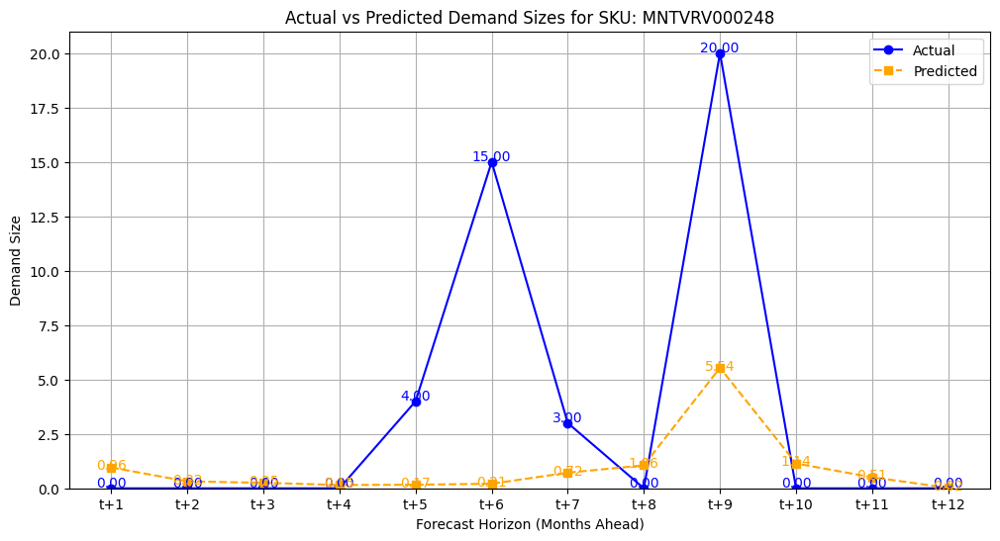

In [ ]:
plot_actual_vs_pred_size(df_fe, y_val, y_pred, y_val_indices, target_cols)

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def plot_mae_rmse_per_horizon(y_val, y_pred, horizon=H):
    """
    Plot MAE and RMSE per forecast horizon for the demand size model.
    Also adds a plot of average MAE and RMSE for the first 10 horizons.
    """
    horizons = [f"t+{i}" for i in range(1, horizon + 1)]

    # Compute MAE and RMSE for each horizon step
    maes = []
    rmses = []
    for i in range(horizon):
        mae = mean_absolute_error(y_val[:, i], y_pred[:, i])
        rmse = np.sqrt(mean_squared_error(y_val[:, i], y_pred[:, i]))
        maes.append(mae)
        rmses.append(rmse)
        print(f"t+{i+1} MAE: {mae:.4f}, RMSE: {rmse:.4f}")

    # ---------- Plot 1: MAE ----------
    plt.figure(figsize=(10, 5))
    plt.bar(horizons, maes, color='skyblue')
    plt.title("Mean Absolute Error (MAE) per Horizon")
    plt.xlabel("Horizon")
    plt.ylabel("MAE")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # ---------- Plot 2: RMSE ----------
    plt.figure(figsize=(10, 5))
    plt.bar(horizons, rmses, color='salmon')
    plt.title("Root Mean Squared Error (RMSE) per Horizon")
    plt.xlabel("Horizon")
    plt.ylabel("RMSE")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # ---------- Plot 3: Average MAE & RMSE (First 10 Horizons) ----------
    avg_mae_10 = np.mean(maes[:10])
    avg_rmse_10 = np.mean(rmses[:10])

    metrics_names = ["MAE (avg first 10)", "RMSE (avg first 10)"]
    avg_values = [avg_mae_10, avg_rmse_10]

    plt.figure(figsize=(8, 5))
    plt.bar(metrics_names, avg_values, color=['skyblue', 'salmon'])
    plt.title("Average MAE & RMSE (First 10 Horizons)")
    plt.ylabel("Score")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


t+1 MAE: 1.2450, RMSE: 7.3425
t+2 MAE: 1.1772, RMSE: 7.3122
t+3 MAE: 1.1660, RMSE: 7.2048
t+4 MAE: 1.0455, RMSE: 6.9145
t+5 MAE: 0.9594, RMSE: 6.8904
t+6 MAE: 0.9047, RMSE: 6.8659
t+7 MAE: 0.7616, RMSE: 5.2500
t+8 MAE: 0.6925, RMSE: 4.8976
t+9 MAE: 0.6407, RMSE: 4.7046
t+10 MAE: 0.5029, RMSE: 4.3430
t+11 MAE: 0.2792, RMSE: 1.0544
t+12 MAE: 0.1435, RMSE: 0.5210


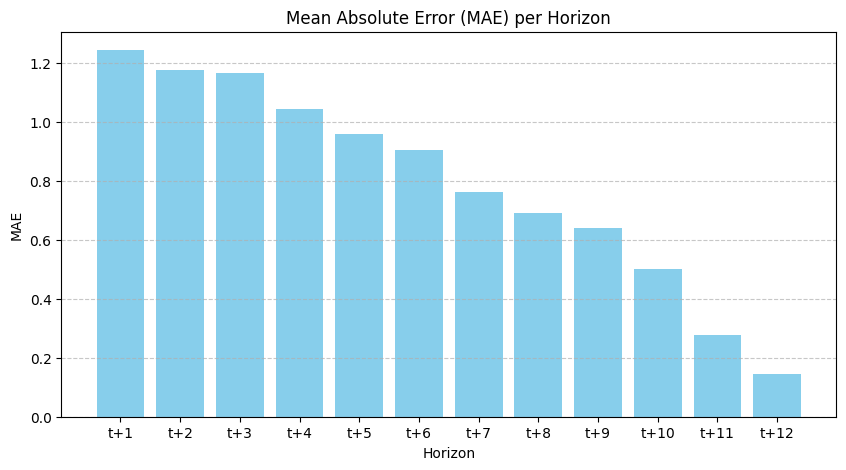

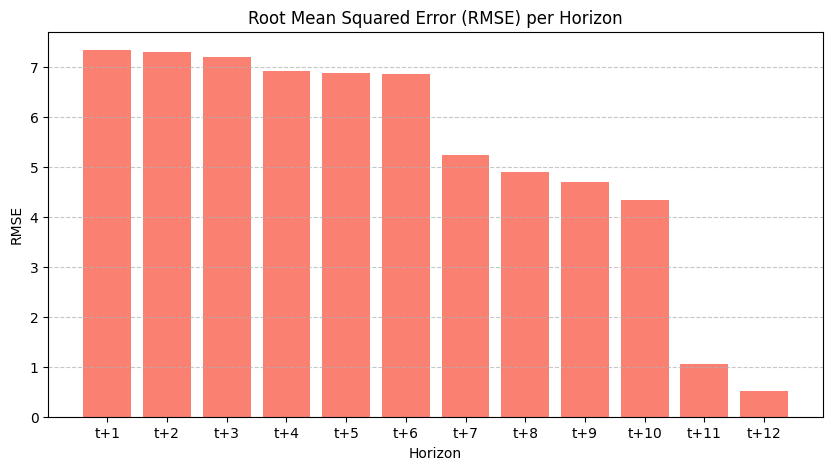

In [ ]:
plot_mae_rmse_per_horizon(y_val, y_pred, horizon=H)

## Combined Forecast

In [ ]:
import matplotlib.pyplot as plt
import random

def plot_combined_forecasts(df, y_val, y_prob_occurence, y_pred_occurence, y_pred_size,
                            y_val_indices, target_cols, partcode_col="PartCode", partCode = None):
    """
    Plots actual vs occurrence probability, occurrence prediction, size prediction,
    and combined forecasts for a random SKU from the validation set.
    """
    # Get unique SKUs from validation set
    val_partcodes = df.iloc[y_val_indices][partcode_col].unique()

    if partCode is None:
      # Randomly select one SKU
      random_sku = random.choice(val_partcodes)
      #random_sku = 'CONCOM007446'  # Uncomment to force a specific SKU
      print(f"\n📌 Randomly selected SKU: {random_sku}")

      selected_sku = random_sku

    else:

      selected_sku = partCode

    # Find rows for the selected SKU in validation set
    sku_mask = df.iloc[y_val_indices][partcode_col] == selected_sku

    # Filter actual and predicted values
    actual = y_val[sku_mask.values]
    prob_occur = y_prob_occurence[sku_mask.values]
    pred_occur = y_pred_occurence[sku_mask.values]
    pred_size = y_pred_size[sku_mask.values]

    # Sanity check
    if actual.shape[0] == 0:
        print("⚠️ No validation data for this SKU. Try rerunning to select a different SKU.")
        return

    # Combined forecasts
    combined_pred = pred_occur * np.ceil(pred_size).astype(int)
    combined_prob = prob_occur * pred_size

    # Plot settings
    plt.figure(figsize=(14, 8))
    horizons = [f"t+{i+1}" for i in range(actual.shape[1])]

    # Plot Actual Demand
    plt.plot(horizons, actual[0], marker='o', label="Actual Demand", color="blue", linewidth=2)
    for i, val in enumerate(actual[0]):
        plt.text(i, val + 0.05, str(val), ha='center', color="blue")

    # Plot Occurrence Probability
    plt.plot(horizons, prob_occur[0], marker='^', linestyle='--', label="Occurrence Probability", color="cyan")

    # Plot Occurrence Prediction
    plt.plot(horizons, pred_occur[0], marker='s', linestyle='--', label="Occurrence Prediction", color="green")

    # Plot Size Prediction
    plt.plot(horizons, pred_size[0], marker='D', linestyle=':', label="Size Prediction", color="purple")

    # Plot Combined (Occur × Size)
    plt.plot(horizons, combined_pred[0], marker='P', linestyle='-', label="Occurrence × Size", color="orange")

    # Plot Combined (Prob × Size)
    plt.plot(horizons, combined_prob[0], marker='X', linestyle='-', label="Probability × Size", color="red")

    # Styling
    plt.title(f"📦 Actual vs Forecasts for SKU: {selected_sku}")
    plt.xlabel("Forecast Horizon")
    plt.ylabel("Demand")
    plt.ylim(bottom=0)
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()



📌 Randomly selected SKU: CONCOM004179


/tmp/ipython-input-348-4069149448.py:67: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


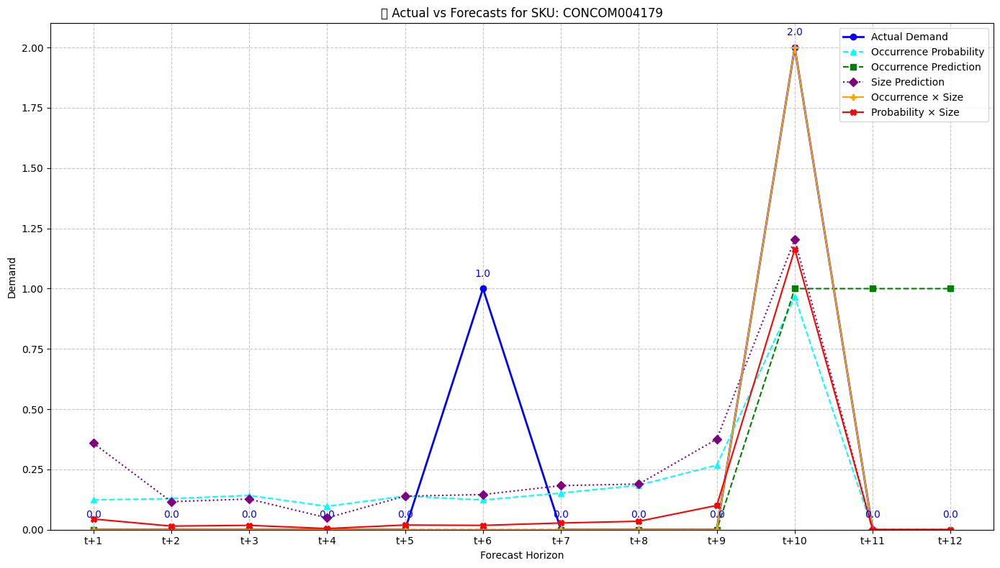

In [ ]:
plot_combined_forecasts(
    df_fe, y_val, y_prob_occurence, y_pred_occurence, y_pred_size, y_val_indices, target_cols
)


## Multi Task Modelling

In [ ]:
import pandas as pd
import numpy as np
from sklearn.multioutput import MultiOutputRegressor, MultiOutputClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, f1_score, precision_score, recall_score
import lightgbm as lgb
import matplotlib.pyplot as plt

# -----------------------
# PARAMETERS
# -----------------------
H = 12  # Forecast horizon (12 months)

# -----------------------
# FEATURE ENGINEERING
# -----------------------
def feature_engineering(df, sku_df):
    df = df.copy()
    df["MONTH_YEAR"] = pd.to_datetime(df["MONTH_YEAR"])
    df.sort_values(["PartCode", "MONTH_YEAR"], inplace=True)

    # Temporal features
    df["Month"] = df["MONTH_YEAR"].dt.month
    df["Month_sin"] = np.sin(2 * np.pi * df["Month"] / 12)
    df["Month_cos"] = np.cos(2 * np.pi * df["Month"] / 12)

    # Log-transform price
    df["LogPrice"] = np.log1p(df["EachPartPrice_consumption"])

    # Merge SKU-level meta data
    df = df.merge(
        sku_df[["SKU", "ADI", "CV2", 'MaxNonZeroDemand', 'MinNonZeroDemand']],
        how="left", left_on="PartCode", right_on="SKU"
    )
    df.rename(columns={"ADI": "SKU_ADI", "CV2": "SKU_CV2"}, inplace=True)

    # Ordinal encode CategoryABC
    cat_encoder = OrdinalEncoder()
    df["CategoryABC_encoded"] = cat_encoder.fit_transform(df[["CategoryABC"]]).astype(int)

    return df

# -----------------------
# TARGET CREATION
# -----------------------
def create_multi_horizon_targets(df, horizon=H):
    df = df.copy()
    occur_targets = []
    size_targets = []

    for i in range(1, horizon + 1):
        occur_col = f"Occur_t+{i}"
        size_col = f"Size_t+{i}"

        shifted = df.groupby("PartCode")["CONSUMPTION"].shift(-i).fillna(0)
        df[occur_col] = (shifted > 0).astype(int)
        df[size_col] = shifted

        occur_targets.append(occur_col)
        size_targets.append(size_col)

    return df, occur_targets, size_targets

# -----------------------
# SPLIT DATA
# -----------------------
def time_based_split(df, feature_cols, occur_cols, size_cols, months_train=24):
    split_date = df["MONTH_YEAR"].min() + pd.DateOffset(months=months_train)
    train_mask = df["MONTH_YEAR"] <= split_date
    val_mask = df["MONTH_YEAR"] > split_date

    X_train = df.loc[train_mask, feature_cols].values
    X_val = df.loc[val_mask, feature_cols].values

    y_train_occur = df.loc[train_mask, occur_cols].values
    y_val_occur = df.loc[val_mask, occur_cols].values

    y_train_size = df.loc[train_mask, size_cols].values
    y_val_size = df.loc[val_mask, size_cols].values

    return X_train, X_val, y_train_occur, y_val_occur, y_train_size, y_val_size

# -----------------------
# TRAIN MODELS
# -----------------------
def train_multi_task_models(X_train, y_train_occur, y_train_size):
    # Occurrence model (classification)
    occur_model = MultiOutputClassifier(
        lgb.LGBMClassifier(
            n_estimators=300,
            max_depth=6,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42
        )
    )
    occur_model.fit(X_train, y_train_occur)

    # Size model (regression)
    size_model = MultiOutputRegressor(
        lgb.LGBMRegressor(
            n_estimators=300,
            max_depth=6,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42
        )
    )
    size_model.fit(X_train, y_train_size)

    return occur_model, size_model

# -----------------------
# PREDICT
# -----------------------
def predict_multi_task(occur_model, size_model, X):
    y_prob_occur = occur_model.predict_proba(X)
    y_prob_occur = np.array([prob[:, 1] for prob in y_prob_occur]).T

    y_pred_occur = (y_prob_occur >= 0.5).astype(int)

    y_pred_size = size_model.predict(X)
    y_pred_size = np.round(y_pred_size * y_pred_occur)  # Zero out size where no occurrence

    return y_prob_occur, y_pred_occur, y_pred_size

# -----------------------
# EVALUATE
# -----------------------
def evaluate(y_val_occur, y_pred_occur, y_val_size, y_pred_size):
    metrics = {}
    for i in range(y_val_occur.shape[1]):
        f1 = f1_score(y_val_occur[:, i], y_pred_occur[:, i])
        mae = mean_absolute_error(y_val_size[:, i], y_pred_size[:, i])
        rmse = np.sqrt(mean_squared_error(y_val_size[:, i], y_pred_size[:, i]))

        # Store metrics in dictionary
        metrics[f"t+{i+1}_F1"] = f1
        metrics[f"t+{i+1}_MAE"] = mae
        metrics[f"t+{i+1}_RMSE"] = rmse

        # Print them as well
        print(f"\nHorizon t+{i+1}:")
        print(f"  F1-Score (Occurrence): {f1:.4f}")
        print(f"  MAE (Size): {mae:.2f}")
        print(f"  RMSE (Size): {rmse:.2f}")

    return metrics

# -----------------------
# PIPELINE
# -----------------------
df_fe = feature_engineering(xgb_occurence_model_input, sku_meta_filtered)
df_fe, occur_cols, size_cols = create_multi_horizon_targets(df_fe, H)
df_fe.dropna(subset=occur_cols + size_cols, inplace=True)

feature_cols = [
   'Cumulative_Consumption', 'Lag1', 'Lag2', 'Lag3',
   'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
   'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
   'RollingStd3', 'RollingMean6', 'RollingStd6', 'MaxNonZeroDemand',
   'MinNonZeroDemand', "LogPrice",
   "Month_sin", "Month_cos", "CategoryABC_encoded",
   'RollingCV2_3', 'RollingADI3', 'ExpandingCV2', 'ExpandingADI'
]

X_train, X_val, y_train_occur, y_val_occur, y_train_size, y_val_size = time_based_split(
    df_fe, feature_cols, occur_cols, size_cols
)

occur_model, size_model = train_multi_task_models(X_train, y_train_occur, y_train_size)

y_prob_occur, y_pred_occur, y_pred_size = predict_multi_task(occur_model, size_model, X_val)

metrics = evaluate(y_val_occur, y_pred_occur, y_val_size, y_pred_size)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11


Horizon t+1:
  F1-Score (Occurrence): 0.7244
  MAE (Size): 1.30
  RMSE (Size): 7.72

Horizon t+2:
  F1-Score (Occurrence): 0.6963
  MAE (Size): 1.10
  RMSE (Size): 7.37

Horizon t+3:
  F1-Score (Occurrence): 0.6781
  MAE (Size): 1.04
  RMSE (Size): 7.38

Horizon t+4:
  F1-Score (Occurrence): 0.7329
  MAE (Size): 0.87
  RMSE (Size): 7.03

Horizon t+5:
  F1-Score (Occurrence): 0.7433
  MAE (Size): 0.80
  RMSE (Size): 6.99

Horizon t+6:
  F1-Score (Occurrence): 0.7339
  MAE (Size): 0.79
  RMSE (Size): 7.01

Horizon t+7:
  F1-Score (Occurrence): 0.8010
  MAE (Size): 0.66
  RMSE (Size): 5.32

Horizon t+8:
  F1-Score (Occurrence): 0.8924
  MAE (Size): 0.49
  RMSE (Size): 4.96

Horizon t+9:
  F1-Score (Occurrence): 0.9011
  MAE (Size): 0.37
  RMSE (Size): 4.72

Horizon t+10:
  F1-Score (Occurrence): 1.0000
  MAE (Size): 0.23
  RMSE (Size): 4.27

Horizon t+11:
  F1-Score (Occurrence): 0.0000
  MAE (Size): 0.00
  RMSE (Size): 0.00

Horizon t+12:
  F1-Score (Occurrence): 0.0000
  MAE (Size): 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import matplotlib.pyplot as plt
import random

def plot_multi_task_actual_vs_pred(df, y_val_occur, y_prob_occur, y_pred_occur, y_pred_size, y_val_size, val_indices, partcode_col="PartCode"):
    """
    Plot actual demand vs predictions for a randomly chosen SKU
    """
    # Get PartCodes for validation set
    val_partcodes = df.loc[val_indices, partcode_col].unique()

    # Randomly select one SKU from validation set
    random_sku = random.choice(val_partcodes)
    random_sku = 'CONCOM007446'
    print(f"\n📌 Randomly selected SKU: {random_sku}")

    # Find rows in validation set belonging to the random SKU
    sku_mask = df.loc[val_indices, partcode_col] == random_sku

    # Filter actuals and predictions for the SKU
    actual_demand = y_val_size[sku_mask.values]
    prob_occur = y_prob_occur[sku_mask.values]
    pred_occur = y_pred_occur[sku_mask.values]
    pred_size = y_pred_size[sku_mask.values]

    # Derived predictions
    pred_combined = pred_occur * pred_size
    prob_combined = prob_occur * pred_size

    if actual_demand.shape[0] == 0:
        print("⚠️ No validation data for this SKU. Try rerunning to select a different SKU.")
        return

    # Plot
    plt.figure(figsize=(14, 7))
    horizons = [f"t+{i+1}" for i in range(actual_demand.shape[1])]

    # Plot Actual
    plt.plot(horizons, actual_demand[0], marker='o', label="Actual Demand", color="blue")
    for i, val in enumerate(actual_demand[0]):
        plt.text(i, val + 0.5, str(round(val)), ha='center', color="blue")

    # Plot Predicted Occurrence Probability
    plt.plot(horizons, prob_occur[0], marker='x', linestyle='--', label="P(Occurrence)", color="purple")

    # Plot Predicted Occurrence (0/1)
    plt.plot(horizons, pred_occur[0], marker='s', linestyle=':', label="Predicted Occurrence (0/1)", color="orange")

    # Plot Predicted Size
    plt.plot(horizons, pred_size[0], marker='^', linestyle='-.', label="Predicted Size", color="green")

    # Plot Combined Demand (Predicted Occurrence * Size)
    plt.plot(horizons, pred_combined[0], marker='v', linestyle='--', label="Predicted Occurrence × Size", color="red")

    # Plot Combined Demand (P(Occur) × Size)
    plt.plot(horizons, prob_combined[0], marker='D', linestyle='-', label="P(Occur) × Size", color="brown")

    # Styling
    plt.title(f"Actual vs Predictions for SKU: {random_sku}")
    plt.xlabel("Forecast Horizon")
    plt.ylabel("Demand")
    plt.ylim(-0.2, max(actual_demand[0].max(), pred_size[0].max()) * 1.2)
    plt.legend()
    plt.grid(True)
    plt.show()



📌 Randomly selected SKU: CONCOM007446


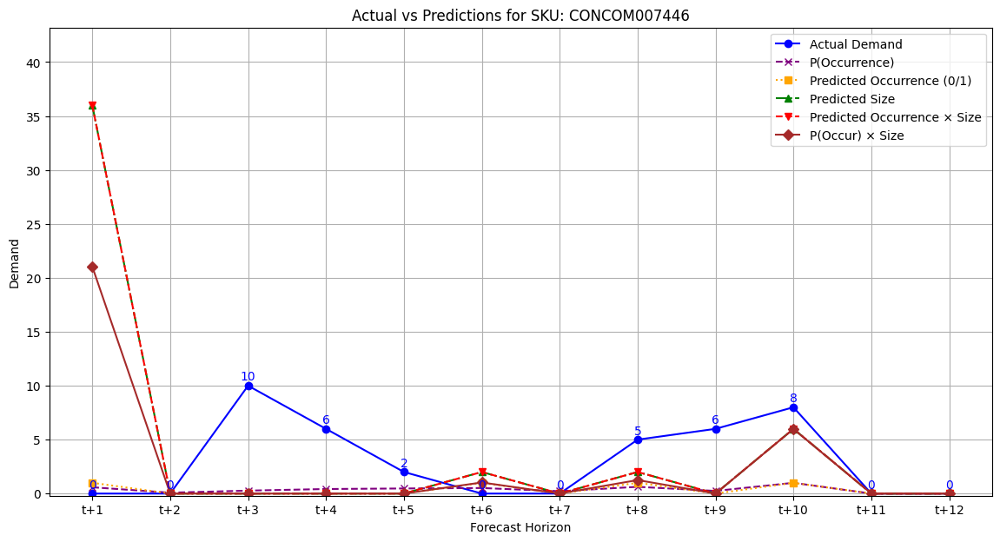

In [ ]:
plot_multi_task_actual_vs_pred(
    df_fe,
    y_val_occur,
    y_prob_occur,
    y_pred_occur,
    y_pred_size,
    y_val_size,
    val_indices=y_val_indices
)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_multi_task_metrics(metrics, horizon=12):
    horizons = [f"t+{i}" for i in range(1, horizon + 1)]
    x = np.arange(len(horizons))

    # Extract metric values per horizon
    f1_scores = [metrics.get(f"t+{i}_F1", 0) for i in range(1, horizon + 1)]
    maes = [metrics.get(f"t+{i}_MAE", 0) for i in range(1, horizon + 1)]
    rmses = [metrics.get(f"t+{i}_RMSE", 0) for i in range(1, horizon + 1)]

    # ---------- Plot 1: F1-Score ----------
    plt.figure(figsize=(10, 5))
    plt.bar(horizons, f1_scores, color='steelblue')
    plt.title("F1-Score per Horizon (Demand Occurrence)")
    plt.xlabel("Horizon")
    plt.ylabel("F1-Score")
    plt.ylim(0, 1)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # ---------- Plot 2: MAE ----------
    plt.figure(figsize=(10, 5))
    plt.bar(horizons, maes, color='orange')
    plt.title("MAE per Horizon (Demand Size)")
    plt.xlabel("Horizon")
    plt.ylabel("Mean Absolute Error (MAE)")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # ---------- Plot 3: RMSE ----------
    plt.figure(figsize=(10, 5))
    plt.bar(horizons, rmses, color='green')
    plt.title("RMSE per Horizon (Demand Size)")
    plt.xlabel("Horizon")
    plt.ylabel("Root Mean Squared Error (RMSE)")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


In [ ]:
metrics

{'t+1_MAE': 1.245006403377934,
 't+1_RMSE': np.float64(7.342548836949687),
 't+2_MAE': 1.1771545978118447,
 't+2_RMSE': np.float64(7.312150254674806),
 't+3_MAE': 1.1659785411696142,
 't+3_RMSE': np.float64(7.204757954933852),
 't+4_MAE': 1.0454756894756878,
 't+4_RMSE': np.float64(6.914526260794628),
 't+5_MAE': 0.9594063960359596,
 't+5_RMSE': np.float64(6.89036236037602),
 't+6_MAE': 0.9047370845522481,
 't+6_RMSE': np.float64(6.865903392048255),
 't+7_MAE': 0.7616374893203975,
 't+7_RMSE': np.float64(5.2499824081527775),
 't+8_MAE': 0.6924576200419749,
 't+8_RMSE': np.float64(4.897600914146192),
 't+9_MAE': 0.6406971878391645,
 't+9_RMSE': np.float64(4.704648830128615),
 't+10_MAE': 0.5029085423167526,
 't+10_RMSE': np.float64(4.343043880258744),
 't+11_MAE': 0.27915786152650557,
 't+11_RMSE': np.float64(1.0544086279044902),
 't+12_MAE': 0.14352311103608703,
 't+12_RMSE': np.float64(0.5209726703413485)}

In [ ]:
def evaluate(y_val_occur, y_pred_occur, y_val_size, y_pred_size):
    metrics = {}
    for i in range(y_val_occur.shape[1]):
        f1 = f1_score(y_val_occur[:, i], y_pred_occur[:, i])
        mae = mean_absolute_error(y_val_size[:, i], y_pred_size[:, i])
        rmse = np.sqrt(mean_squared_error(y_val_size[:, i], y_pred_size[:, i]))

        # Store metrics in dictionary
        metrics[f"t+{i+1}_F1"] = f1
        metrics[f"t+{i+1}_MAE"] = mae
        metrics[f"t+{i+1}_RMSE"] = rmse

        # Print them as well
        print(f"\nHorizon t+{i+1}:")
        print(f"  F1-Score (Occurrence): {f1:.4f}")
        print(f"  MAE (Size): {mae:.2f}")
        print(f"  RMSE (Size): {rmse:.2f}")

    return metrics

In [ ]:
metrics = evaluate(y_val_occur, y_pred_occur, y_val_size, y_pred_size)


Horizon t+1:
  F1-Score (Occurrence): 0.7244
  MAE (Size): 1.30
  RMSE (Size): 7.72

Horizon t+2:
  F1-Score (Occurrence): 0.6963
  MAE (Size): 1.10
  RMSE (Size): 7.37

Horizon t+3:
  F1-Score (Occurrence): 0.6781
  MAE (Size): 1.04
  RMSE (Size): 7.38

Horizon t+4:
  F1-Score (Occurrence): 0.7329
  MAE (Size): 0.87
  RMSE (Size): 7.03

Horizon t+5:
  F1-Score (Occurrence): 0.7433
  MAE (Size): 0.80
  RMSE (Size): 6.99

Horizon t+6:
  F1-Score (Occurrence): 0.7339
  MAE (Size): 0.79
  RMSE (Size): 7.01

Horizon t+7:
  F1-Score (Occurrence): 0.8010
  MAE (Size): 0.66
  RMSE (Size): 5.32

Horizon t+8:
  F1-Score (Occurrence): 0.8924
  MAE (Size): 0.49
  RMSE (Size): 4.96

Horizon t+9:
  F1-Score (Occurrence): 0.9011
  MAE (Size): 0.37
  RMSE (Size): 4.72

Horizon t+10:
  F1-Score (Occurrence): 1.0000
  MAE (Size): 0.23
  RMSE (Size): 4.27

Horizon t+11:
  F1-Score (Occurrence): 0.0000
  MAE (Size): 0.00
  RMSE (Size): 0.00

Horizon t+12:
  F1-Score (Occurrence): 0.0000
  MAE (Size): 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


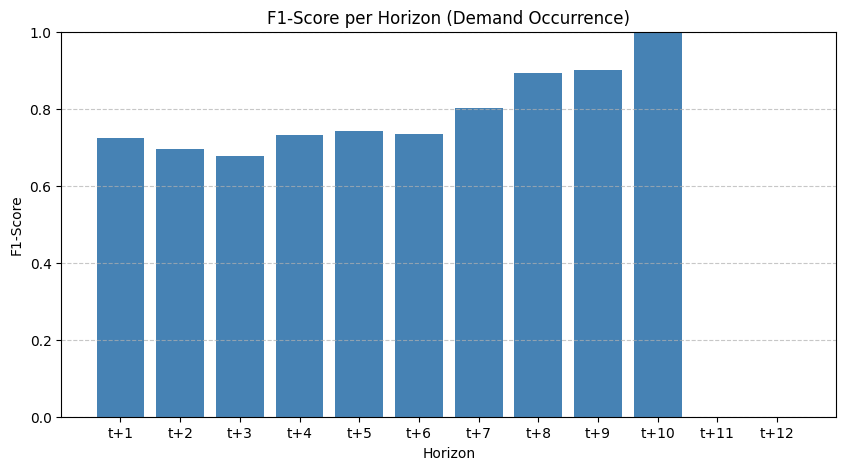

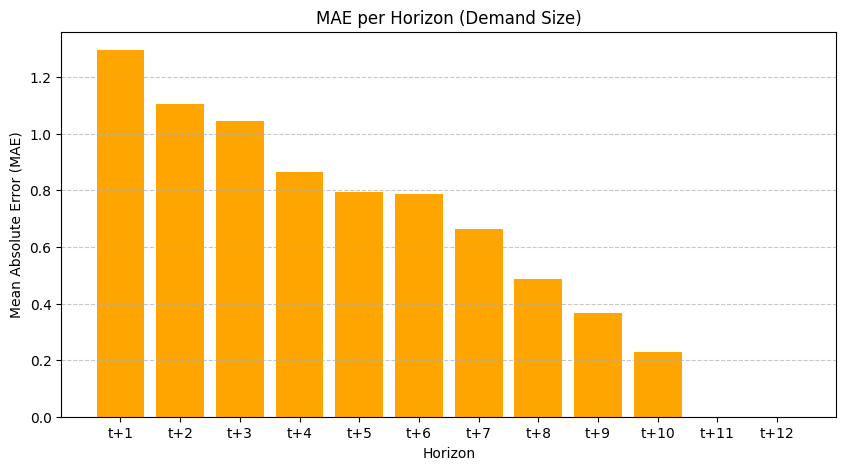

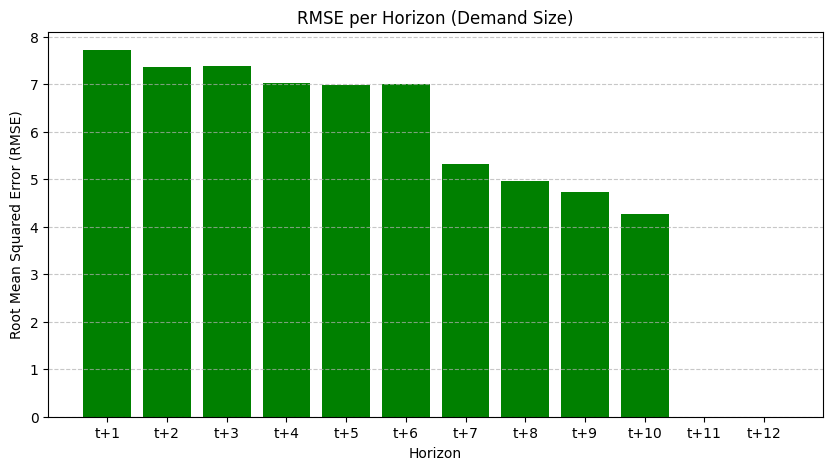

In [ ]:
plot_multi_task_metrics(metrics, horizon=12)

In [ ]:
import matplotlib.pyplot as plt

def calculate_global_metrics(y_true, y_pred, y_true_occur, threshold=0.5):
    """
    y_true: true demand size (2D: samples x horizons)
    y_pred: predicted demand size (2D)
    y_true_occur: true occurrence (2D) -> used for scaling metrics
    """
    metrics = {
        "MASE": [],
        "MAPE_ID": [],
        "MAE_NZ": [],
        "MSSE": []
    }

    # Scaling factor for MASE and MSSE (naive forecast = previous demand)
    naive_forecast_errors = np.abs(np.diff(y_true, axis=0)).mean(axis=0)
    naive_forecast_errors[naive_forecast_errors == 0] = 1e-6  # Avoid div by zero

    for i in range(y_true.shape[1]):  # Horizon loop
        true = y_true[:, i]
        pred = y_pred[:, i]
        occur = y_true_occur[:, i]

        # Mask for Non-Zero Demand (NZD)
        nz_mask = true > 0

        # Errors
        abs_errors = np.abs(true - pred)
        squared_errors = (true - pred) ** 2

        # MASE
        mase = abs_errors.mean() / naive_forecast_errors[i]

        # MAPE-ID (ignore zeros in denominator)
        mape_id = (abs_errors[nz_mask] / true[nz_mask]).mean() * 100 if nz_mask.any() else 0

        # MAE-NZ (only on non-zero demand periods)
        mae_nz = abs_errors[nz_mask].mean() if nz_mask.any() else 0

        # MSSE
        msse = squared_errors.mean() / (naive_forecast_errors[i] ** 2)

        # Append
        metrics["MASE"].append(mase)
        metrics["MAPE_ID"].append(mape_id)
        metrics["MAE_NZ"].append(mae_nz)
        metrics["MSSE"].append(msse)

    return metrics


def plot_global_metrics(metrics, horizons=None):
    if horizons is None:
        horizons = [f"t+{i+1}" for i in range(len(next(iter(metrics.values()))))]

    for metric_name, values in metrics.items():
        plt.figure(figsize=(10, 5))
        plt.bar(horizons, values, color="skyblue")
        plt.title(f"Global {metric_name} per Horizon")
        plt.xlabel("Horizon")
        plt.ylabel(metric_name)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()


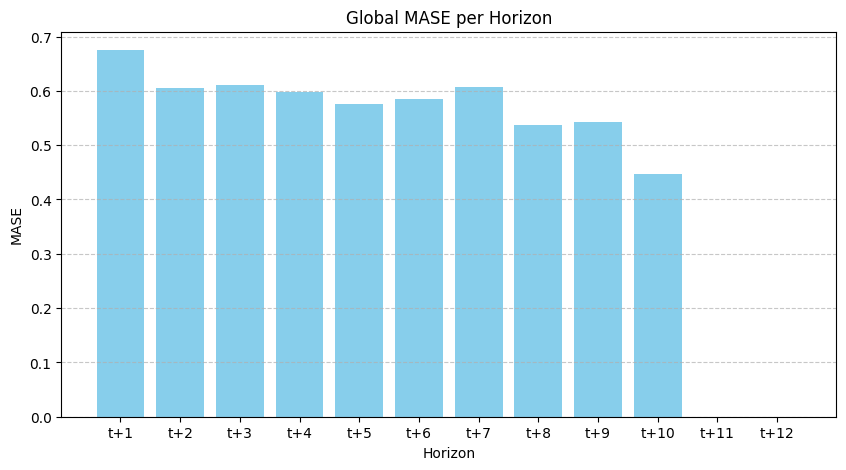

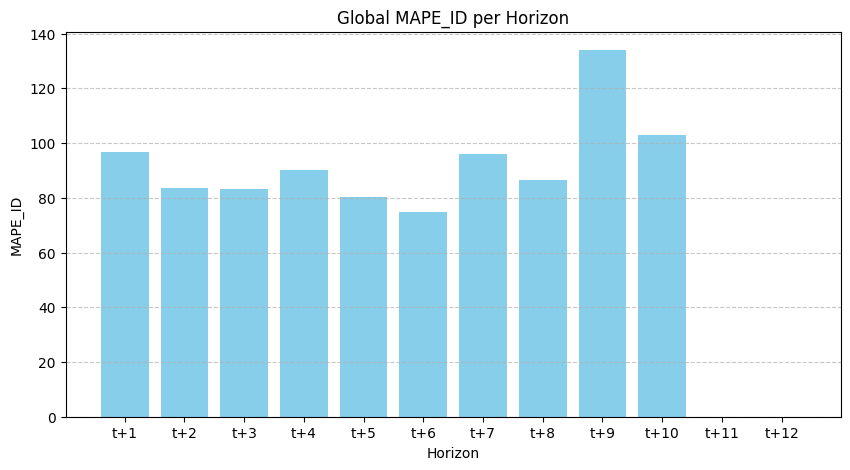

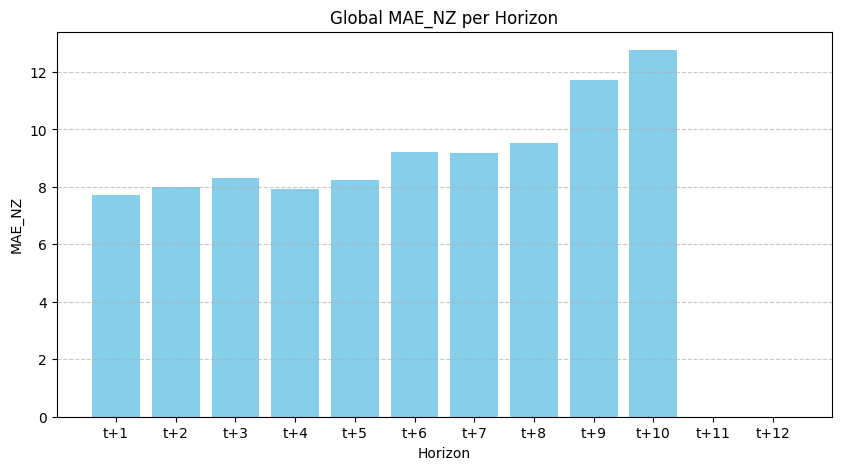

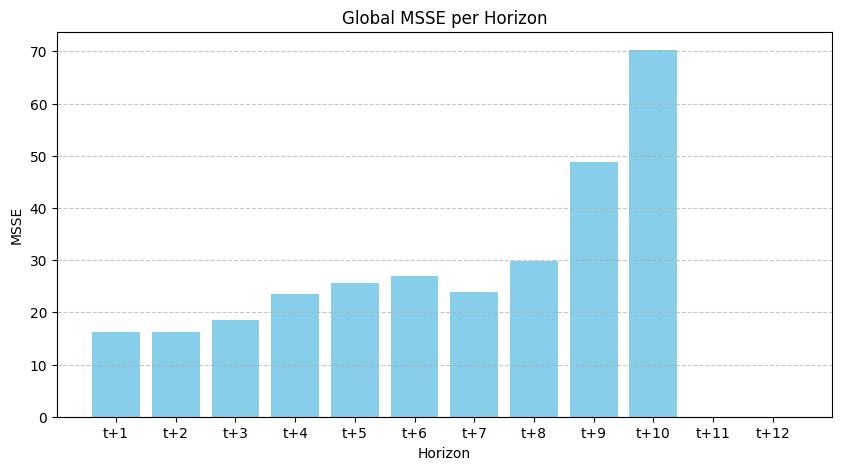

In [ ]:
# Compute metrics
global_metrics = calculate_global_metrics(
    y_val_size,                # true size
    y_pred_size,               # predicted size
    y_val_occur                # true occurrence (for intermittent demand)
)

# Plot metrics
plot_global_metrics(global_metrics)


## SKU level metrics

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ----------------------------
# CATEGORIZATION FUNCTIONS
# ----------------------------
def categorize_mase(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 2.5:
        return 'Good'
    else:
        return 'Poor'

def categorize_msse(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 6.25:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_nz(x):
    if x <= 5:
        return 'Excellent'
    elif 5 < x <= 15:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_id(x):
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

# ----------------------------
# SKU-LEVEL METRIC CALCULATION
# ----------------------------
def compute_sku_level_metrics(df, y_true_size, y_pred_size, y_true_occur,y_pred_occur):
    """
    df: original dataframe with SKU-level info
    y_true_size, y_pred_size: arrays of true/predicted demand sizes
    y_true_occur: true occurrence matrix (for intermittent demand)
    """
    sku_metrics = []

    for partcode in df["PartCode"].unique():
        mask = df["PartCode"] == partcode
        true = y_true_size[mask.values]
        #pred = y_pred_size[mask.values]
        pred_size = y_pred_size[mask.values]
        pred_occur = y_pred_occur[mask.values]
        occur = y_true_occur[mask.values]

        # Flatten horizons for this SKU
        true_flat = true.flatten()
        #pred_flat = pred.flatten()
        pred_flat = (pred_size * pred_occur).flatten()
        occur_flat = occur.flatten()

        # Naive forecast error (previous period demand)
        naive_errors = np.abs(np.diff(true_flat)).mean()
        if naive_errors == 0:
            naive_errors = 1e-6

        # Errors
        abs_errors = np.abs(true_flat - pred_flat)
        squared_errors = (true_flat - pred_flat) ** 2
        nz_mask = true_flat > 0

        # Metrics
        mase = abs_errors.mean() / naive_errors
        msse = squared_errors.mean() / (naive_errors ** 2)
        mae_nz = abs_errors[nz_mask].mean() if nz_mask.any() else 0
        mape_id = (abs_errors[nz_mask] / true_flat[nz_mask]).mean() * 100 if nz_mask.any() else 0

        sku_metrics.append({
            "PartCode": partcode,
            "MASE": mase,
            "MSSE": msse,
            "MAE_NZ": mae_nz,
            "MAPE_ID": mape_id,
            "CategoryABC": df.loc[mask, "CategoryABC"].iloc[0]
        })

    return pd.DataFrame(sku_metrics)

# ----------------------------
# APPLY CATEGORIZATION
# ----------------------------
def apply_categories(df):
    categories = ['Excellent', 'Good', 'Poor']
    df['MASE_Category'] = pd.Categorical(df['MASE'].apply(categorize_mase), categories=categories, ordered=True)
    df['MSSE_Category'] = pd.Categorical(df['MSSE'].apply(categorize_msse), categories=categories, ordered=True)
    df['MAE_NZ_Category'] = pd.Categorical(df['MAE_NZ'].apply(categorize_mae_nz), categories=categories, ordered=True)
    df['MAPE_ID_Category'] = pd.Categorical(df['MAPE_ID'].apply(categorize_mape_id), categories=categories, ordered=True)
    return df

# ----------------------------
# PLOT FUNCTION
# ----------------------------
def plot_sku_performance_categories(sku_metrics_df):
    palette = sns.color_palette("Set2")
    categories = ['Excellent', 'Good', 'Poor']
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    axes = axes.flatten()

    metrics_cols = ['MASE_Category', 'MSSE_Category', 'MAE_NZ_Category', 'MAPE_ID_Category']
    titles = ['MASE', 'MSSE', 'MAE-NZ', 'MAPE-ID']

    for i, (metric_col, title) in enumerate(zip(metrics_cols, titles)):
        sns.histplot(
            data=sku_metrics_df,
            x=metric_col,
            hue='CategoryABC',
            multiple='stack',
            shrink=0.8,
            palette=palette,
            hue_order=sorted(sku_metrics_df['CategoryABC'].unique()),
            discrete=True,
            ax=axes[i],
            stat="count"
        )
        axes[i].set_title(f"{title} Performance Categories")
        axes[i].set_xlabel('Performance')
        axes[i].set_ylabel('SKU Count')
        axes[i].set_xticks(range(len(categories)))
        axes[i].set_xticklabels(categories)

    plt.tight_layout()
    plt.show()


/tmp/ipython-input-388-139600462.py:114: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-388-139600462.py:114: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-388-139600462.py:114: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-388-139600462.py:114: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


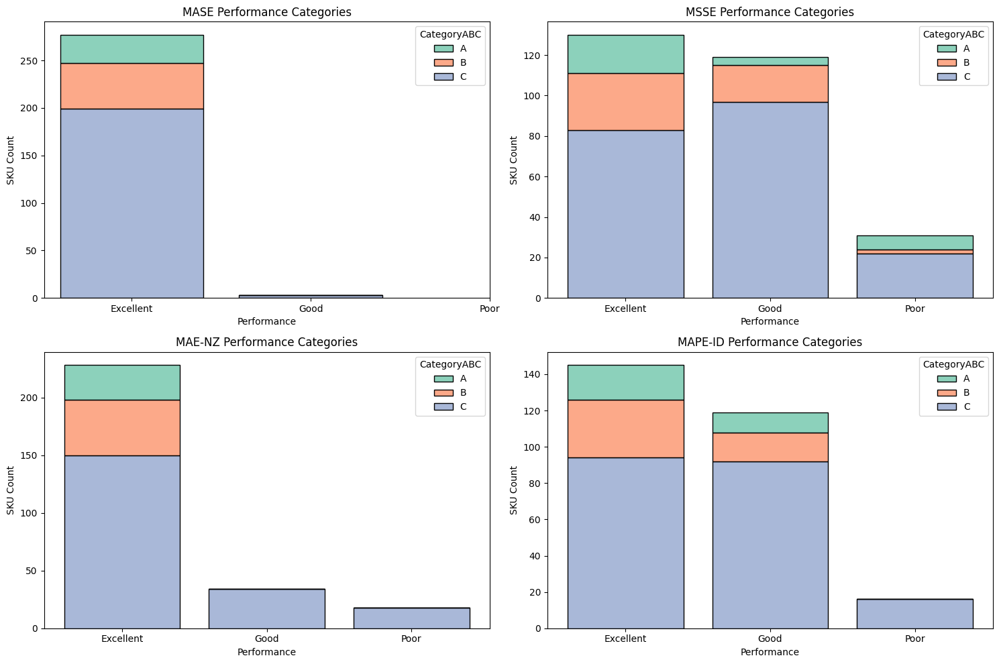

In [ ]:
# Compute SKU-level metrics
sku_metrics_df = compute_sku_level_metrics(
    df_fe.iloc[y_val_indices], y_val_size, y_pred_size, y_val_occur
)

# Apply categories
sku_metrics_df = apply_categories(sku_metrics_df)

# Plot stacked bar plots
plot_sku_performance_categories(sku_metrics_df)


# Deep Learning Models

## DeepAR (Amazon) - Deep Learning Auto Regressive Model

In [ ]:
df_filtered.T.shape

(42, 10080)

In [ ]:
!pip install pytorch-lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 39.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 102.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 kB 52.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitli

In [ ]:
!pip install pytorch-forecasting

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.9/260.9 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 821.1/821.1 kB 52.4 MB/s eta 0:00:00


In [ ]:
!pip install pytorch

  Using cached pytorch-1.0.2.tar.gz (689 bytes)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pytorch
  Running setup.py clean for pytorch
Failed to build pytorch
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (pytorch)


In [ ]:

from pytorch_forecasting import TimeSeriesDataSet, DeepAR, TemporalFusionTransformer
from pytorch_forecasting.data import GroupNormalizer
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
from sklearn.preprocessing import LabelEncoder
from pytorch_forecasting.data.encoders import NaNLabelEncoder

In [ ]:
df_filtered.head(5)

,PartCode,Description_consumption,UOM_consumption,Make_consumption,CategoryABC,MinStock,MaxStock,SAPQty_consumption,CommonMachineName_consumption,Line_consumption,...,RollingStd3,RollingMean6,RollingStd6,RollingNonZeroMean3,RollingNonZeroStdDev3,RollingCV2_3,RollingADI3,ExpandingCV2,ExpandingADI,time_idx
335,0,BEARING 6201 ZZ,0,19,2,2,3,5.0,3,0,...,NaN,5.000000,NaN,5.000000,NaN,NaN,10.000000,NaN,10.0,0
802,0,BEARING 6201 ZZ,0,19,2,2,3,5.0,3,0,...,2.828427,3.000000,2.828427,3.000000,2.828427,0.888889,9.500000,0.888889,9.5,1
1269,0,BEARING 6201 ZZ,0,19,2,2,3,5.0,3,0,...,2.081666,2.666667,2.081666,2.666667,2.081666,0.609375,9.000000,0.609375,9.0,2
1736,0,BEARING 6201 ZZ,0,19,2,2,3,5.0,3,0,...,1.000000,2.000000,2.160247,1.500000,0.707107,1.000000,8.000000,1.166667,8.5,3
2203,0,BEARING 6201 ZZ,0,19,2,2,3,5.0,3,0,...,1.000000,1.800000,1.923538,1.500000,0.707107,1.000000,7.333333,1.141975,8.2,4


In [ ]:
# Combine the lists of categorical columns
all_categoricals = static_categoricals + time_varying_known_categoricals

for col in all_categoricals:
    print(f"Checking column: {col}")

    # Check if all non-null values are strings
    non_null_values = data[col].dropna()
    non_string_values = non_null_values[~non_null_values.apply(lambda x: isinstance(x, str))]
    if not non_string_values.empty:
        print(f"❌ Column '{col}' contains non-string values:\n{non_string_values.unique()}\n")
    else:
        print(f"✅ Column '{col}' all non-null values are strings.")

    # Check for inconsistent NaNs
    unique_nulls = data[col].isnull().sum(), (data[col] == "nan").sum(), (data[col] == "NA").sum(), (data[col] == None).sum()
    if any(unique_nulls[1:]):
        print(f"⚠️ Column '{col}' has inconsistent NaNs (string 'nan', 'NA', or None detected).")
    else:
        print(f"✅ Column '{col}' NaNs are consistent (only np.nan).\n")

Checking column: PartCode
✅ Column 'PartCode' all non-null values are strings.
✅ Column 'PartCode' NaNs are consistent (only np.nan).

Checking column: CategoryABC
✅ Column 'CategoryABC' all non-null values are strings.
✅ Column 'CategoryABC' NaNs are consistent (only np.nan).

Checking column: partCategory
✅ Column 'partCategory' all non-null values are strings.
✅ Column 'partCategory' NaNs are consistent (only np.nan).

Checking column: UOM_consumption
✅ Column 'UOM_consumption' all non-null values are strings.
✅ Column 'UOM_consumption' NaNs are consistent (only np.nan).

Checking column: Make_consumption
✅ Column 'Make_consumption' all non-null values are strings.
✅ Column 'Make_consumption' NaNs are consistent (only np.nan).

Checking column: CommonMachineName_consumption
✅ Column 'CommonMachineName_consumption' all non-null values are strings.
✅ Column 'CommonMachineName_consumption' NaNs are consistent (only np.nan).

Checking column: Line_consumption
✅ Column 'Line_consumption'

In [ ]:
seq_lengths = data.groupby("PartCode")["time_idx"].count().sort_values()
print((seq_lengths<36).sum())

0


In [ ]:
for partcode, grp in data.groupby("PartCode"):
    diffs = grp["time_idx"].diff().dropna().unique()
    if not all(diffs == 1):
        print(f"❗ Non-continuous time_idx for {partcode}: {diffs}")

In [ ]:
print(data[time_varying_known_reals + time_varying_unknown_reals].isnull().sum())

CONSUMPTION               0
Cumulative_Consumption    0
Lag1                      0
Lag2                      0
Lag3                      0
NonZeroLag1               0
NonZeroLag2               0
MonthsSinceLastDemand     0
RollingMean3              0
RollingStd3               0
RollingMean6              0
RollingStd6               0
RollingNonZeroMean3       0
RollingNonZeroStdDev3     0
RollingCV2_3              0
RollingADI3               0
ExpandingCV2              0
ExpandingADI              0
dtype: int64


In [ ]:
print("Rows before:", len(data))
print("Unique SKUs:", data["PartCode"].nunique())
print("Time idx range:", data["time_idx"].min(), data["time_idx"].max())

filtered = data[data["time_idx"] <= training_cutoff]
print("Rows after cutoff:", len(filtered))
print("Unique SKUs after cutoff:", filtered["PartCode"].nunique())

Rows before: 10080
Unique SKUs: 280
Time idx range: 0 35
Rows after cutoff: 6720
Unique SKUs after cutoff: 280


In [ ]:
print(data[static_categoricals].isnull().sum())
print(data[static_categoricals].dtypes)

PartCode                         0
CategoryABC                      0
partCategory                     0
UOM_consumption                  0
Make_consumption                 0
CommonMachineName_consumption    0
Line_consumption                 0
dtype: int64
PartCode                         object
CategoryABC                      object
partCategory                     object
UOM_consumption                  object
Make_consumption                 object
CommonMachineName_consumption    object
Line_consumption                 object
dtype: object


In [ ]:
print(data[time_varying_known_categoricals].isnull().sum())
print(data[time_varying_known_categoricals].dtypes)
for col in time_varying_known_categoricals:
    print(f"{col} unique:", data[col].nunique())

MONTH    0
dtype: int64
MONTH    object
dtype: object
MONTH unique: 36


In [ ]:
min_max = data.groupby("PartCode")["time_idx"].agg(["min", "max"])
print(min_max)
print("Any SKUs with <35 max time_idx:", (min_max["max"] < 35).sum())

              min  max
PartCode              
CONCOM002378    0   35
CONCOM003449    0   35
CONCOM003805    0   35
CONCOM004179    0   35
CONCOM004400    0   35
...           ...  ...
MNTVRV000179    0   35
MNTVRV000231    0   35
MNTVRV000246    0   35
MNTVRV000247    0   35
MNTVRV000248    0   35

[280 rows x 2 columns]
Any SKUs with <35 max time_idx: 0


In [ ]:
data["time_idx"] = data.groupby("PartCode").cumcount()

In [ ]:


# ==== Load Data ====
data = df_filtered.copy(deep=True)
data.sort_values(["PartCode", "MONTH_YEAR"], inplace=True)
rolling_lag_features = [
    "Lag1", "Lag2", "Lag3", "NonZeroLag1", "NonZeroLag2",
    "RollingMean3", "RollingStd3", "RollingMean6", "RollingStd6",
    "RollingNonZeroMean3", "RollingNonZeroStdDev3",
    "RollingCV2_3", "ExpandingCV2"
]

data[rolling_lag_features] = data[rolling_lag_features].fillna(0)
# ==== Config ====
target = "CONSUMPTION"
time_idx = "MONTH_YEAR"
group_ids = ["PartCode"]
max_prediction_length = 12  # Forecast 12 months
max_encoder_length = 24     # Use 24 months for training
batch_size = 64


# ==== Select Features ====
# Choose static and time-varying covariates here
# static_categoricals = ["PartCode", "CategoryABC", "partCategory"]
# static_reals = ["EachPartPrice_consumption", "MinStock", "MaxStock"]

# time_varying_known_categoricals = ["MONTH"]
# time_varying_known_reals = ["MonthsSinceLastDemand"]

# time_varying_unknown_reals = [target, "RollingMean3", "RollingStd3", "PROCUREMENT", "Running_Stock"]

static_categoricals = [
    "PartCode",
    "CategoryABC",
    "partCategory",
    "UOM_consumption",
    "Make_consumption",
    "CommonMachineName_consumption",
    "Line_consumption"
]

static_reals = [
    "EachPartPrice_consumption"
]

time_varying_known_categoricals = [
    "MONTH"  # If not already in dataset, extract from MONTH_YEAR
]

time_varying_known_reals = [
]

time_varying_unknown_reals = [
    "CONSUMPTION",
    "Cumulative_Consumption",
    "Lag1",
    "Lag2",
    "Lag3",
    "NonZeroLag1",
    "NonZeroLag2",
    "MonthsSinceLastDemand",
    "RollingMean3",
    "RollingStd3",
    "RollingMean6",
    "RollingStd6",
    "RollingNonZeroMean3",
    "RollingNonZeroStdDev3",
    "RollingCV2_3",
    "RollingADI3",
    "ExpandingCV2",
    "ExpandingADI"
    # "NZD_percent_train",
    # "NZD_percent_test",
    # "NZD_percent_total"
]
for col in static_categoricals + time_varying_known_categoricals:
    #data[col] = data[col].where(data[col].isnull(), data[col].astype(str))
    data[col] = data[col].fillna("__missing__").astype(str)

data["EachPartPrice_consumption"] = data["EachPartPrice_consumption"].fillna(
    data["EachPartPrice_consumption"].median()
)
# Encode categoricals
# for col in static_categoricals + time_varying_known_categoricals:
#     le = LabelEncoder()
#     data[col] = le.fit_transform(data[col].astype(str))

# Add time index
data["time_idx"] = data.groupby("PartCode").cumcount()

# ==== Create Dataset ====
training_cutoff = data["time_idx"].max() - max_prediction_length

categorical_encoders = {
    col: NaNLabelEncoder(add_nan=True) for col in static_categoricals + time_varying_known_categoricals
}

training = TimeSeriesDataSet(
    data[data.time_idx <= training_cutoff],
    time_idx="time_idx",
    target=target,
    group_ids=group_ids,
    max_encoder_length=12,
    max_prediction_length=12,
    static_categoricals=static_categoricals,
    static_reals=static_reals,
    time_varying_known_categoricals=time_varying_known_categoricals,
    time_varying_known_reals=time_varying_known_reals,
    time_varying_unknown_reals=time_varying_unknown_reals,
    target_normalizer=GroupNormalizer(groups=group_ids),
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
    allow_missing_timesteps=True,
    constant_fill_strategy={"CONSUMPTION": 0},
     categorical_encoders=categorical_encoders,
)



validation = TimeSeriesDataSet.from_dataset(training, data, min_prediction_idx=training_cutoff + 1)

# Create dataloaders
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

# ==== Model ====
model = DeepAR.from_dataset(
    training,
    learning_rate=1e-3,
    hidden_size=64,
    rnn_layers=2,
    dropout=0.1
)

# ==== Training ====
trainer = Trainer(
    max_epochs=50,
    gpus=1 if torch.cuda.is_available() else 0,
    gradient_clip_val=0.1,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, mode="min"),
        LearningRateMonitor(logging_interval='epoch')
    ],
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    model,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# ==== Forecast ====
raw_predictions, x = model.predict(val_dataloader, mode="raw", return_x=True)

# Plot for one SKU
import matplotlib.pyplot as plt

idx = 0  # change to see other SKUs
model.plot_prediction(x, raw_predictions, idx=idx)
plt.show()

# ==== Save Model ====
model.save("deepar_model")



/usr/local/lib/python3.11/dist-packages/pytorch_forecasting/data/encoders.py:401: UserWarning: Found 12 unknown classes which were set to NaN
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.11/dist-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


AssertionError: Encoder and decoder variables have to be the same apart from target variable

In [ ]:
type(data.time_idx[0])

numpy.int64

## DeepAR - Gluonts

In [ ]:
!pip install gluonts

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 56.6 MB/s eta 0:00:00


In [ ]:
!pip install mxnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 111.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.21
    Uninstalling graphviz-0.21:
      Successfully uninstalled graphviz-0.21
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.

In [ ]:
!pip uninstall numpy


Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Would remove:
    /usr/local/bin/f2py
    /usr/local/lib/python3.11/dist-packages/numpy-1.26.4.dist-info/*
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libgfortran-040039e1.so.5.0.0
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libopenblas64_p-r0-0cf96a72.3.23.dev.so
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libquadmath-96973f99.so.0.0.0
    /usr/local/lib/python3.11/dist-packages/numpy/*
Proceed (Y/n)? Y
  Successfully uninstalled numpy-1.26.4


In [ ]:
!pip install numpy==1.23.5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 117.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 2025.7.1 requires numpy>=1.26, but you have numpy 1.23.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.23.5 which is incompatible.
geopandas 1.1.1 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
chex 0.1.89 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.
arviz 0.22.0 requires numpy>=1.26.0, but you have numpy 1.23.5 which is incompatible.
albumentations 2.0.8 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
scipy 1.16.0 requires numpy<2.6,>=1.25.2, but you have numpy 1.23.5 which is

In [ ]:
from gluonts.dataset.common import ListDataset
from gluonts.mx.model.deepar import DeepAREstimator
from gluonts.mx.trainer import Trainer
from gluonts.evaluation import Evaluator
from gluonts.evaluation.backtest import make_evaluation_predictions
from tqdm import tqdm
import matplotlib.pyplot as plt
import mxnet as mx

# 1. Clean and prepare data
df = df.sort_values(['PartCode', 'time_idx'])

# Convert Month column to datetime
df['start'] = pd.to_datetime(df['Month'], format='%b-%y')

# Split time range
train_cutoff = df['time_idx'].max() - 12  # last 12 for testing

# 2. Create GluonTS-compatible training and testing datasets
def make_gluonts_format(df, prediction_length):
    data = []
    for part_code in df['PartCode'].unique():
        part_df = df[df['PartCode'] == part_code].sort_values("time_idx")

        target = part_df['EachPartPrice_consumption'].tolist()
        start = part_df.iloc[0]['start']

        if len(target) >= prediction_length:
            data.append({
                "start": start,
                "target": target
            })
    return data

# Prepare data
train_df = df[df['time_idx'] <= train_cutoff]
test_df = df[df['time_idx'] > (train_cutoff - 1)]  # include last encoder step

prediction_length = 12
freq = "M"

train_data = ListDataset(
    make_gluonts_format(train_df, prediction_length),
    freq=freq
)

test_data = ListDataset(
    make_gluonts_format(test_df, prediction_length),
    freq=freq
)

# 3. Define and train DeepAR model
estimator = DeepAREstimator(
    prediction_length=prediction_length,
    freq=freq,
    trainer=Trainer(epochs=30, ctx=mx.cpu())  # or mx.gpu() if you have GPU
)

predictor = estimator.train(training_data=train_data)

# 4. Evaluate
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_data,
    predictor=predictor,
    num_samples=100
)

forecasts = list(forecast_it)
tss = list(ts_it)

evaluator = Evaluator()
agg_metrics, item_metrics = evaluator(tss, forecasts)
print("Aggregate Metrics:\n", agg_metrics)

# 5. Optional: Plot few forecasts
for i in range(min(5, len(forecasts))):
    tss[i][-prediction_length:].plot(label="actual")
    forecasts[i].plot(color='g')
    plt.title(f"Forecast {i}")
    plt.legend()
    plt.show()


/usr/local/lib/python3.11/dist-packages/mxnet/numpy/utils.py:37: FutureWarning: In the future `np.bool` will be defined as the corresponding NumPy scalar.
  bool = onp.bool


AttributeError: module 'numpy' has no attribute 'bool'.
`np.bool` was a deprecated alias for the builtin `bool`. To avoid this error in existing code, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

# Production Data Analysis

In [ ]:
#production_df = pd.read_excel('/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Production/Raw/R4 BREAKDOWN DATA FY20-25 CURRENT.xlsx')

In [ ]:
def convert_merged_headers_excel(file_path, sheet_name=None):

    # Read Excel file with merged headers
    # Read first few rows to understand structure
    df_raw = pd.read_excel(file_path, sheet_name=sheet_name, header=None)
    # Extract the main headers from row 1 (Operation Time, Breakdown time)
    main_headers = df_raw.iloc[0, 2:].values  # Starting from column C
    print(f"Main Headers : {main_headers}")

    # Extract the sub-headers from row 2 (APR-25, MAY-25, JUN-25, etc.)
    sub_headers = df_raw.iloc[1, 2:].values   # Starting from column C

    processed_sub_headers = []
    for header in sub_headers:
        if pd.notna(header):
            header_str = str(header)
            try:
                # Try to parse as datetime and convert to MMM-YY format
                parsed_date = pd.to_datetime(header_str)
                processed_sub_headers.append(parsed_date.strftime('%b-%y'))
            except (ValueError, TypeError):
                # If parsing fails, keep original string
                processed_sub_headers.append(header_str)
        else:
            processed_sub_headers.append(header)

    sub_headers = processed_sub_headers
    print(f"Sub Headers : {sub_headers}")

    # Create combined headers
    combined_headers = []
    current_main_header = None

    for i, (main, sub) in enumerate(zip(main_headers, sub_headers)):
        if pd.notna(main) and main != '':
            current_main_header = main

        if pd.notna(sub):
            combined_headers.append(f"{current_main_header}_{sub}")
        else:
            combined_headers.append(current_main_header)
        print(f"{i}th combined header : {combined_headers[-1]}")
    # Read the actual data starting from row 3
    df_data = pd.read_excel(file_path, sheet_name=sheet_name, skiprows=1)

    # Set proper column names
    new_columns = ['Line', 'Machine Name'] + combined_headers
    df_data.columns = new_columns[:len(df_data.columns)]
    print(f"normalized columns : {df_data.columns}")
    # Convert to long format
    normalized_df = convert_to_long_format(df_data)

    return normalized_df

def convert_to_long_format(df):
    """
    Convert wide format DataFrame to long format.
    """
    print(f"{df.shape}")
        # Create Unique Machine Name column with suffixes for duplicates
    df['Unique Machine Name'] = df.groupby(['Line', 'Machine Name']).cumcount().add(1).astype(str)
    df['Unique Machine Name'] = df['Machine Name'] + '_' + df['Unique Machine Name']
    # Identify the base columns (Line, Name of Facility)
    base_cols = ['Line', 'Unique Machine Name']

    # Get all other columns (the date-related ones)
    value_cols = [col for col in df.columns if col not in base_cols]

    # Melt the DataFrame
    melted_df = pd.melt(df,
                       id_vars=base_cols,
                       value_vars=value_cols,
                       var_name='Metric_Month',
                       value_name='Value')

    # Split the Metric_Month column
    melted_df[['Metric', 'Month_Year']] = melted_df['Metric_Month'].str.split('_', expand=True)


    # Pivot to get Operation Time and Breakdown Time as separate columns
    final_df = melted_df.pivot_table(
        index=['Line', 'Unique Machine Name', 'Month_Year'],
        columns='Metric',
        values='Value',
        aggfunc='first'
    ).reset_index()

    # Flatten column names
    final_df.columns.name = None

    # Rename columns to match desired format
    column_mapping = {
        'Operation Time': 'Operation_Time',
        'Breakdown Time': 'Breakdown_Time'
    }
    final_df = final_df.rename(columns=column_mapping)

    # Reorder columns
    print(f"final_df columns : {final_df.columns}")
    desired_order = ['Line', 'Unique Machine Name', 'Month_Year', 'Operation_Time', 'Breakdown_Time']
    final_df = final_df[desired_order]



    # # Replace '_1' with no suffix for first occurrence
    # final_df['Unique Machine Name'] = final_df['Unique Machine Name'].str.replace('_1$', '', regex=True)

    return melted_df,final_df



In [ ]:

production_file_path = '/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Production/Raw/R4 BREAKDOWN DATA FY20-25 CURRENT.xlsx'
sheets = ['FY21-22','FY22-23','FY23-24','FY24-25']

combined_dfs = []
melted_dfs = []

for sheet in sheets:
  mdf,df = convert_merged_headers_excel(production_file_path,sheet)
  melted_dfs.append(mdf)
  combined_dfs.append(df)

if combined_dfs:
    final_combined_df = pd.concat(combined_dfs, ignore_index=True)


# Save to CSV
# df.to_csv('normalized_data.csv', index=False)
# print("\nData saved to 'normalized_data.csv'")

# Display the structure
print(f"\nFinal DataFrame shape: {final_combined_df.shape}")
print(f"Columns: {list(final_combined_df.columns)}")
print(f"\nSample output:")
print(final_combined_df.head(10))

Main Headers : ['Operation Time' nan nan nan nan nan nan nan nan nan nan nan
 'Breakdown Time' nan nan nan nan nan nan nan nan nan nan nan]
Sub Headers : ['Apr-21', 'May-21', 'Jun-21', 'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22', 'Apr-21', 'May-21', 'Jun-21', 'Jul-21', 'Aug-21', 'Sep-21', 'Oct-21', 'Nov-21', 'Dec-21', 'Jan-22', 'Feb-22', 'Mar-22']
0th combined header : Operation Time_Apr-21
1th combined header : Operation Time_May-21
2th combined header : Operation Time_Jun-21
3th combined header : Operation Time_Jul-21
4th combined header : Operation Time_Aug-21
5th combined header : Operation Time_Sep-21
6th combined header : Operation Time_Oct-21
7th combined header : Operation Time_Nov-21
8th combined header : Operation Time_Dec-21
9th combined header : Operation Time_Jan-22
10th combined header : Operation Time_Feb-22
11th combined header : Operation Time_Mar-22
12th combined header : Breakdown Time_Apr-21
13th combined header : Breakdo

In [ ]:
final_combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2160 entries, 0 to 2159
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Line                 2160 non-null   object
 1   Unique Machine Name  2160 non-null   object
 2   Month_Year           2160 non-null   object
 3   Operation_Time       2160 non-null   object
 4   Breakdown_Time       2040 non-null   object
dtypes: object(5)
memory usage: 84.5+ KB


In [ ]:
# Convert Month_Year to datetime for proper sorting
final_combined_df['Month_Year_Date'] = pd.to_datetime(final_combined_df['Month_Year'], format='%b-%y')

# Sort using the datetime column
final_combined_df = final_combined_df.sort_values(by=['Month_Year_Date','Line','Unique Machine Name'])


In [ ]:
final_combined_df[final_combined_df['Month_Year']=='Apr-21'].count()

,0
Line,38
Unique Machine Name,38
Month_Year,38
Operation_Time,38
Breakdown_Time,34


In [ ]:
combined_dfs[0][combined_dfs[0]['Month_Year']=='Apr-21'].count()

,0
Line,38
Unique Machine Name,38
Month_Year,38
Operation_Time,38
Breakdown_Time,34


In [ ]:
melted_dfs[0][melted_dfs[0]['Metric_Month']=='Operation Time_Apr-21'].count()

,0
Line,38
Unique Machine Name,38
Metric_Month,38
Value,38
Metric,38
Month_Year,38


In [ ]:
final_combined_df[['Operation_Time','Breakdown_Time']].isna().sum()

,0
Operation_Time,0
Breakdown_Time,120


In [ ]:
final_combined_df[['Operation_Time','Breakdown_Time']] = final_combined_df[['Operation_Time','Breakdown_Time']].fillna(0)

/tmp/ipython-input-2135535876.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  final_combined_df[['Operation_Time','Breakdown_Time']] = final_combined_df[['Operation_Time','Breakdown_Time']].fillna(0)


In [ ]:
final_combined_df[['Operation_Time','Breakdown_Time']].isna().sum()

,0
Operation_Time,0
Breakdown_Time,0


In [ ]:
final_combined_df['Unique Machine Name'].unique()

array(['Air Tight Test_1', 'Booster pump_1', 'Booster pump_2',
       'Conveyor_1', 'Conveyor_2', 'HVIR_1', 'Packing M/C_1',
       'Packing M/C_2', 'Pressurizing_1', 'Refrigrent charging_1',
       'Refrigrent charging_2', 'Refrigrent charging_3', 'Running Test_1',
       'Running Test_10', 'Running Test_2', 'Running Test_3',
       'Running Test_4', 'Running Test_5', 'Running Test_6',
       'Running Test_7', 'Running Test_8', 'Running Test_9',
       'Tapping machine_1', 'Ultrasonic Tube Sealing M/C _1',
       'Vaccum Lifter _1', 'Vaccum Lifter _2', 'Vacuuming_1',
       'Air Tight Test_2', 'Air Tight Test_3', 'Auto Brazing_1',
       'Coil Bending Machine_1', 'Dry Oven_1', 'Fin Die_1', 'Fin Press_1',
       'Hair pin Bender Dia-7_1', 'Horizontal Expander Dia_1',
       'Air Tight Test_4', 'Air Tight Test_5', 'Air Tight Test_6',
       'Air Tight Test_7', 'Pressurizing_2', 'Pressurizing_3',
       'Pressurizing_4', 'Ultrasonic Tube Sealing M/C _2', 'Vacuuming_10',
       'Vacuuming

In [ ]:
machine_data = final_combined_df[final_combined_df['Unique Machine Name'] == 'HVIR_1']

In [ ]:
machine_data

,Line,Unique Machine Name,Month_Year,Operation_Time,Breakdown_Time,Month_Year_Date
60,R4,HVIR_1,Apr-21,22950,0.0,2021-04-01
68,R4,HVIR_1,May-21,21600,0.0,2021-05-01
66,R4,HVIR_1,Jun-21,17550,0.0,2021-06-01
65,R4,HVIR_1,Jul-21,17100,0.0,2021-07-01
61,R4,HVIR_1,Aug-21,9900,0.0,2021-08-01
71,R4,HVIR_1,Sep-21,12600,60.0,2021-09-01
70,R4,HVIR_1,Oct-21,19800,0.0,2021-10-01
69,R4,HVIR_1,Nov-21,18350,0.0,2021-11-01
62,R4,HVIR_1,Dec-21,20700,18.0,2021-12-01
64,R4,HVIR_1,Jan-22,21600,0.0,2022-01-01


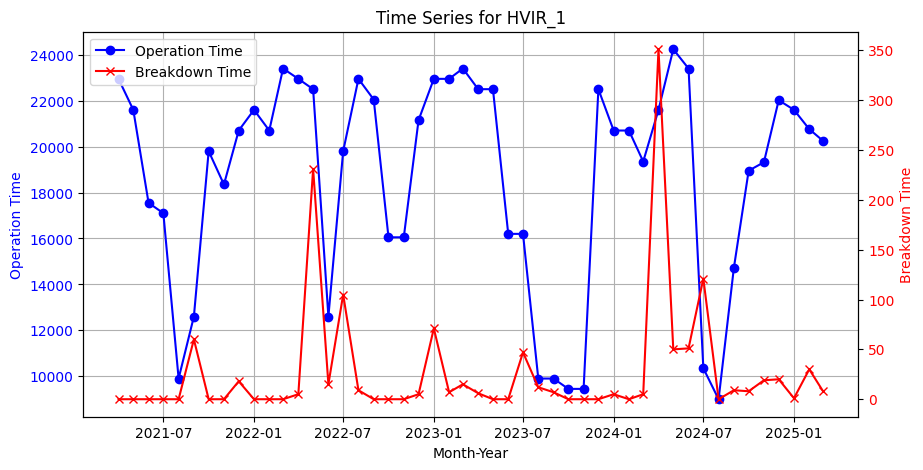

In [ ]:

fig, ax1 = plt.subplots(figsize=(10,5))

# Left axis for Operation_Time
ax1.plot(machine_data['Month_Year_Date'], machine_data['Operation_Time'],
         label='Operation Time', marker='o', color='blue')
ax1.set_xlabel('Month-Year')
ax1.set_ylabel('Operation Time', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True)

# Right axis for Breakdown_Time
ax2 = ax1.twinx()
ax2.plot(machine_data['Month_Year_Date'], machine_data['Breakdown_Time'],
         label='Breakdown Time', marker='x', color='red')
ax2.set_ylabel('Breakdown Time', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Title and x-axis rotation
plt.title(f"Time Series for {machine_data['Unique Machine Name'].iloc[0]}")
plt.xticks(rotation=45)

# Legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.show()


In [ ]:
#Filtering based on demand data availability
cutoff = '2024-12-31'
final_combined_df = final_combined_df[final_combined_df["Month_Year_Date"] <= cutoff]

# Production Data Feature Engineering

Availability Ratio = (Operating Time - Breakdown Time) / (Breakdown Time)

Static Features
* Machine Category Average Breakdown time per year per machine
* Machine Category Average Operation time per year per machine
* Average Availability per year per machine

Temporal Features
* No. of Machine per category
* Availability Ratio per Machine Category per month
* Operation Time per Machine Category per month
* Breakdown Time per Machine Category per month
* Rolling Average Operation Time per Machine Category
* Rolling Average Breakdown Time per Machine Category
* Change in Operating Time compared to previous Month
* Change in Breakdown Time compared to previous Month




In [ ]:
final_combined_df.head()

,Line,Unique Machine Name,Month_Year,Operation_Time,Breakdown_Time,Month_Year_Date
0,R4,Air Tight Test_1,Apr-21,22950,15.0,2021-04-01
12,R4,Booster pump_1,Apr-21,22950,0.0,2021-04-01
24,R4,Booster pump_2,Apr-21,22950,0.0,2021-04-01
36,R4,Conveyor_1,Apr-21,22950,83.0,2021-04-01
48,R4,Conveyor_2,Apr-21,22950,68.0,2021-04-01


In [ ]:
# Count of NaN values per column
nan_counts = final_combined_df.isna().sum()

# Percentage of NaN values per column
nan_percent = (final_combined_df.isna().mean() * 100).round(2)

# Combine into a single DataFrame
nan_summary = pd.DataFrame({
    "NaN_Count": nan_counts,
    "NaN_Percent": nan_percent
}).sort_values(by="NaN_Count", ascending=False)

print(nan_summary)


                     NaN_Count  NaN_Percent
Line                         0          0.0
Unique Machine Name          0          0.0
Month_Year                   0          0.0
Operation_Time               0          0.0
Breakdown_Time               0          0.0
Month_Year_Date              0          0.0


In [ ]:
final_combined_df["Machine Name"] = final_combined_df["Unique Machine Name"].str.replace(r"_\d+$", "", regex=True)

In [ ]:
final_combined_df.head()

,Line,Unique Machine Name,Month_Year,Operation_Time,Breakdown_Time,Month_Year_Date,Machine Name
0,R4,Air Tight Test_1,Apr-21,22950,15.0,2021-04-01,Air Tight Test
12,R4,Booster pump_1,Apr-21,22950,0.0,2021-04-01,Booster pump
24,R4,Booster pump_2,Apr-21,22950,0.0,2021-04-01,Booster pump
36,R4,Conveyor_1,Apr-21,22950,83.0,2021-04-01,Conveyor
48,R4,Conveyor_2,Apr-21,22950,68.0,2021-04-01,Conveyor


In [ ]:
final_combined_df["Availability"] = (final_combined_df['Operation_Time'] - final_combined_df['Breakdown_Time'])/final_combined_df['Operation_Time']

In [ ]:
final_combined_df.head()

,Line,Unique Machine Name,Month_Year,Operation_Time,Breakdown_Time,Month_Year_Date,Machine Name,Availability
0,R4,Air Tight Test_1,Apr-21,22950,15.0,2021-04-01,Air Tight Test,0.999346
12,R4,Booster pump_1,Apr-21,22950,0.0,2021-04-01,Booster pump,1.000000
24,R4,Booster pump_2,Apr-21,22950,0.0,2021-04-01,Booster pump,1.000000
36,R4,Conveyor_1,Apr-21,22950,83.0,2021-04-01,Conveyor,0.996383
48,R4,Conveyor_2,Apr-21,22950,68.0,2021-04-01,Conveyor,0.997037


In [ ]:
final_combined_df['Unqie Machine Name_Line'] = final_combined_df['Unique Machine Name']+"_"+final_combined_df['Line']

In [ ]:
final_combined_df['Machine Name'] = final_combined_df['Machine Name'].str.strip()

In [ ]:
prod_l1_agg_df = (
    final_combined_df.groupby(["Machine Name", "Month_Year_Date"])
      .agg(
          No_of_Machines=("Unqie Machine Name_Line", "nunique"),
          Operation_Time=("Operation_Time", "sum"),
          Breakdown_Time=("Breakdown_Time", "sum"),
          Availability_Ratio=("Availability", "mean")
      )
      .reset_index()
)

In [ ]:
prod_l1_agg_df.sort_values(by=['Machine Name', 'Month_Year_Date'])

,Machine Name,Month_Year_Date,No_of_Machines,Operation_Time,Breakdown_Time,Availability_Ratio
0,Air Tight Test,2021-04-01,4,91800,15.0,0.999837
1,Air Tight Test,2021-05-01,4,86400,4.0,0.999954
2,Air Tight Test,2021-06-01,4,70200,13.0,0.999815
3,Air Tight Test,2021-07-01,4,68400,15.0,0.999781
4,Air Tight Test,2021-08-01,4,39600,3.0,0.999924
...,...,...,...,...,...,...
850,Vacuuming,2024-08-01,10,90000,33.0,0.999633
851,Vacuuming,2024-09-01,10,147200,3.0,0.999980
852,Vacuuming,2024-10-01,10,189500,23.0,0.999879
853,Vacuuming,2024-11-01,10,193200,35.0,0.999819


In [ ]:
prod_l1_agg_df[prod_l1_agg_df['Machine Name']=='Air Tight Test']

,Machine Name,Month_Year_Date,No_of_Machines,Operation_Time,Breakdown_Time,Availability_Ratio
0,Air Tight Test,2021-04-01,4,91800,15.0,0.999837
1,Air Tight Test,2021-05-01,4,86400,4.0,0.999954
2,Air Tight Test,2021-06-01,4,70200,13.0,0.999815
3,Air Tight Test,2021-07-01,4,68400,15.0,0.999781
4,Air Tight Test,2021-08-01,4,39600,3.0,0.999924
5,Air Tight Test,2021-09-01,4,50400,39.0,0.999226
6,Air Tight Test,2021-10-01,4,79200,62.0,0.999217
7,Air Tight Test,2021-11-01,4,73400,50.0,0.999319
8,Air Tight Test,2021-12-01,4,82800,132.0,0.998406
9,Air Tight Test,2022-01-01,4,86400,597.0,0.993090


In [ ]:
# Sort by time to ensure rolling/diff works correctly
prod_l1_agg_df = prod_l1_agg_df.sort_values(["Machine Name", "Month_Year_Date"])

# Rolling averages
prod_l1_agg_df["Rolling_Avg_Op_Time"] = (
    prod_l1_agg_df.groupby("Machine Name")["Operation_Time"]
          .transform(lambda x: x.rolling(window=3, min_periods=1).mean())
)

prod_l1_agg_df["Rolling_Avg_BD_Time"] = (
    prod_l1_agg_df.groupby("Machine Name")["Breakdown_Time"]
          .transform(lambda x: x.rolling(window=3, min_periods=1).mean())
)

# Month-to-month changes
prod_l1_agg_df["Change_in_Op_Time"] = prod_l1_agg_df.groupby("Machine Name")["Operation_Time"].diff()
prod_l1_agg_df["Change_in_BD_Time"] = prod_l1_agg_df.groupby("Machine Name")["Breakdown_Time"].diff()


In [ ]:
prod_l1_agg_df[prod_l1_agg_df['Machine Name']=='Air Tight Test'][['Month_Year_Date','Operation_Time','Breakdown_Time','Change_in_Op_Time','Change_in_BD_Time']]

,Month_Year_Date,Operation_Time,Breakdown_Time,Change_in_Op_Time,Change_in_BD_Time
0,2021-04-01,91800,15.0,NaN,NaN
1,2021-05-01,86400,4.0,-5400.0,-11.0
2,2021-06-01,70200,13.0,-16200.0,9.0
3,2021-07-01,68400,15.0,-1800.0,2.0
4,2021-08-01,39600,3.0,-28800.0,-12.0
5,2021-09-01,50400,39.0,10800.0,36.0
6,2021-10-01,79200,62.0,28800.0,23.0
7,2021-11-01,73400,50.0,-5800.0,-12.0
8,2021-12-01,82800,132.0,9400.0,82.0
9,2022-01-01,86400,597.0,3600.0,465.0


In [ ]:
prod_l2_agg_df = final_combined_df.groupby(['Machine Name']).agg({
    "Operation_Time" : "mean",
    "Breakdown_Time" : "mean",
    "Availability" : "mean"
}).reset_index()

In [ ]:
prod_l2_agg_df.sort_values(by=['Availability'],ascending = False)

,Machine Name,Operation_Time,Breakdown_Time,Availability
2,Booster pump,18546.666667,0.033333,0.999996
14,Running Test,18546.666667,2.918889,0.999834
16,Ultrasonic Tube Sealing M/C,18144.696970,3.787879,0.999754
6,Fin Die,26735.533333,9.600000,0.999725
18,Vacuuming,17526.282051,6.848291,0.999651
17,Vaccum Lifter,18931.159420,7.681159,0.999586
5,Dry Oven,26735.533333,9.888889,0.999585
0,Air Tight Test,18219.135802,9.835391,0.999502
15,Tapping machine,18546.666667,9.755556,0.999451
13,Refrigrent charging,18546.666667,16.592593,0.999137


## Data Reload from Checkpoint-2

In [ ]:
demand_df = pd.read_csv("/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_proc_cons_melted_merged_filtered_45.csv")

In [ ]:
# Count of NaN values per column
nan_counts = demand_df.isna().sum()

# Percentage of NaN values per column
nan_percent = (demand_df.isna().mean() * 100).round(2)

# Combine into a single DataFrame
nan_summary = pd.DataFrame({
    "NaN_Count": nan_counts,
    "NaN_Percent": nan_percent
}).sort_values(by="NaN_Count", ascending=False)

print(nan_summary)


                               NaN_Count  NaN_Percent
RollingNonZeroStdDev3               9125        90.53
NonZeroLag2                         8586        85.18
NonZeroLag1                         8547        84.79
RollingCV2_3                        6647        65.94
RollingNonZeroMean3                 6608        65.56
SAPQty_procurement                  3384        33.57
SAPQty_consumption                  3312        32.86
ExpandingCV2                        1960        19.44
Lag3                                 840         8.33
Lag2                                 560         5.56
Make_consumption                     396         3.93
Make_procurement                     396         3.93
RollingStd3                          280         2.78
Lag1                                 280         2.78
RollingStd6                          280         2.78
UOM_consumption                      108         1.07
UOM_procurement                      108         1.07
EachPartPrice_procurement   

In [ ]:
demand_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10080 entries, 0 to 10079
Data columns (total 45 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PartCode                       10080 non-null  object 
 1   Description_consumption        10080 non-null  object 
 2   UOM_consumption                9972 non-null   object 
 3   Make_consumption               9684 non-null   object 
 4   CategoryABC                    10080 non-null  object 
 5   MinStock                       10080 non-null  int64  
 6   MaxStock                       10080 non-null  int64  
 7   SAPQty_consumption             6768 non-null   float64
 8   CommonMachineName_consumption  10080 non-null  object 
 9   Line_consumption               10080 non-null  object 
 10  EachPartPrice_consumption      10044 non-null  float64
 11  MONTH                          10080 non-null  object 
 12  CONSUMPTION                    10080 non-null 

In [ ]:
demand_df['MONTH_YEAR']

,MONTH_YEAR
0,2022-01-01
1,2022-02-01
2,2022-03-01
3,2022-04-01
4,2022-05-01
...,...
10075,2024-08-01
10076,2024-09-01
10077,2024-10-01
10078,2024-11-01


In [ ]:
demand_df['MONTH_YEAR'] = pd.to_datetime(demand_df['MONTH_YEAR'])

In [ ]:
# Ensure datetime conversion
demand_df["MONTH_YEAR"] = pd.to_datetime(demand_df["MONTH_YEAR"])
prod_l1_agg_df["Month_Year_Date"] = pd.to_datetime(prod_l1_agg_df["Month_Year_Date"])

# Ensure machine names are strings
demand_df["CommonMachineName_consumption"] = demand_df["CommonMachineName_consumption"].astype(str)
prod_l1_agg_df["Machine Name"] = prod_l1_agg_df["Machine Name"].astype(str)

# Merge (lookup)
l1_merged_df = demand_df.merge(
    prod_l1_agg_df,
    left_on=["CommonMachineName_consumption", "MONTH_YEAR"],
    right_on=["Machine Name", "Month_Year_Date"],
    how="left"
)

In [ ]:
# Count of NaN values per column
nan_counts = prod_l1_agg_df.isna().sum()

# Percentage of NaN values per column
nan_percent = (prod_l1_agg_df.isna().mean() * 100).round(2)

# Combine into a single DataFrame
nan_summary = pd.DataFrame({
    "NaN_Count": nan_counts,
    "NaN_Percent": nan_percent
}).sort_values(by="NaN_Count", ascending=False)

print(nan_summary)


                     NaN_Count  NaN_Percent
Change_in_BD_Time           19         2.22
Change_in_Op_Time           19         2.22
Availability_Ratio           2         0.23
Machine Name                 0         0.00
Month_Year_Date              0         0.00
No_of_Machines               0         0.00
Breakdown_Time               0         0.00
Operation_Time               0         0.00
Rolling_Avg_BD_Time          0         0.00
Rolling_Avg_Op_Time          0         0.00


In [ ]:
demand_df["MONTH_YEAR"].unique()

<DatetimeArray>
['2022-01-01 00:00:00', '2022-02-01 00:00:00', '2022-03-01 00:00:00',
 '2022-04-01 00:00:00', '2022-05-01 00:00:00', '2022-06-01 00:00:00',
 '2022-07-01 00:00:00', '2022-08-01 00:00:00', '2022-09-01 00:00:00',
 '2022-10-01 00:00:00', '2022-11-01 00:00:00', '2022-12-01 00:00:00',
 '2023-01-01 00:00:00', '2023-02-01 00:00:00', '2023-03-01 00:00:00',
 '2023-04-01 00:00:00', '2023-05-01 00:00:00', '2023-06-01 00:00:00',
 '2023-07-01 00:00:00', '2023-08-01 00:00:00', '2023-09-01 00:00:00',
 '2023-10-01 00:00:00', '2023-11-01 00:00:00', '2023-12-01 00:00:00',
 '2024-01-01 00:00:00', '2024-02-01 00:00:00', '2024-03-01 00:00:00',
 '2024-04-01 00:00:00', '2024-05-01 00:00:00', '2024-06-01 00:00:00',
 '2024-07-01 00:00:00', '2024-08-01 00:00:00', '2024-09-01 00:00:00',
 '2024-10-01 00:00:00', '2024-11-01 00:00:00', '2024-12-01 00:00:00']
Length: 36, dtype: datetime64[ns]

In [ ]:
prod_l1_agg_df['Month_Year_Date'].unique()

<DatetimeArray>
['2021-04-01 00:00:00', '2021-05-01 00:00:00', '2021-06-01 00:00:00',
 '2021-07-01 00:00:00', '2021-08-01 00:00:00', '2021-09-01 00:00:00',
 '2021-10-01 00:00:00', '2021-11-01 00:00:00', '2021-12-01 00:00:00',
 '2022-01-01 00:00:00', '2022-02-01 00:00:00', '2022-03-01 00:00:00',
 '2022-04-01 00:00:00', '2022-05-01 00:00:00', '2022-06-01 00:00:00',
 '2022-07-01 00:00:00', '2022-08-01 00:00:00', '2022-09-01 00:00:00',
 '2022-10-01 00:00:00', '2022-11-01 00:00:00', '2022-12-01 00:00:00',
 '2023-01-01 00:00:00', '2023-02-01 00:00:00', '2023-03-01 00:00:00',
 '2023-04-01 00:00:00', '2023-05-01 00:00:00', '2023-06-01 00:00:00',
 '2023-07-01 00:00:00', '2023-08-01 00:00:00', '2023-09-01 00:00:00',
 '2023-10-01 00:00:00', '2023-11-01 00:00:00', '2023-12-01 00:00:00',
 '2024-01-01 00:00:00', '2024-02-01 00:00:00', '2024-03-01 00:00:00',
 '2024-04-01 00:00:00', '2024-05-01 00:00:00', '2024-06-01 00:00:00',
 '2024-07-01 00:00:00', '2024-08-01 00:00:00', '2024-09-01 00:00:00',
 '20

In [ ]:
prod_l1_agg_df[prod_l1_agg_df['Month_Year_Date']=='2022-01-01']['Machine Name'].unique()

array(['Air Tight Test', 'Auto Brazing', 'Booster pump',
       'Coil Bending Machine', 'Conveyor', 'Dry Oven', 'Fin Die',
       'Fin Press', 'HVIR', 'Hair pin Bender Dia-7',
       'Horizontal Expander Dia', 'Packing M/C', 'Pressurizing',
       'Refrigrent charging', 'Running Test', 'Tapping machine',
       'Ultrasonic Tube Sealing M/C ', 'Vaccum Lifter ', 'Vacuuming'],
      dtype=object)

In [ ]:
l1_merged_df[l1_merged_df['Breakdown_Time'].isna()][['PartCode','CommonMachineName_consumption','MONTH_YEAR','Month_Year_Date','Breakdown_Time']]

,PartCode,CommonMachineName_consumption,MONTH_YEAR,Month_Year_Date,Breakdown_Time


In [ ]:
# Count of NaN values per column
nan_counts = l1_merged_df.isna().sum()

# Percentage of NaN values per column
nan_percent = (l1_merged_df.isna().mean() * 100).round(2)

# Combine into a single DataFrame
nan_summary = pd.DataFrame({
    "NaN_Count": nan_counts,
    "NaN_Percent": nan_percent
}).sort_values(by="NaN_Count", ascending=False)

print(nan_summary)


                               NaN_Count  NaN_Percent
RollingNonZeroStdDev3               9125        90.53
NonZeroLag2                         8586        85.18
NonZeroLag1                         8547        84.79
RollingCV2_3                        6647        65.94
RollingNonZeroMean3                 6608        65.56
SAPQty_procurement                  3384        33.57
SAPQty_consumption                  3312        32.86
ExpandingCV2                        1960        19.44
Lag3                                 840         8.33
Lag2                                 560         5.56
Make_consumption                     396         3.93
Make_procurement                     396         3.93
Lag1                                 280         2.78
RollingStd3                          280         2.78
RollingStd6                          280         2.78
UOM_consumption                      108         1.07
UOM_procurement                      108         1.07
EachPartPrice_procurement   

In [ ]:
l1_merged_df[l1_merged_df['PartCode'] == 'CONCOM008774'][prod_l1_agg_df.columns]

,Machine Name,Month_Year_Date,No_of_Machines,Operation_Time,Breakdown_Time,Availability_Ratio,Rolling_Avg_Op_Time,Rolling_Avg_BD_Time,Change_in_Op_Time,Change_in_BD_Time
2664,Refrigrent charging,2022-01-01,3,64800,131.0,0.997978,60650.0,47.000000,2700.0,121.0
2665,Refrigrent charging,2022-02-01,3,62100,139.0,0.997762,63000.0,93.333333,-2700.0,8.0
2666,Refrigrent charging,2022-03-01,3,70200,0.0,1.000000,65700.0,90.000000,8100.0,-139.0
2667,Refrigrent charging,2022-04-01,3,68850,57.0,0.999172,67050.0,65.333333,-1350.0,57.0
2668,Refrigrent charging,2022-05-01,3,67500,24.0,0.999644,68850.0,27.000000,-1350.0,-33.0
2669,Refrigrent charging,2022-06-01,3,37800,3.0,0.999921,58050.0,28.000000,-29700.0,-21.0
2670,Refrigrent charging,2022-07-01,3,59400,38.0,0.999360,54900.0,21.666667,21600.0,35.0
2671,Refrigrent charging,2022-08-01,3,68850,27.0,0.999608,55350.0,22.666667,9450.0,-11.0
2672,Refrigrent charging,2022-09-01,3,66150,40.0,0.999395,64800.0,35.000000,-2700.0,13.0
2673,Refrigrent charging,2022-10-01,3,48150,8.0,0.999834,61050.0,25.000000,-18000.0,-32.0


In [ ]:
prod_l2_agg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Machine Name    19 non-null     object 
 1   Operation_Time  19 non-null     float64
 2   Breakdown_Time  19 non-null     float64
 3   Availability    19 non-null     float64
dtypes: float64(3), object(1)
memory usage: 740.0+ bytes


In [ ]:

# Ensure machine names are strings
l1_merged_df["CommonMachineName_consumption"] = l1_merged_df["CommonMachineName_consumption"].astype(str)
prod_l2_agg_df["Machine Name"] = prod_l2_agg_df["Machine Name"].astype(str)

prod_l2_subset_df = prod_l2_agg_df[["Machine Name","Operation_Time", "Breakdown_Time", "Availability"]].rename(
    columns={
        "Machine Name" : "Machine_Name_l2",
        "Operation_Time": "Avg_Operation_Time",
        "Breakdown_Time": "Avg_Breakdown_Time",
        "Availability" : "Avg_Availability"
    }
)

prod_l2_subset_df["Machine_Name_l2"] = prod_l2_subset_df["Machine_Name_l2"].astype(str)
# Merge (lookup)
l2_merged_df = l1_merged_df.merge(
    prod_l2_subset_df,
    left_on=["CommonMachineName_consumption"],
    right_on=["Machine_Name_l2"],
    how="left"
)

In [ ]:
l2_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10080 entries, 0 to 10079
Data columns (total 59 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PartCode                       10080 non-null  object        
 1   Description_consumption        10080 non-null  object        
 2   UOM_consumption                9972 non-null   object        
 3   Make_consumption               9684 non-null   object        
 4   CategoryABC                    10080 non-null  object        
 5   MinStock                       10080 non-null  int64         
 6   MaxStock                       10080 non-null  int64         
 7   SAPQty_consumption             6768 non-null   float64       
 8   CommonMachineName_consumption  10080 non-null  object        
 9   Line_consumption               10080 non-null  object        
 10  EachPartPrice_consumption      10044 non-null  float64       
 11  MONTH          

In [ ]:
l2_merged_df[l2_merged_df['PartCode'] == 'CONCOM008774'][prod_l1_agg_df.columns.append(prod_l2_subset_df.columns)]

,Machine Name,Month_Year_Date,No_of_Machines,Operation_Time,Breakdown_Time,Availability_Ratio,Rolling_Avg_Op_Time,Rolling_Avg_BD_Time,Change_in_Op_Time,Change_in_BD_Time,Machine_Name_l2,Avg_Operation_Time,Avg_Breakdown_Time,Avg_Availability
2664,Refrigrent charging,2022-01-01,3.0,64800.0,131.0,0.997978,60650.0,47.000000,2700.0,121.0,Refrigrent charging,18546.666667,16.592593,0.999137
2665,Refrigrent charging,2022-02-01,3.0,62100.0,139.0,0.997762,63000.0,93.333333,-2700.0,8.0,Refrigrent charging,18546.666667,16.592593,0.999137
2666,Refrigrent charging,2022-03-01,3.0,70200.0,0.0,1.000000,65700.0,90.000000,8100.0,-139.0,Refrigrent charging,18546.666667,16.592593,0.999137
2667,Refrigrent charging,2022-04-01,3.0,68850.0,57.0,0.999172,67050.0,65.333333,-1350.0,57.0,Refrigrent charging,18546.666667,16.592593,0.999137
2668,Refrigrent charging,2022-05-01,3.0,67500.0,24.0,0.999644,68850.0,27.000000,-1350.0,-33.0,Refrigrent charging,18546.666667,16.592593,0.999137
2669,Refrigrent charging,2022-06-01,3.0,37800.0,3.0,0.999921,58050.0,28.000000,-29700.0,-21.0,Refrigrent charging,18546.666667,16.592593,0.999137
2670,Refrigrent charging,2022-07-01,3.0,59400.0,38.0,0.999360,54900.0,21.666667,21600.0,35.0,Refrigrent charging,18546.666667,16.592593,0.999137
2671,Refrigrent charging,2022-08-01,3.0,68850.0,27.0,0.999608,55350.0,22.666667,9450.0,-11.0,Refrigrent charging,18546.666667,16.592593,0.999137
2672,Refrigrent charging,2022-09-01,3.0,66150.0,40.0,0.999395,64800.0,35.000000,-2700.0,13.0,Refrigrent charging,18546.666667,16.592593,0.999137
2673,Refrigrent charging,2022-10-01,3.0,48150.0,8.0,0.999834,61050.0,25.000000,-18000.0,-32.0,Refrigrent charging,18546.666667,16.592593,0.999137


## Data Save Checkpoint-3

In [ ]:
l2_merged_df.to_csv("/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_demand_prod_merged_r2.csv", index=False)

In [3]:
l2_merged_df = pd.read_csv("/content/drive/MyDrive/SharedShortcut/Daikins-Spare-Parts/Processed/daikins_spare_parts_demand_prod_merged_r2.csv")

In [4]:
# Count of NaN values per column
nan_counts = l2_merged_df.isna().sum()

# Percentage of NaN values per column
nan_percent = (l2_merged_df.isna().mean() * 100).round(2)

# Combine into a single DataFrame
nan_summary = pd.DataFrame({
    "NaN_Count": nan_counts,
    "NaN_Percent": nan_percent
}).sort_values(by="NaN_Count", ascending=False)

print(nan_summary)


                               NaN_Count  NaN_Percent
RollingNonZeroStdDev3               9125        90.53
NonZeroLag2                         8586        85.18
NonZeroLag1                         8547        84.79
RollingCV2_3                        6647        65.94
RollingNonZeroMean3                 6608        65.56
SAPQty_procurement                  3384        33.57
SAPQty_consumption                  3312        32.86
ExpandingCV2                        1960        19.44
Lag3                                 840         8.33
Lag2                                 560         5.56
Make_consumption                     396         3.93
Make_procurement                     396         3.93
Lag1                                 280         2.78
RollingStd3                          280         2.78
RollingStd6                          280         2.78
UOM_procurement                      108         1.07
UOM_consumption                      108         1.07
EachPartPrice_procurement   

# XGBoost on Demand + Production Data

## Occurence Model

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.metrics import precision_recall_curve, f1_score, precision_score, recall_score, average_precision_score
import xgboost as xgb

In [6]:


# -----------------------
# HORIZON
# -----------------------
H = 12  # Forecast horizon (12 months)

# -----------------------
# FEATURE ENGINEERING
# -----------------------
def feature_engineering(df, sku_df=None):
    df = df.copy()
    df["MONTH_YEAR"] = pd.to_datetime(df["MONTH_YEAR"])
    df.sort_values(["PartCode", "MONTH_YEAR"], inplace=True)


    # Temporal features
    df["Month"] = df["MONTH_YEAR"].dt.month
    df["Month_sin"] = np.sin(2 * np.pi * df["Month"] / 12)
    df["Month_cos"] = np.cos(2 * np.pi * df["Month"] / 12)

    # Log-transform price (to handle skew)
    df["LogPrice"] = np.log1p(df["EachPartPrice_consumption"])

    # # Merge SKU-level meta data
    # df = df.merge(
    #     sku_df[["SKU", "ADI", "CV2",'MaxNonZeroDemand','MinNonZeroDemand']],
    #     how="left", left_on="PartCode", right_on="SKU"
    # )

    # df.rename(columns={"ADI": "SKU_ADI", "CV2": "SKU_CV2"}, inplace=True)

    # Ordinal encoding
    cat_encoder = OrdinalEncoder()
    df["CategoryABC_encoded"] = cat_encoder.fit_transform(df[["CategoryABC"]]).astype(int)

    uom_encoder = OrdinalEncoder()
    df["UOM_ecnoded"] = uom_encoder.fit_transform(df[["UOM_consumption"]]).astype(int)

    make_encoder = OrdinalEncoder()
    df["Make_encoded"] = make_encoder.fit_transform(df[["Make_consumption"]]).astype(int)

    machine_name_encoder = OrdinalEncoder()
    df["CommonMachineName_encoded"] = machine_name_encoder.fit_transform(df[["CommonMachineName_consumption"]]).astype(int)

    line_encoder = OrdinalEncoder()
    df["Line_encoded"] = line_encoder.fit_transform(df[["Line_consumption"]]).astype(int)

    part_encoder = OrdinalEncoder()
    df["PartCode_encoded"] = part_encoder.fit_transform(df[["PartCode"]]).astype(int)

    return df

# -----------------------
# TARGET CREATION
# -----------------------
def create_multi_horizon_target(df, horizon=H):
    df = df.copy()
    targets = []

    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .shift(-i)
            .fillna(0)
            .astype(int)
            .clip(0, 1)  # Binary target: 1 if demand occurs, else 0
        )
        targets.append(f"Target_t+{i}")

    return df, targets

def create_multi_horizon_target_r1(df, horizon=H):
    df = df.copy()
    targets = []

    def shift_with_rotation(x, shift_by):
        return pd.Series(np.roll(x, -shift_by), index=x.index)

    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .transform(lambda x: shift_with_rotation(x, i))
            .clip(0, 1)  # Binary target: 1 if demand occurs, else 0
            .astype(int)
        )
        targets.append(f"Target_t+{i}")

    return df, targets

# -----------------------
# MODEL TRAINING
# -----------------------
def train_xgb_multi_output(X_train, y_train, X_val, y_val, horizon=H):
    models = []
    thresholds = []
    for i in range(horizon):
        print(f"Training model for horizon t+{i+1}")
        pos_weight = (y_train[:, i] == 0).sum() / max(1, (y_train[:, i] == 1).sum())
        print(f"{i}th horizon - rare class weight : {pos_weight}")
        model = xgb.XGBClassifier(
            # n_estimators=200,
            # max_depth=5,
            # learning_rate=0.05,
            # subsample=0.8,
            # colsample_bytree=0.8,
            # eval_metric='logloss',
            # use_label_encoder=False,
            # scale_pos_weight=pos_weight

          n_estimators=800,
          learning_rate=0.03,
          max_depth=8,
          min_child_weight=2,
          subsample=0.9,
          colsample_bytree=0.9,
          gamma=0,
          reg_lambda=0.8,
          objective="binary:logistic",
          scale_pos_weight=pos_weight,
          eval_metric="aucpr",
          n_jobs=-1
        )
        model.fit(X_train, y_train[:, i])

        # Get predicted probabilities for validation set
        y_prob = model.predict_proba(X_val)[:, 1]

        # Find best threshold using PR Curve
        precision, recall, thresh = precision_recall_curve(y_val[:, i], y_prob)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-6)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresh[best_idx]

        print(f"Best threshold for t+{i+1}: {best_threshold:.3f}")

        models.append(model)
        thresholds.append(best_threshold)

    return models, np.array(thresholds)


def train_xgb_multi_output_per_sku_threshold(X_train, y_train, X_val, y_val, sku_ids, horizon=H):
    """
    Train one XGB model per horizon.
    Tune thresholds per (SKU, horizon).
    Falls back to global horizon threshold if per-SKU validation is degenerate.

    sku_ids: array of SKU identifiers aligned with rows of X_train, y_train, X_val, y_val
    """
    models = []
    thresholds = {}  # dict[(sku, horizon)] = threshold
    global_thresholds = []  # one per horizon

    for i in range(horizon):
        print(f"Training model for horizon t+{i+1}")
        pos_weight = (y_train[:, i] == 0).sum() / max(1, (y_train[:, i] == 1).sum())
        model = xgb.XGBClassifier(
            n_estimators=200,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            eval_metric='logloss',
            use_label_encoder=False,
            scale_pos_weight=pos_weight
        )
        model.fit(X_train, y_train[:, i])
        models.append(model)

        # Predict on validation set
        y_prob = model.predict_proba(X_val)[:, 1]

        # Compute global threshold for this horizon
        precision, recall, thresh = precision_recall_curve(y_val[:, i], y_prob)
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-6)
        best_idx = np.argmax(f1_scores)
        global_best_threshold = thresh[best_idx]
        global_thresholds.append(global_best_threshold)

        print(f"Global threshold t+{i+1}: {global_best_threshold:.3f}")

        # Tune threshold separately for each SKU
        for sku in np.unique(sku_ids):
            mask = (sku_ids == sku)
            if mask.sum() == 0:
                continue

            y_true_s = y_val[mask, i]
            y_prob_s = y_prob[mask]

            # Fallback cases: all 0s, all 1s, or too few positives
            if y_true_s.sum() == 0 or y_true_s.sum() == len(y_true_s) or y_true_s.sum() < 3:
                thresholds[(sku, i)] = global_best_threshold
                continue

            precision, recall, thresh = precision_recall_curve(y_true_s, y_prob_s)
            f1_scores = 2 * (precision * recall) / (precision + recall + 1e-6)
            best_idx = np.argmax(f1_scores)
            best_threshold = thresh[best_idx]

            thresholds[(sku, i)] = best_threshold
            print(f"SKU={sku}, horizon t+{i+1}, threshold={best_threshold:.3f} (fallback={False})")

    return models, thresholds, np.array(global_thresholds)
# -----------------------
# PREDICTION
# -----------------------
def predict_xgb_multi_output(models, thresholds, X):
    y_prob = np.column_stack([
        m.predict_proba(X)[:, 1] for m in models
    ])
    y_pred = (y_prob >= thresholds[None, :]).astype(int)
    return y_prob, y_pred

def predict_xgb_multi_output_per_sku_threshold(models, thresholds, global_thresholds, X, sku_ids):
    """
    Predict with per-SKU per-horizon thresholds.
    Falls back to global horizon thresholds when not available.

    models: list of trained XGBClassifier models (one per horizon)
    thresholds: dict[(sku, horizon)] = threshold
    global_thresholds: array of shape (horizon,)
    sku_ids: array of SKU identifiers for each row in X
    """
    # Get predicted probabilities for all horizons
    y_prob = np.column_stack([
        m.predict_proba(X)[:, 1] for m in models
    ])

    # Allocate binary predictions
    y_pred = np.zeros_like(y_prob, dtype=int)

    for i in range(len(models)):  # loop over horizons
        for j, sku in enumerate(sku_ids):  # loop over rows/SKUs
            thr = thresholds.get((sku, i), global_thresholds[i])
            y_pred[j, i] = (y_prob[j, i] >= thr).astype(int)

    return y_prob, y_pred


# -----------------------
# METRICS
# -----------------------
def evaluate(y_true, y_pred):
    metrics = {}
    for i in range(y_true.shape[1]):
        f1 = f1_score(y_true[:, i], y_pred[:, i])
        print(f"evaluate function - f1 score {i}th horizon : {f1}")
        precision_val = precision_score(y_true[:, i], y_pred[:, i])
        print(f"evaluate function - precision score {i}th horizon : {precision_val}")
        recall_val = recall_score(y_true[:, i], y_pred[:, i])
        print(f"evaluate function - recall score {i}th horizon : {recall_val}")
        avg_prec = average_precision_score(y_true[:, i], y_pred[:, i])
        print(f"evaluate function - average precision score {i}th horizon : {avg_prec}")
        metrics[f"t+{i+1}_F1"] = f1
        metrics[f"t+{i+1}_Precision"] = precision_val
        metrics[f"t+{i+1}_Recall"] = recall_val
        metrics[f"t+{i+1}_AP"] = avg_prec
    return metrics

# -----------------------
# PIPELINE
# -----------------------
# Feature engineering
df_fe = feature_engineering(l2_merged_df)
print(f"Shape after feature engineering : {df_fe.shape}")
# Target creation
df_fe, target_cols = create_multi_horizon_target(df_fe, H)
print(f"Shape after Target Creation : {df_fe.shape}")
# Count rows with NaNs in any of the target columns
na_rows_count = df_fe[target_cols].isna().any(axis=1).sum()

print(f"Number of rows with NaNs Target Cols :  {na_rows_count}")
# Drop rows with NaNs in targets (due to shifting)
df_fe.dropna(subset=target_cols, inplace=True)
print(f"Shape after Dropping NAs : {df_fe.shape}")
# Features and Targets
feature_cols = [
   'Cumulative_Consumption','Lag1', 'Lag2', 'Lag3',
       'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
       'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
       'RollingStd3', 'RollingMean6', 'RollingStd6', #'MaxNonZeroDemand','MinNonZeroDemand',
       "LogPrice",
    "Month_sin", "Month_cos",  "CategoryABC_encoded", 'RollingCV2_3',
       'RollingADI3', 'ExpandingCV2', 'ExpandingADI',
   'UOM_ecnoded','Make_encoded','CommonMachineName_encoded','Line_encoded','PartCode_encoded',
   'No_of_Machines','Operation_Time','Breakdown_Time','Availability_Ratio',
   'Rolling_Avg_Op_Time','Rolling_Avg_BD_Time','Change_in_Op_Time','Change_in_BD_Time',
   'Avg_Operation_Time','Avg_Breakdown_Time','Avg_Availability', 'PartCode'

] # "SKU_ADI", "SKU_CV2" removed due to data leakage
X = df_fe[feature_cols].values
y = df_fe[target_cols].values

# Train/test split
# X_train, X_val, y_train, y_val = train_test_split(
#     X, y, test_size=0.2, random_state=42, stratify=y[:, 0]
# )

# X_train, X_val, y_train, y_val, train_indices, y_val_indices = train_test_split(
#     X, y, df_fe.index, test_size=0.2, random_state=42, stratify=y[:, 0]
# )

split_date = df_fe["MONTH_YEAR"].min() + pd.DateOffset(months=24)
print(f'split date :{split_date}')
# Create train/validation masks
train_mask = df_fe["MONTH_YEAR"] < split_date
val_mask = df_fe["MONTH_YEAR"] >= split_date

# Get indices
train_indices = df_fe.loc[train_mask].index
y_val_indices = df_fe.loc[val_mask].index

train_skus = df_fe.loc[train_mask]['PartCode'].values
val_skus = df_fe.loc[val_mask]['PartCode'].values
print(f"train sku mask size : {len(train_skus)}")
print(f"val sku mask size : {len(val_skus)}")
#df_fe.drop('PartCode', axis=1, inplace=True)
feature_cols.remove('PartCode')
# Split features and targets
X_train = df_fe.loc[train_mask, feature_cols].values
print(f"X_train : {X_train.shape}")
y_train = df_fe.loc[train_mask, target_cols].values
print(f"y_train : {y_train.shape}")
X_val = df_fe.loc[val_mask, feature_cols].values
print(f"X_val : {X_val.shape}")
y_val_occurence = df_fe.loc[val_mask, target_cols].values
print(f"y_val_occurence : {y_val_occurence.shape}")
# Train multi-output XGBoost models
#models, thresholds = train_xgb_multi_output(X_train, y_train, X_val, y_val_occurence, H)
#sku_ids_train = df_fe.loc[train_mask, feature_cols]['PartCode'].values
#sku_ids_val = df_fe.loc[val_mask, feature_cols]['PartCode'].values
models, thresholds, global_thresholds = train_xgb_multi_output_per_sku_threshold(
    X_train,
    y_train,
    X_val,
    y_val_occurence,
    sku_ids=val_skus,   # SKU IDs for validation set
    horizon=H
)
print(f"Best threshold :{thresholds}")


# Predict on validation set
#y_prob_occurence, y_pred_occurence = predict_xgb_multi_output(models, thresholds, X_val)
y_prob_occurence, y_pred_occurence = predict_xgb_multi_output_per_sku_threshold(
    models=models,
    thresholds=thresholds,
    global_thresholds=global_thresholds,
    X=X_val,
    sku_ids=val_skus   # SKU IDs for test set
)
# Predict on training set
#y_prob_occur_train, y_pred_occur_train = predict_xgb_multi_output(models, thresholds, X_train)
y_prob_occur_train, y_pred_occur_train = predict_xgb_multi_output_per_sku_threshold(
    models=models,
    thresholds=thresholds,
    global_thresholds=global_thresholds,
    X=X_train,
    sku_ids=train_skus   # SKU IDs for test set
)

# Average predicted probability per horizon
avg_probs = y_prob_occurence.mean(axis=0)
for i, prob in enumerate(avg_probs, 1):
    print(f"t+{i} average predicted probability: {prob:.4f}")
# Evaluate
metrics = evaluate(y_val_occurence, y_pred_occurence)
print("\nValidation Metrics:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

train_metrics = evaluate(y_train, y_pred_occur_train)
print("\nTraining Metrics:")
for k, v in train_metrics.items():
    print(f"{k}: {v:.4f}")
# y_prob_occurence = y_prob.copy()
# y_pred_occurence = y_pred.copy()

/tmp/ipython-input-224328250.py:36: RuntimeWarning: invalid value encountered in cast
  df["UOM_ecnoded"] = uom_encoder.fit_transform(df[["UOM_consumption"]]).astype(int)
/tmp/ipython-input-224328250.py:39: RuntimeWarning: invalid value encountered in cast
  df["Make_encoded"] = make_encoder.fit_transform(df[["Make_consumption"]]).astype(int)


Shape after feature engineering : (10080, 69)
Shape after Target Creation : (10080, 81)
Number of rows with NaNs Target Cols :  0
Shape after Dropping NAs : (10080, 81)
split date :2024-01-01 00:00:00
train sku mask size : 6720
val sku mask size : 3360
X_train : (6720, 37)
y_train : (6720, 12)
X_val : (3360, 37)
y_val_occurence : (3360, 12)
Training model for horizon t+1


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:11] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+1: 0.453
SKU=CONCOM002378, horizon t+1, threshold=0.379 (fallback=False)
SKU=CONCOM004400, horizon t+1, threshold=0.388 (fallback=False)
SKU=CONCOM004401, horizon t+1, threshold=0.227 (fallback=False)
SKU=CONCOM004402, horizon t+1, threshold=0.423 (fallback=False)
SKU=CONCOM004403, horizon t+1, threshold=0.466 (fallback=False)
SKU=CONCOM004404, horizon t+1, threshold=0.535 (fallback=False)
SKU=CONCOM005366, horizon t+1, threshold=0.812 (fallback=False)
SKU=CONCOM005368, horizon t+1, threshold=0.602 (fallback=False)
SKU=CONCOM006357, horizon t+1, threshold=0.725 (fallback=False)
SKU=CONCOM006359, horizon t+1, threshold=0.524 (fallback=False)
SKU=CONCOM006361, horizon t+1, threshold=0.800 (fallback=False)
SKU=CONCOM006695, horizon t+1, threshold=0.814 (fallback=False)
SKU=CONCOM007031, horizon t+1, threshold=0.709 (fallback=False)
SKU=CONCOM007416, horizon t+1, threshold=0.650 (fallback=False)
SKU=CONCOM007417, horizon t+1, threshold=0.368 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:11] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+2: 0.504
SKU=CONCOM002378, horizon t+2, threshold=0.445 (fallback=False)
SKU=CONCOM004400, horizon t+2, threshold=0.157 (fallback=False)
SKU=CONCOM004401, horizon t+2, threshold=0.153 (fallback=False)
SKU=CONCOM004402, horizon t+2, threshold=0.246 (fallback=False)
SKU=CONCOM004403, horizon t+2, threshold=0.513 (fallback=False)
SKU=CONCOM004404, horizon t+2, threshold=0.242 (fallback=False)
SKU=CONCOM005366, horizon t+2, threshold=0.506 (fallback=False)
SKU=CONCOM005368, horizon t+2, threshold=0.479 (fallback=False)
SKU=CONCOM006357, horizon t+2, threshold=0.780 (fallback=False)
SKU=CONCOM006359, horizon t+2, threshold=0.727 (fallback=False)
SKU=CONCOM006361, horizon t+2, threshold=0.694 (fallback=False)
SKU=CONCOM007031, horizon t+2, threshold=0.479 (fallback=False)
SKU=CONCOM007416, horizon t+2, threshold=0.653 (fallback=False)
SKU=CONCOM007417, horizon t+2, threshold=0.398 (fallback=False)
SKU=CONCOM007446, horizon t+2, threshold=0.384 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:12] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+3: 0.575
SKU=CONCOM002378, horizon t+3, threshold=0.243 (fallback=False)
SKU=CONCOM004400, horizon t+3, threshold=0.386 (fallback=False)
SKU=CONCOM004401, horizon t+3, threshold=0.246 (fallback=False)
SKU=CONCOM004402, horizon t+3, threshold=0.341 (fallback=False)
SKU=CONCOM004403, horizon t+3, threshold=0.216 (fallback=False)
SKU=CONCOM004404, horizon t+3, threshold=0.454 (fallback=False)
SKU=CONCOM005366, horizon t+3, threshold=0.599 (fallback=False)
SKU=CONCOM005368, horizon t+3, threshold=0.327 (fallback=False)
SKU=CONCOM006357, horizon t+3, threshold=0.756 (fallback=False)
SKU=CONCOM006359, horizon t+3, threshold=0.491 (fallback=False)
SKU=CONCOM006361, horizon t+3, threshold=0.567 (fallback=False)
SKU=CONCOM007031, horizon t+3, threshold=0.455 (fallback=False)
SKU=CONCOM007416, horizon t+3, threshold=0.341 (fallback=False)
SKU=CONCOM007417, horizon t+3, threshold=0.255 (fallback=False)
SKU=CONCOM007446, horizon t+3, threshold=0.261 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+4: 0.500
SKU=CONCOM004400, horizon t+4, threshold=0.510 (fallback=False)
SKU=CONCOM004401, horizon t+4, threshold=0.621 (fallback=False)
SKU=CONCOM004402, horizon t+4, threshold=0.562 (fallback=False)
SKU=CONCOM004403, horizon t+4, threshold=0.376 (fallback=False)
SKU=CONCOM004404, horizon t+4, threshold=0.432 (fallback=False)
SKU=CONCOM005366, horizon t+4, threshold=0.643 (fallback=False)
SKU=CONCOM005368, horizon t+4, threshold=0.468 (fallback=False)
SKU=CONCOM006357, horizon t+4, threshold=0.797 (fallback=False)
SKU=CONCOM006361, horizon t+4, threshold=0.497 (fallback=False)
SKU=CONCOM007416, horizon t+4, threshold=0.787 (fallback=False)
SKU=CONCOM007417, horizon t+4, threshold=0.502 (fallback=False)
SKU=CONCOM007446, horizon t+4, threshold=0.544 (fallback=False)
SKU=CONCOM007662, horizon t+4, threshold=0.538 (fallback=False)
SKU=CONCOM008001, horizon t+4, threshold=0.652 (fallback=False)
SKU=CONCOM008174, horizon t+4, threshold=0.713 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:13] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+5: 0.708
SKU=CONCOM004400, horizon t+5, threshold=0.579 (fallback=False)
SKU=CONCOM004401, horizon t+5, threshold=0.628 (fallback=False)
SKU=CONCOM004402, horizon t+5, threshold=0.333 (fallback=False)
SKU=CONCOM004403, horizon t+5, threshold=0.685 (fallback=False)
SKU=CONCOM004404, horizon t+5, threshold=0.630 (fallback=False)
SKU=CONCOM005368, horizon t+5, threshold=0.611 (fallback=False)
SKU=CONCOM006357, horizon t+5, threshold=0.757 (fallback=False)
SKU=CONCOM006361, horizon t+5, threshold=0.442 (fallback=False)
SKU=CONCOM007416, horizon t+5, threshold=0.816 (fallback=False)
SKU=CONCOM007417, horizon t+5, threshold=0.673 (fallback=False)
SKU=CONCOM007446, horizon t+5, threshold=0.712 (fallback=False)
SKU=CONCOM008001, horizon t+5, threshold=0.918 (fallback=False)
SKU=CONCOM008174, horizon t+5, threshold=0.644 (fallback=False)
SKU=CONCOM008909, horizon t+5, threshold=0.758 (fallback=False)
SKU=CONCOM008964, horizon t+5, threshold=0.140 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+6: 0.611
SKU=CONCOM004400, horizon t+6, threshold=0.623 (fallback=False)
SKU=CONCOM004401, horizon t+6, threshold=0.563 (fallback=False)
SKU=CONCOM004402, horizon t+6, threshold=0.453 (fallback=False)
SKU=CONCOM004403, horizon t+6, threshold=0.732 (fallback=False)
SKU=CONCOM004404, horizon t+6, threshold=0.395 (fallback=False)
SKU=CONCOM006357, horizon t+6, threshold=0.715 (fallback=False)
SKU=CONCOM007416, horizon t+6, threshold=0.886 (fallback=False)
SKU=CONCOM007417, horizon t+6, threshold=0.759 (fallback=False)
SKU=CONCOM007446, horizon t+6, threshold=0.719 (fallback=False)
SKU=CONCOM008001, horizon t+6, threshold=0.775 (fallback=False)
SKU=CONCOM008174, horizon t+6, threshold=0.629 (fallback=False)
SKU=CONCOM008909, horizon t+6, threshold=0.744 (fallback=False)
SKU=CONCOM008964, horizon t+6, threshold=0.326 (fallback=False)
SKU=CONCOM009032, horizon t+6, threshold=0.558 (fallback=False)
SKU=CONCOM009033, horizon t+6, threshold=0.277 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:14] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+7: 0.470
SKU=CONCOM004400, horizon t+7, threshold=0.510 (fallback=False)
SKU=CONCOM004401, horizon t+7, threshold=0.563 (fallback=False)
SKU=CONCOM004402, horizon t+7, threshold=0.229 (fallback=False)
SKU=CONCOM004403, horizon t+7, threshold=0.539 (fallback=False)
SKU=CONCOM004404, horizon t+7, threshold=0.318 (fallback=False)
SKU=CONCOM006357, horizon t+7, threshold=0.745 (fallback=False)
SKU=CONCOM007416, horizon t+7, threshold=0.744 (fallback=False)
SKU=CONCOM007417, horizon t+7, threshold=0.639 (fallback=False)
SKU=CONCOM007446, horizon t+7, threshold=0.709 (fallback=False)
SKU=CONCOM008174, horizon t+7, threshold=0.509 (fallback=False)
SKU=CONCOM008909, horizon t+7, threshold=0.822 (fallback=False)
SKU=CONCOM008964, horizon t+7, threshold=0.224 (fallback=False)
SKU=CONCOM009032, horizon t+7, threshold=0.284 (fallback=False)
SKU=CONCOM009033, horizon t+7, threshold=0.324 (fallback=False)
SKU=CONCOM009034, horizon t+7, threshold=0.526 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:15] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+8: 0.571
SKU=CONCOM004400, horizon t+8, threshold=0.456 (fallback=False)
SKU=CONCOM004401, horizon t+8, threshold=0.591 (fallback=False)
SKU=CONCOM004404, horizon t+8, threshold=0.695 (fallback=False)
SKU=CONCOM006357, horizon t+8, threshold=0.765 (fallback=False)
SKU=CONCOM007416, horizon t+8, threshold=0.571 (fallback=False)
SKU=CONCOM007417, horizon t+8, threshold=0.643 (fallback=False)
SKU=CONCOM007446, horizon t+8, threshold=0.710 (fallback=False)
SKU=CONCOM008909, horizon t+8, threshold=0.747 (fallback=False)
SKU=CONCOM009032, horizon t+8, threshold=0.623 (fallback=False)
SKU=CONCOM009033, horizon t+8, threshold=0.349 (fallback=False)
SKU=CONCOM009035, horizon t+8, threshold=0.577 (fallback=False)
SKU=CONCOM009038, horizon t+8, threshold=0.293 (fallback=False)
SKU=CONCOM009039, horizon t+8, threshold=0.453 (fallback=False)
SKU=CONCOM009040, horizon t+8, threshold=0.458 (fallback=False)
SKU=CONCOM009200, horizon t+8, threshold=0.357 (fallback=False)
SKU=CONCOM00

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:16] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+9: 0.380
SKU=CONCOM004404, horizon t+9, threshold=0.439 (fallback=False)
SKU=CONCOM007446, horizon t+9, threshold=0.482 (fallback=False)
SKU=CONCOM009032, horizon t+9, threshold=0.398 (fallback=False)
SKU=CONCOM009035, horizon t+9, threshold=0.330 (fallback=False)
SKU=CONCOM009038, horizon t+9, threshold=0.356 (fallback=False)
SKU=CONCOM009039, horizon t+9, threshold=0.450 (fallback=False)
SKU=CONCOM009040, horizon t+9, threshold=0.410 (fallback=False)
SKU=CONCOM010370, horizon t+9, threshold=0.162 (fallback=False)
SKU=CONCOM010373, horizon t+9, threshold=0.473 (fallback=False)
SKU=CONVRV000257, horizon t+9, threshold=0.561 (fallback=False)
SKU=CONVRV000259, horizon t+9, threshold=0.510 (fallback=False)
SKU=CONVRV000969, horizon t+9, threshold=0.961 (fallback=False)
SKU=CONVRV000971, horizon t+9, threshold=0.964 (fallback=False)
Training model for horizon t+10


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:16] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+10: 0.739
Training model for horizon t+11


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:17] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Global threshold t+11: 0.980
Training model for horizon t+12


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [05:29:17] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Global threshold t+12: 0.000
Best threshold :{('CONCOM002378', 0): np.float32(0.378929), ('CONCOM003449', 0): np.float32(0.45340407), ('CONCOM003805', 0): np.float32(0.45340407), ('CONCOM004179', 0): np.float32(0.45340407), ('CONCOM004400', 0): np.float32(0.38841957), ('CONCOM004401', 0): np.float32(0.22748047), ('CONCOM004402', 0): np.float32(0.42264622), ('CONCOM004403', 0): np.float32(0.4657417), ('CONCOM004404', 0): np.float32(0.5351438), ('CONCOM004960', 0): np.float32(0.45340407), ('CONCOM005096', 0): np.float32(0.45340407), ('CONCOM005098', 0): np.float32(0.45340407), ('CONCOM005100', 0): np.float32(0.45340407), ('CONCOM005140', 0): np.float32(0.45340407), ('CONCOM005141', 0): np.float32(0.45340407), ('CONCOM005208', 0): np.float32(0.45340407), ('CONCOM005364', 0): np.float32(0.45340407), ('CONCOM005365', 0): np.float32(0.45340407), ('CONCOM005366', 0): np.float32(0.81170756), ('CONCOM005367', 0): np.float32(0.45340407), ('CONCOM005368', 0): np.float32(0.60209423), ('CONCOM00585

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


In [7]:
len(models)

12

In [9]:

# Suppose models = [model_t1, model_t2, ..., model_t12]
# and feature_cols = ["feat1", "feat2", ..., "featN"]

all_importances = []

for i, model in enumerate(models, start=1):
    # ---------- XGBoost Built-in Feature Importance (Gain) ----------
    importance_gain = model.get_booster().get_score(importance_type="gain")
    # Put into DataFrame
    df_gain = pd.DataFrame(list(importance_gain.items()), columns=["Feature", "Gain"])
    df_gain["Horizon"] = f"t{i}"

    all_importances.append(df_gain)

# Combine into single DataFrame for all horizons
importance_df = pd.concat(all_importances, ignore_index=True)

# Pivot to compare across horizons
importance_pivot = importance_df.pivot(index="Feature", columns="Horizon", values="Gain").fillna(0)

print("XGBoost Gain-based Importance across horizons:")
print(importance_pivot)




XGBoost Gain-based Importance across horizons:
Horizon         t1         t10         t11         t12         t2         t3  \
Feature                                                                        
f0        8.634642    8.450639    9.016790    8.857162   8.538617  10.305166   
f1       12.098281   10.220260    9.359534    7.114569   7.864450   8.862259   
f10      16.874182   12.620824    9.940289   12.752106  11.302628  11.382846   
f11       8.880745    9.747315    8.531590    9.730779   9.355332  11.490338   
f12       9.159617    8.902808    8.438680   10.681457  11.401694   9.849228   
f13       9.530051   10.582349    9.973839    9.297812   9.492662   9.840239   
f14      11.111597   14.445216   13.731931   16.429327  17.113714  23.416920   
f15      19.872192   15.089125   14.930648   14.544997  14.616721  16.424442   
f16       8.845968   12.149208   10.397861   13.341225   8.473345   8.455208   
f17       9.705682    8.360683    7.097899    8.124846  10.674779   7.616

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

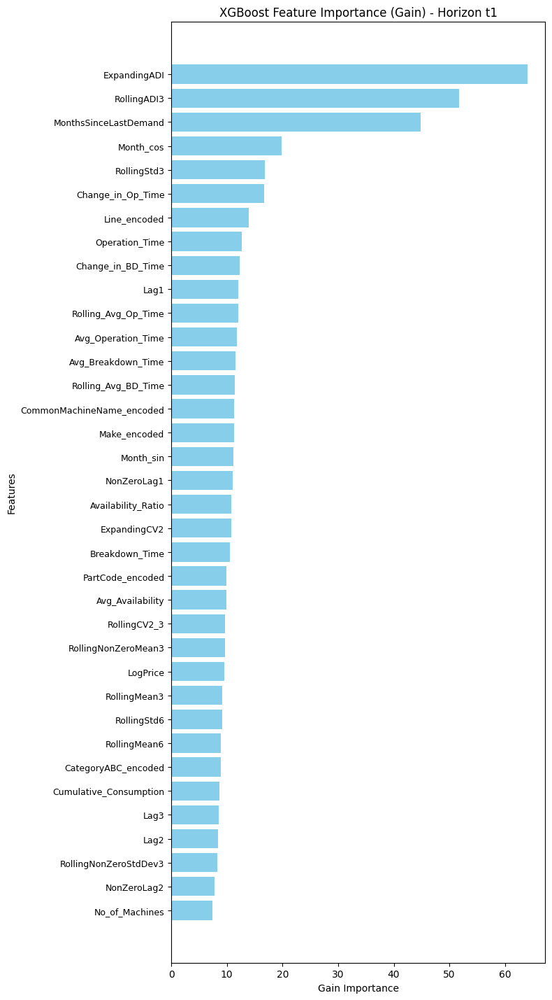

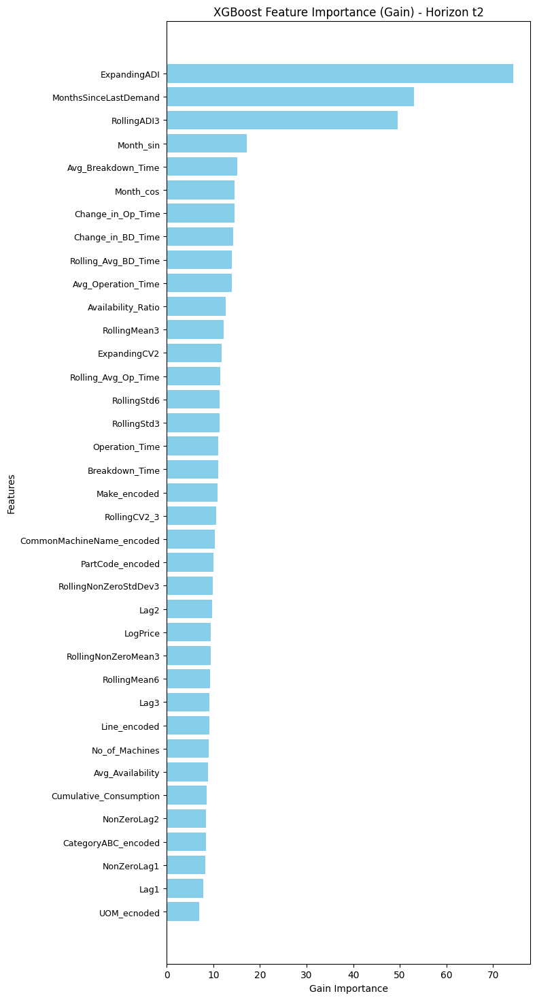

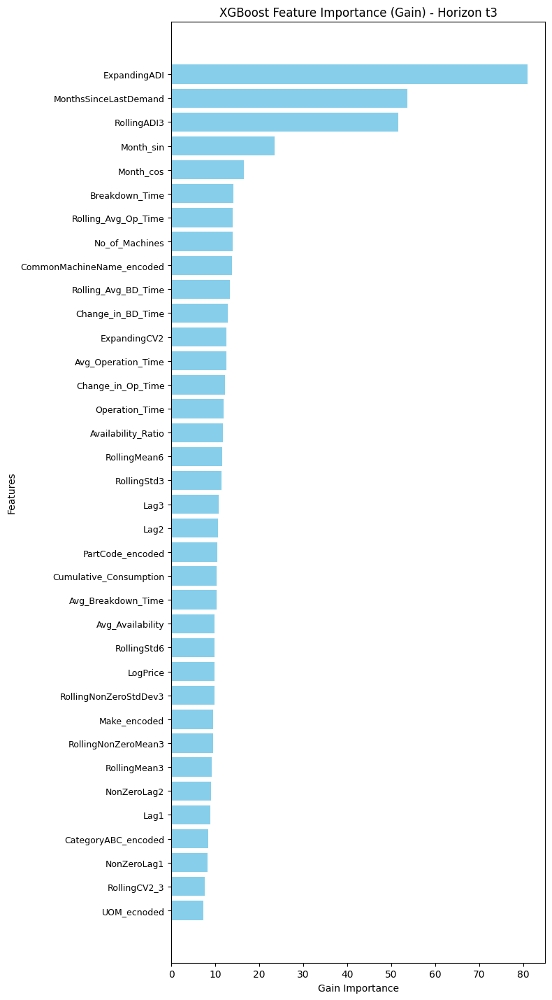

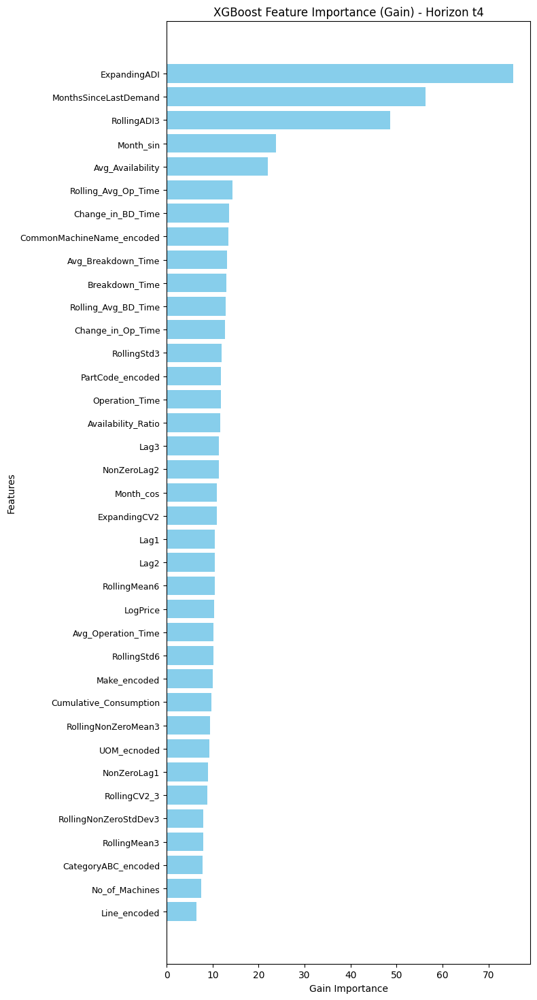

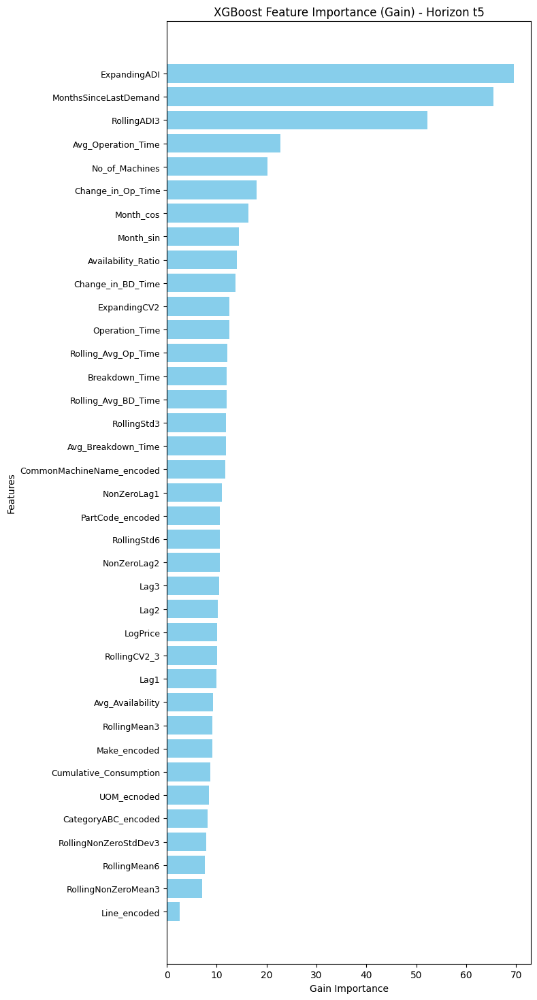

...

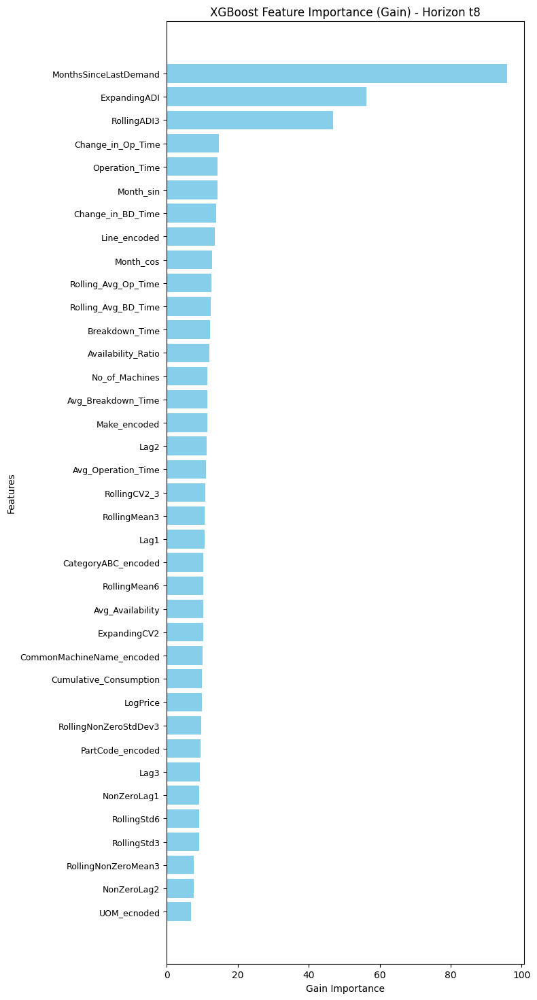

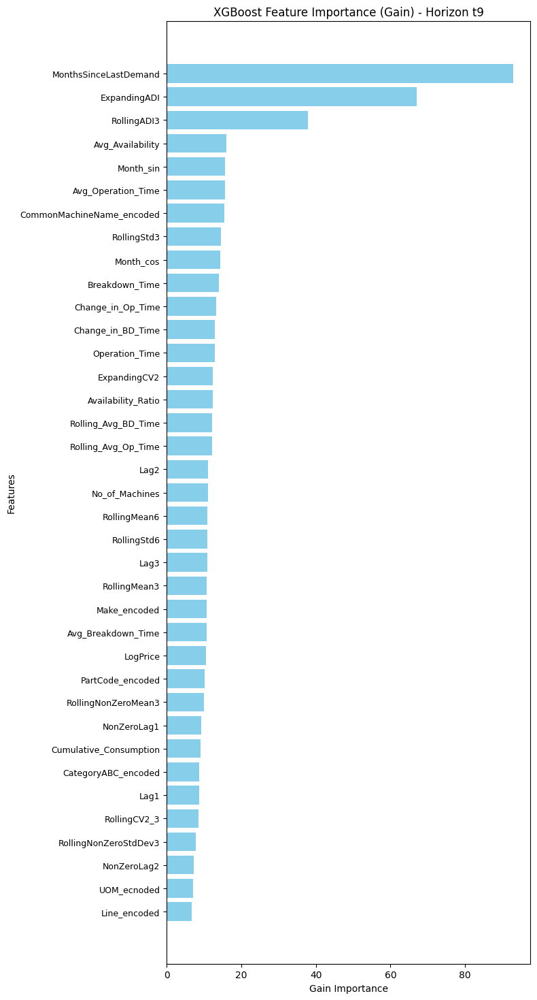

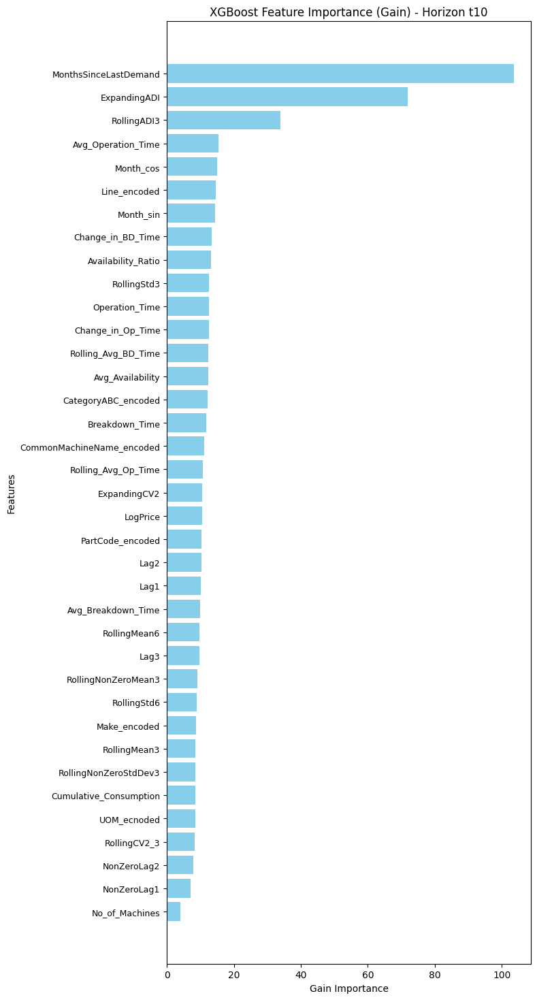

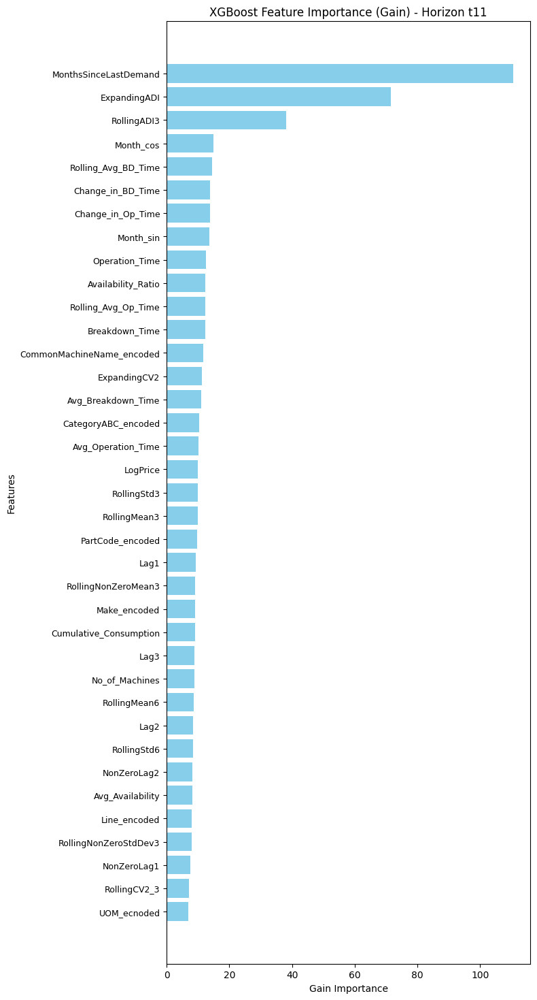

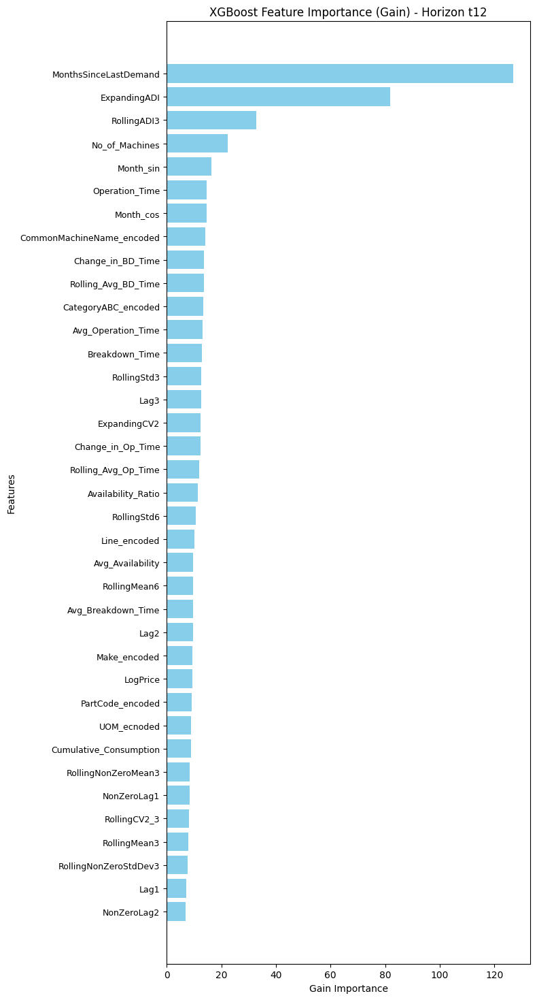

In [12]:


for i, model in enumerate(models, start=1):
    # Get importance by Gain
    importance_gain = model.get_booster().get_score(importance_type="gain")

    # Map f0, f1,... to actual feature names
    mapped_importance = {}
    for k, v in importance_gain.items():
        idx = int(k[1:])  # remove 'f' and convert to int
        mapped_importance[feature_cols[idx]] = v

    # Create dataframe
    df_gain = pd.DataFrame(list(mapped_importance.items()), columns=["Feature", "Gain"])
    df_gain = df_gain.sort_values("Gain", ascending=False)

    # Adjust figure size dynamically based on number of features
    plt.figure(figsize=(8, max(5, 0.4 * len(df_gain))))  # 0.4 inch per feature

    # Plot horizontal bar chart
    plt.barh(df_gain["Feature"], df_gain["Gain"], color="skyblue")
    plt.xlabel("Gain Importance")
    plt.ylabel("Features")
    plt.title(f"XGBoost Feature Importance (Gain) - Horizon t{i}")
    plt.gca().invert_yaxis()

    # Better spacing
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()


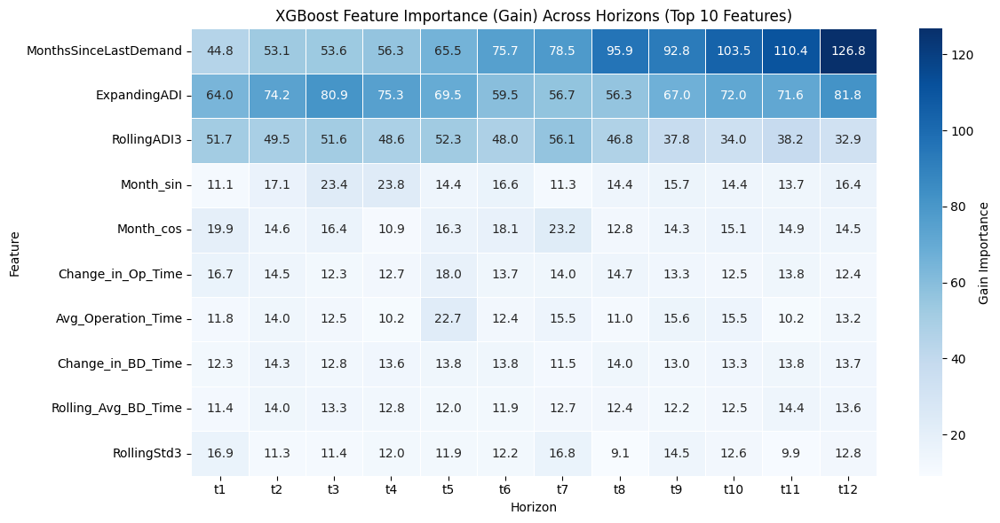

In [13]:
all_importances = []

for i, model in enumerate(models, start=1):
    importance_gain = model.get_booster().get_score(importance_type="gain")

    # Map f0, f1,... to actual feature names
    mapped_importance = {}
    for k, v in importance_gain.items():
        idx = int(k[1:])
        mapped_importance[feature_cols[idx]] = v

    df_gain = pd.DataFrame(list(mapped_importance.items()), columns=["Feature", f"t{i}"])
    all_importances.append(df_gain)

# Merge all horizon importances
importance_df = all_importances[0]
for df in all_importances[1:]:
    importance_df = importance_df.merge(df, on="Feature", how="outer")

importance_df = importance_df.fillna(0).set_index("Feature")

# ---- Pick top 10 features globally (by total Gain across horizons) ----
top_features = importance_df.sum(axis=1).sort_values(ascending=False).head(10).index
heatmap_data = importance_df.loc[top_features]

# ---- Plot heatmap ----
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data,
    annot=True, fmt=".1f", cmap="Blues", linewidths=0.5, cbar_kws={"label": "Gain Importance"}
)
plt.title("XGBoost Feature Importance (Gain) Across Horizons (Top 10 Features)")
plt.xlabel("Horizon")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


SHAP Mean |Importance across horizons:
                                 t1        t2        t3        t4        t5  \
Cumulative_Consumption     0.034558  0.023235  0.024949  0.034087  0.034418   
Lag1                       0.032901  0.006612  0.011216  0.018096  0.017263   
Lag2                       0.028142  0.017480  0.017007  0.014015  0.049733   
Lag3                       0.037572  0.023252  0.048450  0.051080  0.043122   
NonZeroLag1                0.036905  0.011820  0.009719  0.010462  0.054210   
NonZeroLag2                0.007169  0.020383  0.011997  0.052475  0.013310   
MonthsSinceLastDemand      0.496071  0.579449  0.659785  0.756774  0.884401   
RollingNonZeroMean3        0.068129  0.054127  0.046126  0.026676  0.025273   
RollingNonZeroStdDev3      0.013494  0.030946  0.038193  0.017082  0.008328   
RollingMean3               0.008149  0.025461  0.020246  0.008192  0.008527   
RollingStd3                0.056350  0.052869  0.015649  0.032705  0.026909   
RollingMean6 

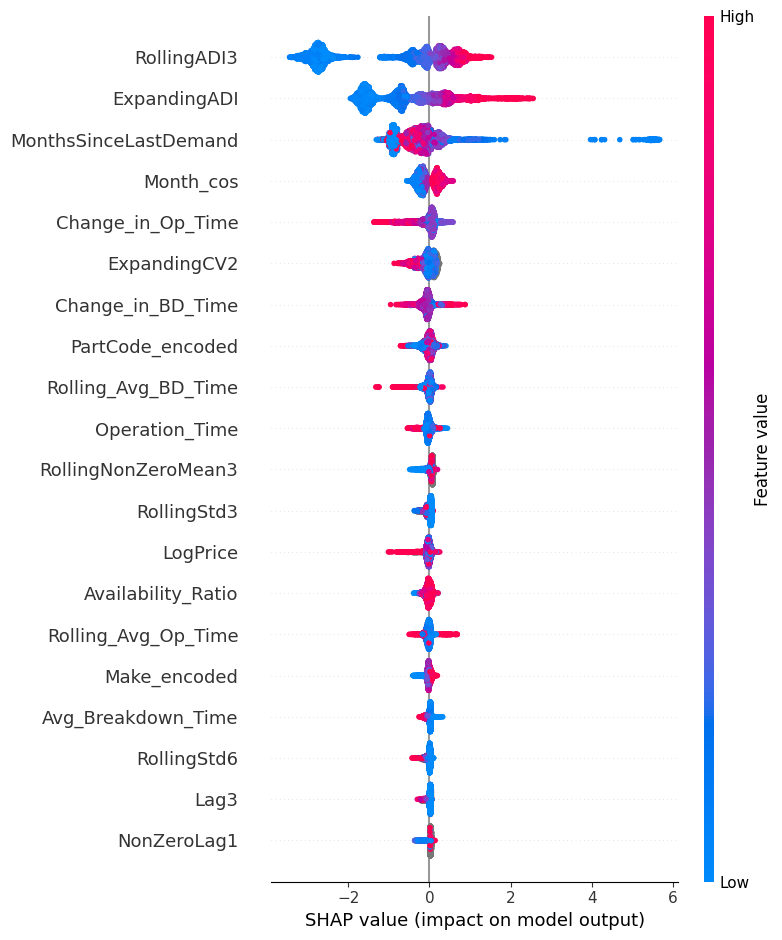

In [15]:
import shap

X_train_df = pd.DataFrame(X_train, columns=feature_cols)

shap_importances = {}

for i, model in enumerate(models, start=1):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train_df)

    # Mean absolute SHAP value = global importance
    mean_abs_shap = pd.Series(
        np.abs(shap_values).mean(axis=0),
        index=feature_cols,
        name=f"t{i}"
    )
    shap_importances[f"t{i}"] = mean_abs_shap

# Combine into DataFrame
shap_importance_df = pd.DataFrame(shap_importances)

print("SHAP Mean |Importance across horizons:")
print(shap_importance_df)




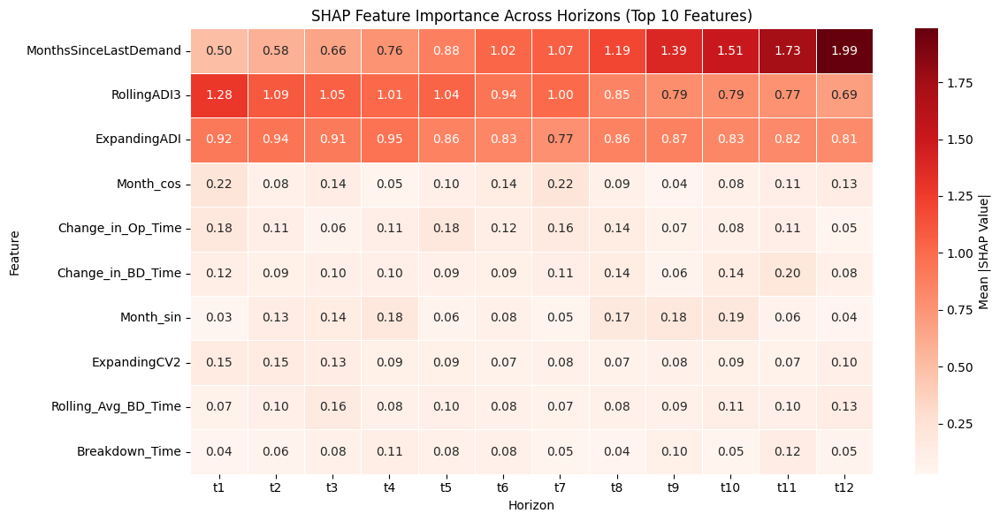

In [16]:

# ---- Pick top 10 features globally (sum of SHAP importances across horizons) ----
top_features = shap_importance_df.sum(axis=1).sort_values(ascending=False).head(10).index

# Subset only those features
heatmap_data = shap_importance_df.loc[top_features]

# ---- Plot heatmap ----
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data,
    annot=True, fmt=".2f", cmap="Reds", linewidths=0.5, cbar_kws={"label": "Mean |SHAP Value|"}
)
plt.title("SHAP Feature Importance Across Horizons (Top 10 Features)")
plt.xlabel("Horizon")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [ ]:
# SHAP plot for a horizon model
explainer = shap.TreeExplainer(models[0])
shap_values = explainer.shap_values(X_train_df)
shap.summary_plot(shap_values, X_train_df, feature_names=feature_cols)

In [ ]:
y_pred_occurence.shape

(3360, 12)

In [ ]:
y_val

NameError: name 'y_val' is not defined

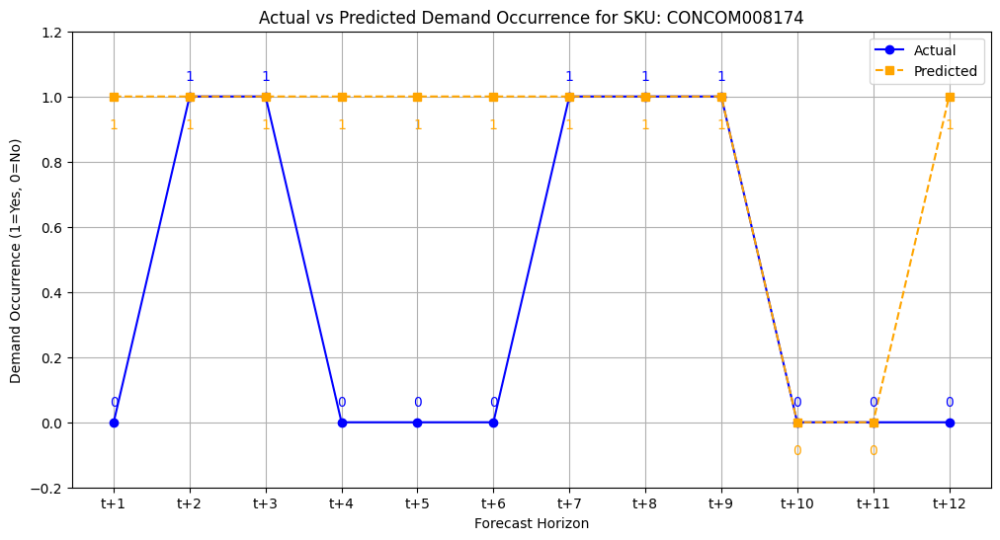

In [ ]:
plot_actual_vs_pred(df_fe.reset_index(drop=True), y_val_occurence, y_pred_occurence, target_cols,PartCode='CONCOM008174')

### To be investigated cases

* CONCOM004401
* CONCOM004402
* CONCOM008174

### Good cases
* CONCOM005850

In [ ]:
def plot_classification_metrics(metrics,H):
    # ---------- Plot 1: Average Probabilities ----------
  horizons = [f"t+{i}" for i in range(1, H + 1)]

  plt.figure(figsize=(10, 5))
  plt.bar(horizons, avg_probs, color='skyblue')
  plt.title("Average Predicted Probability per Horizon")
  plt.xlabel("Horizon")
  plt.ylabel("Average Probability")
  plt.ylim(0, 1)
  plt.grid(axis='y', linestyle='--', alpha=0.7)
  plt.show()


  # ---------- Plot 2: Metrics per Horizon ----------
  # Extract metric values per horizon
  f1_scores = [metrics[f"t+{i}_F1"] for i in range(1, H + 1)]
  precisions = [metrics[f"t+{i}_Precision"] for i in range(1, H + 1)]
  recalls = [metrics[f"t+{i}_Recall"] for i in range(1, H + 1)]
  aps = [metrics[f"t+{i}_AP"] for i in range(1, H + 1)]

  x = np.arange(len(horizons))
  width = 0.2  # Bar width

  plt.figure(figsize=(12, 6))
  plt.bar(x - 1.5*width, f1_scores, width, label='F1-Score', color='steelblue')
  plt.bar(x - 0.5*width, precisions, width, label='Precision', color='orange')
  plt.bar(x + 0.5*width, recalls, width, label='Recall', color='green')
  plt.bar(x + 1.5*width, aps, width, label='Avg Precision (AP)', color='red')

  plt.title("Evaluation Metrics per Horizon")
  plt.xlabel("Horizon")
  plt.ylabel("Score")
  plt.xticks(x, horizons)
  plt.ylim(0, 1)
  plt.legend()
  plt.grid(axis='y', linestyle='--', alpha=0.7)
  plt.show()


  # ---------- Plot 3: Average Metrics for First 10 Horizons ----------
  avg_f1 = np.mean(f1_scores[:10])
  avg_precision = np.mean(precisions[:10])
  avg_recall = np.mean(recalls[:10])

  metrics_names = ["F1-Score", "Precision", "Recall"]
  avg_values = [avg_f1, avg_precision, avg_recall]

  plt.figure(figsize=(8, 5))
  plt.bar(metrics_names, avg_values, color=['steelblue', 'orange', 'green'])
  plt.title("Average Metrics (First 10 Horizons)")
  plt.ylabel("Average Score")
  plt.ylim(0, 1)
  plt.grid(axis='y', linestyle='--', alpha=0.7)
  plt.show()


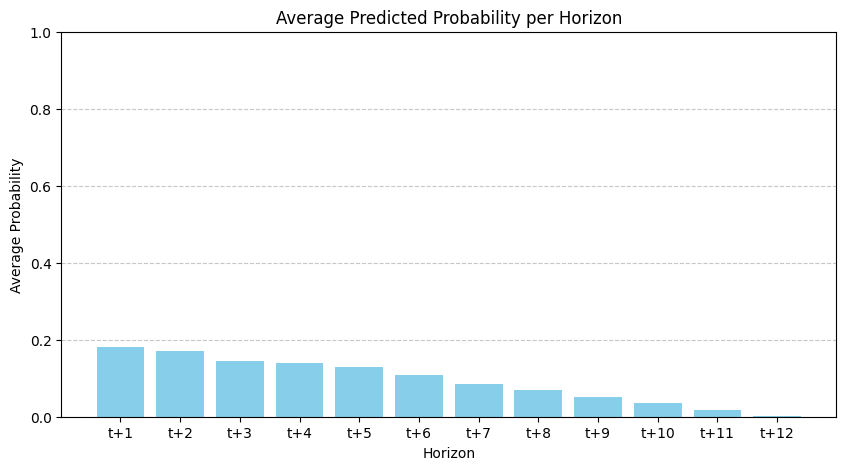

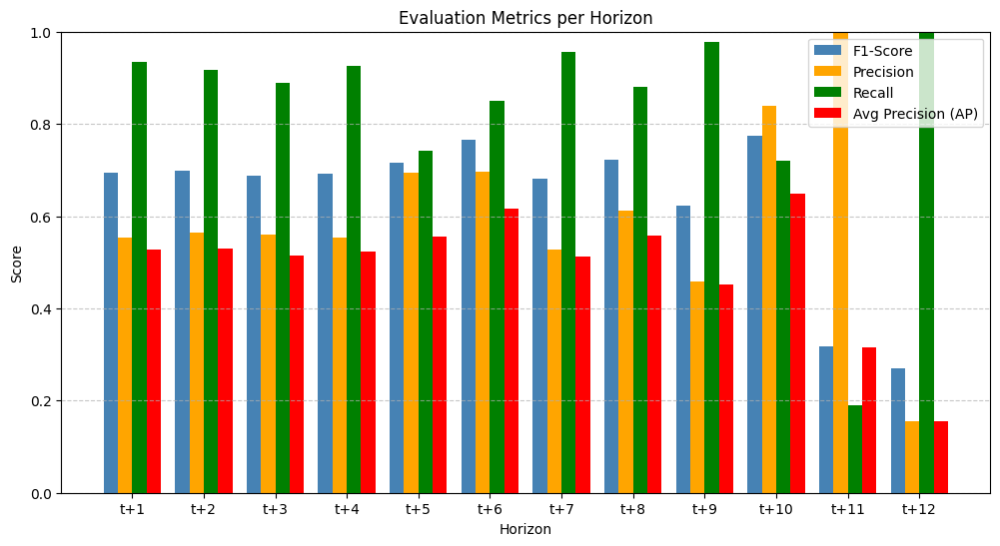

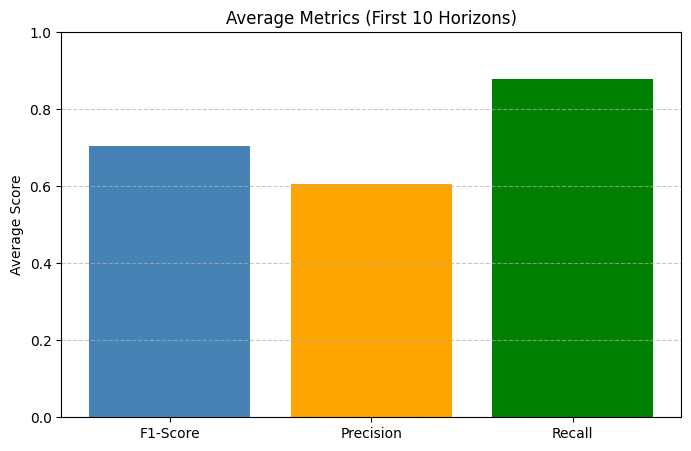

In [ ]:
plot_classification_metrics(train_metrics,12)

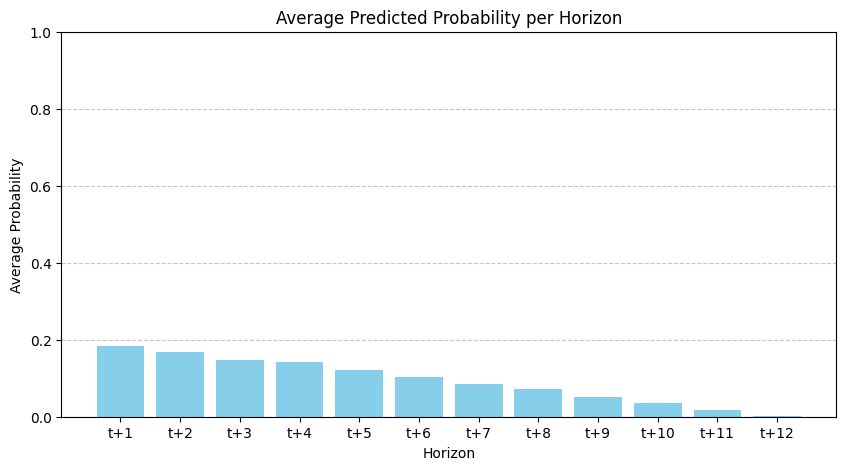

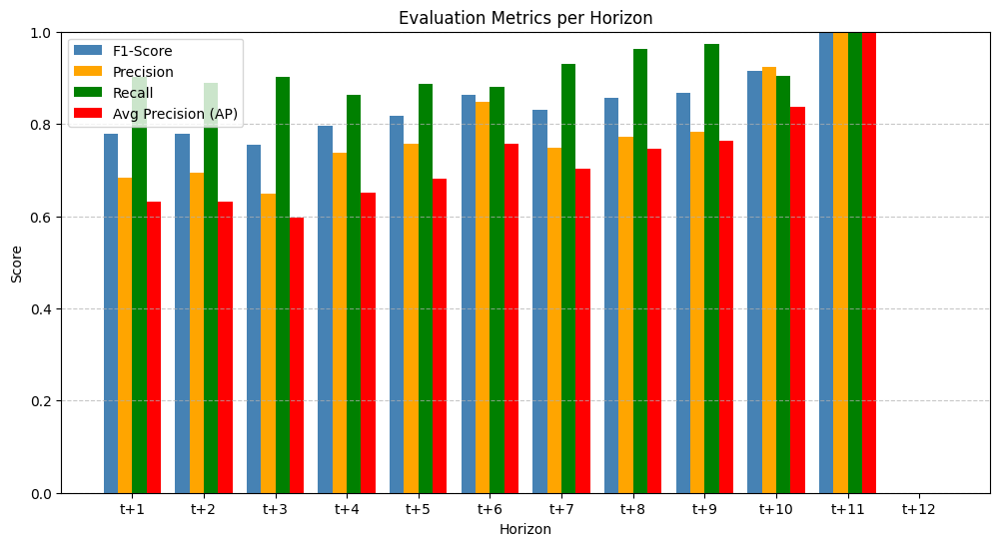

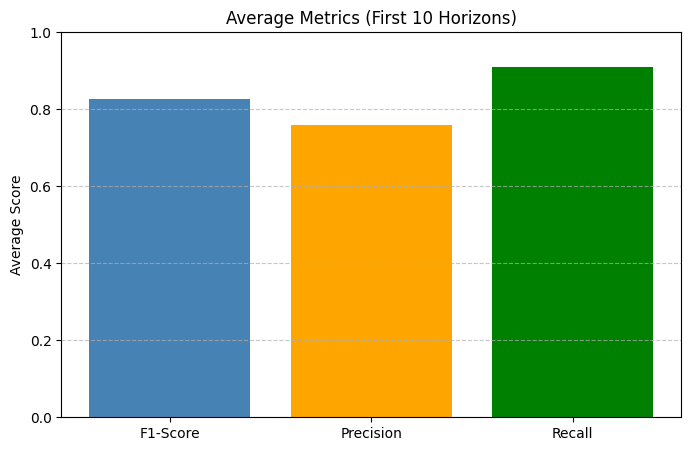

In [ ]:
plot_classification_metrics(metrics,12)

## Size Model

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
import xgboost as xgb
import matplotlib.pyplot as plt

In [18]:


# -----------------------
# HORIZON
# -----------------------
H = 12  # Forecast horizon (12 months)

# -----------------------
# FEATURE ENGINEERING
# -----------------------
def feature_engineering(df, sku_df=None):
    df = df.copy()
    df["MONTH_YEAR"] = pd.to_datetime(df["MONTH_YEAR"])
    df.sort_values(["PartCode", "MONTH_YEAR"], inplace=True)

    # Temporal features
    df["Month"] = df["MONTH_YEAR"].dt.month
    df["Month_sin"] = np.sin(2 * np.pi * df["Month"] / 12)
    df["Month_cos"] = np.cos(2 * np.pi * df["Month"] / 12)

    # Log-transform price (to handle skew)
    df["LogPrice"] = np.log1p(df["EachPartPrice_consumption"])

    # # Merge SKU-level meta data
    # df = df.merge(
    #     sku_df[["SKU", "ADI", "CV2", 'MaxNonZeroDemand', 'MinNonZeroDemand']],
    #     how="left", left_on="PartCode", right_on="SKU"
    # )
    # df.rename(columns={"ADI": "SKU_ADI", "CV2": "SKU_CV2"}, inplace=True)

    # Ordinal encode CategoryABC
    cat_encoder = OrdinalEncoder()
    df["CategoryABC_encoded"] = cat_encoder.fit_transform(df[["CategoryABC"]]).astype(int)

    uom_encoder = OrdinalEncoder()
    df["UOM_ecnoded"] = cat_encoder.fit_transform(df[["UOM_consumption"]]).astype(int)

    make_encoder = OrdinalEncoder()
    df["Make_encoded"] = cat_encoder.fit_transform(df[["Make_consumption"]]).astype(int)

    machine_name_encoder = OrdinalEncoder()
    df["CommonMachineName_encoded"] = cat_encoder.fit_transform(df[["CommonMachineName_consumption"]]).astype(int)

    line_encoder = OrdinalEncoder()
    df["Line_encoded"] = cat_encoder.fit_transform(df[["Line_consumption"]]).astype(int)

    return df

# -----------------------
# TARGET CREATION
# -----------------------
def create_multi_horizon_target(df, horizon=H):
    df = df.copy()
    targets = []
    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .shift(-i)
            .fillna(0)  # Fill future unavailable values with 0
        )
        targets.append(f"Target_t+{i}")
    return df, targets

def create_multi_horizon_target_r1(df, horizon=H):
    df = df.copy()
    targets = []

    def shift_with_rotation(x, shift_by):
        return pd.Series(np.roll(x, -shift_by), index=x.index)

    for i in range(1, horizon + 1):
        df[f"Target_t+{i}"] = (
            df.groupby("PartCode")["CONSUMPTION"]
            .transform(lambda x: shift_with_rotation(x, i))
        )
        targets.append(f"Target_t+{i}")

    return df, targets
# -----------------------
# MODEL TRAINING
# -----------------------
def train_xgb_multi_output(X_train, y_train, X_val, y_val, horizon=H):
    models = []
    for i in range(horizon):
        print(f"Training model for horizon t+{i+1}")
        model = xgb.XGBRegressor(
            ## Huber loss that reduces the effect of outliers
            n_estimators=300,
            max_depth=6,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            objective='reg:pseudohubererror',
            eval_metric='mae',
            verbosity=1

            ##===========================
            # n_estimators=300,
            # max_depth=6,
            # learning_rate=0.05,
            # subsample=0.8,
            # colsample_bytree=0.8,
            # objective="reg:squarederror",
            # eval_metric="mae"

            ##=============================
            # n_estimators=300,
            # max_depth=6,
            # learning_rate=0.05,
            # subsample=0.8,
            # colsample_bytree=0.8,
            # objective="count:poisson",   # Poisson loss
            # eval_metric="poisson-nloglik"

            ##==================================
            # n_estimators=300,
            # max_depth=6,
            # learning_rate=0.05,
            # subsample=0.8,
            # colsample_bytree=0.8,
            # objective="reg:tweedie",
            # eval_metric="mae",
            # tweedie_variance_power=1.2,   # between 1.0 and 2.0
            # verbosity=1

        )
        model.fit(X_train, y_train[:, i])
        models.append(model)
    return models

# -----------------------
# PREDICTION
# -----------------------
def predict_xgb_multi_output(models, X):
    y_pred = np.column_stack([
        m.predict(X) for m in models
    ])
    return y_pred

# -----------------------
# METRICS
# -----------------------
def evaluate(y_true, y_pred):
    metrics = {}
    for i in range(y_true.shape[1]):
        mae = mean_absolute_error(y_true[:, i], y_pred[:, i])
        rmse = np.sqrt(mean_squared_error(y_true[:, i], y_pred[:, i]))
        metrics[f"t+{i+1}_MAE"] = mae
        metrics[f"t+{i+1}_RMSE"] = rmse
    return metrics

# -----------------------
# PIPELINE
# -----------------------
# Feature engineering
df_fe = feature_engineering(l2_merged_df)
print(f"Shape after feature engineering : {df_fe.shape}")
# Target creation
df_fe, target_cols = create_multi_horizon_target_r1(df_fe, H)
print(f"Shape after Target Creation : {df_fe.shape}")
# Drop rows with NaNs in targets (due to shifting)
df_fe.dropna(subset=target_cols, inplace=True)
print(f"Shape after Dropping NAs : {df_fe.shape}")
# Features and Targets
feature_cols = [
    'Cumulative_Consumption', 'Lag1', 'Lag2', 'Lag3',
    'NonZeroLag1', 'NonZeroLag2', 'MonthsSinceLastDemand',
    'RollingNonZeroMean3', 'RollingNonZeroStdDev3', 'RollingMean3',
    'RollingStd3', 'RollingMean6', 'RollingStd6', #'MaxNonZeroDemand','MinNonZeroDemand',
    "LogPrice",
    "Month_sin", "Month_cos", "CategoryABC_encoded",
    'RollingCV2_3', 'RollingADI3', 'ExpandingCV2', 'ExpandingADI',

    'UOM_ecnoded','Make_encoded','CommonMachineName_encoded','Line_encoded',
    # Production Features
   'No_of_Machines','Operation_Time','Breakdown_Time','Availability_Ratio',
   'Rolling_Avg_Op_Time','Rolling_Avg_BD_Time','Change_in_Op_Time','Change_in_BD_Time',
   'Avg_Operation_Time','Avg_Breakdown_Time','Avg_Availability'
]
X = df_fe[feature_cols].values
y = df_fe[target_cols].values

print(f"X - y shape : {X.shape} | {y.shape}")


# Train/test split (time-based)
split_date = df_fe["MONTH_YEAR"].min() + pd.DateOffset(months=24)
print(f"Train-Test Split Date : {split_date}")
train_mask = df_fe["MONTH_YEAR"] < split_date
val_mask = df_fe["MONTH_YEAR"] >= split_date

X_train = df_fe.loc[train_mask, feature_cols].values
print(f"X_train : {X_train.shape}")
y_train = df_fe.loc[train_mask, target_cols].values
print(f"y_train : {y_train.shape}")
X_val = df_fe.loc[val_mask, feature_cols].values
print(f"X_val : {X_val.shape}")
y_val_size = df_fe.loc[val_mask, target_cols].values
print(f"y_val_size : {y_val_size.shape}")

# Train multi-output XGBoost regression models
models = train_xgb_multi_output(X_train, y_train, X_val, y_val_size, H)

# Predict on validation set
y_pred_size = predict_xgb_multi_output(models, X_val)
print(f"y_pred_size : {y_pred_size.shape}")

# Prediction on training set
y_pred_size_train = predict_xgb_multi_output(models, X_train)
print(f"y_pred_size_train : {y_pred_size_train.shape}")
# Evaluate
metrics = evaluate(y_val_size, y_pred_size)
print("\nValidation Metrics (Demand Size):")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")


# y_pred_size = y_pred.copy()

/tmp/ipython-input-3864713897.py:34: RuntimeWarning: invalid value encountered in cast
  df["UOM_ecnoded"] = cat_encoder.fit_transform(df[["UOM_consumption"]]).astype(int)
/tmp/ipython-input-3864713897.py:37: RuntimeWarning: invalid value encountered in cast
  df["Make_encoded"] = cat_encoder.fit_transform(df[["Make_consumption"]]).astype(int)


Shape after feature engineering : (10080, 68)
Shape after Target Creation : (10080, 80)
Shape after Dropping NAs : (10080, 80)
X - y shape : (10080, 36) | (10080, 12)
Train-Test Split Date : 2024-01-01 00:00:00
X_train : (6720, 36)
y_train : (6720, 12)
X_val : (3360, 36)
y_val_size : (3360, 12)
Training model for horizon t+1
Training model for horizon t+2
Training model for horizon t+3
Training model for horizon t+4
Training model for horizon t+5
Training model for horizon t+6
Training model for horizon t+7
Training model for horizon t+8
Training model for horizon t+9
Training model for horizon t+10
Training model for horizon t+11
Training model for horizon t+12
y_pred_size : (3360, 12)
y_pred_size_train : (6720, 12)

Validation Metrics (Demand Size):
t+1_MAE: 1.3444
t+1_RMSE: 7.4816
t+2_MAE: 1.3710
t+2_RMSE: 7.6167
t+3_MAE: 1.3575
t+3_RMSE: 7.6376
t+4_MAE: 1.3678
t+4_RMSE: 7.5089
t+5_MAE: 1.3923
t+5_RMSE: 8.1815
t+6_MAE: 1.3566
t+6_RMSE: 8.1839
t+7_MAE: 1.4654
t+7_RMSE: 8.6546
t+8_MAE

In [53]:
feature_cols

['Cumulative_Consumption',
 'Lag1',
 'Lag2',
 'Lag3',
 'NonZeroLag1',
 'NonZeroLag2',
 'MonthsSinceLastDemand',
 'RollingNonZeroMean3',
 'RollingNonZeroStdDev3',
 'RollingMean3',
 'RollingStd3',
 'RollingMean6',
 'RollingStd6',
 'LogPrice',
 'Month_sin',
 'Month_cos',
 'CategoryABC_encoded',
 'RollingCV2_3',
 'RollingADI3',
 'ExpandingCV2',
 'ExpandingADI',
 'UOM_ecnoded',
 'Make_encoded',
 'CommonMachineName_encoded',
 'Line_encoded',
 'No_of_Machines',
 'Operation_Time',
 'Breakdown_Time',
 'Availability_Ratio',
 'Rolling_Avg_Op_Time',
 'Rolling_Avg_BD_Time',
 'Change_in_Op_Time',
 'Change_in_BD_Time',
 'Avg_Operation_Time',
 'Avg_Breakdown_Time',
 'Avg_Availability']

In [19]:

# Suppose models = [model_t1, model_t2, ..., model_t12]
# and feature_cols = ["feat1", "feat2", ..., "featN"]

all_importances = []

for i, model in enumerate(models, start=1):
    # ---------- XGBoost Built-in Feature Importance (Gain) ----------
    importance_gain = model.get_booster().get_score(importance_type="gain")
    # Put into DataFrame
    df_gain = pd.DataFrame(list(importance_gain.items()), columns=["Feature", "Gain"])
    df_gain["Horizon"] = f"t{i}"

    all_importances.append(df_gain)

# Combine into single DataFrame for all horizons
importance_df = pd.concat(all_importances, ignore_index=True)

# Pivot to compare across horizons
importance_pivot = importance_df.pivot(index="Feature", columns="Horizon", values="Gain").fillna(0)

print("XGBoost Gain-based Importance across horizons:")
print(importance_pivot)




XGBoost Gain-based Importance across horizons:
Horizon        t1       t10        t11        t12         t2        t3  \
Feature                                                                  
f0       5.989398  5.114636   5.254214   6.464883   5.765293  6.835057   
f1       3.485522  5.436404   4.561600   3.833497   4.602853  4.130699   
f10      5.621125  6.043481   5.923155   5.585501   5.565283  4.567255   
f11      3.966550  4.944385   5.337785   5.190486   4.806098  6.097086   
f12      5.151798  5.378560   5.339636   6.031975   5.441344  5.239895   
f13      4.307446  4.370088   4.793136   7.166749   3.937488  6.517572   
f14      5.739051  7.819379   8.728453   5.549006   5.779234  5.986176   
f15      6.837550  6.131371   6.446844   8.092991   7.427323  4.236509   
f16      2.390682  2.272632   5.514020   2.405500   2.621442  6.109455   
f17      4.998610  4.882333   6.072261   5.332053   5.275654  3.838455   
f18      6.091166  4.963946   5.175910   5.538435   5.917167  5.0

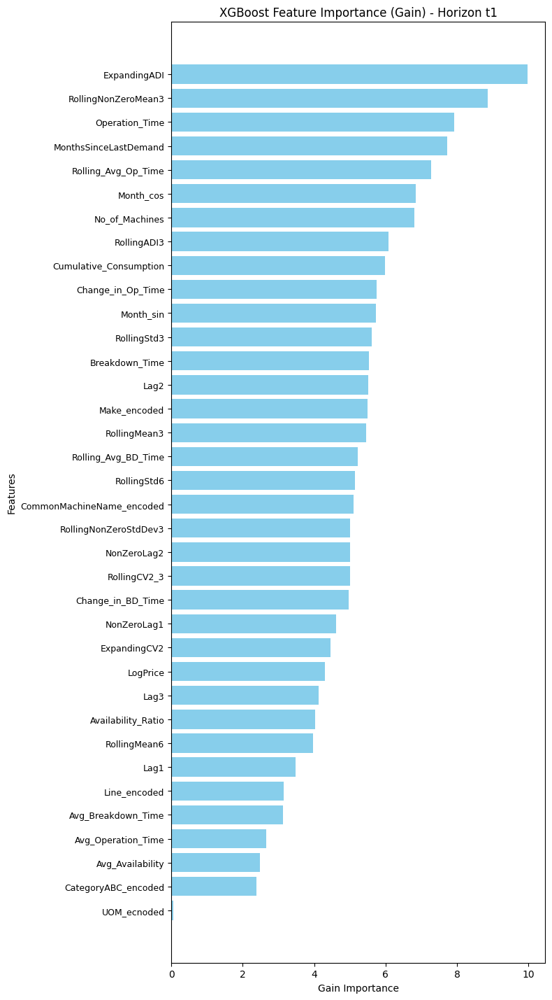

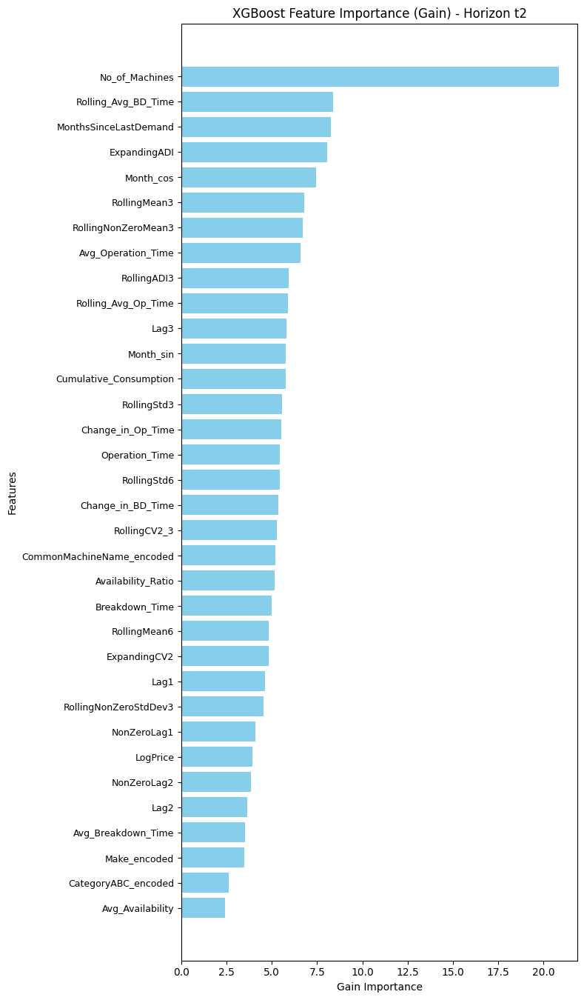

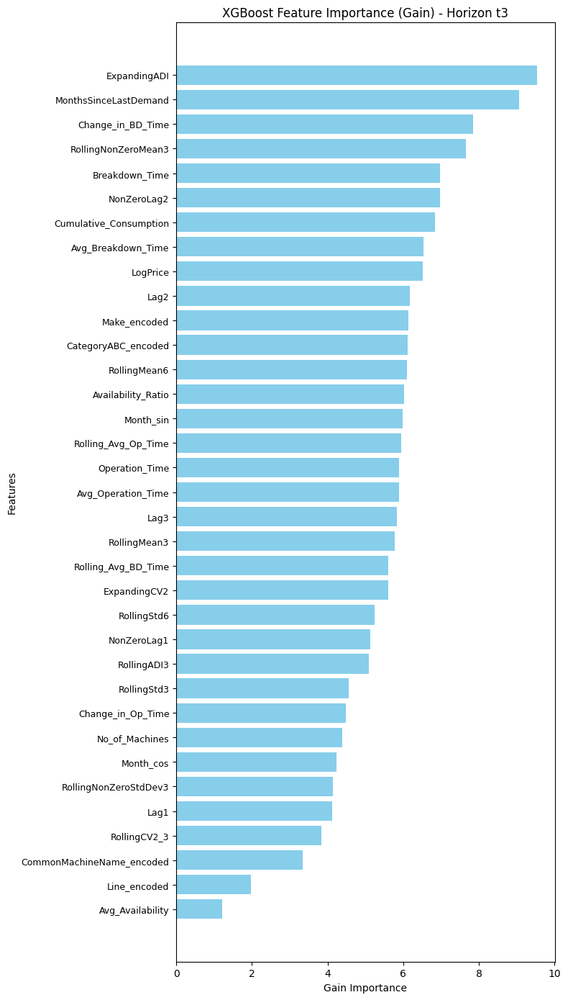

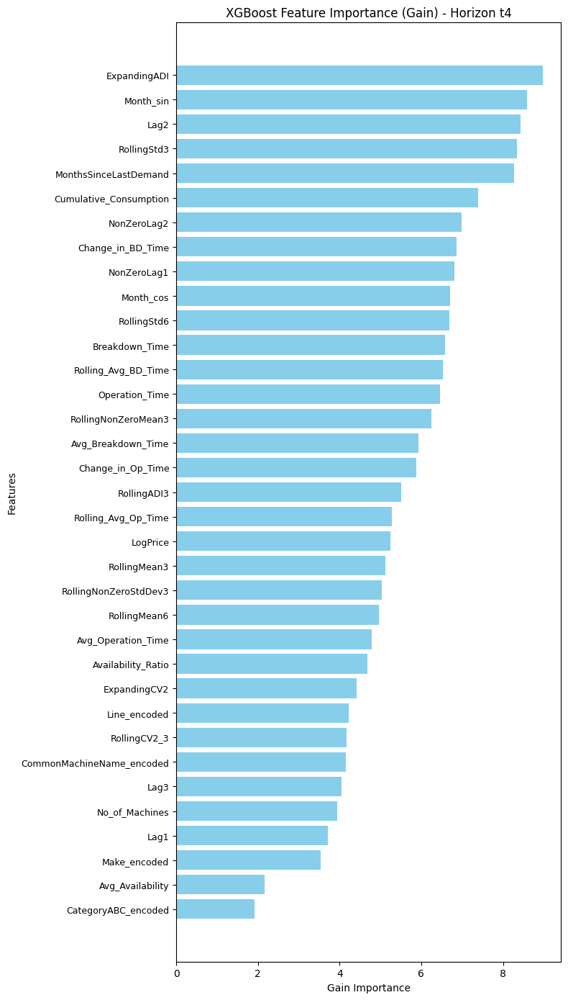

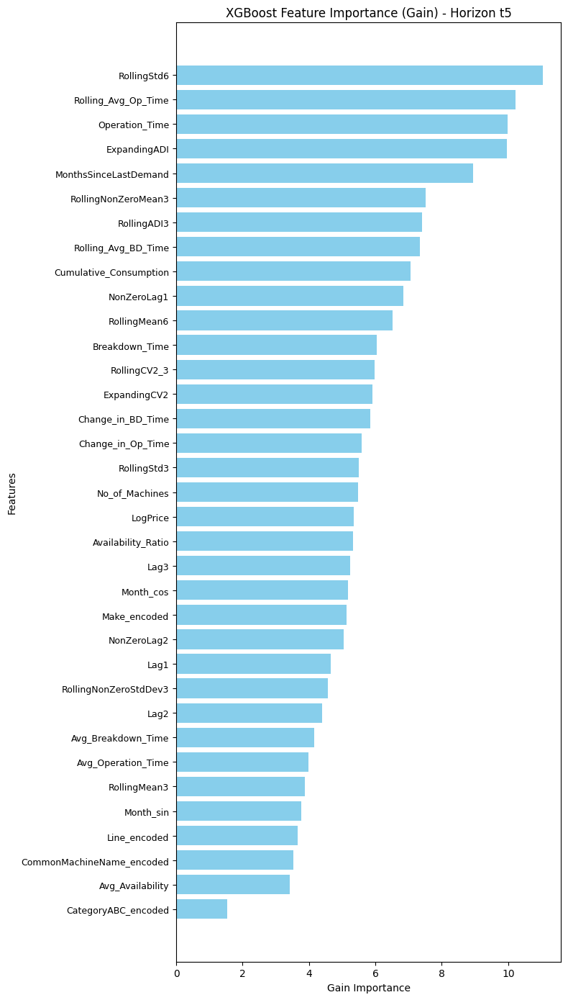

...

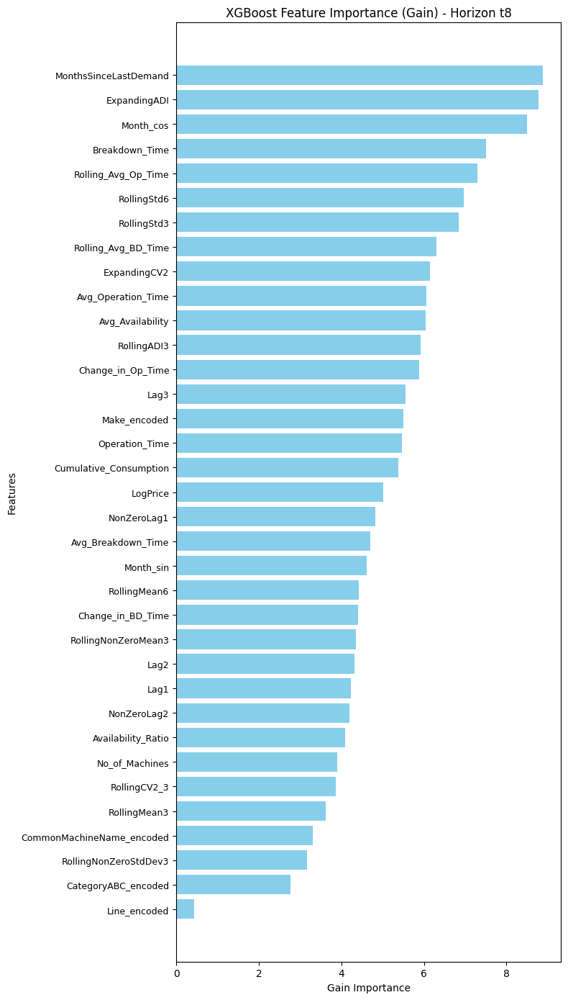

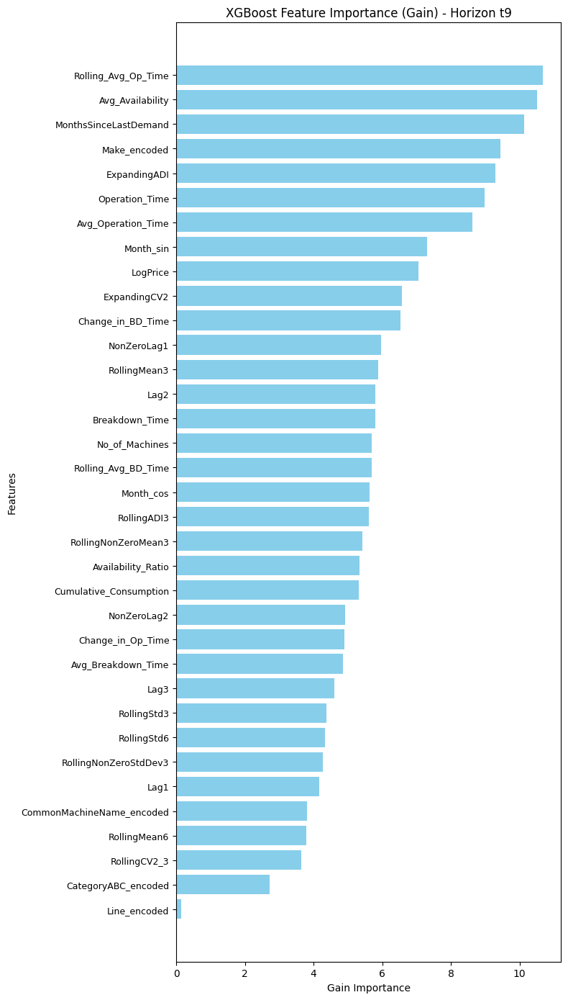

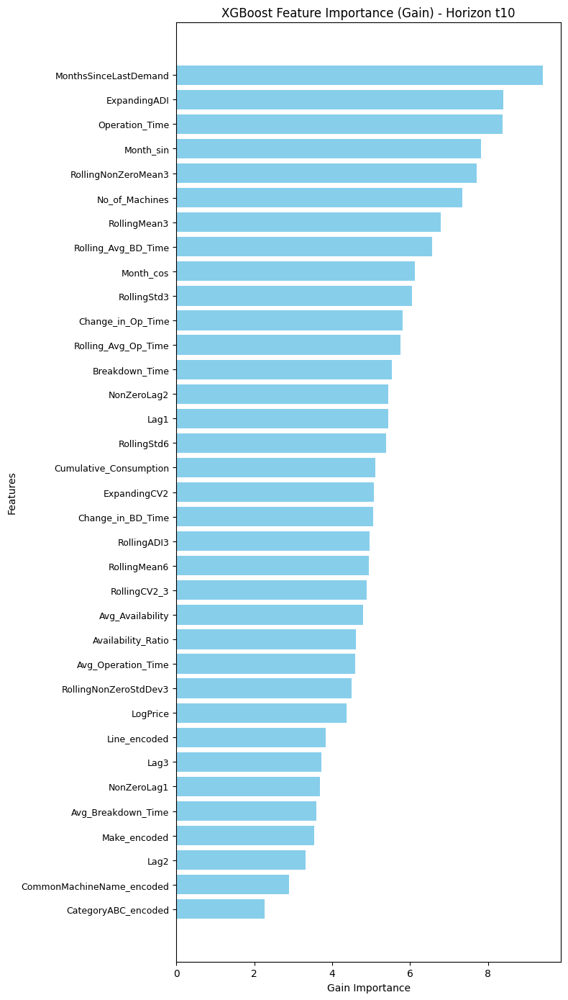

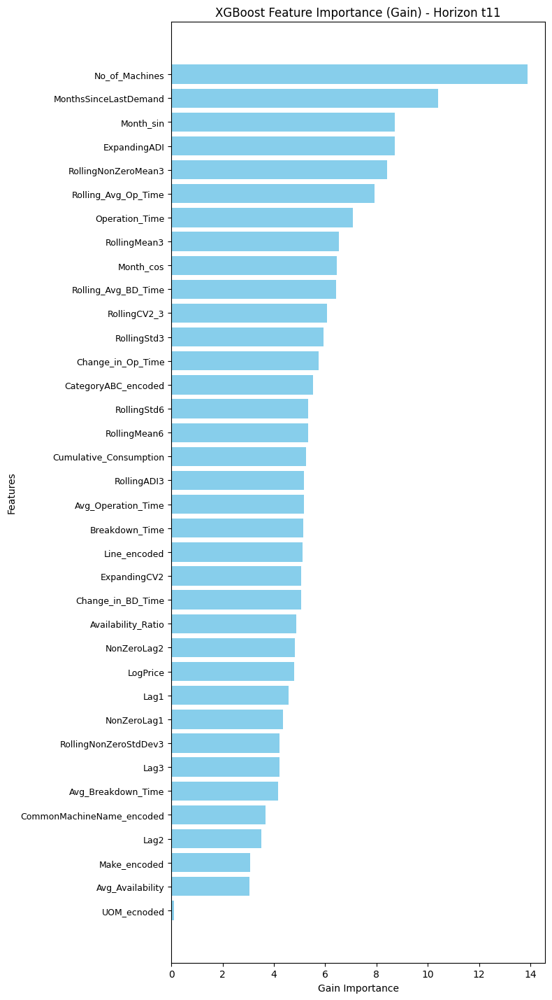

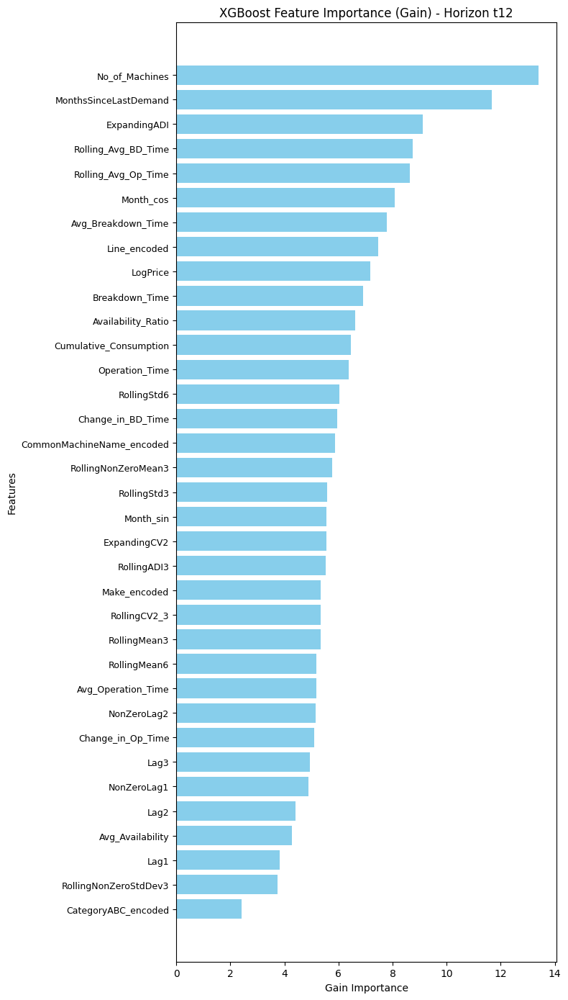

In [20]:


for i, model in enumerate(models, start=1):
    # Get importance by Gain
    importance_gain = model.get_booster().get_score(importance_type="gain")

    # Map f0, f1,... to actual feature names
    mapped_importance = {}
    for k, v in importance_gain.items():
        idx = int(k[1:])  # remove 'f' and convert to int
        mapped_importance[feature_cols[idx]] = v

    # Create dataframe
    df_gain = pd.DataFrame(list(mapped_importance.items()), columns=["Feature", "Gain"])
    df_gain = df_gain.sort_values("Gain", ascending=False)

    # Adjust figure size dynamically based on number of features
    plt.figure(figsize=(8, max(5, 0.4 * len(df_gain))))  # 0.4 inch per feature

    # Plot horizontal bar chart
    plt.barh(df_gain["Feature"], df_gain["Gain"], color="skyblue")
    plt.xlabel("Gain Importance")
    plt.ylabel("Features")
    plt.title(f"XGBoost Feature Importance (Gain) - Horizon t{i}")
    plt.gca().invert_yaxis()

    # Better spacing
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=9)
    plt.tight_layout()
    plt.show()


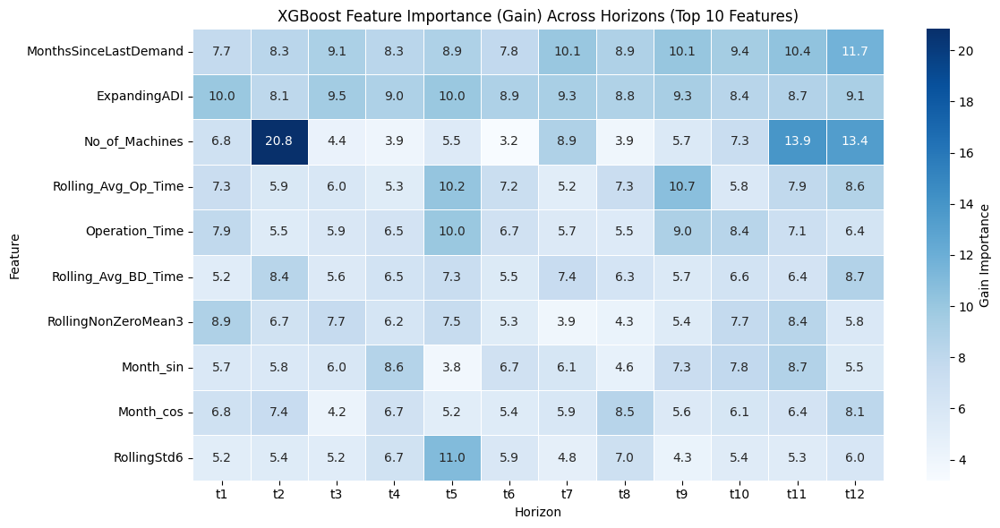

In [21]:
all_importances = []

for i, model in enumerate(models, start=1):
    importance_gain = model.get_booster().get_score(importance_type="gain")

    # Map f0, f1,... to actual feature names
    mapped_importance = {}
    for k, v in importance_gain.items():
        idx = int(k[1:])
        mapped_importance[feature_cols[idx]] = v

    df_gain = pd.DataFrame(list(mapped_importance.items()), columns=["Feature", f"t{i}"])
    all_importances.append(df_gain)

# Merge all horizon importances
importance_df = all_importances[0]
for df in all_importances[1:]:
    importance_df = importance_df.merge(df, on="Feature", how="outer")

importance_df = importance_df.fillna(0).set_index("Feature")

# ---- Pick top 10 features globally (by total Gain across horizons) ----
top_features = importance_df.sum(axis=1).sort_values(ascending=False).head(10).index
heatmap_data = importance_df.loc[top_features]

# ---- Plot heatmap ----
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data,
    annot=True, fmt=".1f", cmap="Blues", linewidths=0.5, cbar_kws={"label": "Gain Importance"}
)
plt.title("XGBoost Feature Importance (Gain) Across Horizons (Top 10 Features)")
plt.xlabel("Horizon")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [22]:
import shap

X_train_df = pd.DataFrame(X_train, columns=feature_cols)

shap_importances = {}

for i, model in enumerate(models, start=1):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train_df)

    # Mean absolute SHAP value = global importance
    mean_abs_shap = pd.Series(
        np.abs(shap_values).mean(axis=0),
        index=feature_cols,
        name=f"t{i}"
    )
    shap_importances[f"t{i}"] = mean_abs_shap

# Combine into DataFrame
shap_importance_df = pd.DataFrame(shap_importances)

print("SHAP Mean |Importance across horizons:")
print(shap_importance_df)




SHAP Mean |Importance across horizons:
                                 t1        t2        t3        t4        t5  \
Cumulative_Consumption     0.079851  0.049687  0.062621  0.068069  0.070420   
Lag1                       0.012379  0.008600  0.014137  0.008336  0.012310   
Lag2                       0.013943  0.018927  0.013983  0.024971  0.020791   
Lag3                       0.015951  0.019175  0.026474  0.018337  0.016298   
NonZeroLag1                0.011776  0.007345  0.006904  0.009884  0.015441   
NonZeroLag2                0.004584  0.008770  0.008263  0.012245  0.005938   
MonthsSinceLastDemand      0.088515  0.070839  0.042347  0.059231  0.062394   
RollingNonZeroMean3        0.028549  0.019861  0.017461  0.016598  0.013460   
RollingNonZeroStdDev3      0.016969  0.020396  0.017693  0.016383  0.015827   
RollingMean3               0.010581  0.013399  0.012981  0.011126  0.009463   
RollingStd3                0.009692  0.013024  0.009647  0.015913  0.014218   
RollingMean6 

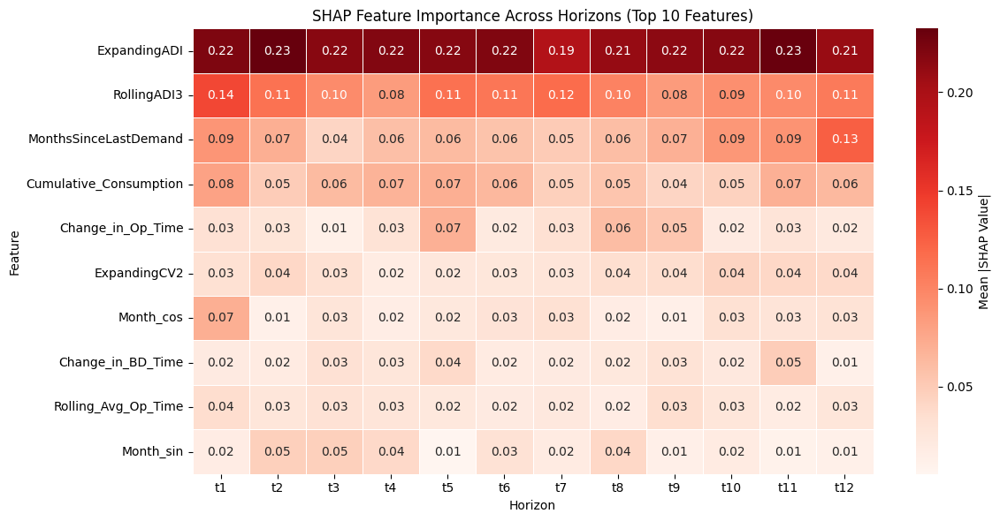

In [23]:

# ---- Pick top 10 features globally (sum of SHAP importances across horizons) ----
top_features = shap_importance_df.sum(axis=1).sort_values(ascending=False).head(10).index

# Subset only those features
heatmap_data = shap_importance_df.loc[top_features]

# ---- Plot heatmap ----
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_data,
    annot=True, fmt=".2f", cmap="Reds", linewidths=0.5, cbar_kws={"label": "Mean |SHAP Value|"}
)
plt.title("SHAP Feature Importance Across Horizons (Top 10 Features)")
plt.xlabel("Horizon")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


Processing horizon t1...
Processing horizon t2...
Processing horizon t3...
Processing horizon t4...
Processing horizon t5...
Processing horizon t6...
Processing horizon t7...
Processing horizon t8...
Processing horizon t9...
Processing horizon t10...
Processing horizon t11...
Processing horizon t12...
SHAP Mean |Importance| across horizons:
                                 t1        t2        t3        t4        t5  \
Cumulative_Consumption     0.079851  0.049687  0.062621  0.068069  0.070420   
Lag1                       0.012379  0.008600  0.014137  0.008336  0.012310   
Lag2                       0.013943  0.018927  0.013983  0.024971  0.020791   
Lag3                       0.015951  0.019175  0.026474  0.018337  0.016298   
NonZeroLag1                0.011776  0.007345  0.006904  0.009884  0.015441   
NonZeroLag2                0.004584  0.008770  0.008263  0.012245  0.005938   
MonthsSinceLastDemand      0.088515  0.070839  0.042347  0.059231  0.062394   
RollingNonZeroMean3      

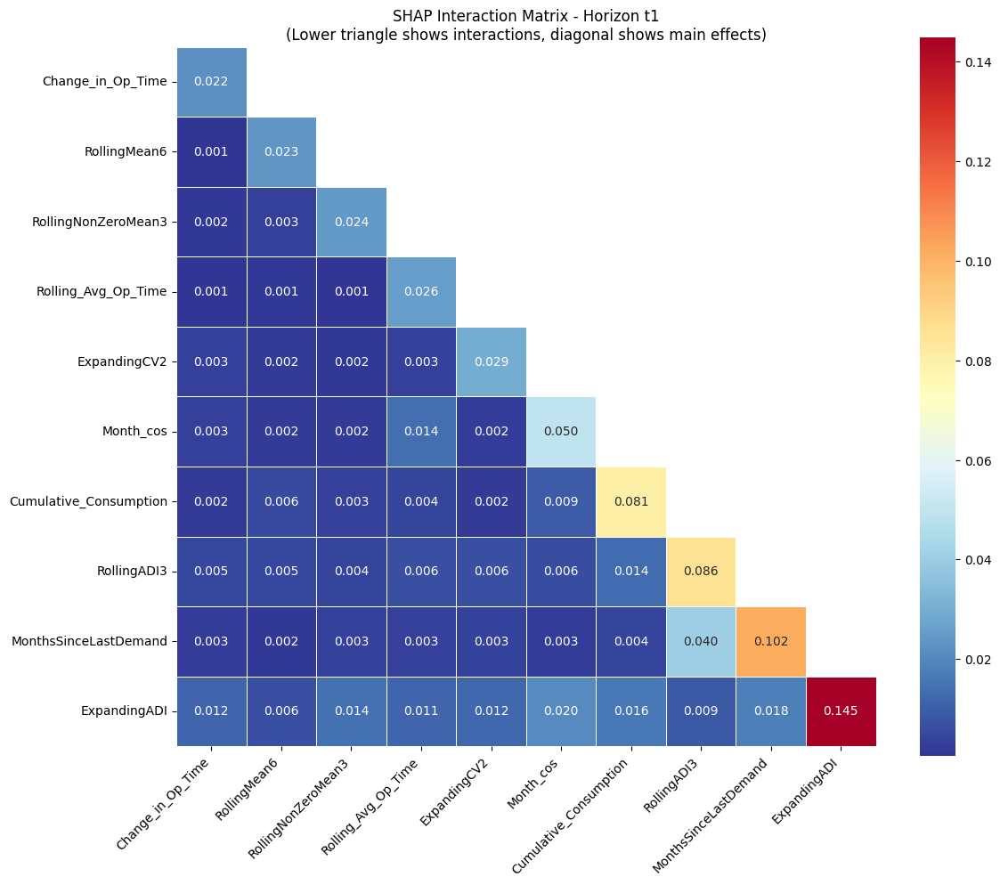

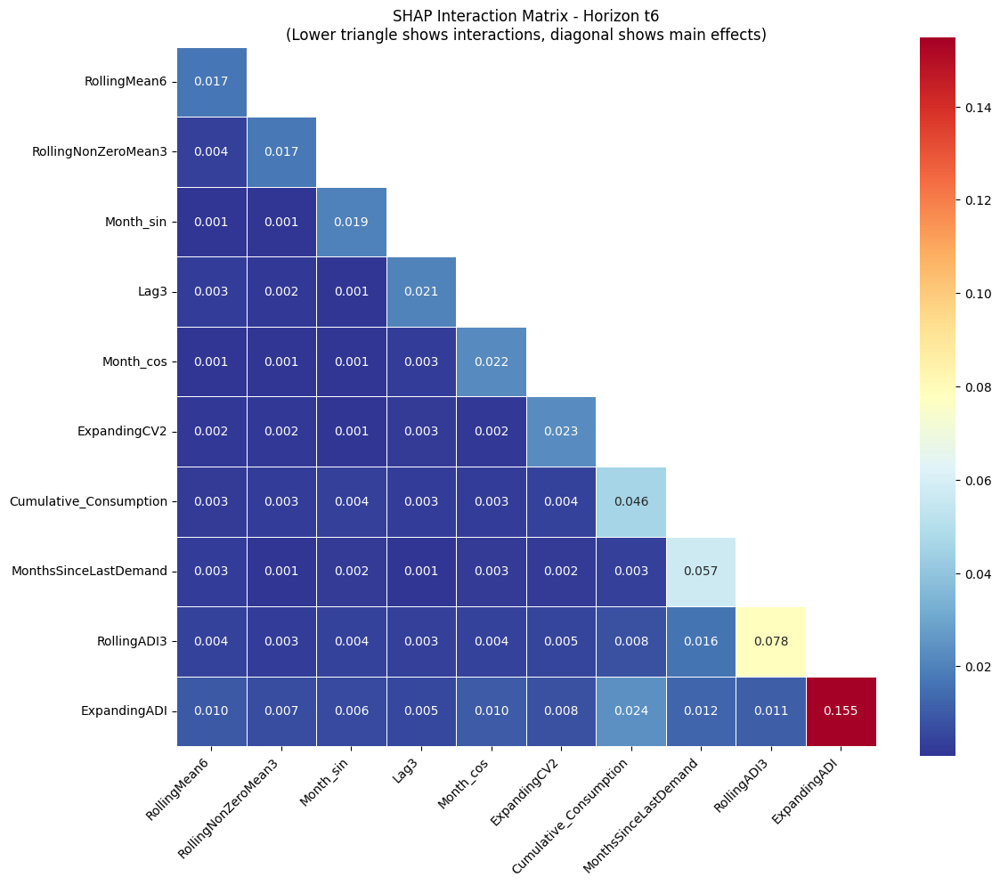

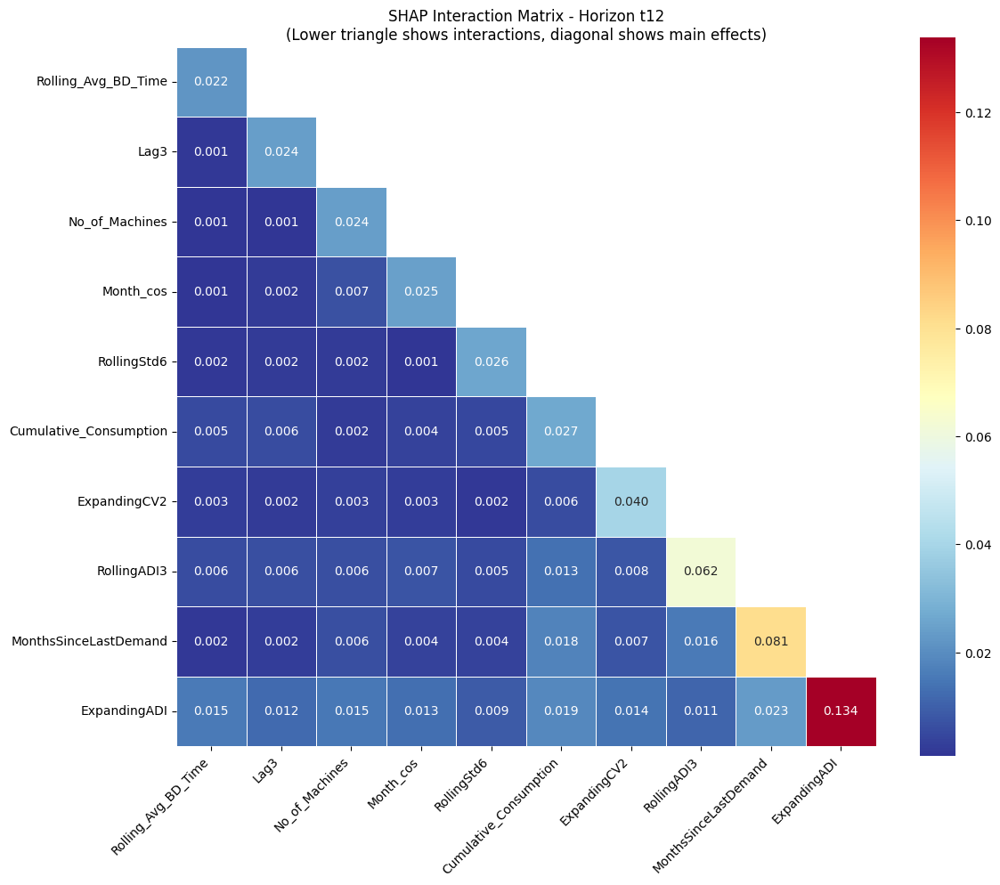


BUSINESS INSIGHTS

t1:
  Standalone important features: ['Cumulative_Consumption']
  Features with strong interactions: ['ExpandingADI', 'Month_cos', 'MonthsSinceLastDemand', 'RollingADI3']
  Strongest interaction: MonthsSinceLastDemand × RollingADI3

t2:
  Standalone important features: ['Cumulative_Consumption', 'Month_sin']
  Features with strong interactions: ['ExpandingCV2', 'ExpandingADI', 'RollingADI3', 'MonthsSinceLastDemand']
  Strongest interaction: ExpandingCV2 × ExpandingADI

t3:
  Standalone important features: ['Cumulative_Consumption', 'Month_sin', 'MonthsSinceLastDemand']
  Features with strong interactions: ['ExpandingCV2', 'Lag3', 'ExpandingADI', 'RollingADI3']
  Strongest interaction: RollingADI3 × ExpandingADI

t4:
  Standalone important features: ['RollingADI3', 'Month_sin']
  Features with strong interactions: ['ExpandingADI', 'MonthsSinceLastDemand', 'Lag2', 'Cumulative_Consumption']
  Strongest interaction: MonthsSinceLastDemand × ExpandingADI

t5:
  Standalone

In [24]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

# Your existing code
X_train_df = pd.DataFrame(X_train, columns=feature_cols)
shap_importances = {}
interaction_matrices = {}
interaction_summaries = {}

for i, model in enumerate(models, start=1):
    print(f"Processing horizon t{i}...")

    explainer = shap.TreeExplainer(model)

    # 1. Standard SHAP values (your existing code)
    shap_values = explainer.shap_values(X_train_df)
    mean_abs_shap = pd.Series(
        np.abs(shap_values).mean(axis=0),
        index=feature_cols,
        name=f"t{i}"
    )
    shap_importances[f"t{i}"] = mean_abs_shap

    # 2. SHAP Interaction Values - This is the key addition
    try:
        # Use a subset of data for interaction analysis (computationally expensive)
        sample_size = min(1000, len(X_train_df))  # Adjust based on your computational resources
        X_sample = X_train_df.sample(n=sample_size, random_state=42)

        interaction_values = explainer.shap_interaction_values(X_sample)

        # Create interaction matrix (mean absolute interaction effects)
        n_features = len(feature_cols)
        interaction_matrix = np.zeros((n_features, n_features))

        for idx1 in range(n_features):
            for idx2 in range(n_features):
                if idx1 != idx2:  # Off-diagonal elements are pure interactions
                    interaction_matrix[idx1, idx2] = np.abs(interaction_values[:, idx1, idx2]).mean()
                else:  # Diagonal elements are main effects
                    interaction_matrix[idx1, idx2] = np.abs(interaction_values[:, idx1, idx2]).mean()

        interaction_matrices[f"t{i}"] = pd.DataFrame(
            interaction_matrix,
            index=feature_cols,
            columns=feature_cols
        )

        # 3. Summarize top interactions
        interaction_pairs = []
        for idx1, feat1 in enumerate(feature_cols):
            for idx2, feat2 in enumerate(feature_cols):
                if idx1 < idx2:  # Avoid duplicates and diagonal
                    interaction_strength = interaction_matrix[idx1, idx2]
                    interaction_pairs.append({
                        'feature1': feat1,
                        'feature2': feat2,
                        'interaction_strength': interaction_strength
                    })

        interaction_summary = pd.DataFrame(interaction_pairs).sort_values(
            'interaction_strength', ascending=False
        ).head(10)
        interaction_summaries[f"t{i}"] = interaction_summary

    except Exception as e:
        print(f"Warning: Interaction analysis failed for horizon t{i}: {e}")
        continue

# Combine standard SHAP importances into DataFrame (your existing code)
shap_importance_df = pd.DataFrame(shap_importances)
print("SHAP Mean |Importance| across horizons:")
print(shap_importance_df)

# 4. Analysis Functions
def analyze_interactions_across_horizons(interaction_summaries, top_n=5):
    """Analyze which interactions are consistently important across horizons"""
    all_pairs = set()
    for horizon_interactions in interaction_summaries.values():
        for _, row in horizon_interactions.head(top_n).iterrows():
            pair = tuple(sorted([row['feature1'], row['feature2']]))
            all_pairs.add(pair)

    pair_consistency = {}
    for pair in all_pairs:
        appearances = 0
        total_strength = 0
        for horizon, interactions in interaction_summaries.items():
            for _, row in interactions.iterrows():
                current_pair = tuple(sorted([row['feature1'], row['feature2']]))
                if current_pair == pair:
                    appearances += 1
                    total_strength += row['interaction_strength']
                    break

        pair_consistency[pair] = {
            'appearances': appearances,
            'avg_strength': total_strength / len(interaction_summaries) if appearances > 0 else 0,
            'consistency_score': appearances / len(interaction_summaries)
        }

    return pd.DataFrame(pair_consistency).T.sort_values('consistency_score', ascending=False)

def plot_interaction_heatmap(interaction_matrix, horizon, top_n=10):
    """Plot interaction heatmap for a specific horizon"""
    # Focus on top features based on main effects (diagonal)
    main_effects = np.diag(interaction_matrix.values)
    top_features_idx = np.argsort(main_effects)[-top_n:]
    top_features = [interaction_matrix.index[i] for i in top_features_idx]

    subset_matrix = interaction_matrix.loc[top_features, top_features]

    plt.figure(figsize=(12, 10))
    mask = np.triu(np.ones_like(subset_matrix.values, dtype=bool), k=1)  # Mask upper triangle
    sns.heatmap(subset_matrix, annot=True, fmt='.3f', cmap='RdYlBu_r',
                mask=mask, square=True, linewidths=0.5)
    plt.title(f'SHAP Interaction Matrix - Horizon {horizon}\n(Lower triangle shows interactions, diagonal shows main effects)')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

def compare_main_vs_interaction_effects(shap_importance_df, interaction_matrices):
    """Compare main effects vs interaction effects across horizons"""
    comparison_data = []

    for horizon in interaction_matrices.keys():
        interaction_matrix = interaction_matrices[horizon]
        main_effects = np.diag(interaction_matrix.values)
        interaction_effects = interaction_matrix.values.copy()
        np.fill_diagonal(interaction_effects, 0)  # Remove main effects

        total_main = np.sum(main_effects)
        total_interaction = np.sum(np.abs(interaction_effects)) / 2  # Divide by 2 since matrix is symmetric

        comparison_data.append({
            'horizon': horizon,
            'main_effects_sum': total_main,
            'interaction_effects_sum': total_interaction,
            'interaction_ratio': total_interaction / (total_main + total_interaction)
        })

    return pd.DataFrame(comparison_data)

# 5. Run the analyses
print("\n" + "="*50)
print("INTERACTION ANALYSIS RESULTS")
print("="*50)

if interaction_summaries:
    # Top interactions for each horizon
    print("\nTop 5 interactions by horizon:")
    for horizon, interactions in interaction_summaries.items():
        print(f"\n{horizon}:")
        print(interactions.head().to_string(index=False))

    # Consistent interactions across horizons
    print("\nConsistent interactions across horizons:")
    consistency_analysis = analyze_interactions_across_horizons(interaction_summaries)
    print(consistency_analysis.head(10))

    # Main vs interaction effects comparison
    print("\nMain Effects vs Interaction Effects:")
    effects_comparison = compare_main_vs_interaction_effects(shap_importance_df, interaction_matrices)
    print(effects_comparison)

    # Plot interaction heatmaps for selected horizons
    horizons_to_plot = ['t1', 't6', 't12']  # Adjust based on your horizons
    for horizon in horizons_to_plot:
        if horizon in interaction_matrices:
            plot_interaction_heatmap(interaction_matrices[horizon], horizon)

# 6. Business Insights Function
def generate_business_insights(interaction_summaries, shap_importance_df, top_n=3):
    """Generate business-relevant insights from the interaction analysis"""
    insights = []

    # Find features that have high individual importance but low interactions
    for horizon in shap_importance_df.columns:
        if horizon in interaction_summaries:
            high_individual = shap_importance_df[horizon].nlargest(5).index.tolist()
            top_interactions = interaction_summaries[horizon].head(top_n)

            features_in_interactions = set()
            for _, row in top_interactions.iterrows():
                features_in_interactions.add(row['feature1'])
                features_in_interactions.add(row['feature2'])

            standalone_important = [f for f in high_individual if f not in features_in_interactions]

            insights.append({
                'horizon': horizon,
                'standalone_features': standalone_important[:3],
                'interactive_features': list(features_in_interactions)[:6],
                'top_interaction': f"{top_interactions.iloc[0]['feature1']} × {top_interactions.iloc[0]['feature2']}"
            })

    return pd.DataFrame(insights)

# Generate business insights
if interaction_summaries:
    print("\n" + "="*50)
    print("BUSINESS INSIGHTS")
    print("="*50)
    business_insights = generate_business_insights(interaction_summaries, shap_importance_df)
    for _, insight in business_insights.iterrows():
        print(f"\n{insight['horizon']}:")
        print(f"  Standalone important features: {insight['standalone_features']}")
        print(f"  Features with strong interactions: {insight['interactive_features']}")
        print(f"  Strongest interaction: {insight['top_interaction']}")

print("\nAnalysis complete!")

In [ ]:
df_fe.columns

Index(['PartCode', 'Description_consumption', 'UOM_consumption',
       'Make_consumption', 'CategoryABC', 'MinStock', 'MaxStock',
       'SAPQty_consumption', 'CommonMachineName_consumption',
       'Line_consumption', 'EachPartPrice_consumption', 'MONTH', 'CONSUMPTION',
       'Description_procurement', 'UOM_procurement', 'Make_procurement',
       'SAPQty_procurement', 'CommonMachineName_procurement',
       'Line_procurement', 'EachPartPrice_procurement', 'PROCUREMENT',
       'MONTH_YEAR', 'Cumulative_Consumption', 'Cumulative_Procurement',
       'Running_Stock', 'partCategory', 'Lag1', 'Lag2', 'Lag3', 'NonZeroLag1',
       'NonZeroLag2', 'MonthsSinceLastDemand', 'RollingMean3', 'RollingStd3',
       'RollingMean6', 'RollingStd6', 'RollingNonZeroMean3',
       'RollingNonZeroStdDev3', 'RollingCV2_3', 'RollingADI3', 'ExpandingCV2',
       'ExpandingADI', 'NZD_percent_train', 'NZD_percent_test',
       'NZD_percent_total', 'Machine Name', 'Month_Year_Date',
       'No_of_Machines',

In [ ]:
df_fe[df_fe['PartCode']=='CONCOM002378'][['CONSUMPTION','Target_t+1', 'Target_t+2', 'Target_t+3', 'Target_t+4','Target_t+5', 'Target_t+6', 'Target_t+7', 'Target_t+8', 'Target_t+9','Target_t+10', 'Target_t+11', 'Target_t+12']]

,CONSUMPTION,Target_t+1,Target_t+2,Target_t+3,Target_t+4,Target_t+5,Target_t+6,Target_t+7,Target_t+8,Target_t+9,Target_t+10,Target_t+11,Target_t+12
0,5.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
1,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0
2,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


In [ ]:
df_fe["MONTH_YEAR"].value_counts()

,count
MONTH_YEAR,
2022-01-01,280
2022-02-01,280
2022-03-01,280
2022-04-01,280
2022-05-01,280
2022-06-01,280
2022-07-01,280
2022-08-01,280
2022-09-01,280


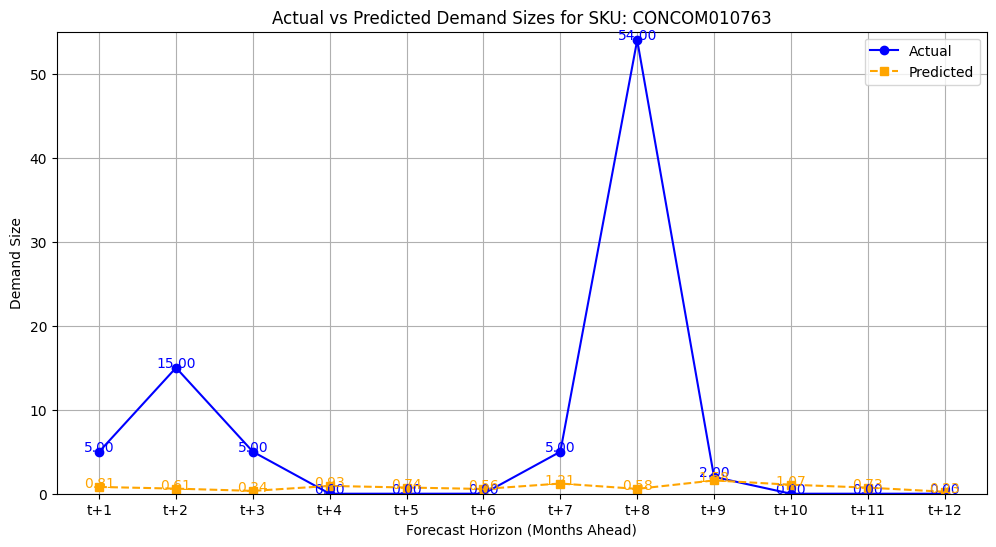

In [ ]:
plot_actual_vs_pred_size(df_fe, y_val_size, y_pred_size, y_val_indices, target_cols,partCode='CONCOM010763')

### To be investigated cases

* CONCOM010763

t+1 MAE: 1.3432, RMSE: 7.4868
t+2 MAE: 1.3859, RMSE: 7.6197
t+3 MAE: 1.3503, RMSE: 7.6154
t+4 MAE: 1.3618, RMSE: 7.5341
t+5 MAE: 1.3916, RMSE: 8.1951
t+6 MAE: 1.3452, RMSE: 8.2036
t+7 MAE: 1.4728, RMSE: 8.6630
t+8 MAE: 1.3679, RMSE: 7.4874
t+9 MAE: 1.4094, RMSE: 7.5817
t+10 MAE: 1.3345, RMSE: 7.4352
t+11 MAE: 1.4003, RMSE: 7.4165
t+12 MAE: 1.2670, RMSE: 6.3316


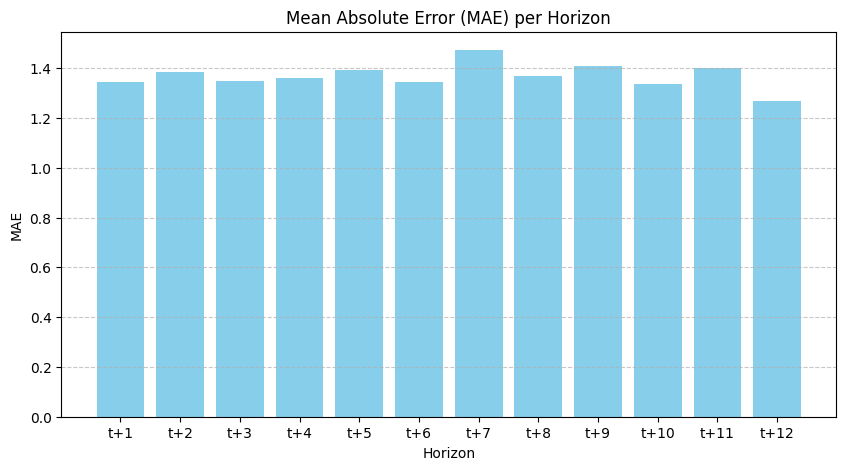

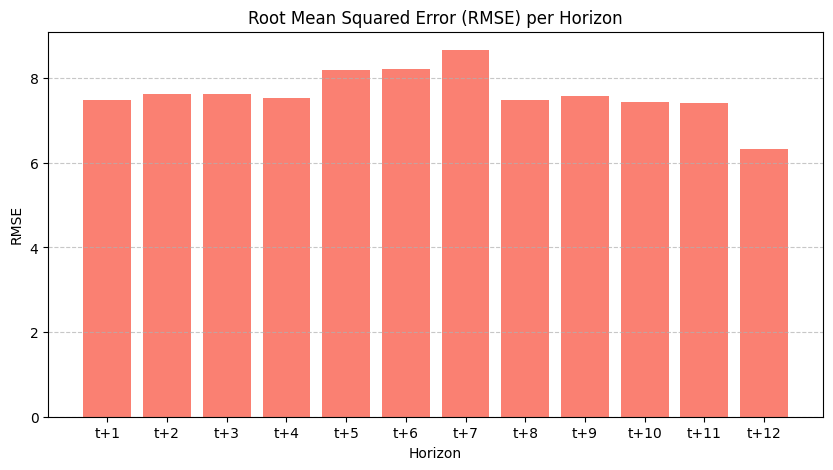

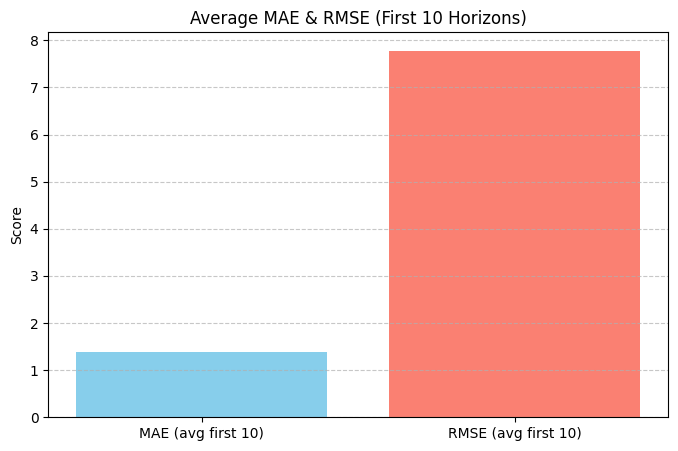

In [ ]:
plot_mae_rmse_per_horizon(y_val_size, y_pred_size, horizon=H)

/tmp/ipython-input-2902417657.py:74: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


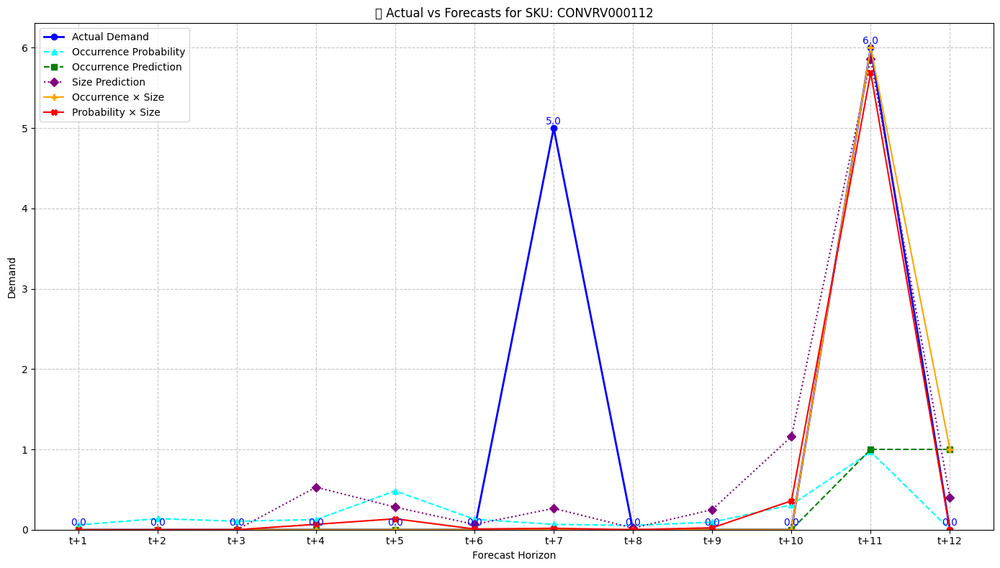

In [ ]:
plot_combined_forecasts(
    df_fe, y_val_size, y_prob_occurence, y_pred_occurence, y_pred_size, y_val_indices, target_cols, partCode = 'CONVRV000112'
)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ----------------------------
# CATEGORIZATION FUNCTIONS
# ----------------------------
def categorize_mase(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 2.5:
        return 'Good'
    else:
        return 'Poor'

def categorize_msse(x):
    if x < 1:
        return 'Excellent'
    elif 1 <= x <= 6.25:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_nz(x):
    if x <= 5:
        return 'Excellent'
    elif 5 < x <= 15:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_id(x):
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

def categorize_ida(x):
    if x >= 0.8:         # ≥80% accuracy
        return 'Excellent'
    elif 0.5 <= x < 0.8: # between 50–80% accuracy
        return 'Good'
    else:                # <50% accuracy or negative
        return 'Poor'


# ----------------------------
# SKU-LEVEL METRIC CALCULATION
# ----------------------------
def compute_sku_level_metrics(df, y_true_size, y_pred_size, y_true_occur, y_pred_occur):
    """
    df: original dataframe with SKU-level info
    y_true_size, y_pred_size: arrays of true/predicted demand sizes
    y_true_occur, y_pred_occur: occurrence arrays (for intermittent demand)
    """
    sku_metrics = []

    for partcode in df["PartCode"].unique():
        mask = df["PartCode"] == partcode
        true = y_true_size[mask.values]
        pred_size = y_pred_size[mask.values]
        pred_occur = y_pred_occur[mask.values]
        occur = y_true_occur[mask.values]

        # Flatten horizons for this SKU
        true_flat = true.flatten()
        pred_flat = (pred_size * pred_occur).flatten()
        occur_flat = occur.flatten()

        # Naive forecast error (previous period demand)
        naive_errors = np.abs(np.diff(true_flat)).mean()
        if naive_errors == 0:
            naive_errors = 1e-6

        # Errors
        abs_errors = np.abs(true_flat - pred_flat)
        squared_errors = (true_flat - pred_flat) ** 2
        nz_mask = true_flat > 0

        # Metrics
        mase = abs_errors.mean() / naive_errors
        msse = squared_errors.mean() / (naive_errors ** 2)
        mae_nz = abs_errors[nz_mask].mean() if nz_mask.any() else 0
        mape_id = (abs_errors[nz_mask] / true_flat[nz_mask]).mean() * 100 if nz_mask.any() else 0

        # IDA: Intermittent Demand Accuracy
        total_demand = true_flat.sum()
        total_abs_errors = abs_errors.sum()
        ida = 1 - abs_errors.sum() / (total_demand + 1e-6) if total_demand > 0 else 0

        sku_metrics.append({
            "PartCode": partcode,
            "MASE": mase,
            "MSSE": msse,
            "MAE_NZ": mae_nz,
            "MAPE_ID": mape_id,
            "IDA": ida,
            "CategoryABC": df.loc[mask, "CategoryABC"].iloc[0],
            "TotalDemand" : total_demand,
            "TotalAbsError": total_abs_errors
        })

    return pd.DataFrame(sku_metrics)


# ----------------------------
# APPLY CATEGORIZATION
# ----------------------------
def apply_categories(df):
    categories = ['Excellent', 'Good', 'Poor']
    df['MASE_Category'] = pd.Categorical(df['MASE'].apply(categorize_mase), categories=categories, ordered=True)
    df['MSSE_Category'] = pd.Categorical(df['MSSE'].apply(categorize_msse), categories=categories, ordered=True)
    df['MAE_NZ_Category'] = pd.Categorical(df['MAE_NZ'].apply(categorize_mae_nz), categories=categories, ordered=True)
    df['MAPE_ID_Category'] = pd.Categorical(df['MAPE_ID'].apply(categorize_mape_id), categories=categories, ordered=True)
    df['IDA_Category'] = pd.Categorical(df['IDA'].apply(categorize_ida), categories=categories, ordered=True)
    return df


# ----------------------------
# PLOT FUNCTION
# ----------------------------
def plot_sku_performance_categories(sku_metrics_df):
    palette = sns.color_palette("Set2")
    categories = ['Excellent', 'Good', 'Poor']
    fig, axes = plt.subplots(3, 2, figsize=(18, 12))
    axes = axes.flatten()

    metrics_cols = ['MASE_Category', 'MSSE_Category', 'MAE_NZ_Category', 'MAPE_ID_Category', 'IDA_Category']
    titles = ['MASE', 'MSSE', 'MAE-NZ', 'MAPE-ID', 'IDA']

    for i, (metric_col, title) in enumerate(zip(metrics_cols, titles)):
        sns.histplot(
            data=sku_metrics_df,
            x=metric_col,
            hue='CategoryABC',
            multiple='stack',
            shrink=0.8,
            palette=palette,
            hue_order=sorted(sku_metrics_df['CategoryABC'].unique()),
            discrete=True,
            ax=axes[i],
            stat="count"
        )
        axes[i].set_title(f"{title} Performance Categories")
        axes[i].set_xlabel('Performance')
        axes[i].set_ylabel('SKU Count')
        axes[i].set_xticks(range(len(categories)))
        axes[i].set_xticklabels(categories)

    # Hide unused subplot (if any)
    if len(metrics_cols) < len(axes):
        for j in range(len(metrics_cols), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


/tmp/ipython-input-1422035430.py:135: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-1422035430.py:135: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-1422035430.py:135: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-1422035430.py:135: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-1422035430.py:135: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


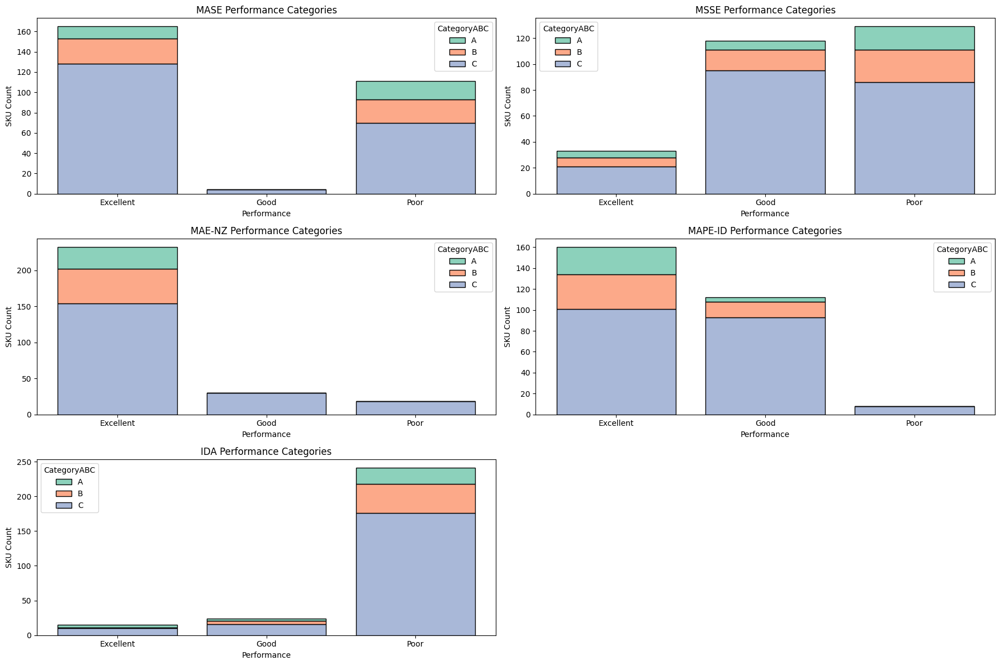

In [ ]:
# Compute SKU-level metrics
sku_metrics_df = compute_sku_level_metrics(
    df_fe.iloc[y_val_indices], y_val_size, y_pred_size, y_val_occurence, y_pred_occurence
)

# Apply categories
sku_metrics_df = apply_categories(sku_metrics_df)

# Plot stacked bar plots
plot_sku_performance_categories(sku_metrics_df)


In [ ]:
sku_metrics_df

,PartCode,MASE,MSSE,MAE_NZ,MAPE_ID,IDA,CategoryABC,TotalDemand,TotalAbsError,MASE_Category,MSSE_Category,MAE_NZ_Category,MAPE_ID_Category,IDA_Category
0,CONCOM002378,0.615184,2.886823,1.650467,108.196277,-0.154259,C,29.0,33.473517,Excellent,Good,Excellent,Poor,Poor
1,CONCOM003449,0.422692,3.021418,1.026427,76.421688,0.148164,C,14.0,11.925709,Excellent,Good,Excellent,Good,Poor
2,CONCOM003805,0.249343,0.681516,1.308418,55.306944,0.497508,C,37.0,18.592203,Excellent,Excellent,Excellent,Good,Poor
3,CONCOM004179,0.271738,0.540471,0.661254,50.445696,0.452375,A,26.0,14.238257,Excellent,Excellent,Excellent,Good,Poor
4,CONCOM004400,0.611263,1.905319,18.622956,88.597650,0.030550,C,676.0,655.348414,Excellent,Good,Poor,Good,Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,MNTVRV000179,0.149819,0.454026,0.286236,28.623617,0.698074,C,10.0,3.019258,Excellent,Excellent,Excellent,Excellent,Good
276,MNTVRV000231,0.071433,0.196577,0.104078,10.407838,0.856043,A,2.0,0.287915,Excellent,Excellent,Excellent,Excellent,Excellent
277,MNTVRV000246,0.346066,1.768690,1.127355,56.367769,0.302584,C,20.0,13.948312,Excellent,Good,Excellent,Good,Poor
278,MNTVRV000247,0.418616,1.725319,3.210359,77.966826,0.156377,C,62.0,52.304611,Excellent,Good,Excellent,Good,Poor


In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

# ----------------------------
# CATEGORIZATION FUNCTIONS
# ----------------------------
def categorize_precision(x):
    if x >= 0.90:
        return 'Excellent'
    elif 0.70 <= x < 0.90:
        return 'Good'
    else:
        return 'Poor'

def categorize_recall(x):
    if x >= 0.90:
        return 'Excellent'
    elif 0.70 <= x < 0.90:
        return 'Good'
    else:
        return 'Poor'

def categorize_f1(x):
    if x >= 0.90:
        return 'Excellent'
    elif 0.70 <= x < 0.90:
        return 'Good'
    else:
        return 'Poor'

def categorize_mape_nz(x):  # x in %
    if x <= 50:
        return 'Excellent'
    elif 50 < x <= 100:
        return 'Good'
    else:
        return 'Poor'

def categorize_mae_zero(x):
    if x <= 1:
        return 'Excellent'
    elif 1 < x <= 5:
        return 'Good'
    else:
        return 'Poor'

# ----------------------------
# SKU-LEVEL METRIC CALCULATION
# ----------------------------
def compute_sku_level_metrics(df, y_true_size, y_pred_size, y_true_occur, y_pred_occur):
    """
    df: original dataframe with SKU-level info
    y_true_size, y_pred_size: arrays of true/predicted demand sizes
    y_true_occur, y_pred_occur: occurrence arrays (0/1 or probabilities; if prob, >=0.5 is treated as 1)
    """
    sku_metrics = []

    for partcode in df["PartCode"].unique():
        mask = (df["PartCode"] == partcode).values
        print(f"Metrics for Part Code : {partcode}")
        true_flat = np.asarray(y_true_size[mask]).flatten()
        pred_size_flat = np.asarray(y_pred_size[mask]).flatten()
        print(f"Shape of Size (True vs Pred) : {true_flat.shape} | {pred_size_flat.shape}")
        true_occ_flat = np.asarray(y_true_occur[mask]).flatten().astype(int)
        pred_occ_raw = np.asarray(y_pred_occur[mask]).flatten()
        print(f"Shape of Occurence (True vs Pred) : {true_occ_flat.shape} | {pred_occ_raw.shape}")
        # If predictions are probabilities, threshold at 0.5; otherwise assume 0/1 already
        if np.issubdtype(pred_occ_raw.dtype, np.floating):
            print(f"Predictions are probabilities")
            pred_occ_flat = (pred_occ_raw >= 0.5).astype(int)
        else:
            pred_occ_flat = pred_occ_raw.astype(int)

        # Final demand forecast = occurrence * size
        pred_flat = pred_size_flat * pred_occ_flat

        # Masks
        nz_mask = true_flat > 0
        zero_mask = ~nz_mask

        # --- Occurrence metrics ---
        # Guard against all-negative class (no positives) to avoid undefined metrics
        precision = precision_score(true_occ_flat, pred_occ_flat, zero_division=0)
        recall = recall_score(true_occ_flat, pred_occ_flat, zero_division=0)
        f1 = f1_score(true_occ_flat, pred_occ_flat, zero_division=0)

        # --- Size metrics ---
        abs_errors = np.abs(true_flat - pred_flat)
        mape_nz = (abs_errors[nz_mask] / np.maximum(true_flat[nz_mask], 1e-6)).mean() * 100 if nz_mask.any() else 0.0
        mae_zero = abs_errors[zero_mask].mean() if zero_mask.any() else 0.0

        sku_metrics.append({
            "PartCode": partcode,
            "CategoryABC": df.loc[mask, "CategoryABC"].iloc[0],
            "Precision": precision,
            "Recall": recall,
            "F1": f1,
            "MAPE_NZ": mape_nz,
            "MAE_Zero": mae_zero,
        })

    return pd.DataFrame(sku_metrics)

# ----------------------------
# APPLY CATEGORIZATION
# ----------------------------
def apply_categories(df):
    categories = ['Excellent', 'Good', 'Poor']
    df = df.copy()
    df['Precision_Category'] = pd.Categorical(df['Precision'].apply(categorize_precision), categories=categories, ordered=True)
    df['Recall_Category']    = pd.Categorical(df['Recall'].apply(categorize_recall), categories=categories, ordered=True)
    df['F1_Category']        = pd.Categorical(df['F1'].apply(categorize_f1), categories=categories, ordered=True)
    df['MAPE_NZ_Category']   = pd.Categorical(df['MAPE_NZ'].apply(categorize_mape_nz), categories=categories, ordered=True)
    df['MAE_Zero_Category']  = pd.Categorical(df['MAE_Zero'].apply(categorize_mae_zero), categories=categories, ordered=True)
    return df

def split_sku_groups(df, y_true_size):
    """Return partcodes with all-zero demand vs. at least one non-zero."""
    zero_skus = []
    nonzero_skus = []

    for partcode in df["PartCode"].unique():
        mask = (df["PartCode"] == partcode).values
        true_flat = np.asarray(y_true_size[mask]).flatten()

        if np.all(true_flat == 0):
            zero_skus.append(partcode)
        else:
            nonzero_skus.append(partcode)

    print("SKUs with ALL-ZERO demand:", zero_skus)
    print("SKUs with AT LEAST one non-zero demand:", nonzero_skus)
    return zero_skus, nonzero_skus

# ----------------------------
# PLOT FUNCTION (raw distributions)
# ----------------------------
def plot_sku_performance_metrics(sku_metrics_df):
    palette = sns.color_palette("Set2")
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    metrics_cols = ['Precision', 'Recall', 'F1', 'MAPE_NZ', 'MAE_Zero']
    titles = ['Precision (Occurrence)', 'Recall (Occurrence)', 'F1 (Occurrence)',
              'MAPE (Non-Zero Demand, %)', 'MAE (Zero Demand)']

    for i, (metric_col, title) in enumerate(zip(metrics_cols, titles)):
        sns.histplot(
            data=sku_metrics_df,
            x=metric_col,
            hue='CategoryABC',
            multiple='stack',
            shrink=0.8,
            palette=palette,
            hue_order=sorted(sku_metrics_df['CategoryABC'].unique()),
            ax=axes[i],
            stat="count"
        )
        axes[i].set_title(title)
        axes[i].set_xlabel(metric_col)
        axes[i].set_ylabel('SKU Count')

    # Remove any unused axes
    if len(metrics_cols) < len(axes):
        for j in range(len(metrics_cols), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

def plot_sku_performance_metrics_r1(sku_metrics_df, zero_skus):
    palette = sns.color_palette("Set2")

    # --- ALL-ZERO SKUs → only MAE_Zero ---
    df_zero = sku_metrics_df[sku_metrics_df["PartCode"].isin(zero_skus)]
    if not df_zero.empty:
        plt.figure(figsize=(8, 6))
        sns.histplot(
            data=df_zero,
            x="MAE_Zero",
            hue="CategoryABC",
            multiple="stack",
            shrink=0.8,
            palette=palette,
            hue_order=sorted(df_zero['CategoryABC'].unique()),
            stat="count"
        )
        plt.title("MAE (Zero Demand) for All-Zero SKUs")
        plt.xlabel("MAE_Zero")
        plt.ylabel("SKU Count")
        plt.show()

    # --- NON-ZERO SKUs → all metrics ---
    df_nonzero = sku_metrics_df[~sku_metrics_df["PartCode"].isin(zero_skus)]
    if not df_nonzero.empty:
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()

        metrics_cols = ['Precision', 'Recall', 'F1', 'MAPE_NZ', 'MAE_Zero']
        titles = ['Precision (Occurrence)', 'Recall (Occurrence)', 'F1 (Occurrence)',
                  'MAPE (Non-Zero Demand, %)', 'MAE (Zero Demand)']

        for i, (metric_col, title) in enumerate(zip(metrics_cols, titles)):
            sns.histplot(
                data=df_nonzero,
                x=metric_col,
                hue='CategoryABC',
                multiple='stack',
                shrink=0.8,
                palette=palette,
                hue_order=sorted(df_nonzero['CategoryABC'].unique()),
                ax=axes[i],
                stat="count"
            )
            axes[i].set_title(title)
            axes[i].set_xlabel(metric_col)
            axes[i].set_ylabel('SKU Count')

        # Remove extra subplot
        if len(metrics_cols) < len(axes):
            for j in range(len(metrics_cols), len(axes)):
                fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()


# ----------------------------
# PLOT FUNCTION (category counts)
# ----------------------------
def plot_sku_performance_categories(sku_metrics_df_with_cats):
    palette = sns.color_palette("Set2")
    categories = ['Excellent', 'Good', 'Poor']

    # Define category ranges for each metric
    category_ranges = {
        'Precision_Category': ['Excellent (≥0.9)', 'Good (0.7–0.9)', 'Poor (<0.7)'],
        'Recall_Category': ['Excellent (≥0.9)', 'Good (0.7–0.9)', 'Poor (<0.7)'],
        'F1_Category': ['Excellent (≥0.9)', 'Good (0.7–0.9)', 'Poor (<0.7)'],
        'MAPE_NZ_Category': ['Excellent (<10%)', 'Good (10–20%)', 'Poor (>20%)'],
        'MAE_Zero_Category': ['Excellent (<1)', 'Good (1–5)', 'Poor (>5)']
    }

    cat_cols = list(category_ranges.keys())
    titles = ['Precision', 'Recall', 'F1', 'MAPE (NZ)', 'MAE (Zero)']

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for i, (cat_col, title) in enumerate(zip(cat_cols, titles)):
        sns.histplot(
            data=sku_metrics_df_with_cats,
            x=cat_col,
            hue='CategoryABC',
            multiple='stack',
            shrink=0.8,
            palette=palette,
            hue_order=sorted(sku_metrics_df_with_cats['CategoryABC'].unique()),
            discrete=True,
            ax=axes[i],
            stat="count"
        )
        axes[i].set_title(f"{title} Categories")
        axes[i].set_xlabel('Performance')
        axes[i].set_ylabel('SKU Count')
        axes[i].set_xticks(range(len(categories)))
        axes[i].set_xticklabels(category_ranges[cat_col])

    # Remove any unused axes
    if len(cat_cols) < len(axes):
        for j in range(len(cat_cols), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

def plot_sku_performance_categories_r1(sku_metrics_df_with_cats, zero_skus):
    palette = sns.color_palette("Set2")
    categories = ['Excellent', 'Good', 'Poor']

    category_ranges = {
        'Precision_Category': ['Excellent (≥0.9)', 'Good (0.7–0.9)', 'Poor (<0.7)'],
        'Recall_Category': ['Excellent (≥0.9)', 'Good (0.7–0.9)', 'Poor (<0.7)'],
        'F1_Category': ['Excellent (≥0.9)', 'Good (0.7–0.9)', 'Poor (<0.7)'],
        'MAPE_NZ_Category': ['Excellent (<50%)', 'Good (50–100%)', 'Poor (>100%)'],
        'MAE_Zero_Category': ['Excellent (<1)', 'Good (1–5)', 'Poor (>5)']
    }

    # --- ALL-ZERO SKUs → only MAE_Zero ---
    df_zero = sku_metrics_df_with_cats[sku_metrics_df_with_cats["PartCode"].isin(zero_skus)]
    if not df_zero.empty:
        plt.figure(figsize=(8, 6))
        sns.histplot(
            data=df_zero,
            x="MAE_Zero_Category",
            hue="CategoryABC",
            multiple="stack",
            shrink=0.8,
            palette=palette,
            hue_order=sorted(df_zero['CategoryABC'].unique()),
            discrete=True,
            stat="count"
        )
        plt.title("MAE (Zero Demand) Categories for All-Zero SKUs")
        plt.xlabel("Performance")
        plt.ylabel("SKU Count")
        plt.xticks(range(len(categories)), category_ranges["MAE_Zero_Category"])
        plt.show()

    # --- NON-ZERO SKUs → all metrics ---
    df_nonzero = sku_metrics_df_with_cats[~sku_metrics_df_with_cats["PartCode"].isin(zero_skus)]
    if not df_nonzero.empty:
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        axes = axes.flatten()

        cat_cols = list(category_ranges.keys())
        titles = ['Precision', 'Recall', 'F1', 'MAPE (NZ)', 'MAE (Zero)']

        for i, (cat_col, title) in enumerate(zip(cat_cols, titles)):
            sns.histplot(
                data=df_nonzero,
                x=cat_col,
                hue='CategoryABC',
                multiple='stack',
                shrink=0.8,
                palette=palette,
                hue_order=sorted(df_nonzero['CategoryABC'].unique()),
                discrete=True,
                ax=axes[i],
                stat="count"
            )
            axes[i].set_title(f"{title} Categories")
            axes[i].set_xlabel("Performance")
            axes[i].set_ylabel("SKU Count")
            axes[i].set_xticks(range(len(categories)))
            axes[i].set_xticklabels(category_ranges[cat_col])

        if len(cat_cols) < len(axes):
            for j in range(len(cat_cols), len(axes)):
                fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()



(3360, 36)

In [ ]:
check = df_fe.iloc[y_val_indices]

In [ ]:
check[check['PartCode'] == 'CONCOM002378']

,PartCode,Description_consumption,UOM_consumption,Make_consumption,CategoryABC,MinStock,MaxStock,SAPQty_consumption,CommonMachineName_consumption,Line_consumption,...,Target_t+3,Target_t+4,Target_t+5,Target_t+6,Target_t+7,Target_t+8,Target_t+9,Target_t+10,Target_t+11,Target_t+12
24,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,5.0
25,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0
26,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.0,3.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0,2.0
27,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,3.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0,2.0,0.0
28,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.0,0.0,0.0,0.0,1.0,5.0,1.0,2.0,0.0,1.0
29,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.0,0.0,0.0,1.0,5.0,1.0,2.0,0.0,1.0,0.0
30,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.0,0.0,1.0,5.0,1.0,2.0,0.0,1.0,0.0,0.0
31,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.0,1.0,5.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0
32,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,1.0,5.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0
33,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,5.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
y_val_size

array([[ 0.,  2.,  1., ...,  0.,  1.,  5.],
       [ 2.,  1.,  0., ...,  1.,  5.,  1.],
       [ 1.,  0.,  0., ...,  5.,  1.,  2.],
       ...,
       [20.,  0., 52., ...,  0.,  0.,  0.],
       [ 0., 52.,  0., ...,  0.,  0., 20.],
       [52.,  0.,  0., ...,  0., 20.,  0.]])

In [ ]:
y_pred_occurence.shape

(3360, 12)

## Metrics Evaluation

In [26]:
final_pred = np.ceil(y_pred_occurence * y_pred_size)

In [27]:
final_pred_train = np.ceil(y_pred_occur_train * y_pred_size_train)

In [28]:
final_pred.shape

(3360, 12)

Metrics for Part Code : CONCOM002378
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM003449
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM003805
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM004179
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM004400
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM004401
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM004402
Shape of Size (True vs Pred) : (144,) | (144,)
Shape of Occurence (True vs Pred) : (144,) | (144,)
Metrics for Part Code : CONCOM004403
Shape of Si

/tmp/ipython-input-2348750913.py:181: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


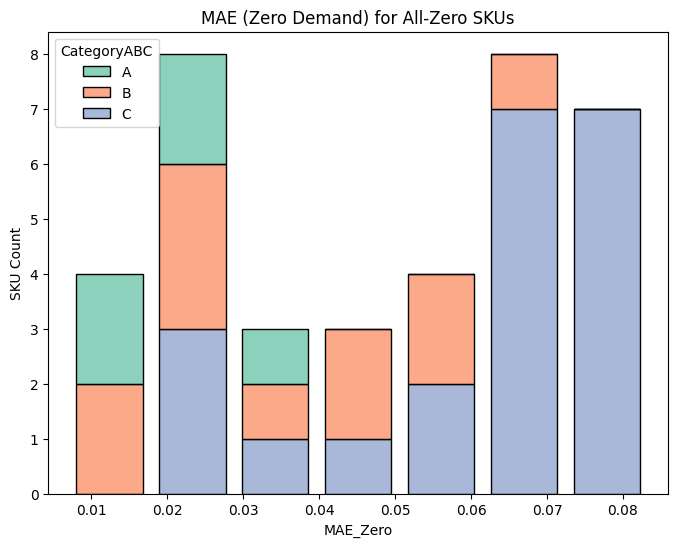

/tmp/ipython-input-2348750913.py:207: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:207: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:207: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:207: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:207: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


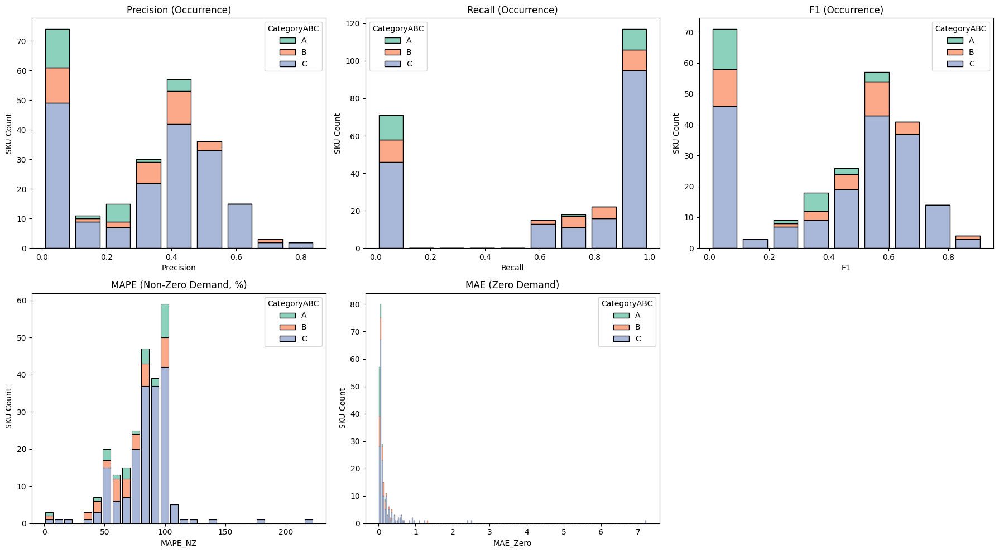

/tmp/ipython-input-2348750913.py:296: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


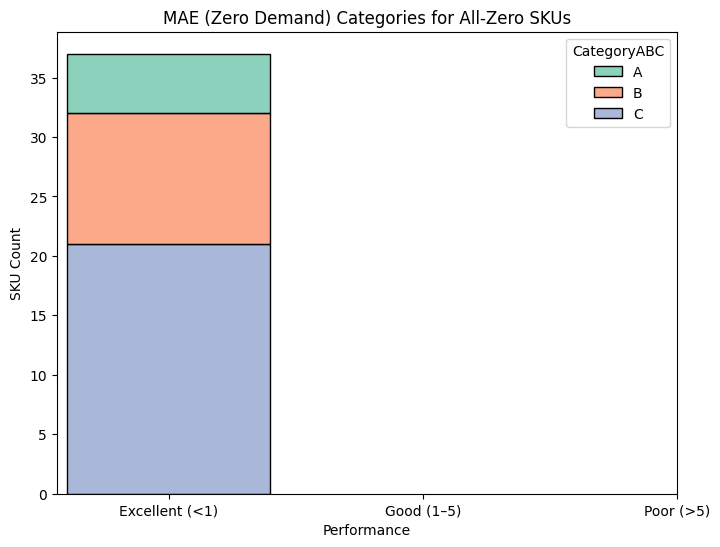

/tmp/ipython-input-2348750913.py:323: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:323: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:323: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:323: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(
/tmp/ipython-input-2348750913.py:323: UserWarning: The palette list has more values (8) than needed (3), which may not be intended.
  sns.histplot(


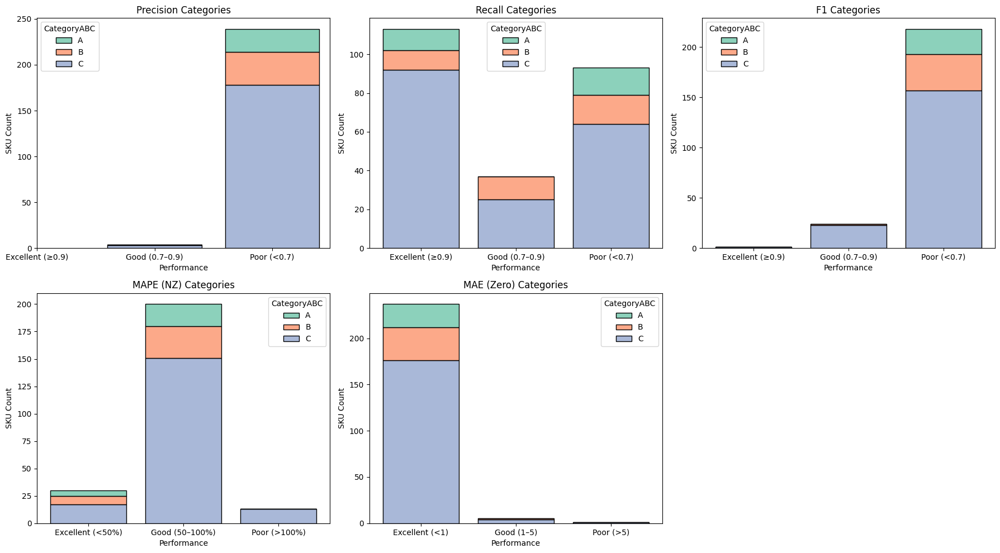

In [31]:
# Compute SKU-level metrics
sku_metrics_df = compute_sku_level_metrics(
    df_fe.iloc[y_val_indices], y_val_size, final_pred, y_val_occurence, y_pred_occurence
)

zero_skus, nonzero_skus = split_sku_groups(df_fe.iloc[y_val_indices], y_val_size)
# Apply categories
sku_metrics_df = apply_categories(sku_metrics_df)


plot_sku_performance_metrics_r1(sku_metrics_df,zero_skus)
# Plot stacked bar plots
plot_sku_performance_categories_r1(sku_metrics_df,zero_skus)


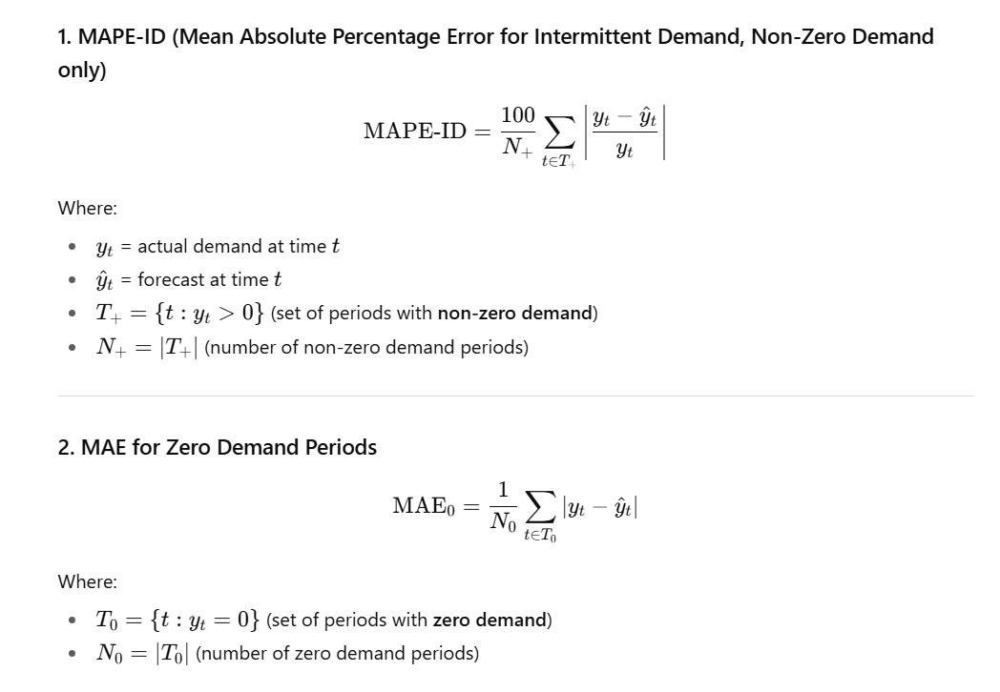

First Level Metrics


---


1. For Non-Zero Demand in Test Set
* Only MAE (Zero)
<br>
<br>
2. For Zero Demand in Test Set

* Recall
* MAPE-ID(for Non-Zero)
* MAE (Zero)

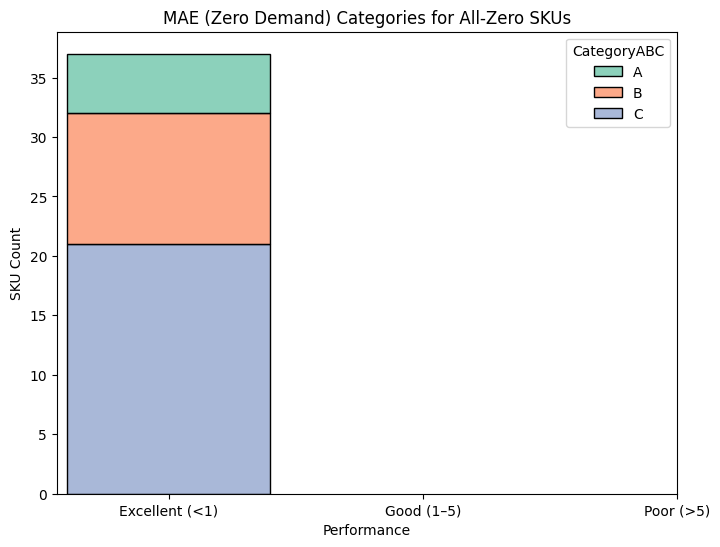

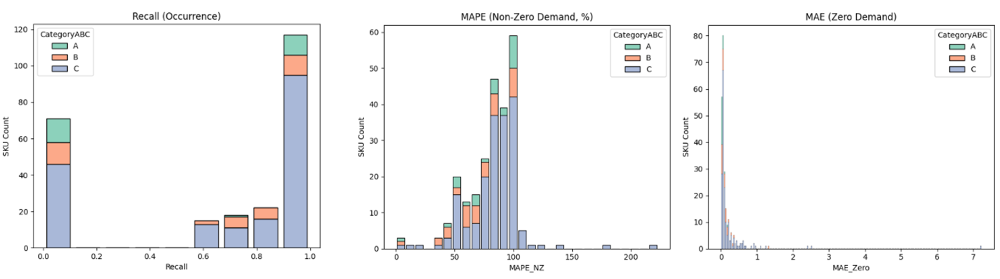

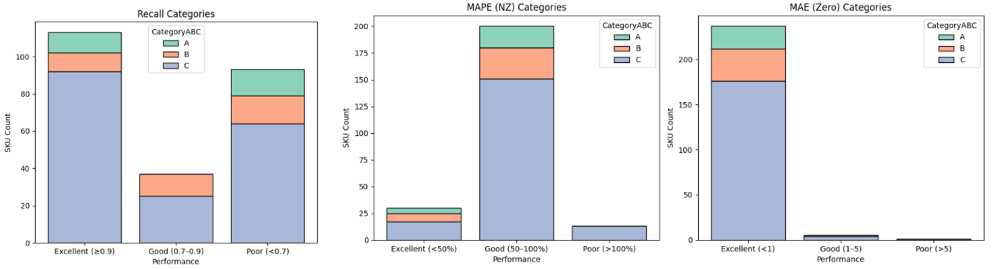

In [ ]:
sku_metrics_df[(sku_metrics_df['Recall_Category'] == 'Poor') & (sku_metrics_df['Recall'] > 0)].sort_values(by=['Recall'])

,PartCode,CategoryABC,Precision,Recall,F1,MAPE_NZ,MAE_Zero,Precision_Category,Recall_Category,F1_Category,MAPE_NZ_Category,MAE_Zero_Category
171,CONCOM010544,B,0.294118,0.555556,0.384615,70.588235,0.062992,Poor,Poor,Poor,Good,Excellent
278,MNTVRV000247,C,0.440000,0.578947,0.500000,70.476190,0.089431,Poor,Poor,Poor,Good,Excellent
93,CONCOM009037,C,0.434783,0.588235,0.500000,92.805195,0.155963,Poor,Poor,Poor,Good,Excellent
28,CONCOM006254,C,0.375000,0.600000,0.461538,86.666667,0.100775,Poor,Poor,Poor,Good,Excellent
158,CONCOM010368,C,0.352941,0.600000,0.444444,103.021475,1.104651,Poor,Poor,Poor,Poor,Good
159,CONCOM010369,C,0.407407,0.611111,0.488889,75.416667,0.116667,Poor,Poor,Poor,Good,Excellent
261,CONVRV000112,C,0.440000,0.611111,0.511628,76.011905,0.094828,Poor,Poor,Poor,Good,Excellent
19,CONCOM005367,B,0.307692,0.615385,0.410256,72.463768,0.107438,Poor,Poor,Poor,Good,Excellent
262,CONVRV000113,C,0.464286,0.619048,0.530612,84.331832,0.093750,Poor,Poor,Poor,Good,Excellent
256,CONRA001053,C,0.344828,0.625000,0.444444,82.113821,0.145631,Poor,Poor,Poor,Good,Excellent


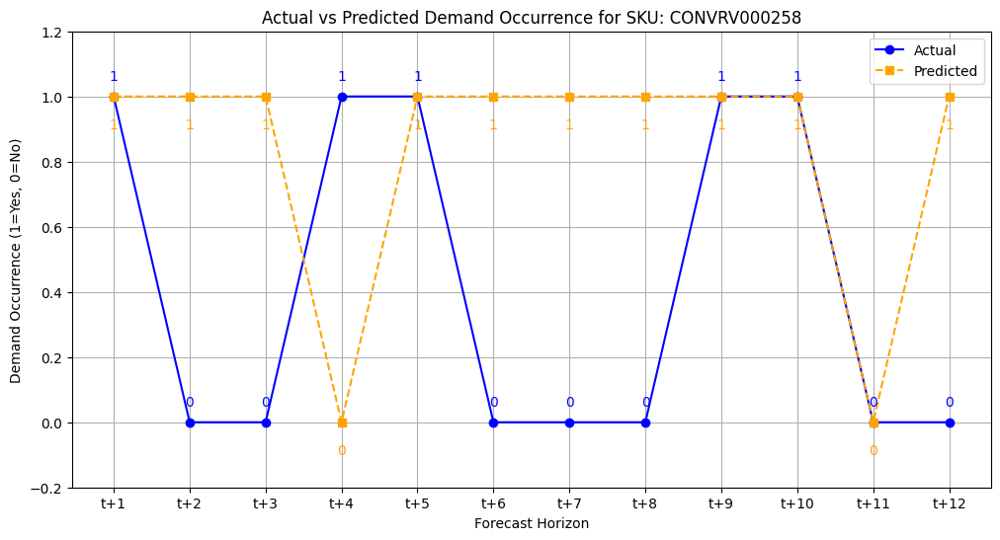

In [ ]:
plot_actual_vs_pred(df_fe.reset_index(drop=True), y_val_occurence, y_pred_occurence, target_cols, PartCode = 'CONVRV000258')

In [ ]:
final_pred.shape

(3360, 12)

In [32]:
result_train_df = pd.DataFrame(final_pred_train, columns=['t1','t2','t3','t4','t5','t6','t7','t8','t9','t10','t11','t12'])

In [33]:
result_train_df.shape

(6720, 12)

In [34]:
train_df = l2_merged_df[train_mask].copy(deep=True)

In [35]:
train_df.shape

(6720, 59)

In [36]:
eval_df = l2_merged_df[val_mask].copy(deep=True)

In [37]:
eval_df.shape

(3360, 59)

1. join result_df with train_df
2. filter only last for t+12 predictions (which is part of test set)
3. now convert merged to long format
4. compare consumption , procurement and predictions
5. check running stock in both scenarios

In [38]:
train_result_combined = pd.concat(
    [train_df.reset_index(drop=True),
     result_train_df.reset_index(drop=True)],
    axis=1
)

In [39]:
train_result_combined.shape

(6720, 71)

In [40]:
train_df_filtered = train_result_combined[train_result_combined["MONTH_YEAR"] == '2023-12-01']

In [41]:
train_df_filtered.shape

(280, 71)

In [42]:
train_df_filtered['MONTH_YEAR']

,MONTH_YEAR
23,2023-12-01
47,2023-12-01
71,2023-12-01
95,2023-12-01
119,2023-12-01
...,...
6623,2023-12-01
6647,2023-12-01
6671,2023-12-01
6695,2023-12-01


In [43]:
# Define which columns are t1..t12
value_vars = [f"t{i}" for i in range(1, 13)]
id_vars = [col for col in train_df_filtered.columns if col not in value_vars]



In [44]:
len(value_vars)

12

In [45]:
# Melt to long format
train_long_df_filtered = train_df_filtered.melt(
    id_vars=id_vars,
    value_vars=value_vars,
    var_name="horizon",
    value_name="forecast"
)



In [46]:
# Map horizon -> date
horizon_to_date = {f"t{i}": pd.Timestamp(2024, i, 1) for i in range(1, 13)}


In [47]:
train_long_df_filtered["horizon_month_year"] = train_long_df_filtered["horizon"].map(horizon_to_date)

In [48]:
train_long_df_filtered

,PartCode,Description_consumption,UOM_consumption,Make_consumption,CategoryABC,MinStock,MaxStock,SAPQty_consumption,CommonMachineName_consumption,Line_consumption,...,Rolling_Avg_BD_Time,Change_in_Op_Time,Change_in_BD_Time,Machine_Name_l2,Avg_Operation_Time,Avg_Breakdown_Time,Avg_Availability,horizon,forecast,horizon_month_year
0,CONCOM002378,BEARING 6201 ZZ,NO,SKF,C,2,3,5.0,Coil Bending Machine,R4,...,0.000000,13050.0,0.0,Coil Bending Machine,18066.666667,17.755556,0.999018,t1,0.0,2024-01-01
1,CONCOM003449,Oil Seal SB 35 50 8,NO,TO-OU KOGYO,C,2,4,20.0,Booster pump,R4,...,0.000000,26100.0,0.0,Booster pump,18546.666667,0.033333,0.999996,t1,1.0,2024-01-01
2,CONCOM003805,Auto Brazing LPG Nozzle,NO,SK Brazing,C,60,2,98.0,Auto Brazing,R4X,...,36.666667,13050.0,0.0,Auto Brazing,19449.666667,93.902222,0.994729,t1,0.0,2024-01-01
3,CONCOM004179,Coupler LNM-350-W-G New machine,NO,New Machine,A,2,10,18.0,Pressurizing,R4,...,7.666667,52200.0,-14.0,Pressurizing,17809.722222,31.165741,0.998289,t1,1.0,2024-01-01
4,CONCOM004400,Socket Nose O-Ring (6) LMN-350-W-G,NO,New Machine,C,50,100,145.0,Pressurizing,R4,...,7.666667,52200.0,-14.0,Pressurizing,17809.722222,31.165741,0.998289,t1,0.0,2024-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3355,MNTVRV000179,Washer SS41 B2-033 Gas Booster pump,NO,TO-OU KOGYO,C,2,8,5.0,Booster pump,R4,...,0.000000,26100.0,0.0,Booster pump,18546.666667,0.033333,0.999996,t12,2.0,2024-12-01
3356,MNTVRV000231,"LiftingTube11.04.01.10085,203X3170MM R3",NO,SCHMALZ,A,2,4,NaN,Vaccum Lifter,R4,...,2.000000,13050.0,-5.0,Vaccum Lifter,18931.159420,7.681159,0.999586,t12,1.0,2024-12-01
3357,MNTVRV000246,Bush SUS 303 LNM 350-W-G23,NO,New Machine,C,20,40,303.0,Pressurizing,R4,...,7.666667,52200.0,-14.0,Pressurizing,17809.722222,31.165741,0.998289,t12,2.0,2024-12-01
3358,MNTVRV000247,UType Handle Lever SPC LNM 350-W-G24,NO,New Machine,C,5,10,14.0,Pressurizing,R4,...,7.666667,52200.0,-14.0,Pressurizing,17809.722222,31.165741,0.998289,t12,1.0,2024-12-01


In [49]:
train_long_df_filtered["horizon_month_year"] = pd.to_datetime(
    train_long_df_filtered["horizon_month_year"]
)

eval_df["MONTH_YEAR"] = pd.to_datetime(
    eval_df["MONTH_YEAR"]
)

train_eval_combined_long = train_long_df_filtered.merge(
    eval_df,
    left_on=["horizon_month_year", "PartCode"],
    right_on=["MONTH_YEAR", "PartCode"],
    suffixes=("_train", "_eval")
)


In [50]:
print(train_eval_combined_long.columns.tolist())

['PartCode', 'Description_consumption_train', 'UOM_consumption_train', 'Make_consumption_train', 'CategoryABC_train', 'MinStock_train', 'MaxStock_train', 'SAPQty_consumption_train', 'CommonMachineName_consumption_train', 'Line_consumption_train', 'EachPartPrice_consumption_train', 'MONTH_train', 'CONSUMPTION_train', 'Description_procurement_train', 'UOM_procurement_train', 'Make_procurement_train', 'SAPQty_procurement_train', 'CommonMachineName_procurement_train', 'Line_procurement_train', 'EachPartPrice_procurement_train', 'PROCUREMENT_train', 'MONTH_YEAR_train', 'Cumulative_Consumption_train', 'Cumulative_Procurement_train', 'Running_Stock_train', 'partCategory_train', 'Lag1_train', 'Lag2_train', 'Lag3_train', 'NonZeroLag1_train', 'NonZeroLag2_train', 'MonthsSinceLastDemand_train', 'RollingMean3_train', 'RollingStd3_train', 'RollingMean6_train', 'RollingStd6_train', 'RollingNonZeroMean3_train', 'RollingNonZeroStdDev3_train', 'RollingCV2_3_train', 'RollingADI3_train', 'ExpandingCV2_tr

In [ ]:
train_eval_combined_long.info

<bound method DataFrame.info of           PartCode            Description_consumption_train  \
0     CONCOM002378                          BEARING 6201 ZZ   
1     CONCOM003449                      Oil Seal SB 35 50 8   
2     CONCOM003805                  Auto Brazing LPG Nozzle   
3     CONCOM004179          Coupler LNM-350-W-G New machine   
4     CONCOM004400       Socket Nose O-Ring (6) LMN-350-W-G   
...            ...                                      ...   
3355  MNTVRV000179      Washer SS41 B2-033 Gas Booster pump   
3356  MNTVRV000231  LiftingTube11.04.01.10085,203X3170MM R3   
3357  MNTVRV000246               Bush SUS 303 LNM 350-W-G23   
3358  MNTVRV000247     UType Handle Lever SPC LNM 350-W-G24   
3359  MNTVRV000248               Bolt SUS 304 LNM 350-W-G26   

     UOM_consumption_train Make_consumption_train CategoryABC_train  \
0                       NO                    SKF                 C   
1                       NO            TO-OU KOGYO                 C   
2                       NO             SK Brazing                 C   
3                       NO            New Machine                 A   
4                       NO            New Machine                 C   
...                    ...                    ...               ...   
3355                    NO            TO-OU KOGYO                 C   
3356                    NO                SCHMALZ                 A   
3357                    NO            New Machine                 C   
3358                    NO            New Machine                 C   
3359                    NO            New Machine                 C   

      MinStock_train  MaxStock_train  SAPQty_consumption_train  \
0                  2               3                       5.0   
1                  2               4                      20.0   
2                 60               2                      98.0   
3                  2              10                      18.0   
4                 50             100                     145.0   
...              ...             ...                       ...   
3355               2               8                       5.0   
3356               2               4                       NaN   
3357              20              40                     303.0   
3358               5              10                      14.0   
3359              20              40                     137.0   

     CommonMachineName_consumption_train Line_consumption_train  ...  \
0                   Coil Bending Machine                     R4  ...   
1                           Booster pump                     R4  ...   
2                           Auto Brazing                    R4X  ...   
3                           Pressurizing                     R4  ...   
4                           Pressurizing                     R4  ...   
...                                  ...                    ...  ...   
3355                        Booster pump                     R4  ...   
3356                       Vaccum Lifter                     R4  ...   
3357                        Pressurizing                     R4  ...   
3358                        Pressurizing                     R4  ...   
3359                        Pressurizing                     R4  ...   

      Breakdown_Time_eval Availability_Ratio_eval  Rolling_Avg_Op_Time_eval  \
0                    0.00                1.000000              17550.000000   
1                    0.00                1.000000              35100.000000   
2                   15.00                0.999275              17550.000000   
3                   65.00                0.999215              70200.000000   
4                   65.00                0.999215              70200.000000   
...                   ...                     ...                       ...   
3355                 0.00                1.000000              40193.333333   
3356                 5.00                0.999773              20096

In [ ]:
import random

In [51]:
random_sku = random.choice(train_eval_combined_long["PartCode"].unique())
train_eval_combined_long[train_eval_combined_long['PartCode']==random_sku]['horizon_month_year']

,horizon_month_year
258,2024-01-01
538,2024-02-01
818,2024-03-01
1098,2024-04-01
1378,2024-05-01
1658,2024-06-01
1938,2024-07-01
2218,2024-08-01
2498,2024-09-01
2778,2024-10-01


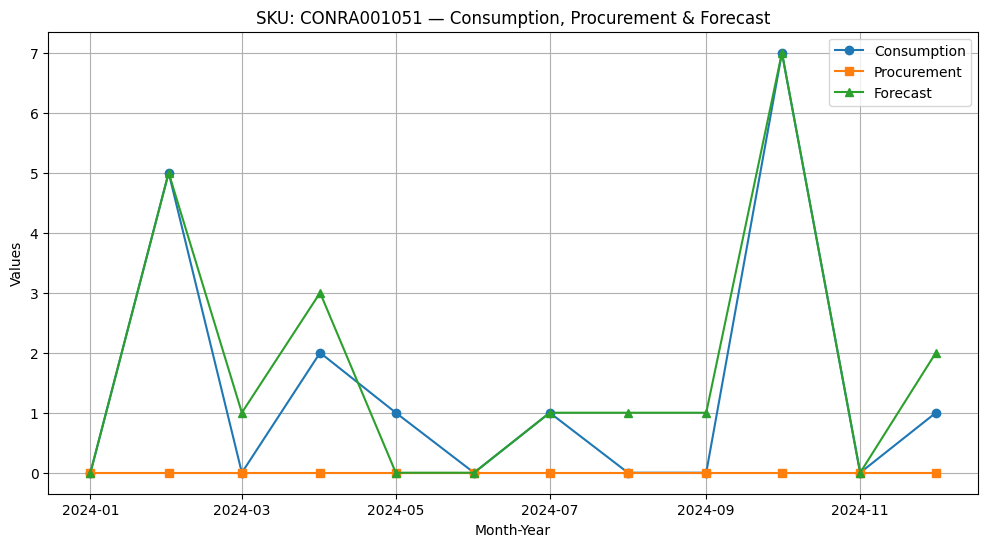

In [52]:
import random

# Pick a random SKU (PartCode)
random_sku = random.choice(train_eval_combined_long["PartCode"].unique())

# Filter for that SKU
sku_df = train_eval_combined_long[train_eval_combined_long["PartCode"] == 'CONCOM008001']

# Plot
plt.figure(figsize=(12, 6))

plt.plot(sku_df["horizon_month_year"], sku_df["CONSUMPTION_eval"], marker="o", label="Consumption")
plt.plot(sku_df["horizon_month_year"], sku_df["PROCUREMENT_eval"], marker="s", label="Procurement")
plt.plot(sku_df["horizon_month_year"], sku_df["forecast"], marker="^", label="Forecast")

plt.title(f"SKU: {random_sku} — Consumption, Procurement & Forecast")
plt.xlabel("Month-Year")
plt.ylabel("Values")
plt.legend()
plt.grid(True)
plt.show()

* good prediction example CONCOM008001
* why service level is poor even though prediction is better? eg. CONCOM003449

In [ ]:
def compute_inventory_metrics(df, base_stock=0):
    """
    Computes running stock, fill rate, and service level for manual and ML-based procurement.

    Parameters:
    df : pd.DataFrame
        Must contain columns: PartCode, CONSUMPTION_eval, PROCUREMENT_eval, forecast, horizon_month_year
    base_stock : int or float
        Initial stock level (default 0)

    Returns:
    pd.DataFrame with new columns:
        running_stock_manual, running_stock_ml, fill_rate_manual, fill_rate_ml,
        service_manual, service_ml
    """
    df = df.copy()

    # Ensure data is sorted by PartCode and month
    df = df.sort_values(["PartCode", "horizon_month_year"])

    def calc_group(group):
        group = group.copy()

        stock_manual = [base_stock]
        stock_ml = [base_stock]
        fill_rate_manual = []
        fill_rate_ml = []
        service_manual = []
        service_ml = []

        for i, row in group.iterrows():
            # Manual
            stock_prev = stock_manual[-1]
            stock_now = stock_prev + row["PROCUREMENT_eval"] - row["CONSUMPTION_eval"]
            stock_manual.append(stock_now)

            # Handle zero demand for fill rate and service
            if row["CONSUMPTION_eval"] > 0:
                fr_manual = min(max(stock_prev + row["PROCUREMENT_eval"], 0), row["CONSUMPTION_eval"]) / row["CONSUMPTION_eval"]
                service_m = 1 if stock_prev + row["PROCUREMENT_eval"] >= row["CONSUMPTION_eval"] else 0
            else:
                fr_manual = 1.0
                service_m = 1
            fill_rate_manual.append(fr_manual)
            service_manual.append(service_m)

            # # Handle zero demand for fill rate and service
            # if row["CONSUMPTION_eval"] > 0:
            #     # Cap available stock at 0
            #     available_stock = max(stock_prev + row["PROCUREMENT_eval"], 0)

            #     fr_manual = min(available_stock, row["CONSUMPTION_eval"]) / row["CONSUMPTION_eval"]
            #     service_m = 1 if available_stock >= row["CONSUMPTION_eval"] else 0
            # else:
            #     fr_manual = 1.0
            #     service_m = 1

            # fill_rate_manual.append(fr_manual)
            # service_manual.append(service_m)

            # ML
            stock_prev_ml = stock_ml[-1]
            stock_now_ml = stock_prev_ml + row["forecast"] - row["CONSUMPTION_eval"]
            stock_ml.append(stock_now_ml)

            if row["CONSUMPTION_eval"] > 0:
                fr_ml = min(max(stock_prev_ml + row["forecast"], 0), row["CONSUMPTION_eval"]) / row["CONSUMPTION_eval"]
                service_ml_val = 1 if stock_prev_ml + row["forecast"] >= row["CONSUMPTION_eval"] else 0
            else:
                fr_ml = 1.0
                service_ml_val = 1
            fill_rate_ml.append(fr_ml)
            service_ml.append(service_ml_val)

        group["running_stock_manual"] = stock_manual[1:]
        group["running_stock_ml"] = stock_ml[1:]
        group["fill_rate_manual"] = fill_rate_manual
        group["fill_rate_ml"] = fill_rate_ml
        group["service_manual"] = service_manual
        group["service_ml"] = service_ml

        return group

    df = df.groupby("PartCode", group_keys=False).apply(calc_group)
    return df


In [ ]:
train_eval_combined_long = compute_inventory_metrics(train_eval_combined_long, base_stock=0)

/tmp/ipython-input-3723159803.py:84: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby("PartCode", group_keys=False).apply(calc_group)


In [ ]:

# Metrics columns
metrics_manual = ["running_stock_manual", "fill_rate_manual", "service_manual"]
metrics_ml = ["running_stock_ml", "fill_rate_ml", "service_ml"]

# Create a combined DataFrame for easier plotting
metrics_df = train_eval_combined_long.copy()


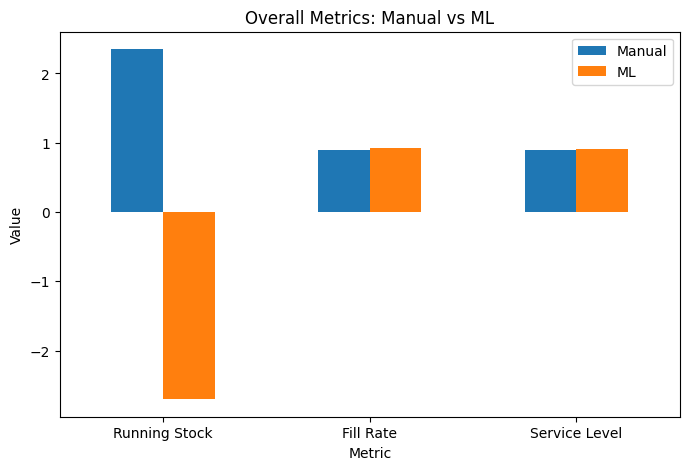

In [ ]:
overall_metrics = pd.DataFrame({
    "Metric": ["Running Stock", "Fill Rate", "Service Level"],
    "Manual": [
        metrics_df["running_stock_manual"].mean(),
        metrics_df["fill_rate_manual"].mean(),
        metrics_df["service_manual"].mean()
    ],
    "ML": [
        metrics_df["running_stock_ml"].mean(),
        metrics_df["fill_rate_ml"].mean(),
        metrics_df["service_ml"].mean()
    ]
})

# Plot
overall_metrics.plot(x="Metric", kind="bar", figsize=(8,5))
plt.title("Overall Metrics: Manual vs ML")
plt.ylabel("Value")
plt.xticks(rotation=0)
plt.show()


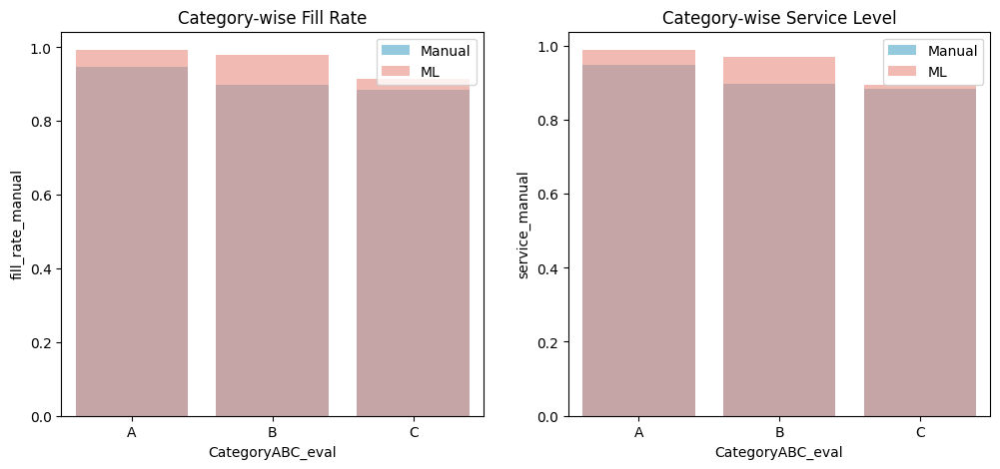

In [ ]:
category_metrics = metrics_df.groupby("CategoryABC_eval").agg({
    "running_stock_manual": "mean",
    "running_stock_ml": "mean",
    "fill_rate_manual": "mean",
    "fill_rate_ml": "mean",
    "service_manual": "mean",
    "service_ml": "mean"
}).reset_index()

# Plotting Fill Rate and Service Level
fig, axs = plt.subplots(1, 2, figsize=(12,5))

sns.barplot(data=category_metrics, x="CategoryABC_eval", y="fill_rate_manual", color="skyblue", label="Manual", ax=axs[0])
sns.barplot(data=category_metrics, x="CategoryABC_eval", y="fill_rate_ml", color="salmon", label="ML", alpha=0.6, ax=axs[0])
axs[0].set_title("Category-wise Fill Rate")
axs[0].legend()

sns.barplot(data=category_metrics, x="CategoryABC_eval", y="service_manual", color="skyblue", label="Manual", ax=axs[1])
sns.barplot(data=category_metrics, x="CategoryABC_eval", y="service_ml", color="salmon", label="ML", alpha=0.6, ax=axs[1])
axs[1].set_title("Category-wise Service Level")
axs[1].legend()

plt.show()


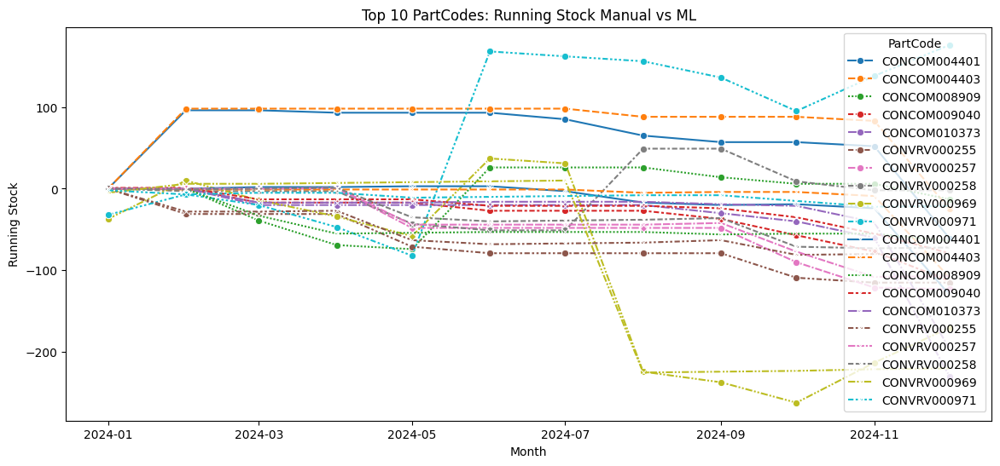

In [ ]:
top_partcodes = metrics_df.groupby("PartCode")["CONSUMPTION_eval"].sum().nlargest(10).index
top_df = metrics_df[metrics_df["PartCode"].isin(top_partcodes)]

plt.figure(figsize=(14,6))
sns.lineplot(data=top_df, x="horizon_month_year", y="running_stock_manual", hue="PartCode", marker="o", style="PartCode")
sns.lineplot(data=top_df, x="horizon_month_year", y="running_stock_ml", hue="PartCode", marker="x", style="PartCode", linestyle="--")
plt.title("Top 10 PartCodes: Running Stock Manual vs ML")
plt.xlabel("Month")
plt.ylabel("Running Stock")
plt.legend(title="PartCode")
plt.show()


In [ ]:
# Aggregate at PartCode level
partLevel_metrics = train_eval_combined_long.groupby("PartCode").agg(
    running_stock_manual=("running_stock_manual", "mean"),
    running_stock_ml=("running_stock_ml", "mean"),
    fill_rate_manual=("fill_rate_manual", "mean"),
    fill_rate_ml=("fill_rate_ml", "mean"),
    service_manual=("service_manual", "mean"),
    service_ml=("service_ml", "mean")
).reset_index()

# Compute % change: (ML - Manual) / Manual * 100
partLevel_metrics["running_stock_pct_change"] = (
    (partLevel_metrics["running_stock_ml"] - partLevel_metrics["running_stock_manual"])
    / partLevel_metrics["running_stock_manual"]
) * 100

partLevel_metrics["fill_rate_pct_change"] = (
    (partLevel_metrics["fill_rate_ml"] - partLevel_metrics["fill_rate_manual"])
    / partLevel_metrics["fill_rate_manual"]
) * 100

partLevel_metrics["service_pct_change"] = (
    (partLevel_metrics["service_ml"] - partLevel_metrics["service_manual"])
    / partLevel_metrics["service_manual"]
) * 100


In [ ]:
# Step 1: compute average non-zero demand per PartCode
avg_demand = (
    train_eval_combined_long[train_eval_combined_long["CONSUMPTION_eval"] > 0]
    .groupby("PartCode")["CONSUMPTION_eval"]
    .mean()
    .reset_index()
)
avg_demand.rename(columns={"CONSUMPTION_eval": "avg_demand"}, inplace=True)

# Step 2: Aggregate metrics at PartCode level
partLevel_metrics = train_eval_combined_long.groupby("PartCode").agg(
    running_stock_manual=("running_stock_manual", "mean"),
    running_stock_ml=("running_stock_ml", "mean"),
    fill_rate_manual=("fill_rate_manual", "mean"),
    fill_rate_ml=("fill_rate_ml", "mean"),
    service_manual=("service_manual", "mean"),
    service_ml=("service_ml", "mean"),

    # Non-zero demand cases
    fill_rate_manual_non_zero=("fill_rate_manual", lambda x: x[train_eval_combined_long.loc[x.index, "CONSUMPTION_eval"] > 0].mean()),
    fill_rate_ml_non_zero=("fill_rate_ml", lambda x: x[train_eval_combined_long.loc[x.index, "CONSUMPTION_eval"] > 0].mean()),
    service_level_manual_non_zero=("service_manual", lambda x: x[train_eval_combined_long.loc[x.index, "CONSUMPTION_eval"] > 0].mean()),
    service_level_ml_non_zero=("service_ml", lambda x: x[train_eval_combined_long.loc[x.index, "CONSUMPTION_eval"] > 0].mean())
).reset_index()

# Step 3: Merge average demand
partLevel_metrics = partLevel_metrics.merge(avg_demand, on="PartCode", how="left")

# Step 4: Handle cases where avg_demand is NaN (no non-zero demand)
partLevel_metrics["avg_demand"] = partLevel_metrics["avg_demand"].fillna(0)

# Step 5: Compute normalized running stock difference safely
partLevel_metrics["running_stock_diff"] = partLevel_metrics["running_stock_ml"] - partLevel_metrics["running_stock_manual"]

partLevel_metrics["running_stock_norm_diff"] = partLevel_metrics.apply(
    lambda row: 0 if row["avg_demand"] == 0 else (row["running_stock_ml"] - row["running_stock_manual"]) / row["avg_demand"],
    axis=1
)

# Step 6: Compute absolute differences for fill rate and service level
partLevel_metrics["fill_rate_diff"] = partLevel_metrics["fill_rate_ml"] - partLevel_metrics["fill_rate_manual"]
partLevel_metrics["service_diff"] = partLevel_metrics["service_ml"] - partLevel_metrics["service_manual"]

partLevel_metrics["fill_rate_non_zero_diff"] = partLevel_metrics["fill_rate_ml_non_zero"] - partLevel_metrics["fill_rate_manual_non_zero"]
partLevel_metrics["service_non_zero_diff"] = partLevel_metrics["service_level_ml_non_zero"] - partLevel_metrics["service_level_manual_non_zero"]

# Optional: drop avg_demand if not needed
#partLevel_metrics = partLevel_metrics.drop(columns=["avg_demand"])


In [ ]:
# Select only numeric columns
numeric_cols = partLevel_metrics.select_dtypes(include=np.number).columns

# Check NaNs
print("NaNs per numeric column:")
print(partLevel_metrics[numeric_cols].isna().sum())

# Check infinite values
print("\nInfinite values per numeric column:")
print(np.isinf(partLevel_metrics[numeric_cols]).sum())

NaNs per numeric column:
running_stock_manual               0
running_stock_ml                   0
fill_rate_manual                   0
fill_rate_ml                       0
service_manual                     0
service_ml                         0
fill_rate_manual_non_zero        106
fill_rate_ml_non_zero            106
service_level_manual_non_zero    106
service_level_ml_non_zero        106
avg_demand                         0
running_stock_diff                 0
running_stock_norm_diff            0
fill_rate_diff                     0
service_diff                       0
fill_rate_non_zero_diff          106
service_non_zero_diff            106
dtype: int64

Infinite values per numeric column:
running_stock_manual             0
running_stock_ml                 0
fill_rate_manual                 0
fill_rate_ml                     0
service_manual                   0
service_ml                       0
fill_rate_manual_non_zero        0
fill_rate_ml_non_zero            0
service_level_ma

In [ ]:
# Replace inf/-inf with 0
partLevel_metrics[numeric_cols] = partLevel_metrics[numeric_cols].replace([np.inf, -np.inf], 0)


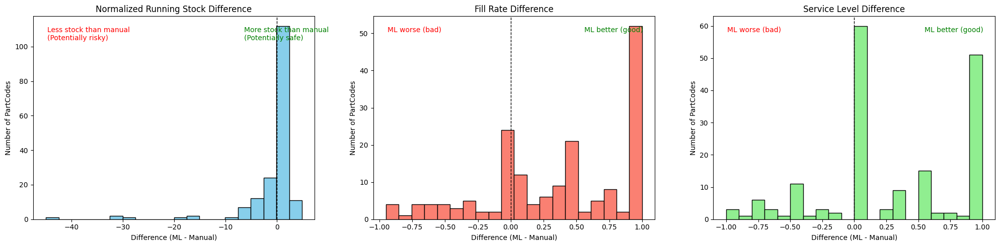

In [ ]:
# New metrics and titles
cols = ["running_stock_norm_diff", "fill_rate_non_zero_diff", "service_non_zero_diff"]
titles = ["Normalized Running Stock Difference", "Fill Rate Difference", "Service Level Difference"]
colors = ["skyblue", "salmon", "lightgreen"]

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

for ax, col, title, color in zip(axes, cols, titles, colors):
    # Plot histogram
    ax.hist(partLevel_metrics[partLevel_metrics['avg_demand']>0][col].dropna(), bins=20, color=color, edgecolor="black")

    # Vertical line at 0
    ax.axvline(0, color='black', linestyle='--', linewidth=1)

    # Add text annotations
    if col == "running_stock_norm_diff":
        ax.text(0.05, 0.95, "Less stock than manual\n(Potentially risky)", transform=ax.transAxes,
                color='red', fontsize=10, verticalalignment='top')
        ax.text(0.75, 0.95, "More stock than manual\n(Potentially safe)", transform=ax.transAxes,
                color='green', fontsize=10, verticalalignment='top')
    else:  # fill rate and service level
        ax.text(0.05, 0.95, "ML worse (bad)", transform=ax.transAxes,
                color='red', fontsize=10, verticalalignment='top')
        ax.text(0.75, 0.95, "ML better (good)", transform=ax.transAxes,
                color='green', fontsize=10, verticalalignment='top')

    ax.set_title(title)
    ax.set_xlabel("Difference (ML - Manual)")
    ax.set_ylabel("Number of PartCodes")

plt.tight_layout()
plt.show()


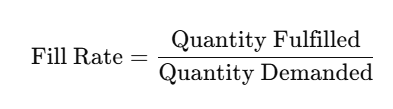

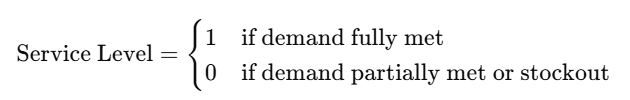

In [ ]:
partLevel_metrics[partLevel_metrics['PartCode'] == 'CONCOM008001'].T

,60
PartCode,CONCOM008001
running_stock_manual,-9.083333
running_stock_ml,3.166667
fill_rate_manual,0.5
fill_rate_ml,1.0
service_manual,0.5
service_ml,1.0
fill_rate_manual_non_zero,0.0
fill_rate_ml_non_zero,1.0
service_level_manual_non_zero,0.0


In [ ]:
eval_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3360 entries, 24 to 10079
Data columns (total 59 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   PartCode                       3360 non-null   object        
 1   Description_consumption        3360 non-null   object        
 2   UOM_consumption                3324 non-null   object        
 3   Make_consumption               3228 non-null   object        
 4   CategoryABC                    3360 non-null   object        
 5   MinStock                       3360 non-null   int64         
 6   MaxStock                       3360 non-null   int64         
 7   SAPQty_consumption             2256 non-null   float64       
 8   CommonMachineName_consumption  3360 non-null   object        
 9   Line_consumption               3360 non-null   object        
 10  EachPartPrice_consumption      3348 non-null   float64       
 11  MONTH               

In [ ]:
selected_cols = ["PartCode", "CategoryABC", "Description_consumption","MinStock","MaxStock","Make_procurement","CommonMachineName_procurement","Line_procurement","EachPartPrice_procurement"]

eval_unique = (
    eval_df[selected_cols]
    .groupby("PartCode", as_index=False)
    .first()
)

partLevel_metrics_meta = partLevel_metrics.merge(
     eval_unique,
    on="PartCode",
    how="left"
)

In [ ]:
partLevel_metrics_meta.shape

(280, 26)

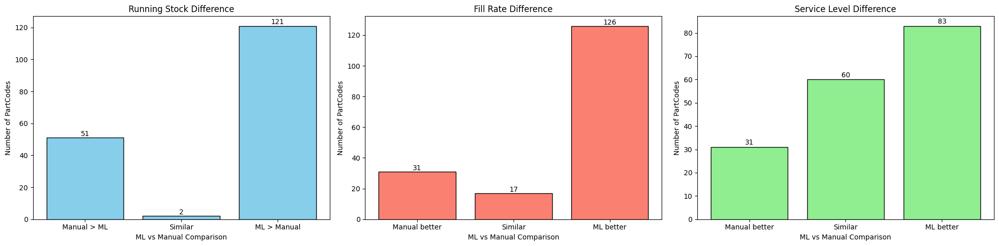

In [ ]:
import matplotlib.pyplot as plt

# Metrics and titles
cols = ["running_stock_norm_diff", "fill_rate_non_zero_diff", "service_non_zero_diff"]
titles = ["Running Stock Difference", "Fill Rate Difference", "Service Level Difference"]
colors = ["skyblue", "salmon", "lightgreen"]

# Categories
def categorize_diff(x, metric_type="running_stock"):
    if x > 0:
        return "ML > Manual" if metric_type == "running_stock" else "ML better"
    elif x < 0:
        return "Manual > ML" if metric_type == "running_stock" else "Manual better"
    else:
        return "Similar"

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

for ax, col, title, color in zip(axes, cols, titles, colors):
    metric_type = "running_stock" if col == "running_stock_norm_diff" else "other"

    # Categorize differences
    categories = partLevel_metrics[partLevel_metrics['avg_demand']>0][col].apply(lambda x: categorize_diff(x, metric_type))

    # Count occurrences
    counts = categories.value_counts().reindex(["Manual > ML", "Similar", "ML > Manual"] if metric_type=="running_stock" else ["Manual better", "Similar", "ML better"])

    # Bar plot
    ax.bar(counts.index, counts.values, color=color, edgecolor="black")

    # Add labels on top of bars
    for i, v in enumerate(counts.values):
        ax.text(i, v + 1, str(v), ha='center', fontsize=10)

    ax.set_title(title)
    ax.set_ylabel("Number of PartCodes")
    ax.set_xlabel("ML vs Manual Comparison")

plt.tight_layout()
plt.show()


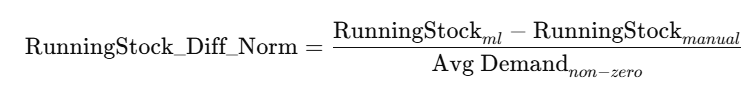

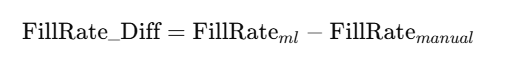

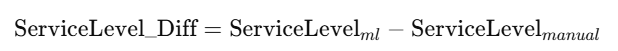

In [ ]:
# Filter PartCodes where service_diff < 0
filtered_parts = partLevel_metrics_meta[partLevel_metrics_meta['service_diff'] == 0][['PartCode', 'CategoryABC']]

# Group by CategoryABC and collect unique PartCodes in each category
unique_parts_by_category = filtered_parts.groupby('CategoryABC')['PartCode'].unique().reset_index()

# If you also want counts
unique_parts_by_category['PartCode_Count'] = unique_parts_by_category['PartCode'].apply(len)

unique_parts_by_category


,CategoryABC,PartCode,PartCode_Count
0,A,"[CONCOM005100, CONCOM006617, CONCOM007665, CON...",19
1,B,"[CONCOM007661, CONCOM007663, CONCOM008849, CON...",26
2,C,"[CONCOM002378, CONCOM004960, CONCOM005208, CON...",121


In [ ]:
partLevel_metrics_meta[(partLevel_metrics_meta['service_diff'] < 0) & (partLevel_metrics_meta['CategoryABC'] == 'A')]['PartCode'].unique()

array([], dtype=object)

Service Level
ML Better
<br>
A ['CONCOM004179', 'CONCOM005096', 'CONCOM005887', 'CONCOM007350',
       'CONCOM007551', 'CONCOM008161', 'CONCOM008162', 'CONCOM009878',
       'CONCOM009883', 'CONRA000463', 'MNTVRV000231']
<br>
B ['CONCOM005098', 'CONCOM005364', 'CONCOM005368', 'CONCOM006356',
       'CONCOM006695', 'CONCOM007031', 'CONCOM007552', 'CONCOM007918',
       'CONCOM008775', 'CONCOM008777', 'CONCOM008964', 'CONCOM009127',
       'CONCOM009710', 'CONCOM010544', 'CONCOM010793', 'CONCOM010801',
       'CONCOM012961', 'CONRA000706']

Manual Better
<br>
B ['CONCOM005366', 'CONCOM005367', 'CONCOM006363', 'CONCOM007662']

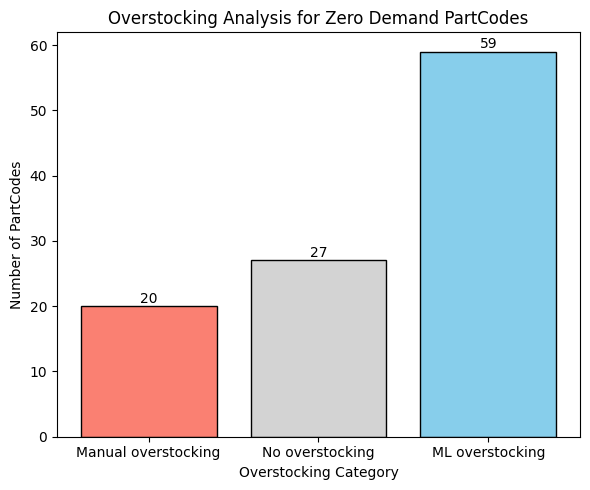

In [ ]:
# Filter for avg_demand = 0
zero_demand_parts = partLevel_metrics[partLevel_metrics['avg_demand'] == 0]

# Categorize running stock diff
def categorize_overstocking(x):
    if x > 0:
        return "ML overstocking"
    elif x < 0:
        return "Manual overstocking"
    else:
        return "No overstocking"

categories = zero_demand_parts['running_stock_diff'].apply(categorize_overstocking)

# Count occurrences
counts = categories.value_counts().reindex(["Manual overstocking", "No overstocking", "ML overstocking"])

# Plot
plt.figure(figsize=(6, 5))
bars = plt.bar(counts.index, counts.values, color=["salmon", "lightgray", "skyblue"], edgecolor="black")

# Add labels on top of bars
for i, v in enumerate(counts.values):
    plt.text(i, v + 0.5, str(v), ha='center', fontsize=10)

plt.title("Overstocking Analysis for Zero Demand PartCodes")
plt.ylabel("Number of PartCodes")
plt.xlabel("Overstocking Category")
plt.tight_layout()
plt.show()


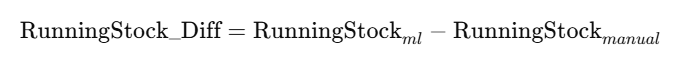

In [ ]:
train_eval_combined_long.columns.tolist()

['PartCode',
 'Description_consumption_train',
 'UOM_consumption_train',
 'Make_consumption_train',
 'CategoryABC_train',
 'MinStock_train',
 'MaxStock_train',
 'SAPQty_consumption_train',
 'CommonMachineName_consumption_train',
 'Line_consumption_train',
 'EachPartPrice_consumption_train',
 'MONTH_train',
 'CONSUMPTION_train',
 'Description_procurement_train',
 'UOM_procurement_train',
 'Make_procurement_train',
 'SAPQty_procurement_train',
 'CommonMachineName_procurement_train',
 'Line_procurement_train',
 'EachPartPrice_procurement_train',
 'PROCUREMENT_train',
 'MONTH_YEAR_train',
 'Cumulative_Consumption_train',
 'Cumulative_Procurement_train',
 'Running_Stock_train',
 'partCategory_train',
 'Lag1_train',
 'Lag2_train',
 'Lag3_train',
 'NonZeroLag1_train',
 'NonZeroLag2_train',
 'MonthsSinceLastDemand_train',
 'RollingMean3_train',
 'RollingStd3_train',
 'RollingMean6_train',
 'RollingStd6_train',
 'RollingNonZeroMean3_train',
 'RollingNonZeroStdDev3_train',
 'RollingCV2_3_train',

In [ ]:
train_eval_combined_long['Breakdown_Time_eval'].isna().sum()

np.int64(0)

Inventory Cost (Manual / ML ) = if Running Stock is positive , Running Stock * Each Part Price * Per Month Holding Cost per Category

Breakdown Time due to Spare Part Unavailability (Manual / ML) = Breakdown Time when Service Level is 0 (only for A and B class spare parts)


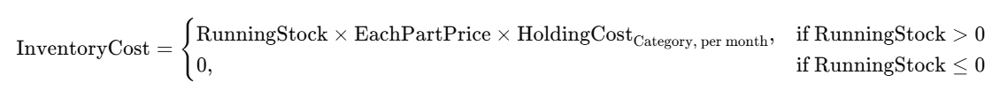

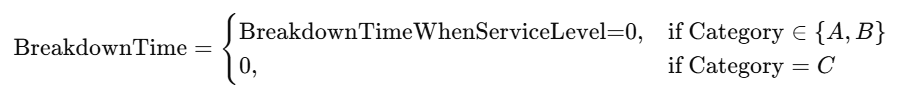

In [ ]:

# Holding cost dictionary
holding_cost_dict = { "A": 40, "B": 30, "C": 15 }

# Map holding cost % to each row based on category
train_eval_combined_long["holding_cost_pct"] = train_eval_combined_long["CategoryABC_eval"].map(holding_cost_dict)

# Inventory cost calculation only if running stock is positive
train_eval_combined_long["InventoryCost_manual"] = np.where(
    train_eval_combined_long["running_stock_manual"] > 0,
    train_eval_combined_long["running_stock_manual"] *
    train_eval_combined_long["EachPartPrice_procurement_eval"] *
    train_eval_combined_long["holding_cost_pct"] / 100 / 12,
    0  # 0 cost if stock is zero or negative
)

train_eval_combined_long["InventoryCost_ml"] = np.where(
    train_eval_combined_long["running_stock_ml"] > 0,
    train_eval_combined_long["running_stock_ml"] *
    train_eval_combined_long["EachPartPrice_procurement_eval"] *
    train_eval_combined_long["holding_cost_pct"] / 100 / 12,
    0
)

# # Breakdown_Time adjustment for service_manual
# train_eval_combined_long["Breakdown_Time_adjusted_manual"] = np.where(
#     train_eval_combined_long["CategoryABC_eval"].isin(["A"]),
#     train_eval_combined_long["Breakdown_Time_eval"] * train_eval_combined_long["service_manual"],
#     np.nan  # NaN for C or others
# )

# # Breakdown_Time adjustment for service_ml
# train_eval_combined_long["Breakdown_Time_adjusted_ml"] = np.where(
#     train_eval_combined_long["CategoryABC_eval"].isin(["A"]),
#     train_eval_combined_long["Breakdown_Time_eval"] * train_eval_combined_long["service_ml"],
#     np.nan  # NaN for C or others
# )

# Breakdown_Time adjustment for service_manual
train_eval_combined_long["Breakdown_Time_adjusted_manual"] = np.where(
    train_eval_combined_long["CategoryABC_eval"].isin(["A","B"]) & (train_eval_combined_long["service_manual"] == 0),
    train_eval_combined_long["Breakdown_Time_eval"],
    0  # No breakdown if service level is 1 or part not in A
)

# Breakdown_Time adjustment for service_ml
train_eval_combined_long["Breakdown_Time_adjusted_ml"] = np.where(
    train_eval_combined_long["CategoryABC_eval"].isin(["A","B"]) & (train_eval_combined_long["service_ml"] == 0),
    train_eval_combined_long["Breakdown_Time_eval"],
    0
)


In [ ]:
train_eval_combined_long["Breakdown_Time_adjusted_ml"].isna().sum()

np.int64(0)

In [ ]:
train_eval_combined_long[train_eval_combined_long['CategoryABC_eval'].isin(["A"])][['PartCode','horizon_month_year','CategoryABC_eval','Breakdown_Time_eval','service_manual','Breakdown_Time_adjusted_manual','service_ml','Breakdown_Time_adjusted_ml']]

,PartCode,horizon_month_year,CategoryABC_eval,Breakdown_Time_eval,service_manual,Breakdown_Time_adjusted_manual,service_ml,Breakdown_Time_adjusted_ml
3,CONCOM004179,2024-01-01,A,65.0,0,0.0,0,0.0
283,CONCOM004179,2024-02-01,A,20.0,1,20.0,1,20.0
563,CONCOM004179,2024-03-01,A,11.0,1,11.0,1,11.0
843,CONCOM004179,2024-04-01,A,95.0,1,95.0,1,95.0
1123,CONCOM004179,2024-05-01,A,108.0,1,108.0,1,108.0
...,...,...,...,...,...,...,...,...
2236,MNTVRV000231,2024-08-01,A,0.0,1,0.0,1,0.0
2516,MNTVRV000231,2024-09-01,A,0.0,1,0.0,1,0.0
2796,MNTVRV000231,2024-10-01,A,0.0,1,0.0,1,0.0
3076,MNTVRV000231,2024-11-01,A,0.0,1,0.0,1,0.0


In [ ]:
PartLevel_Cost_Time_Summary = (
    train_eval_combined_long
    .groupby("PartCode", as_index=False)
    .agg({
        "InventoryCost_manual": "sum",
        "InventoryCost_ml": "sum",
        "Breakdown_Time_adjusted_manual": "sum",
        "Breakdown_Time_adjusted_ml": "sum"
    })
    .rename(columns={
        "InventoryCost_manual": "Total_Holding_Cost_manual",
        "InventoryCost_ml": "Total_Holding_Cost_ml",
        "Breakdown_Time_adjusted_manual": "Total_Breakdown_Time_manual",
        "Breakdown_Time_adjusted_ml": "Total_Breakdown_Time_ml"
    })
)


In [ ]:
PartLevel_Cost_Time_Summary

,PartCode,Total_Holding_Cost_manual,Total_Holding_Cost_ml,Total_Breakdown_Time_manual,Total_Breakdown_Time_ml
0,CONCOM002378,132.057,2.956500,0.0,0.0
1,CONCOM003449,0.000,4.000000,0.0,0.0
2,CONCOM003805,0.000,1.093750,0.0,0.0
3,CONCOM004179,0.000,26784.097333,266.4,65.0
4,CONCOM004400,642.060,0.000000,0.0,0.0
...,...,...,...,...,...
275,MNTVRV000179,7875.000,125.000000,0.0,0.0
276,MNTVRV000231,15990.500,3198.100000,12.0,0.0
277,MNTVRV000246,0.000,0.000000,0.0,0.0
278,MNTVRV000247,0.000,0.000000,0.0,0.0


In [ ]:
partLevel_metrics_meta.shape

(280, 26)

In [ ]:
PartLevel_Metrics_Cost_Time_Summary_Meta = pd.merge(PartLevel_Cost_Time_Summary,partLevel_metrics_meta,
                                            how="left",on = 'PartCode')

In [ ]:
PartLevel_Metrics_Cost_Time_Summary_Meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 280 entries, 0 to 279
Data columns (total 30 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PartCode                       280 non-null    object 
 1   Total_Holding_Cost_manual      280 non-null    float64
 2   Total_Holding_Cost_ml          280 non-null    float64
 3   Total_Breakdown_Time_manual    280 non-null    float64
 4   Total_Breakdown_Time_ml        280 non-null    float64
 5   running_stock_manual           280 non-null    float64
 6   running_stock_ml               280 non-null    float64
 7   fill_rate_manual               280 non-null    float64
 8   fill_rate_ml                   280 non-null    float64
 9   service_manual                 280 non-null    float64
 10  service_ml                     280 non-null    float64
 11  fill_rate_manual_non_zero      174 non-null    float64
 12  fill_rate_ml_non_zero          174 non-null    flo

In [ ]:
Breakdown_MachineWise = (
    PartLevel_Metrics_Cost_Time_Summary_Meta
    .groupby('CommonMachineName_procurement')
    .agg({
        "Total_Breakdown_Time_manual": "max",
        "Total_Breakdown_Time_ml": "max"
    })
    .reset_index()
)


In [ ]:
Breakdown_MachineWise

,CommonMachineName_procurement,Total_Breakdown_Time_manual,Total_Breakdown_Time_ml
0,Air Tight Test,0.0,0.00
1,Auto Brazing,968.6,968.60
2,Booster pump,0.0,3.00
3,Coil Bending Machine,5.0,0.00
4,Conveyor,641.0,0.00
5,Dry Oven,30.0,0.00
6,Fin Die,0.0,0.00
7,Fin Press,736.0,736.00
8,HVIR,59.0,59.00
9,Hair pin Bender Dia-7,472.0,746.00


In [ ]:
train_eval_combined_long.columns.tolist()

['PartCode',
 'Description_consumption_train',
 'UOM_consumption_train',
 'Make_consumption_train',
 'CategoryABC_train',
 'MinStock_train',
 'MaxStock_train',
 'SAPQty_consumption_train',
 'CommonMachineName_consumption_train',
 'Line_consumption_train',
 'EachPartPrice_consumption_train',
 'MONTH_train',
 'CONSUMPTION_train',
 'Description_procurement_train',
 'UOM_procurement_train',
 'Make_procurement_train',
 'SAPQty_procurement_train',
 'CommonMachineName_procurement_train',
 'Line_procurement_train',
 'EachPartPrice_procurement_train',
 'PROCUREMENT_train',
 'MONTH_YEAR_train',
 'Cumulative_Consumption_train',
 'Cumulative_Procurement_train',
 'Running_Stock_train',
 'partCategory_train',
 'Lag1_train',
 'Lag2_train',
 'Lag3_train',
 'NonZeroLag1_train',
 'NonZeroLag2_train',
 'MonthsSinceLastDemand_train',
 'RollingMean3_train',
 'RollingStd3_train',
 'RollingMean6_train',
 'RollingStd6_train',
 'RollingNonZeroMean3_train',
 'RollingNonZeroStdDev3_train',
 'RollingCV2_3_train',

ML Better
<br>
A ['CONCOM004179', 'CONCOM005096', 'CONCOM005887', 'CONCOM007350',
       'CONCOM007551', 'CONCOM008161', 'CONCOM008162', 'CONCOM009878',
       'CONCOM009883', 'CONRA000463', 'MNTVRV000231']
<br>
B ['CONCOM005098', 'CONCOM005364', 'CONCOM005368', 'CONCOM006356',
       'CONCOM006695', 'CONCOM007031', 'CONCOM007552', 'CONCOM007918',
       'CONCOM008775', 'CONCOM008777', 'CONCOM008964', 'CONCOM009127',
       'CONCOM009710', 'CONCOM010544', 'CONCOM010793', 'CONCOM010801',
       'CONCOM012961', 'CONRA000706']

Manual Better
<br>
B ['CONCOM005366', 'CONCOM005367', 'CONCOM006363', 'CONCOM007662']

In [ ]:
selected_cols = ['PartCode','horizon_month_year','CategoryABC_eval','Breakdown_Time_eval','service_manual','Breakdown_Time_adjusted_manual','service_ml','Breakdown_Time_adjusted_ml']
train_eval_combined_long[
    # (train_eval_combined_long['CommonMachineName_procurement_eval']== 'Ultrasonic Tube Sealing M/C') &
     (train_eval_combined_long['CategoryABC_eval'] == 'A') &
     (train_eval_combined_long['PartCode'] == 'CONCOM004179')][selected_cols]

,PartCode,horizon_month_year,CategoryABC_eval,Breakdown_Time_eval,service_manual,Breakdown_Time_adjusted_manual,service_ml,Breakdown_Time_adjusted_ml
3,CONCOM004179,2024-01-01,A,65.00,0,65.00,0,65.0
283,CONCOM004179,2024-02-01,A,20.00,1,0.00,1,0.0
563,CONCOM004179,2024-03-01,A,11.00,1,0.00,1,0.0
843,CONCOM004179,2024-04-01,A,95.00,1,0.00,1,0.0
1123,CONCOM004179,2024-05-01,A,108.00,1,0.00,1,0.0
1403,CONCOM004179,2024-06-01,A,160.00,1,0.00,1,0.0
1683,CONCOM004179,2024-07-01,A,14.00,1,0.00,1,0.0
1963,CONCOM004179,2024-08-01,A,122.45,0,122.45,1,0.0
2243,CONCOM004179,2024-09-01,A,41.00,1,0.00,1,0.0
2523,CONCOM004179,2024-10-01,A,21.00,1,0.00,1,0.0


In [ ]:
PartLevel_Metrics_Cost_Time_Summary_Meta[PartLevel_Metrics_Cost_Time_Summary_Meta['CommonMachineName_procurement'] == 'Ultrasonic Tube Sealing M/C']

,PartCode,Total_Holding_Cost_manual,Total_Holding_Cost_ml,Total_Breakdown_Time_manual,Total_Breakdown_Time_ml,running_stock_manual,running_stock_ml,fill_rate_manual,fill_rate_ml,service_manual,...,fill_rate_non_zero_diff,service_non_zero_diff,CategoryABC,Description_consumption,MinStock,MaxStock,Make_procurement,CommonMachineName_procurement,Line_procurement,EachPartPrice_procurement
9,CONCOM004960,6.937500,0.000000,0.0,0.0,1.250000,0.000000,1.000000,1.000000,1.000000,...,NaN,NaN,C,Ultrasonic welding m/c on/off switch,2,4,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,37.00
10,CONCOM005096,1461.833333,298.333333,67.0,67.0,4.000000,0.833333,0.916667,1.000000,0.916667,...,0.500000,0.500000,A,Height sensor 02350531-000 (Ultrasonic),3,8,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,895.00
11,CONCOM005098,0.000000,10.375000,55.0,0.0,-1.250000,0.083333,0.833333,1.000000,0.833333,...,1.000000,1.000000,B,Fork Support (Ultrasonic),1,2,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,415.00
12,CONCOM005100,4420.000000,0.000000,67.0,67.0,5.666667,0.000000,1.000000,1.000000,1.000000,...,NaN,NaN,A,Control Board (Ultrasonic),1,2,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,1950.00
13,CONCOM005140,1.500000,0.500000,0.0,0.0,-0.750000,0.083333,0.916667,1.000000,0.916667,...,0.500000,0.500000,C,Stoper Ultrasonic machine,1,2,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,40.00
14,CONCOM005141,0.000000,1.325000,0.0,0.0,-1.750000,0.083333,0.833333,1.000000,0.833333,...,1.000000,1.000000,C,Fork Bearing Ultrasonic machine,2,4,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,106.00
22,CONCOM005887,0.000000,24.166667,67.0,67.0,-1.833333,0.083333,0.833333,1.000000,0.833333,...,1.000000,1.000000,A,Frok cylinder 233-501-313 (Ultrasonic),2,4,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,725.00
23,CONCOM005888,26.550000,0.000000,0.0,0.0,3.000000,0.000000,1.000000,1.000000,1.000000,...,NaN,NaN,C,Needle TAF-8-15-12 (Ultrasonic),2,4,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,59.00
24,CONCOM005891,0.000000,0.212500,0.0,0.0,0.000000,0.083333,1.000000,1.000000,1.000000,...,NaN,NaN,C,Fork Pin O8x60 (Ultrasonic),1,2,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,17.00
25,CONCOM005892,41.850000,1.162500,0.0,0.0,3.000000,0.083333,1.000000,1.000000,1.000000,...,NaN,NaN,C,Pin bush 237-502-124 (Ultrasonic),2,4,Tech-Sonic,Ultrasonic Tube Sealing M/C,R4,93.00


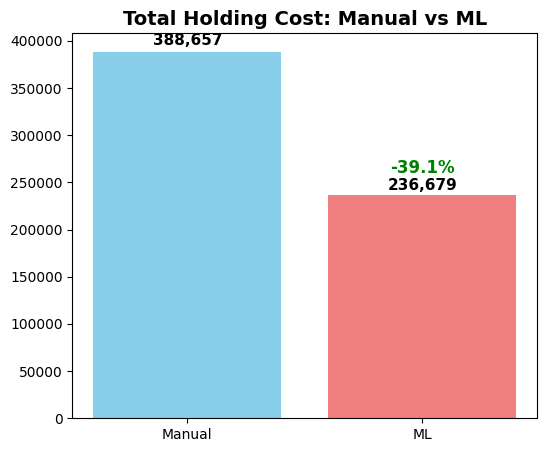

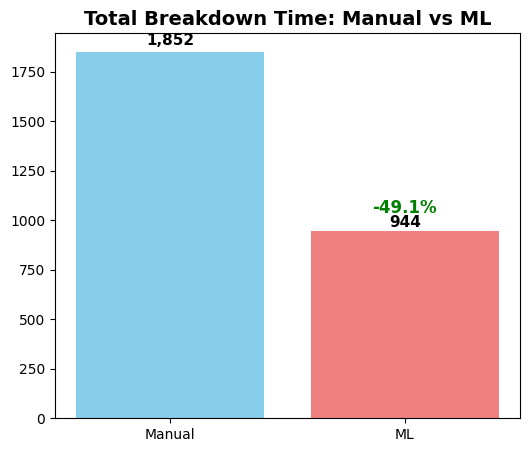

In [ ]:

def plot_with_labels(metric_name, manual_value, ml_value):
    fig, ax = plt.subplots(figsize=(6, 5))

    values = [manual_value, ml_value]
    labels = ["Manual", "ML"]
    bars = ax.bar(labels, values, color=["skyblue", "lightcoral"])

    # Add data labels
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + (0.01 * height),
            f"{height:,.0f}",
            ha="center",
            va="bottom",
            fontsize=11,
            fontweight="bold"
        )

    # Compute % change for ML
    pct_change = ((ml_value - manual_value) / manual_value) * 100
    color = "green" if pct_change < 0 else "red"

    # Add % label above ML bar
    ax.text(
        bars[1].get_x() + bars[1].get_width() / 2,
        bars[1].get_height() + (0.08 * bars[1].get_height()),  # higher than value label
        f"{pct_change:+.1f}%",
        ha="center",
        va="bottom",
        fontsize=12,
        color=color,
        fontweight="bold"
    )

    ax.set_title(f"{metric_name}: Manual vs ML", fontsize=14, fontweight="bold")
    plt.show()


plot_with_labels("Total Holding Cost",
                 PartLevel_Cost_Time_Summary["Total_Holding_Cost_manual"].sum(),
                 PartLevel_Cost_Time_Summary["Total_Holding_Cost_ml"].sum())

plot_with_labels("Total Breakdown Time",
                 Breakdown_MachineWise["Total_Breakdown_Time_manual"].sum(),
                 Breakdown_MachineWise["Total_Breakdown_Time_ml"].sum())
